In [300]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import xgboost as xgb
import catboost as cat
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold, train_test_split
from keras.models import Sequential
from keras.callbacks import EarlyStopping
from keras.layers.core import Dense, Activation, Dropout
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
import gc
pd.options.display.max_columns = 1000
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings("ignore")

## FD001

In [2]:
train = pd.read_csv('train_FD001.txt', parse_dates=False, delimiter=" ", decimal=".", header=None)
test = pd.read_csv('test_FD001.txt', parse_dates=False, delimiter=" ", decimal=".", header=None)
RUL = pd.read_csv('RUL_FD001.txt', parse_dates=False, decimal=".", header=None)

train.drop(train.columns[[-1,-2]], axis=1, inplace=True)
test.drop(test.columns[[-1,-2]], axis=1, inplace=True)

cols = ['unit', 'cycles', 'op_setting1', 'op_setting2', 'op_setting3', 's1', 's2', 's3', 's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14', 's15', 's16', 's17', 's18', 's19', 's20', 's21']
train.columns = cols
test.columns = cols
train.shape, test.shape, RUL.shape

((20631, 26), (13096, 26), (100, 1))

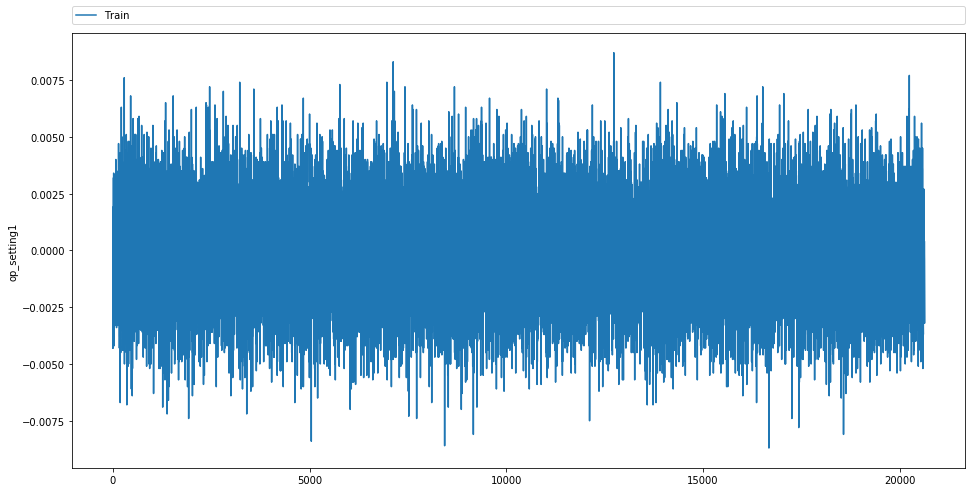

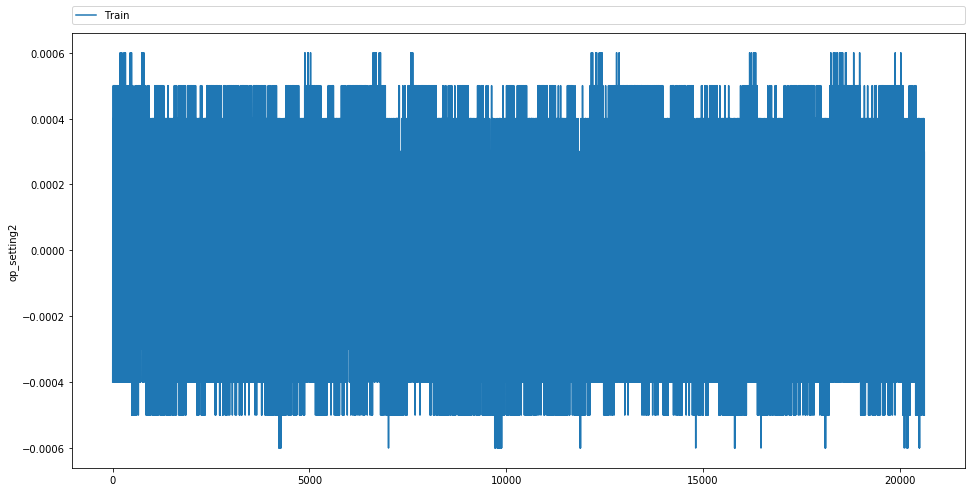

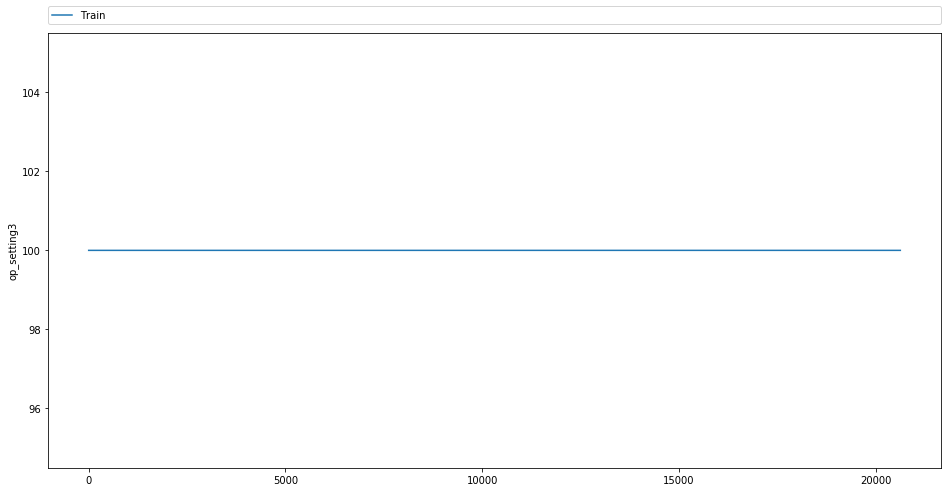

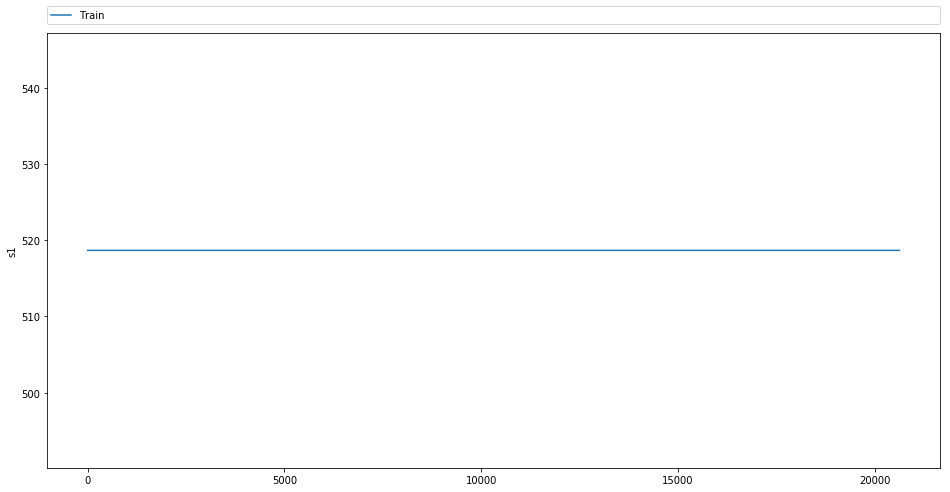

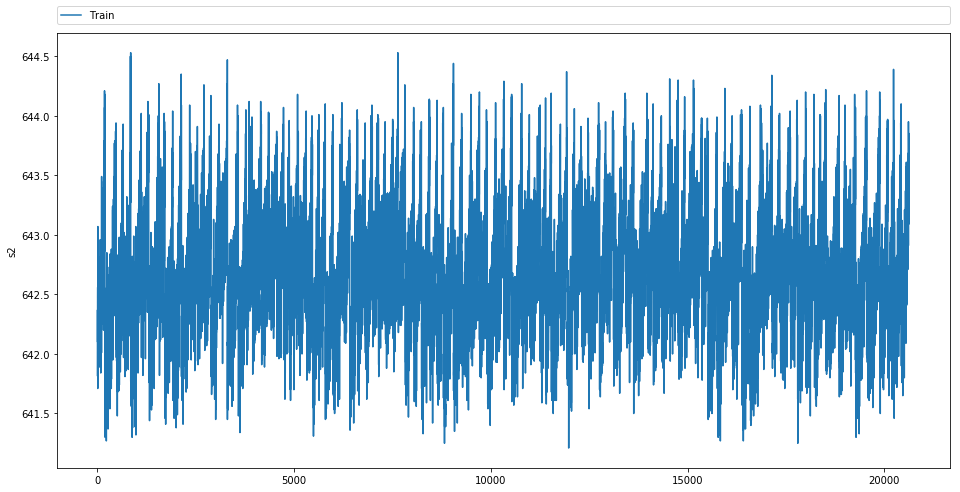

...

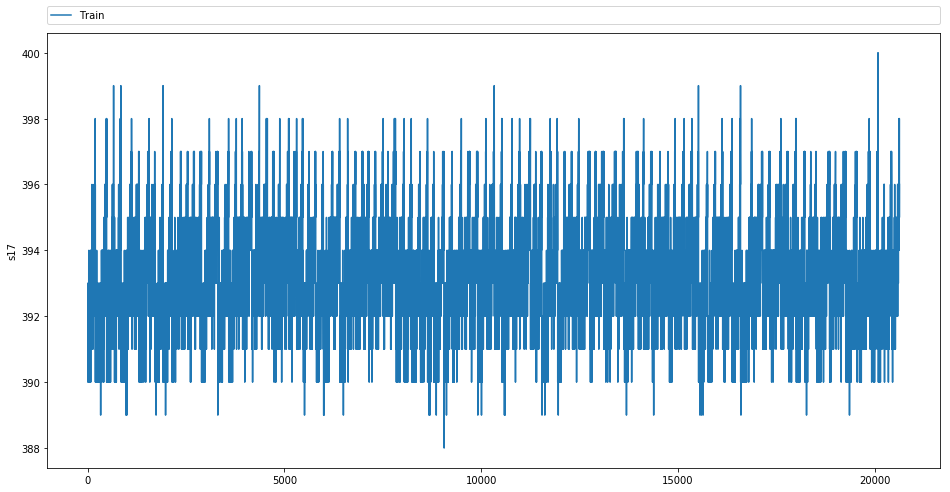

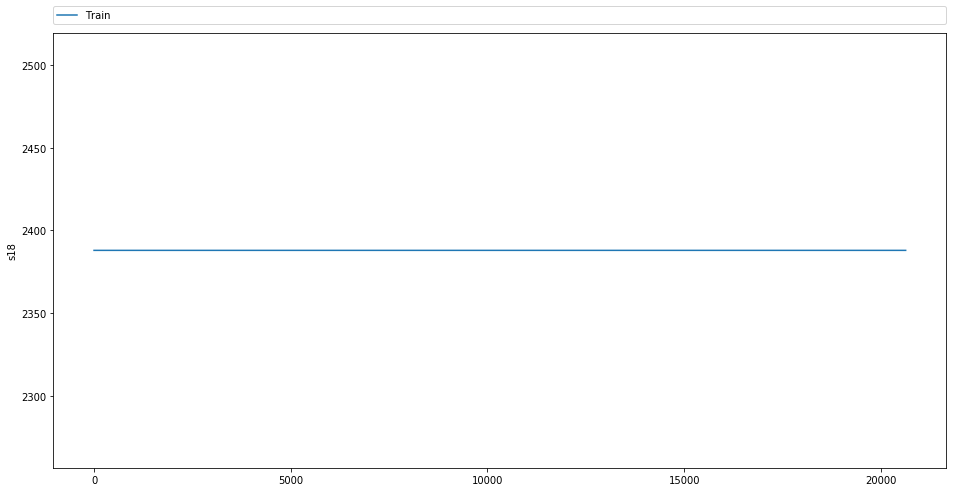

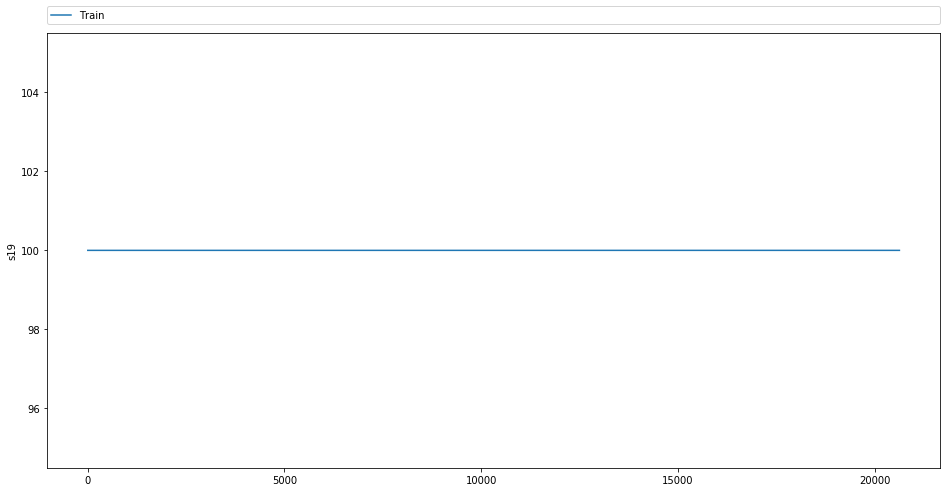

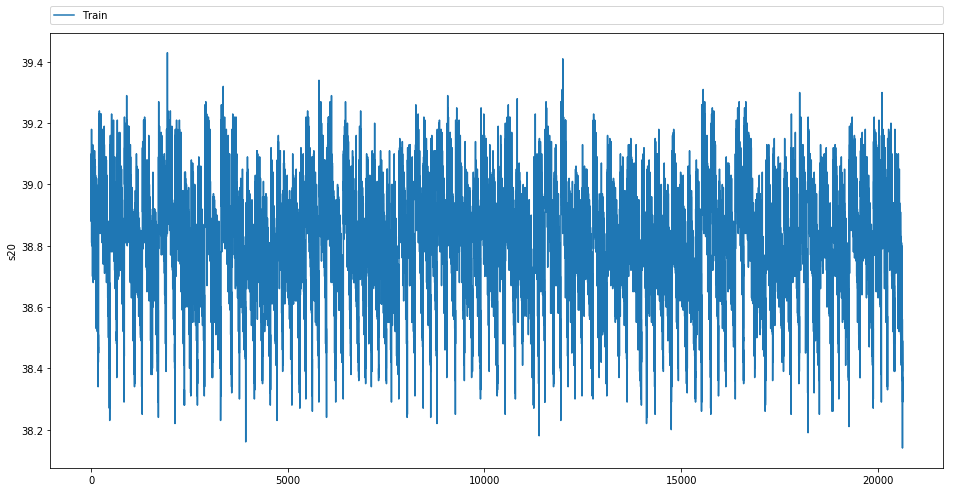

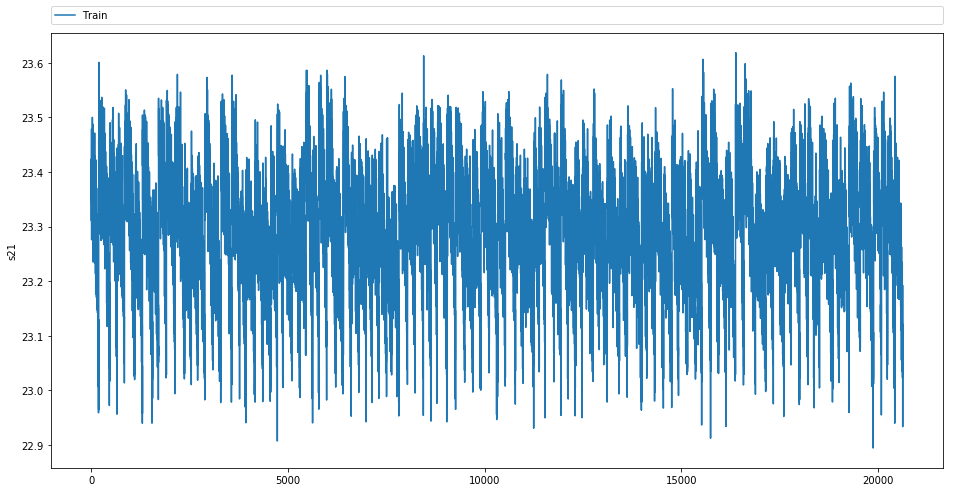

In [3]:
for feature in train.drop(columns = ["unit", "cycles"]).columns:
    fig = plt.figure(figsize = (16, 8))
    plt.plot(train[feature])
    plt.legend(['Train'], bbox_to_anchor=(0., 1.02, 1., .102), loc=3, mode="expand", borderaxespad=0)
    plt.ylabel(feature)
    plt.show()

In [4]:
def feature_prepare_by_diff(data, featureString, windowSize):
    tempList = []
    for measureNumber in data[featureString].unique():
        aa = data[data[featureString] == measureNumber].groupby(data[data[featureString] == measureNumber].index // 
                                                           windowSize).sum() / windowSize
        aa = aa.diff().mean().values
        tempList.append(aa)
    temp = pd.DataFrame(tempList)
    string = "_mean_diff_of_{}_cycle".format(windowSize)
    my_new_list = [x + string for x in list(data.columns)]
    temp.columns = my_new_list
    return temp

In [5]:
def feature_prepare_by_mean(data, featureString):
    tempList = []
    for measureNumber in data[featureString].unique():
        aa = data[data[featureString] == measureNumber].mean()
        tempList.append(aa)
    temp = pd.DataFrame(tempList)
    string = "_mean_of_feature"
    my_new_list = [x + string for x in list(data.columns)]
    temp.columns = my_new_list
    return temp

In [6]:
def feature_prepare_by_std(data, featureString):
    tempList = []
    for measureNumber in data[featureString].unique():
        aa = data[data[featureString] == measureNumber].std()
        tempList.append(aa)
    temp = pd.DataFrame(tempList)
    string = "_std_of_feature"
    my_new_list = [x + string for x in list(data.columns)]
    temp.columns = my_new_list
    return temp

In [7]:
def feature_prepare_by_median(data, featureString):
    tempList = []
    for measureNumber in data[featureString].unique():
        aa = data[data[featureString] == measureNumber].median()
        tempList.append(aa)
    temp = pd.DataFrame(tempList)
    string = "_median_of_feature"
    my_new_list = [x + string for x in list(data.columns)]
    temp.columns = my_new_list
    return temp

In [8]:
def feature_prepare_by_slope(data, featureString, windowSize, slopeParam):
    tempList = []
    for measureNumber in data[featureString].unique():
        aa = data[data[featureString] == measureNumber].groupby(data[data[featureString] == measureNumber].index // 
                                                           windowSize).sum() / windowSize
        aa = aa[aa[featureString]==measureNumber].apply(lambda x: np.polyfit(aa[aa[featureString]==measureNumber].
                                                                             index, x, 1)[slopeParam])
        tempList.append(aa.values)
    temp = pd.DataFrame(tempList)
    string = "_slope_of_{}_cycle_{}".format(windowSize, slopeParam)
    my_new_list = [x + string for x in list(data.columns)]
    temp.columns = my_new_list
    return temp

In [9]:
cyc1 = feature_prepare_by_diff(train, "unit", 1)
cyc2 = feature_prepare_by_diff(train, "unit", 2)
cyc3 = feature_prepare_by_diff(train, "unit", 3)
cyc4 = feature_prepare_by_diff(train, "unit", 4)
cyc5 = feature_prepare_by_diff(train, "unit", 5)
cyc6 = feature_prepare_by_diff(train, "unit", 6)
cyc7 = feature_prepare_by_diff(train, "unit", 7)
cyc8 = feature_prepare_by_diff(train, "unit", 8)
cyc9 = feature_prepare_by_diff(train, "unit", 9)
cyc10 = feature_prepare_by_diff(train, "unit", 10)

train_diff = pd.concat([cyc1, cyc2, cyc3, cyc4, cyc5, cyc6, cyc7, cyc8, cyc9, cyc10], axis = 1)
train_diff.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [10]:
cyc1 = feature_prepare_by_diff(test, "unit", 1)
cyc2 = feature_prepare_by_diff(test, "unit", 2)
cyc3 = feature_prepare_by_diff(test, "unit", 3)
cyc4 = feature_prepare_by_diff(test, "unit", 4)
cyc5 = feature_prepare_by_diff(test, "unit", 5)
cyc6 = feature_prepare_by_diff(test, "unit", 6)
cyc7 = feature_prepare_by_diff(test, "unit", 7)
cyc8 = feature_prepare_by_diff(test, "unit", 8)
cyc9 = feature_prepare_by_diff(test, "unit", 9)
cyc10 = feature_prepare_by_diff(test, "unit", 10)

test_diff = pd.concat([cyc1, cyc2, cyc3, cyc4, cyc5, cyc6, cyc7, cyc8, cyc9, cyc10], axis = 1)
test_diff.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [11]:
train_mean = feature_prepare_by_mean(train, "unit")
train_mean.head()

,unit_mean_of_feature,cycles_mean_of_feature,op_setting1_mean_of_feature,op_setting2_mean_of_feature,op_setting3_mean_of_feature,s1_mean_of_feature,s2_mean_of_feature,s3_mean_of_feature,s4_mean_of_feature,s5_mean_of_feature,s6_mean_of_feature,s7_mean_of_feature,s8_mean_of_feature,s9_mean_of_feature,s10_mean_of_feature,s11_mean_of_feature,s12_mean_of_feature,s13_mean_of_feature,s14_mean_of_feature,s15_mean_of_feature,s16_mean_of_feature,s17_mean_of_feature,s18_mean_of_feature,s19_mean_of_feature,s20_mean_of_feature,s21_mean_of_feature
0,1.0,96.5,-0.000189,0.000048,100.0,518.67,642.621042,1589.485521,1407.262135,14.62,21.610000,553.439427,2388.110260,9048.265833,1.3,47.514063,521.459427,2388.110833,8128.913542,8.436555,0.03,392.854167,2388.0,100.0,38.840052,23.306310
1,2.0,144.0,0.000051,0.000088,100.0,518.67,642.435226,1588.181986,1404.265854,14.62,21.609338,553.853484,2388.057213,9062.652439,1.3,47.389512,521.811603,2388.053554,8143.246167,8.423983,0.03,392.386760,2388.0,100.0,38.901150,23.338997
2,3.0,90.0,0.000137,-0.000014,100.0,518.67,642.543743,1588.715084,1405.628994,14.62,21.609777,553.800056,2388.049777,9081.265866,1.3,47.427039,521.773966,2388.047430,8159.557654,8.430236,0.03,392.754190,2388.0,100.0,38.882793,23.321931
3,4.0,95.0,0.000150,0.000067,100.0,518.67,642.662381,1590.563280,1408.253915,14.62,21.609947,553.443016,2388.079101,9077.366825,1.3,47.515132,521.501005,2388.082275,8154.574444,8.439303,0.03,393.291005,2388.0,100.0,38.830265,23.294502
4,5.0,135.0,0.000136,-0.000061,100.0,518.67,642.451970,1588.153271,1404.878439,14.62,21.609331,553.882342,2388.034201,9083.948253,1.3,47.402268,521.866431,2388.029071,8161.807844,8.425968,0.03,392.646840,2388.0,100.0,38.891078,23.336284


In [12]:
test_mean = feature_prepare_by_mean(test, "unit")
test_mean.head()

,unit_mean_of_feature,cycles_mean_of_feature,op_setting1_mean_of_feature,op_setting2_mean_of_feature,op_setting3_mean_of_feature,s1_mean_of_feature,s2_mean_of_feature,s3_mean_of_feature,s4_mean_of_feature,s5_mean_of_feature,s6_mean_of_feature,s7_mean_of_feature,s8_mean_of_feature,s9_mean_of_feature,s10_mean_of_feature,s11_mean_of_feature,s12_mean_of_feature,s13_mean_of_feature,s14_mean_of_feature,s15_mean_of_feature,s16_mean_of_feature,s17_mean_of_feature,s18_mean_of_feature,s19_mean_of_feature,s20_mean_of_feature,s21_mean_of_feature
0,1.0,16.0,0.000645,0.000035,100.0,518.67,642.319032,1585.647742,1401.526129,14.62,21.61,554.144839,2388.047419,9049.054516,1.3,47.308710,521.973226,2388.056774,8131.004194,8.415994,0.03,391.741935,2388.0,100.0,38.978065,23.379097
1,2.0,25.0,-0.000016,0.000041,100.0,518.67,642.605510,1589.181429,1406.247347,14.62,21.61,553.583673,2388.111633,9047.997347,1.3,47.479184,521.540612,2388.106327,8128.561837,8.436027,0.03,392.734694,2388.0,100.0,38.855918,23.313918
2,3.0,63.5,0.000176,-0.000061,100.0,518.67,642.693810,1590.588095,1408.890317,14.62,21.61,553.251587,2388.126111,9052.272619,1.3,47.571825,521.290556,2388.122540,8130.903095,8.445067,0.03,393.333333,2388.0,100.0,38.821111,23.280522
3,4.0,53.5,-0.000184,0.000024,100.0,518.67,642.577170,1589.685094,1407.916132,14.62,21.61,553.480849,2388.101321,9052.378396,1.3,47.512358,521.512453,2388.105472,8133.110943,8.436429,0.03,392.801887,2388.0,100.0,38.843396,23.297936
4,5.0,49.5,0.000336,-0.000069,100.0,518.67,642.639694,1589.443673,1407.793469,14.62,21.61,553.463980,2388.105510,9052.542653,1.3,47.509082,521.516327,2388.103469,8132.136327,8.435858,0.03,392.938776,2388.0,100.0,38.837959,23.295200


In [13]:
train_std = feature_prepare_by_std(train, "unit")
train_std.head()

,unit_std_of_feature,cycles_std_of_feature,op_setting1_std_of_feature,op_setting2_std_of_feature,op_setting3_std_of_feature,s1_std_of_feature,s2_std_of_feature,s3_std_of_feature,s4_std_of_feature,s5_std_of_feature,s6_std_of_feature,s7_std_of_feature,s8_std_of_feature,s9_std_of_feature,s10_std_of_feature,s11_std_of_feature,s12_std_of_feature,s13_std_of_feature,s14_std_of_feature,s15_std_of_feature,s16_std_of_feature,s17_std_of_feature,s18_std_of_feature,s19_std_of_feature,s20_std_of_feature,s21_std_of_feature
0,0.0,55.569776,0.001953,0.000282,0.0,1.367809e-12,0.486795,5.759776,8.565610,6.589703e-14,3.918202e-14,0.910414,0.070914,4.911853,4.452502e-15,0.268346,0.749176,0.076960,5.563129,0.034125,1.739259e-17,1.475661,0.0,0.0,0.166998,0.105101
1,0.0,82.993976,0.002320,0.000298,0.0,2.277708e-13,0.560214,6.596730,9.737248,8.007568e-14,2.490693e-03,0.940728,0.063001,12.491827,6.672974e-15,0.293672,0.799368,0.063861,8.683012,0.041128,3.127956e-17,1.647280,0.0,0.0,0.199332,0.114796
2,0.0,51.816986,0.002145,0.000290,0.0,1.368069e-12,0.474190,6.386222,8.610126,6.234689e-14,1.482219e-03,0.733983,0.039957,35.196825,4.008014e-15,0.242410,0.594788,0.041219,29.439715,0.036620,0.000000e+00,1.570773,0.0,0.0,0.166112,0.104734
3,0.0,54.703748,0.002033,0.000286,0.0,1.367866e-12,0.441446,6.109152,7.737463,6.589977e-14,7.273930e-04,0.708327,0.032530,36.571690,4.452687e-15,0.222724,0.530158,0.034819,30.691780,0.031947,1.391465e-17,1.602848,0.0,0.0,0.159302,0.093804
4,0.0,77.797815,0.002119,0.000279,0.0,5.694937e-13,0.551542,7.060648,9.782341,7.830539e-14,2.503396e-03,0.895734,0.055522,21.404031,6.451296e-15,0.285740,0.753298,0.056445,16.480153,0.038658,7.647010e-17,1.740057,0.0,0.0,0.187133,0.112705


In [14]:
test_std = feature_prepare_by_std(test, "unit")
test_std.head()

,unit_std_of_feature,cycles_std_of_feature,op_setting1_std_of_feature,op_setting2_std_of_feature,op_setting3_std_of_feature,s1_std_of_feature,s2_std_of_feature,s3_std_of_feature,s4_std_of_feature,s5_std_of_feature,s6_std_of_feature,s7_std_of_feature,s8_std_of_feature,s9_std_of_feature,s10_std_of_feature,s11_std_of_feature,s12_std_of_feature,s13_std_of_feature,s14_std_of_feature,s15_std_of_feature,s16_std_of_feature,s17_std_of_feature,s18_std_of_feature,s19_std_of_feature,s20_std_of_feature,s21_std_of_feature
0,0.0,9.092121,0.002380,0.000260,0.0,0.000000e+00,0.299414,3.682274,3.892065,3.611440e-15,1.083432e-14,0.424726,0.030656,4.351036,4.514300e-16,0.102656,0.251242,0.028094,3.235834,0.020605,2.116078e-17,0.893224,0.0,0.0,0.098333,0.034857
1,0.0,14.288690,0.001986,0.000260,0.0,5.743249e-13,0.262012,4.697556,3.677180,3.589530e-15,7.179061e-15,0.369953,0.032233,4.107946,1.346074e-15,0.094115,0.331627,0.027439,3.261683,0.024568,2.453781e-17,0.860608,0.0,0.0,0.096110,0.063168
2,0.0,36.517119,0.002413,0.000282,0.0,1.255547e-12,0.309588,3.771519,4.637225,4.458620e-14,3.566896e-15,0.435126,0.033154,4.307837,8.917241e-16,0.107944,0.350607,0.033273,3.286995,0.021947,7.663254e-17,0.987927,0.0,0.0,0.107064,0.063094
3,0.0,30.743563,0.002160,0.000307,0.0,1.142269e-12,0.340601,3.998152,4.570139,3.391112e-14,2.498714e-14,0.426905,0.035991,4.228069,1.115497e-15,0.114954,0.310670,0.026731,2.791401,0.018525,5.577486e-17,0.970221,0.0,0.0,0.103775,0.059031
4,0.0,28.434134,0.002272,0.000272,0.0,1.142713e-12,0.322980,4.165324,3.989047,2.678235e-14,3.928078e-14,0.404421,0.032240,3.590953,2.008676e-15,0.111495,0.307539,0.034763,3.127286,0.021311,4.533470e-17,0.883016,0.0,0.0,0.093841,0.060642


In [15]:
train_median = feature_prepare_by_median(train, "unit")
train_median.head()

,unit_median_of_feature,cycles_median_of_feature,op_setting1_median_of_feature,op_setting2_median_of_feature,op_setting3_median_of_feature,s1_median_of_feature,s2_median_of_feature,s3_median_of_feature,s4_median_of_feature,s5_median_of_feature,s6_median_of_feature,s7_median_of_feature,s8_median_of_feature,s9_median_of_feature,s10_median_of_feature,s11_median_of_feature,s12_median_of_feature,s13_median_of_feature,s14_median_of_feature,s15_median_of_feature,s16_median_of_feature,s17_median_of_feature,s18_median_of_feature,s19_median_of_feature,s20_median_of_feature,s21_median_of_feature
0,1.0,96.5,0.0000,0.0001,100.0,518.67,642.54,1589.615,1404.48,14.62,21.61,553.695,2388.095,9048.48,1.3,47.45,521.60,2388.09,8129.97,8.43115,0.03,393.0,2388.0,100.0,38.865,23.3187
1,2.0,144.0,0.0000,0.0001,100.0,518.67,642.36,1587.040,1402.11,14.62,21.61,554.100,2388.040,9058.30,1.3,47.30,522.04,2388.05,8140.61,8.41310,0.03,392.0,2388.0,100.0,38.930,23.3592
2,3.0,90.0,0.0001,-0.0000,100.0,518.67,642.50,1587.510,1403.93,14.62,21.61,553.850,2388.050,9067.14,1.3,47.37,521.88,2388.05,8146.34,8.42270,0.03,393.0,2388.0,100.0,38.900,23.3407
3,4.0,95.0,0.0001,0.0001,100.0,518.67,642.62,1589.480,1406.69,14.62,21.61,553.580,2388.080,9061.64,1.3,47.46,521.65,2388.08,8140.73,8.43280,0.03,393.0,2388.0,100.0,38.860,23.3104
4,5.0,135.0,0.0002,-0.0001,100.0,518.67,642.36,1586.870,1402.35,14.62,21.61,554.140,2388.020,9076.16,1.3,47.33,522.03,2388.02,8155.12,8.41620,0.03,392.0,2388.0,100.0,38.930,23.3599


In [16]:
test_median = feature_prepare_by_median(test, "unit")
test_median.head()

,unit_median_of_feature,cycles_median_of_feature,op_setting1_median_of_feature,op_setting2_median_of_feature,op_setting3_median_of_feature,s1_median_of_feature,s2_median_of_feature,s3_median_of_feature,s4_median_of_feature,s5_median_of_feature,s6_median_of_feature,s7_median_of_feature,s8_median_of_feature,s9_median_of_feature,s10_median_of_feature,s11_median_of_feature,s12_median_of_feature,s13_median_of_feature,s14_median_of_feature,s15_median_of_feature,s16_median_of_feature,s17_median_of_feature,s18_median_of_feature,s19_median_of_feature,s20_median_of_feature,s21_median_of_feature
0,1.0,16.0,0.00110,0.00010,100.0,518.67,642.320,1585.290,1400.970,14.62,21.61,554.150,2388.05,9048.55,1.3,47.31,522.010,2388.06,8130.70,8.41160,0.03,392.0,2388.0,100.0,39.00,23.37700
1,2.0,25.0,0.00020,0.00000,100.0,518.67,642.580,1589.300,1405.790,14.62,21.61,553.610,2388.11,9048.31,1.3,47.47,521.520,2388.11,8128.22,8.43460,0.03,393.0,2388.0,100.0,38.84,23.30650
2,3.0,63.5,0.00035,-0.00005,100.0,518.67,642.660,1589.925,1408.770,14.62,21.61,553.225,2388.13,9052.20,1.3,47.58,521.315,2388.12,8131.26,8.44420,0.03,393.0,2388.0,100.0,38.83,23.28705
3,4.0,53.5,-0.00005,0.00000,100.0,518.67,642.560,1589.630,1408.175,14.62,21.61,553.490,2388.10,9051.73,1.3,47.53,521.490,2388.10,8133.24,8.43470,0.03,393.0,2388.0,100.0,38.85,23.29465
4,5.0,49.5,0.00015,-0.00010,100.0,518.67,642.665,1589.605,1407.755,14.62,21.61,553.430,2388.11,9052.91,1.3,47.51,521.495,2388.11,8131.88,8.43615,0.03,393.0,2388.0,100.0,38.84,23.29635


In [17]:
slp1 = feature_prepare_by_slope(train, "unit", 1, 0)
slp2 = feature_prepare_by_slope(train, "unit", 2, 0)
slp3 = feature_prepare_by_slope(train, "unit", 3, 0)
slp4 = feature_prepare_by_slope(train, "unit", 4, 0)
slp5 = feature_prepare_by_slope(train, "unit", 5, 0)
slp6 = feature_prepare_by_slope(train, "unit", 6, 0)
slp7 = feature_prepare_by_slope(train, "unit", 7, 0)
slp8 = feature_prepare_by_slope(train, "unit", 8, 0)
slp9 = feature_prepare_by_slope(train, "unit", 9, 0)
slp10 = feature_prepare_by_slope(train, "unit", 10, 0)

train_slope_0 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
train_slope_0.head()

,unit_slope_of_1_cycle_0,cycles_slope_of_1_cycle_0,op_setting1_slope_of_1_cycle_0,op_setting2_slope_of_1_cycle_0,op_setting3_slope_of_1_cycle_0,s1_slope_of_1_cycle_0,s2_slope_of_1_cycle_0,s3_slope_of_1_cycle_0,s4_slope_of_1_cycle_0,s5_slope_of_1_cycle_0,s6_slope_of_1_cycle_0,s7_slope_of_1_cycle_0,s8_slope_of_1_cycle_0,s9_slope_of_1_cycle_0,s10_slope_of_1_cycle_0,s11_slope_of_1_cycle_0,s12_slope_of_1_cycle_0,s13_slope_of_1_cycle_0,s14_slope_of_1_cycle_0,s15_slope_of_1_cycle_0,s16_slope_of_1_cycle_0,s17_slope_of_1_cycle_0,s18_slope_of_1_cycle_0,s19_slope_of_1_cycle_0,s20_slope_of_1_cycle_0,s21_slope_of_1_cycle_0,unit_slope_of_2_cycle_0,cycles_slope_of_2_cycle_0,op_setting1_slope_of_2_cycle_0,op_setting2_slope_of_2_cycle_0,op_setting3_slope_of_2_cycle_0,s1_slope_of_2_cycle_0,s2_slope_of_2_cycle_0,s3_slope_of_2_cycle_0,s4_slope_of_2_cycle_0,s5_slope_of_2_cycle_0,s6_slope_of_2_cycle_0,s7_slope_of_2_cycle_0,s8_slope_of_2_cycle_0,s9_slope_of_2_cycle_0,s10_slope_of_2_cycle_0,s11_slope_of_2_cycle_0,s12_slope_of_2_cycle_0,s13_slope_of_2_cycle_0,s14_slope_of_2_cycle_0,s15_slope_of_2_cycle_0,s16_slope_of_2_cycle_0,s17_slope_of_2_cycle_0,s18_slope_of_2_cycle_0,s19_slope_of_2_cycle_0,s20_slope_of_2_cycle_0,s21_slope_of_2_cycle_0,unit_slope_of_3_cycle_0,cycles_slope_of_3_cycle_0,op_setting1_slope_of_3_cycle_0,op_setting2_slope_of_3_cycle_0,op_setting3_slope_of_3_cycle_0,s1_slope_of_3_cycle_0,s2_slope_of_3_cycle_0,s3_slope_of_3_cycle_0,s4_slope_of_3_cycle_0,s5_slope_of_3_cycle_0,s6_slope_of_3_cycle_0,s7_slope_of_3_cycle_0,s8_slope_of_3_cycle_0,s9_slope_of_3_cycle_0,s10_slope_of_3_cycle_0,s11_slope_of_3_cycle_0,s12_slope_of_3_cycle_0,s13_slope_of_3_cycle_0,s14_slope_of_3_cycle_0,s15_slope_of_3_cycle_0,s16_slope_of_3_cycle_0,s17_slope_of_3_cycle_0,s18_slope_of_3_cycle_0,s19_slope_of_3_cycle_0,s20_slope_of_3_cycle_0,s21_slope_of_3_cycle_0,unit_slope_of_4_cycle_0,cycles_slope_of_4_cycle_0,op_setting1_slope_of_4_cycle_0,op_setting2_slope_of_4_cycle_0,op_setting3_slope_of_4_cycle_0,s1_slope_of_4_cycle_0,s2_slope_of_4_cycle_0,s3_slope_of_4_cycle_0,s4_slope_of_4_cycle_0,s5_slope_of_4_cycle_0,s6_slope_of_4_cycle_0,s7_slope_of_4_cycle_0,s8_slope_of_4_cycle_0,s9_slope_of_4_cycle_0,s10_slope_of_4_cycle_0,s11_slope_of_4_cycle_0,s12_slope_of_4_cycle_0,s13_slope_of_4_cycle_0,s14_slope_of_4_cycle_0,s15_slope_of_4_cycle_0,s16_slope_of_4_cycle_0,s17_slope_of_4_cycle_0,s18_slope_of_4_cycle_0,s19_slope_of_4_cycle_0,s20_slope_of_4_cycle_0,s21_slope_of_4_cycle_0,unit_slope_of_5_cycle_0,cycles_slope_of_5_cycle_0,op_setting1_slope_of_5_cycle_0,op_setting2_slope_of_5_cycle_0,op_setting3_slope_of_5_cycle_0,s1_slope_of_5_cycle_0,s2_slope_of_5_cycle_0,s3_slope_of_5_cycle_0,s4_slope_of_5_cycle_0,s5_slope_of_5_cycle_0,s6_slope_of_5_cycle_0,s7_slope_of_5_cycle_0,s8_slope_of_5_cycle_0,s9_slope_of_5_cycle_0,s10_slope_of_5_cycle_0,s11_slope_of_5_cycle_0,s12_slope_of_5_cycle_0,s13_slope_of_5_cycle_0,s14_slope_of_5_cycle_0,s15_slope_of_5_cycle_0,s16_slope_of_5_cycle_0,s17_slope_of_5_cycle_0,s18_slope_of_5_cycle_0,s19_slope_of_5_cycle_0,s20_slope_of_5_cycle_0,s21_slope_of_5_cycle_0,unit_slope_of_6_cycle_0,cycles_slope_of_6_cycle_0,op_setting1_slope_of_6_cycle_0,op_setting2_slope_of_6_cycle_0,op_setting3_slope_of_6_cycle_0,s1_slope_of_6_cycle_0,s2_slope_of_6_cycle_0,s3_slope_of_6_cycle_0,s4_slope_of_6_cycle_0,s5_slope_of_6_cycle_0,s6_slope_of_6_cycle_0,s7_slope_of_6_cycle_0,s8_slope_of_6_cycle_0,s9_slope_of_6_cycle_0,s10_slope_of_6_cycle_0,s11_slope_of_6_cycle_0,s12_slope_of_6_cycle_0,s13_slope_of_6_cycle_0,s14_slope_of_6_cycle_0,s15_slope_of_6_cycle_0,s16_slope_of_6_cycle_0,s17_slope_of_6_cycle_0,s18_slope_of_6_cycle_0,s19_slope_of_6_cycle_0,s20_slope_of_6_cycle_0,s21_slope_of_6_cycle_0,unit_slope_of_7_cycle_0,cycles_slope_of_7_cycle_0,op_setting1_slope_of_7_cycle_0,op_setting2_slope_of_7_cycle_0,op_setting3_slope_of_7_cycle_0,s1_slope_of_7_cycle_0,s2_slope_of_7_cycle_0,s3_slope_of_7_cycle_0,s4_slope_of_7_cycle_0,s5_slope_of_7_cycle_0,s6_slope_of_7_cycle_0,s7_slope_of_7_cycle_0,

In [18]:
slp1 = feature_prepare_by_slope(train, "unit", 1, 1)
slp2 = feature_prepare_by_slope(train, "unit", 2, 1)
slp3 = feature_prepare_by_slope(train, "unit", 3, 1)
slp4 = feature_prepare_by_slope(train, "unit", 4, 1)
slp5 = feature_prepare_by_slope(train, "unit", 5, 1)
slp6 = feature_prepare_by_slope(train, "unit", 6, 1)
slp7 = feature_prepare_by_slope(train, "unit", 7, 1)
slp8 = feature_prepare_by_slope(train, "unit", 8, 1)
slp9 = feature_prepare_by_slope(train, "unit", 9, 1)
slp10 = feature_prepare_by_slope(train, "unit", 10, 1)

train_slope_1 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
train_slope_1.head()

,unit_slope_of_1_cycle_1,cycles_slope_of_1_cycle_1,op_setting1_slope_of_1_cycle_1,op_setting2_slope_of_1_cycle_1,op_setting3_slope_of_1_cycle_1,s1_slope_of_1_cycle_1,s2_slope_of_1_cycle_1,s3_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s5_slope_of_1_cycle_1,s6_slope_of_1_cycle_1,s7_slope_of_1_cycle_1,s8_slope_of_1_cycle_1,s9_slope_of_1_cycle_1,s10_slope_of_1_cycle_1,s11_slope_of_1_cycle_1,s12_slope_of_1_cycle_1,s13_slope_of_1_cycle_1,s14_slope_of_1_cycle_1,s15_slope_of_1_cycle_1,s16_slope_of_1_cycle_1,s17_slope_of_1_cycle_1,s18_slope_of_1_cycle_1,s19_slope_of_1_cycle_1,s20_slope_of_1_cycle_1,s21_slope_of_1_cycle_1,unit_slope_of_2_cycle_1,cycles_slope_of_2_cycle_1,op_setting1_slope_of_2_cycle_1,op_setting2_slope_of_2_cycle_1,op_setting3_slope_of_2_cycle_1,s1_slope_of_2_cycle_1,s2_slope_of_2_cycle_1,s3_slope_of_2_cycle_1,s4_slope_of_2_cycle_1,s5_slope_of_2_cycle_1,s6_slope_of_2_cycle_1,s7_slope_of_2_cycle_1,s8_slope_of_2_cycle_1,s9_slope_of_2_cycle_1,s10_slope_of_2_cycle_1,s11_slope_of_2_cycle_1,s12_slope_of_2_cycle_1,s13_slope_of_2_cycle_1,s14_slope_of_2_cycle_1,s15_slope_of_2_cycle_1,s16_slope_of_2_cycle_1,s17_slope_of_2_cycle_1,s18_slope_of_2_cycle_1,s19_slope_of_2_cycle_1,s20_slope_of_2_cycle_1,s21_slope_of_2_cycle_1,unit_slope_of_3_cycle_1,cycles_slope_of_3_cycle_1,op_setting1_slope_of_3_cycle_1,op_setting2_slope_of_3_cycle_1,op_setting3_slope_of_3_cycle_1,s1_slope_of_3_cycle_1,s2_slope_of_3_cycle_1,s3_slope_of_3_cycle_1,s4_slope_of_3_cycle_1,s5_slope_of_3_cycle_1,s6_slope_of_3_cycle_1,s7_slope_of_3_cycle_1,s8_slope_of_3_cycle_1,s9_slope_of_3_cycle_1,s10_slope_of_3_cycle_1,s11_slope_of_3_cycle_1,s12_slope_of_3_cycle_1,s13_slope_of_3_cycle_1,s14_slope_of_3_cycle_1,s15_slope_of_3_cycle_1,s16_slope_of_3_cycle_1,s17_slope_of_3_cycle_1,s18_slope_of_3_cycle_1,s19_slope_of_3_cycle_1,s20_slope_of_3_cycle_1,s21_slope_of_3_cycle_1,unit_slope_of_4_cycle_1,cycles_slope_of_4_cycle_1,op_setting1_slope_of_4_cycle_1,op_setting2_slope_of_4_cycle_1,op_setting3_slope_of_4_cycle_1,s1_slope_of_4_cycle_1,s2_slope_of_4_cycle_1,s3_slope_of_4_cycle_1,s4_slope_of_4_cycle_1,s5_slope_of_4_cycle_1,s6_slope_of_4_cycle_1,s7_slope_of_4_cycle_1,s8_slope_of_4_cycle_1,s9_slope_of_4_cycle_1,s10_slope_of_4_cycle_1,s11_slope_of_4_cycle_1,s12_slope_of_4_cycle_1,s13_slope_of_4_cycle_1,s14_slope_of_4_cycle_1,s15_slope_of_4_cycle_1,s16_slope_of_4_cycle_1,s17_slope_of_4_cycle_1,s18_slope_of_4_cycle_1,s19_slope_of_4_cycle_1,s20_slope_of_4_cycle_1,s21_slope_of_4_cycle_1,unit_slope_of_5_cycle_1,cycles_slope_of_5_cycle_1,op_setting1_slope_of_5_cycle_1,op_setting2_slope_of_5_cycle_1,op_setting3_slope_of_5_cycle_1,s1_slope_of_5_cycle_1,s2_slope_of_5_cycle_1,s3_slope_of_5_cycle_1,s4_slope_of_5_cycle_1,s5_slope_of_5_cycle_1,s6_slope_of_5_cycle_1,s7_slope_of_5_cycle_1,s8_slope_of_5_cycle_1,s9_slope_of_5_cycle_1,s10_slope_of_5_cycle_1,s11_slope_of_5_cycle_1,s12_slope_of_5_cycle_1,s13_slope_of_5_cycle_1,s14_slope_of_5_cycle_1,s15_slope_of_5_cycle_1,s16_slope_of_5_cycle_1,s17_slope_of_5_cycle_1,s18_slope_of_5_cycle_1,s19_slope_of_5_cycle_1,s20_slope_of_5_cycle_1,s21_slope_of_5_cycle_1,unit_slope_of_6_cycle_1,cycles_slope_of_6_cycle_1,op_setting1_slope_of_6_cycle_1,op_setting2_slope_of_6_cycle_1,op_setting3_slope_of_6_cycle_1,s1_slope_of_6_cycle_1,s2_slope_of_6_cycle_1,s3_slope_of_6_cycle_1,s4_slope_of_6_cycle_1,s5_slope_of_6_cycle_1,s6_slope_of_6_cycle_1,s7_slope_of_6_cycle_1,s8_slope_of_6_cycle_1,s9_slope_of_6_cycle_1,s10_slope_of_6_cycle_1,s11_slope_of_6_cycle_1,s12_slope_of_6_cycle_1,s13_slope_of_6_cycle_1,s14_slope_of_6_cycle_1,s15_slope_of_6_cycle_1,s16_slope_of_6_cycle_1,s17_slope_of_6_cycle_1,s18_slope_of_6_cycle_1,s19_slope_of_6_cycle_1,s20_slope_of_6_cycle_1,s21_slope_of_6_cycle_1,unit_slope_of_7_cycle_1,cycles_slope_of_7_cycle_1,op_setting1_slope_of_7_cycle_1,op_setting2_slope_of_7_cycle_1,op_setting3_slope_of_7_cycle_1,s1_slope_of_7_cycle_1,s2_slope_of_7_cycle_1,s3_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,s5_slope_of_7_cycle_1,s6_slope_of_7_cycle_1,s7_slope_of_7_cycle_1,

In [19]:
slp1 = feature_prepare_by_slope(test, "unit", 1, 0)
slp2 = feature_prepare_by_slope(test, "unit", 2, 0)
slp3 = feature_prepare_by_slope(test, "unit", 3, 0)
slp4 = feature_prepare_by_slope(test, "unit", 4, 0)
slp5 = feature_prepare_by_slope(test, "unit", 5, 0)
slp6 = feature_prepare_by_slope(test, "unit", 6, 0)
slp7 = feature_prepare_by_slope(test, "unit", 7, 0)
slp8 = feature_prepare_by_slope(test, "unit", 8, 0)
slp9 = feature_prepare_by_slope(test, "unit", 9, 0)
slp10 = feature_prepare_by_slope(test, "unit", 10, 0)

test_slope_0 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
test_slope_0.head()

,unit_slope_of_1_cycle_0,cycles_slope_of_1_cycle_0,op_setting1_slope_of_1_cycle_0,op_setting2_slope_of_1_cycle_0,op_setting3_slope_of_1_cycle_0,s1_slope_of_1_cycle_0,s2_slope_of_1_cycle_0,s3_slope_of_1_cycle_0,s4_slope_of_1_cycle_0,s5_slope_of_1_cycle_0,s6_slope_of_1_cycle_0,s7_slope_of_1_cycle_0,s8_slope_of_1_cycle_0,s9_slope_of_1_cycle_0,s10_slope_of_1_cycle_0,s11_slope_of_1_cycle_0,s12_slope_of_1_cycle_0,s13_slope_of_1_cycle_0,s14_slope_of_1_cycle_0,s15_slope_of_1_cycle_0,s16_slope_of_1_cycle_0,s17_slope_of_1_cycle_0,s18_slope_of_1_cycle_0,s19_slope_of_1_cycle_0,s20_slope_of_1_cycle_0,s21_slope_of_1_cycle_0,unit_slope_of_2_cycle_0,cycles_slope_of_2_cycle_0,op_setting1_slope_of_2_cycle_0,op_setting2_slope_of_2_cycle_0,op_setting3_slope_of_2_cycle_0,s1_slope_of_2_cycle_0,s2_slope_of_2_cycle_0,s3_slope_of_2_cycle_0,s4_slope_of_2_cycle_0,s5_slope_of_2_cycle_0,s6_slope_of_2_cycle_0,s7_slope_of_2_cycle_0,s8_slope_of_2_cycle_0,s9_slope_of_2_cycle_0,s10_slope_of_2_cycle_0,s11_slope_of_2_cycle_0,s12_slope_of_2_cycle_0,s13_slope_of_2_cycle_0,s14_slope_of_2_cycle_0,s15_slope_of_2_cycle_0,s16_slope_of_2_cycle_0,s17_slope_of_2_cycle_0,s18_slope_of_2_cycle_0,s19_slope_of_2_cycle_0,s20_slope_of_2_cycle_0,s21_slope_of_2_cycle_0,unit_slope_of_3_cycle_0,cycles_slope_of_3_cycle_0,op_setting1_slope_of_3_cycle_0,op_setting2_slope_of_3_cycle_0,op_setting3_slope_of_3_cycle_0,s1_slope_of_3_cycle_0,s2_slope_of_3_cycle_0,s3_slope_of_3_cycle_0,s4_slope_of_3_cycle_0,s5_slope_of_3_cycle_0,s6_slope_of_3_cycle_0,s7_slope_of_3_cycle_0,s8_slope_of_3_cycle_0,s9_slope_of_3_cycle_0,s10_slope_of_3_cycle_0,s11_slope_of_3_cycle_0,s12_slope_of_3_cycle_0,s13_slope_of_3_cycle_0,s14_slope_of_3_cycle_0,s15_slope_of_3_cycle_0,s16_slope_of_3_cycle_0,s17_slope_of_3_cycle_0,s18_slope_of_3_cycle_0,s19_slope_of_3_cycle_0,s20_slope_of_3_cycle_0,s21_slope_of_3_cycle_0,unit_slope_of_4_cycle_0,cycles_slope_of_4_cycle_0,op_setting1_slope_of_4_cycle_0,op_setting2_slope_of_4_cycle_0,op_setting3_slope_of_4_cycle_0,s1_slope_of_4_cycle_0,s2_slope_of_4_cycle_0,s3_slope_of_4_cycle_0,s4_slope_of_4_cycle_0,s5_slope_of_4_cycle_0,s6_slope_of_4_cycle_0,s7_slope_of_4_cycle_0,s8_slope_of_4_cycle_0,s9_slope_of_4_cycle_0,s10_slope_of_4_cycle_0,s11_slope_of_4_cycle_0,s12_slope_of_4_cycle_0,s13_slope_of_4_cycle_0,s14_slope_of_4_cycle_0,s15_slope_of_4_cycle_0,s16_slope_of_4_cycle_0,s17_slope_of_4_cycle_0,s18_slope_of_4_cycle_0,s19_slope_of_4_cycle_0,s20_slope_of_4_cycle_0,s21_slope_of_4_cycle_0,unit_slope_of_5_cycle_0,cycles_slope_of_5_cycle_0,op_setting1_slope_of_5_cycle_0,op_setting2_slope_of_5_cycle_0,op_setting3_slope_of_5_cycle_0,s1_slope_of_5_cycle_0,s2_slope_of_5_cycle_0,s3_slope_of_5_cycle_0,s4_slope_of_5_cycle_0,s5_slope_of_5_cycle_0,s6_slope_of_5_cycle_0,s7_slope_of_5_cycle_0,s8_slope_of_5_cycle_0,s9_slope_of_5_cycle_0,s10_slope_of_5_cycle_0,s11_slope_of_5_cycle_0,s12_slope_of_5_cycle_0,s13_slope_of_5_cycle_0,s14_slope_of_5_cycle_0,s15_slope_of_5_cycle_0,s16_slope_of_5_cycle_0,s17_slope_of_5_cycle_0,s18_slope_of_5_cycle_0,s19_slope_of_5_cycle_0,s20_slope_of_5_cycle_0,s21_slope_of_5_cycle_0,unit_slope_of_6_cycle_0,cycles_slope_of_6_cycle_0,op_setting1_slope_of_6_cycle_0,op_setting2_slope_of_6_cycle_0,op_setting3_slope_of_6_cycle_0,s1_slope_of_6_cycle_0,s2_slope_of_6_cycle_0,s3_slope_of_6_cycle_0,s4_slope_of_6_cycle_0,s5_slope_of_6_cycle_0,s6_slope_of_6_cycle_0,s7_slope_of_6_cycle_0,s8_slope_of_6_cycle_0,s9_slope_of_6_cycle_0,s10_slope_of_6_cycle_0,s11_slope_of_6_cycle_0,s12_slope_of_6_cycle_0,s13_slope_of_6_cycle_0,s14_slope_of_6_cycle_0,s15_slope_of_6_cycle_0,s16_slope_of_6_cycle_0,s17_slope_of_6_cycle_0,s18_slope_of_6_cycle_0,s19_slope_of_6_cycle_0,s20_slope_of_6_cycle_0,s21_slope_of_6_cycle_0,unit_slope_of_7_cycle_0,cycles_slope_of_7_cycle_0,op_setting1_slope_of_7_cycle_0,op_setting2_slope_of_7_cycle_0,op_setting3_slope_of_7_cycle_0,s1_slope_of_7_cycle_0,s2_slope_of_7_cycle_0,s3_slope_of_7_cycle_0,s4_slope_of_7_cycle_0,s5_slope_of_7_cycle_0,s6_slope_of_7_cycle_0,s7_slope_of_7_cycle_0,

In [20]:
slp1 = feature_prepare_by_slope(test, "unit", 1, 1)
slp2 = feature_prepare_by_slope(test, "unit", 2, 1)
slp3 = feature_prepare_by_slope(test, "unit", 3, 1)
slp4 = feature_prepare_by_slope(test, "unit", 4, 1)
slp5 = feature_prepare_by_slope(test, "unit", 5, 1)
slp6 = feature_prepare_by_slope(test, "unit", 6, 1)
slp7 = feature_prepare_by_slope(test, "unit", 7, 1)
slp8 = feature_prepare_by_slope(test, "unit", 8, 1)
slp9 = feature_prepare_by_slope(test, "unit", 9, 1)
slp10 = feature_prepare_by_slope(test, "unit", 10, 1)

test_slope_1 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
test_slope_1.head()

,unit_slope_of_1_cycle_1,cycles_slope_of_1_cycle_1,op_setting1_slope_of_1_cycle_1,op_setting2_slope_of_1_cycle_1,op_setting3_slope_of_1_cycle_1,s1_slope_of_1_cycle_1,s2_slope_of_1_cycle_1,s3_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s5_slope_of_1_cycle_1,s6_slope_of_1_cycle_1,s7_slope_of_1_cycle_1,s8_slope_of_1_cycle_1,s9_slope_of_1_cycle_1,s10_slope_of_1_cycle_1,s11_slope_of_1_cycle_1,s12_slope_of_1_cycle_1,s13_slope_of_1_cycle_1,s14_slope_of_1_cycle_1,s15_slope_of_1_cycle_1,s16_slope_of_1_cycle_1,s17_slope_of_1_cycle_1,s18_slope_of_1_cycle_1,s19_slope_of_1_cycle_1,s20_slope_of_1_cycle_1,s21_slope_of_1_cycle_1,unit_slope_of_2_cycle_1,cycles_slope_of_2_cycle_1,op_setting1_slope_of_2_cycle_1,op_setting2_slope_of_2_cycle_1,op_setting3_slope_of_2_cycle_1,s1_slope_of_2_cycle_1,s2_slope_of_2_cycle_1,s3_slope_of_2_cycle_1,s4_slope_of_2_cycle_1,s5_slope_of_2_cycle_1,s6_slope_of_2_cycle_1,s7_slope_of_2_cycle_1,s8_slope_of_2_cycle_1,s9_slope_of_2_cycle_1,s10_slope_of_2_cycle_1,s11_slope_of_2_cycle_1,s12_slope_of_2_cycle_1,s13_slope_of_2_cycle_1,s14_slope_of_2_cycle_1,s15_slope_of_2_cycle_1,s16_slope_of_2_cycle_1,s17_slope_of_2_cycle_1,s18_slope_of_2_cycle_1,s19_slope_of_2_cycle_1,s20_slope_of_2_cycle_1,s21_slope_of_2_cycle_1,unit_slope_of_3_cycle_1,cycles_slope_of_3_cycle_1,op_setting1_slope_of_3_cycle_1,op_setting2_slope_of_3_cycle_1,op_setting3_slope_of_3_cycle_1,s1_slope_of_3_cycle_1,s2_slope_of_3_cycle_1,s3_slope_of_3_cycle_1,s4_slope_of_3_cycle_1,s5_slope_of_3_cycle_1,s6_slope_of_3_cycle_1,s7_slope_of_3_cycle_1,s8_slope_of_3_cycle_1,s9_slope_of_3_cycle_1,s10_slope_of_3_cycle_1,s11_slope_of_3_cycle_1,s12_slope_of_3_cycle_1,s13_slope_of_3_cycle_1,s14_slope_of_3_cycle_1,s15_slope_of_3_cycle_1,s16_slope_of_3_cycle_1,s17_slope_of_3_cycle_1,s18_slope_of_3_cycle_1,s19_slope_of_3_cycle_1,s20_slope_of_3_cycle_1,s21_slope_of_3_cycle_1,unit_slope_of_4_cycle_1,cycles_slope_of_4_cycle_1,op_setting1_slope_of_4_cycle_1,op_setting2_slope_of_4_cycle_1,op_setting3_slope_of_4_cycle_1,s1_slope_of_4_cycle_1,s2_slope_of_4_cycle_1,s3_slope_of_4_cycle_1,s4_slope_of_4_cycle_1,s5_slope_of_4_cycle_1,s6_slope_of_4_cycle_1,s7_slope_of_4_cycle_1,s8_slope_of_4_cycle_1,s9_slope_of_4_cycle_1,s10_slope_of_4_cycle_1,s11_slope_of_4_cycle_1,s12_slope_of_4_cycle_1,s13_slope_of_4_cycle_1,s14_slope_of_4_cycle_1,s15_slope_of_4_cycle_1,s16_slope_of_4_cycle_1,s17_slope_of_4_cycle_1,s18_slope_of_4_cycle_1,s19_slope_of_4_cycle_1,s20_slope_of_4_cycle_1,s21_slope_of_4_cycle_1,unit_slope_of_5_cycle_1,cycles_slope_of_5_cycle_1,op_setting1_slope_of_5_cycle_1,op_setting2_slope_of_5_cycle_1,op_setting3_slope_of_5_cycle_1,s1_slope_of_5_cycle_1,s2_slope_of_5_cycle_1,s3_slope_of_5_cycle_1,s4_slope_of_5_cycle_1,s5_slope_of_5_cycle_1,s6_slope_of_5_cycle_1,s7_slope_of_5_cycle_1,s8_slope_of_5_cycle_1,s9_slope_of_5_cycle_1,s10_slope_of_5_cycle_1,s11_slope_of_5_cycle_1,s12_slope_of_5_cycle_1,s13_slope_of_5_cycle_1,s14_slope_of_5_cycle_1,s15_slope_of_5_cycle_1,s16_slope_of_5_cycle_1,s17_slope_of_5_cycle_1,s18_slope_of_5_cycle_1,s19_slope_of_5_cycle_1,s20_slope_of_5_cycle_1,s21_slope_of_5_cycle_1,unit_slope_of_6_cycle_1,cycles_slope_of_6_cycle_1,op_setting1_slope_of_6_cycle_1,op_setting2_slope_of_6_cycle_1,op_setting3_slope_of_6_cycle_1,s1_slope_of_6_cycle_1,s2_slope_of_6_cycle_1,s3_slope_of_6_cycle_1,s4_slope_of_6_cycle_1,s5_slope_of_6_cycle_1,s6_slope_of_6_cycle_1,s7_slope_of_6_cycle_1,s8_slope_of_6_cycle_1,s9_slope_of_6_cycle_1,s10_slope_of_6_cycle_1,s11_slope_of_6_cycle_1,s12_slope_of_6_cycle_1,s13_slope_of_6_cycle_1,s14_slope_of_6_cycle_1,s15_slope_of_6_cycle_1,s16_slope_of_6_cycle_1,s17_slope_of_6_cycle_1,s18_slope_of_6_cycle_1,s19_slope_of_6_cycle_1,s20_slope_of_6_cycle_1,s21_slope_of_6_cycle_1,unit_slope_of_7_cycle_1,cycles_slope_of_7_cycle_1,op_setting1_slope_of_7_cycle_1,op_setting2_slope_of_7_cycle_1,op_setting3_slope_of_7_cycle_1,s1_slope_of_7_cycle_1,s2_slope_of_7_cycle_1,s3_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,s5_slope_of_7_cycle_1,s6_slope_of_7_cycle_1,s7_slope_of_7_cycle_1,

In [21]:
train_diff.shape, train_mean.shape, train_std.shape, train_median.shape, train_slope_0.shape, train_slope_1.shape

((100, 260), (100, 26), (100, 26), (100, 26), (100, 260), (100, 260))

In [22]:
trainFD001 = pd.concat([train_diff, train_mean, train_std, train_median, train_slope_0, train_slope_1], axis = 1)
trainFD001.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [23]:
testFD001 = pd.concat([test_diff, test_mean, test_std, test_median, test_slope_0, test_slope_1], axis = 1)
testFD001.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [24]:
trainFD001.shape, testFD001.shape

((100, 858), (100, 858))

In [25]:
trainFD001_RUL = train.groupby('unit', as_index=False)['cycles'].max()["cycles"]
trainFD001_RUL.head()

0    192
1    287
2    179
3    189
4    269
Name: cycles, dtype: int64

In [26]:
RUL["more"] = test.groupby('unit', as_index=False)['cycles'].max()["cycles"]
RUL["total"] = RUL[0] + RUL["more"]
RUL.head()

,0,more,total
0,112,31,143
1,98,49,147
2,69,126,195
3,82,106,188
4,91,98,189


In [27]:
testFD001_RUL = RUL["total"]
testFD001_RUL.head()

0    143
1    147
2    195
3    188
4    189
Name: total, dtype: int64

## FD002

In [28]:
train = pd.read_csv('train_FD002.txt', parse_dates=False, delimiter=" ", decimal=".", header=None)
test = pd.read_csv('test_FD002.txt', parse_dates=False, delimiter=" ", decimal=".", header=None)
RUL = pd.read_csv('RUL_FD002.txt', parse_dates=False, decimal=".", header=None)

train.drop(train.columns[[-1,-2]], axis=1, inplace=True)
test.drop(test.columns[[-1,-2]], axis=1, inplace=True)

cols = ['unit', 'cycles', 'op_setting1', 'op_setting2', 'op_setting3', 's1', 's2', 's3', 's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14', 's15', 's16', 's17', 's18', 's19', 's20', 's21']
train.columns = cols
test.columns = cols
train.shape, test.shape, RUL.shape

((53759, 26), (33991, 26), (259, 1))

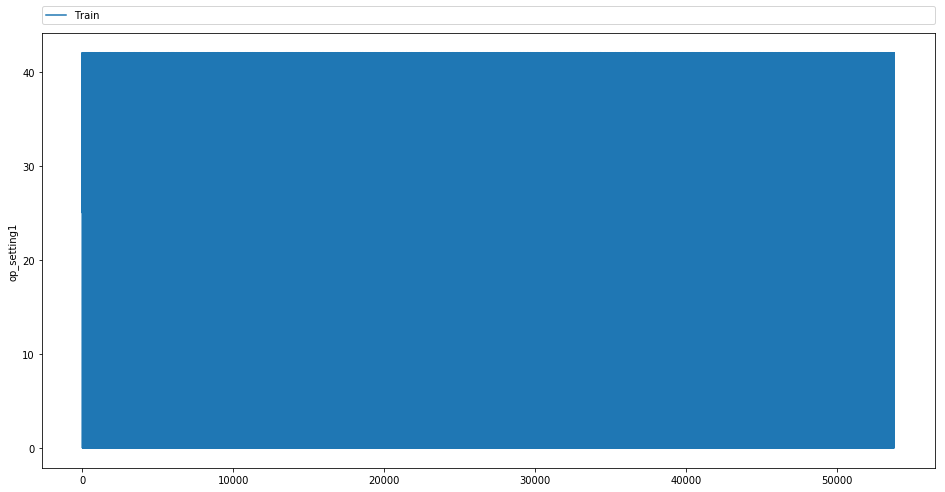

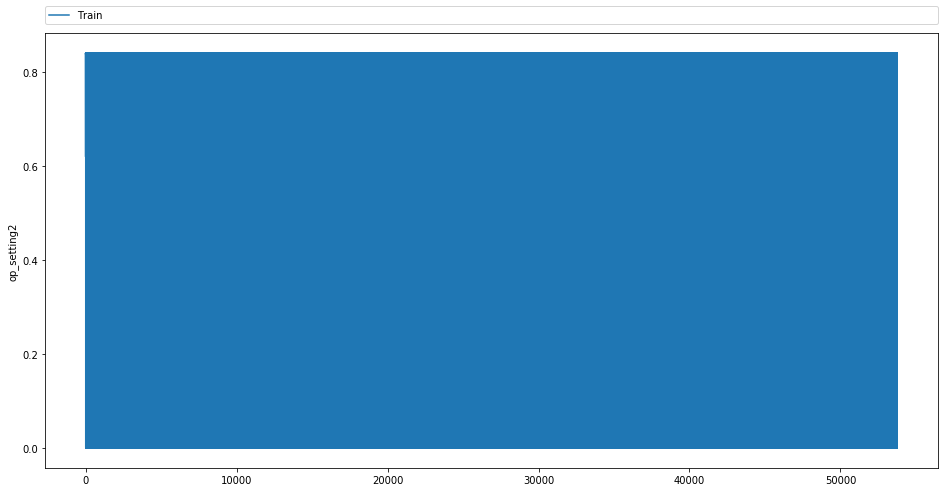

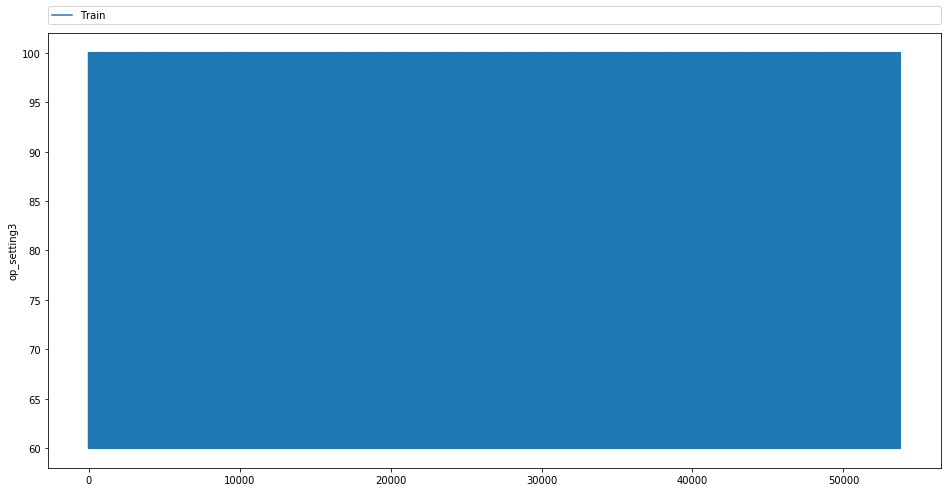

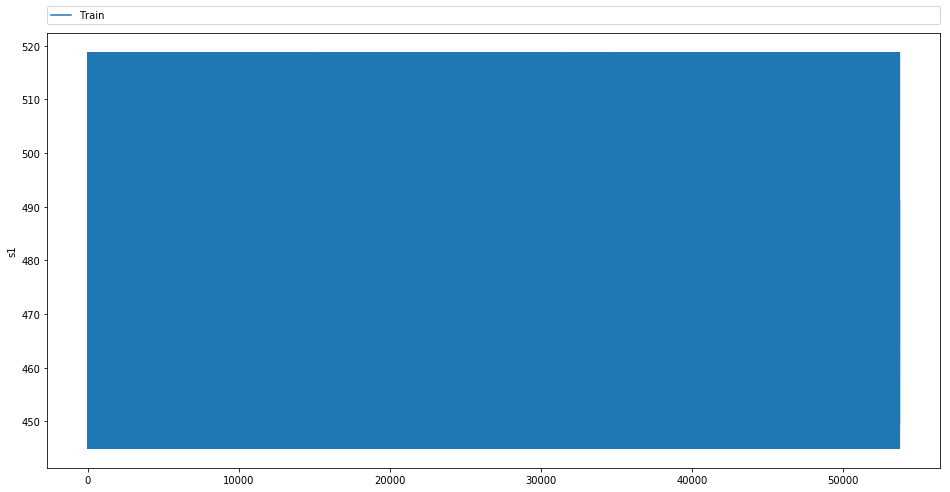

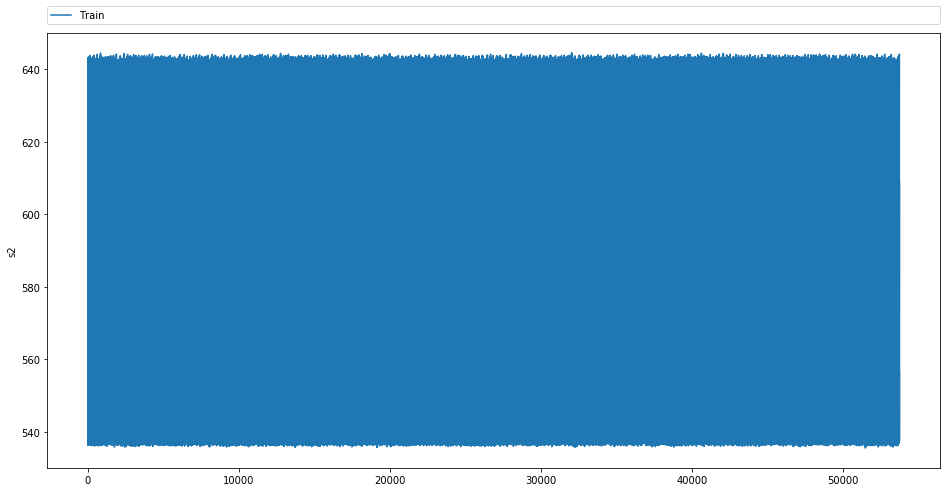

...

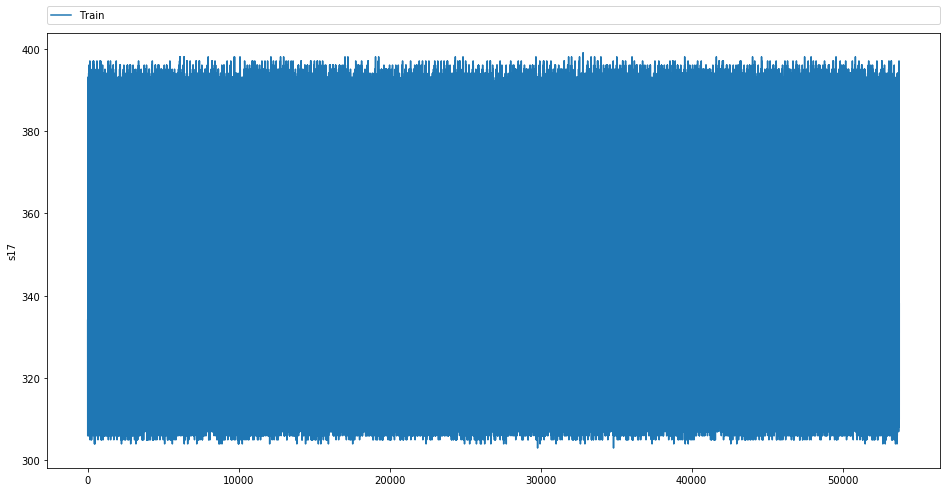

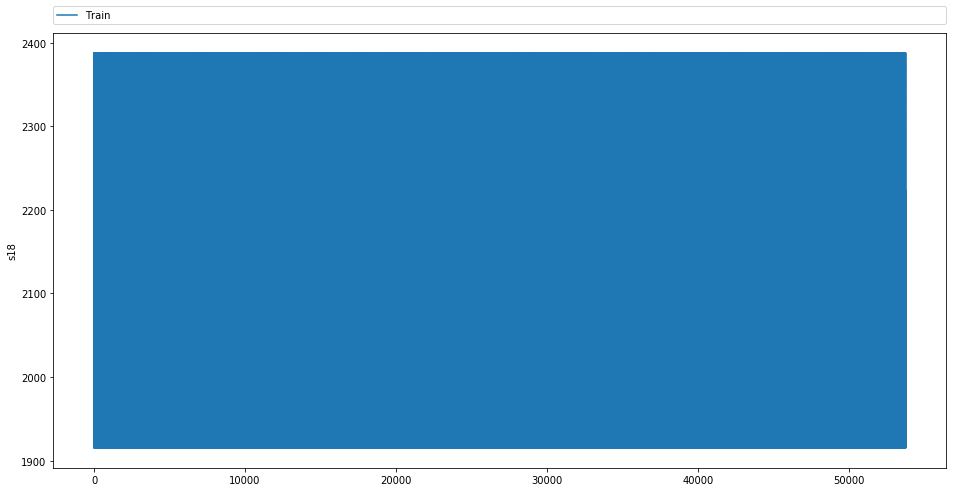

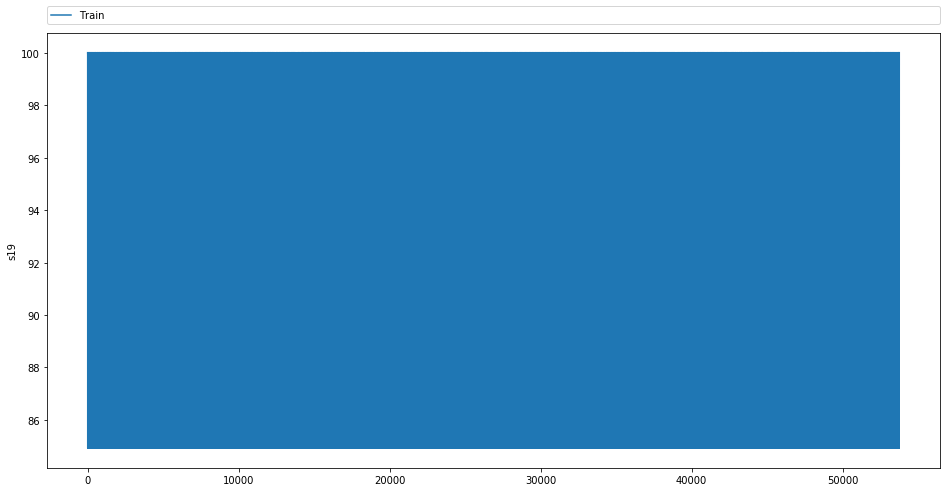

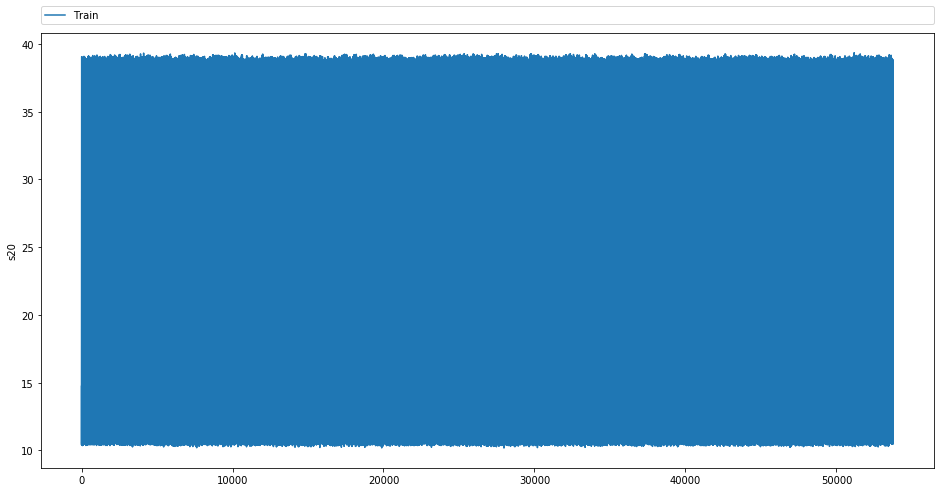

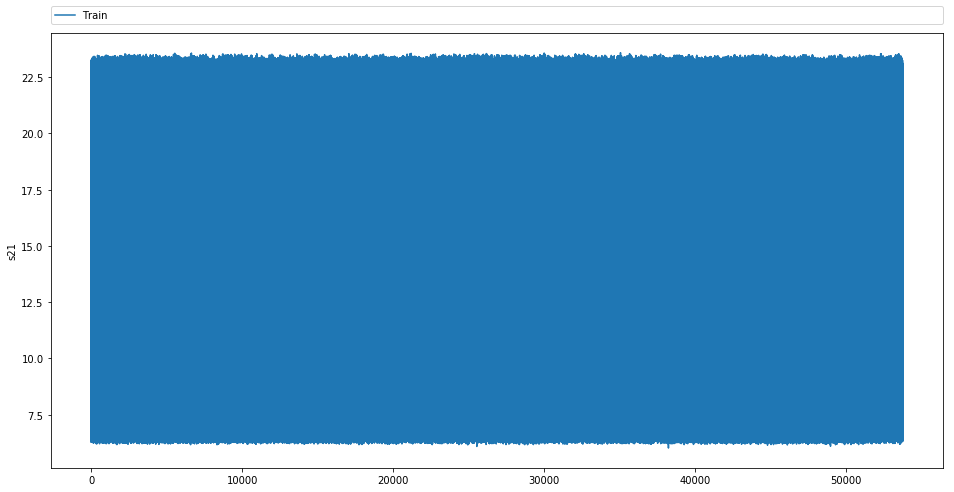

In [29]:
for feature in train.drop(columns = ["unit", "cycles"]).columns:
    fig = plt.figure(figsize = (16, 8))
    plt.plot(train[feature])
    plt.legend(['Train'], bbox_to_anchor=(0., 1.02, 1., .102), loc=3, mode="expand", borderaxespad=0)
    plt.ylabel(feature)
    plt.show()

In [30]:
cyc1 = feature_prepare_by_diff(train, "unit", 1)
cyc2 = feature_prepare_by_diff(train, "unit", 2)
cyc3 = feature_prepare_by_diff(train, "unit", 3)
cyc4 = feature_prepare_by_diff(train, "unit", 4)
cyc5 = feature_prepare_by_diff(train, "unit", 5)
cyc6 = feature_prepare_by_diff(train, "unit", 6)
cyc7 = feature_prepare_by_diff(train, "unit", 7)
cyc8 = feature_prepare_by_diff(train, "unit", 8)
cyc9 = feature_prepare_by_diff(train, "unit", 9)
cyc10 = feature_prepare_by_diff(train, "unit", 10)

train_diff = pd.concat([cyc1, cyc2, cyc3, cyc4, cyc5, cyc6, cyc7, cyc8, cyc9, cyc10], axis = 1)
train_diff.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [31]:
cyc1 = feature_prepare_by_diff(test, "unit", 1)
cyc2 = feature_prepare_by_diff(test, "unit", 2)
cyc3 = feature_prepare_by_diff(test, "unit", 3)
cyc4 = feature_prepare_by_diff(test, "unit", 4)
cyc5 = feature_prepare_by_diff(test, "unit", 5)
cyc6 = feature_prepare_by_diff(test, "unit", 6)
cyc7 = feature_prepare_by_diff(test, "unit", 7)
cyc8 = feature_prepare_by_diff(test, "unit", 8)
cyc9 = feature_prepare_by_diff(test, "unit", 9)
cyc10 = feature_prepare_by_diff(test, "unit", 10)

test_diff = pd.concat([cyc1, cyc2, cyc3, cyc4, cyc5, cyc6, cyc7, cyc8, cyc9, cyc10], axis = 1)
test_diff.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [32]:
train_mean = feature_prepare_by_mean(train, "unit")
train_mean.head()

,unit_mean_of_feature,cycles_mean_of_feature,op_setting1_mean_of_feature,op_setting2_mean_of_feature,op_setting3_mean_of_feature,s1_mean_of_feature,s2_mean_of_feature,s3_mean_of_feature,s4_mean_of_feature,s5_mean_of_feature,s6_mean_of_feature,s7_mean_of_feature,s8_mean_of_feature,s9_mean_of_feature,s10_mean_of_feature,s11_mean_of_feature,s12_mean_of_feature,s13_mean_of_feature,s14_mean_of_feature,s15_mean_of_feature,s16_mean_of_feature,s17_mean_of_feature,s18_mean_of_feature,s19_mean_of_feature,s20_mean_of_feature,s21_mean_of_feature
0,1.0,75.0,24.875195,0.582721,94.093960,471.633154,578.220403,1417.841141,1204.313221,7.859262,11.348389,276.063624,2225.951141,8494.444698,1.090067,43.025034,259.876779,2334.767584,8047.956242,9.356340,0.023490,347.644295,2226.080537,97.774899,20.284899,12.190332
1,2.0,135.0,24.467407,0.585600,93.754647,472.272639,578.687881,1418.178885,1203.146989,7.926914,11.434833,277.713457,2224.959740,8522.055948,1.088513,42.925242,261.412528,2332.020855,8069.911450,9.367214,0.023011,347.553903,2224.806691,97.647063,20.453420,12.273477
2,3.0,103.5,24.881775,0.599514,94.563107,471.465388,578.227136,1415.867184,1198.745000,7.811942,11.286456,274.753495,2229.822379,8511.947379,1.088010,42.867864,258.687379,2339.176068,8064.401650,9.325501,0.023058,347.417476,2229.786408,97.951650,20.269806,12.166150
3,4.0,118.0,24.202915,0.575382,94.553191,472.886851,580.148383,1422.474468,1207.202000,8.021915,11.603362,283.222596,2233.216596,8543.702723,1.095064,43.090553,266.601702,2339.250383,8081.127021,9.314483,0.023064,348.923404,2233.021277,97.947915,20.804085,12.480000
4,5.0,77.5,24.230149,0.581264,92.987013,471.514935,576.915714,1410.975260,1193.861169,7.898506,11.366818,275.337208,2216.743961,8511.127013,1.089026,42.642273,259.248312,2325.169610,8072.489805,9.369849,0.022987,345.902597,2216.532468,97.357857,20.376364,12.221888


In [33]:
test_mean = feature_prepare_by_mean(test, "unit")
test_mean.head()

,unit_mean_of_feature,cycles_mean_of_feature,op_setting1_mean_of_feature,op_setting2_mean_of_feature,op_setting3_mean_of_feature,s1_mean_of_feature,s2_mean_of_feature,s3_mean_of_feature,s4_mean_of_feature,s5_mean_of_feature,s6_mean_of_feature,s7_mean_of_feature,s8_mean_of_feature,s9_mean_of_feature,s10_mean_of_feature,s11_mean_of_feature,s12_mean_of_feature,s13_mean_of_feature,s14_mean_of_feature,s15_mean_of_feature,s16_mean_of_feature,s17_mean_of_feature,s18_mean_of_feature,s19_mean_of_feature,s20_mean_of_feature,s21_mean_of_feature
0,1.0,129.5,24.157602,0.579861,93.643411,472.752907,579.238682,1418.034612,1204.285039,8.015465,11.562016,280.747326,2225.010271,8512.535853,1.089612,42.951822,264.343178,2330.869651,8057.051628,9.369605,0.023295,347.984496,2224.992248,97.605155,20.655271,12.394515
1,2.0,28.0,26.512127,0.602916,94.181818,468.179636,573.677091,1404.736000,1189.410364,7.414182,10.696182,259.919455,2218.530545,8476.265455,1.084000,42.656545,244.643455,2335.685273,8061.241818,9.349478,0.022727,344.345455,2218.545455,97.808000,19.256000,11.528038
2,3.0,83.0,22.663222,0.541729,94.909091,475.060788,582.964788,1428.927758,1214.955939,8.359455,12.114788,297.306182,2241.240424,8546.161939,1.109515,43.221636,279.979515,2342.205394,8063.444727,9.244176,0.023515,350.690909,2241.284848,98.082000,21.803030,13.080335
3,4.0,43.5,24.061074,0.568473,92.558140,472.189651,577.534419,1412.459186,1200.653953,7.961279,11.449767,277.115000,2214.518023,8499.879884,1.090698,42.742093,260.930581,2321.146047,8057.568953,9.398621,0.023023,346.465116,2214.453488,97.196279,20.434070,12.261906
4,5.0,74.5,23.739297,0.579081,93.243243,473.211216,579.376689,1417.566216,1201.166959,8.096959,11.667635,283.035878,2222.909392,8525.096554,1.088986,42.800405,266.453581,2327.444122,8068.775878,9.369706,0.022973,347.608108,2222.729730,97.454392,20.857230,12.519247


In [34]:
train_std = feature_prepare_by_std(train, "unit")
train_std.head()

,unit_std_of_feature,cycles_std_of_feature,op_setting1_std_of_feature,op_setting2_std_of_feature,op_setting3_std_of_feature,s1_std_of_feature,s2_std_of_feature,s3_std_of_feature,s4_std_of_feature,s5_std_of_feature,s6_std_of_feature,s7_std_of_feature,s8_std_of_feature,s9_std_of_feature,s10_std_of_feature,s11_std_of_feature,s12_std_of_feature,s13_std_of_feature,s14_std_of_feature,s15_std_of_feature,s16_std_of_feature,s17_std_of_feature,s18_std_of_feature,s19_std_of_feature,s20_std_of_feature,s21_std_of_feature
0,0.0,43.156691,15.195746,0.315645,14.238007,27.183640,38.080742,107.830438,121.094160,3.747489,5.619953,150.310502,145.058326,337.597669,0.127218,3.262630,141.684951,128.112540,81.280900,0.739326,0.004783,28.129304,145.056024,5.364169,10.169621,6.075709
1,0.0,77.797815,14.536037,0.303987,14.546350,26.174906,37.092719,104.920419,117.875929,3.566258,5.358414,143.960824,147.041472,334.778995,0.125231,3.236228,135.775762,130.830275,84.774979,0.755411,0.004596,27.497793,147.197805,5.480337,9.725915,5.841726
2,0.0,59.611241,14.146208,0.294855,13.741637,25.401296,35.644699,101.362579,113.005103,3.424170,5.133444,137.527376,138.861063,318.426341,0.121263,3.069291,129.598860,123.610813,79.878882,0.709025,0.004619,26.438894,138.969844,5.177162,9.316370,5.582113
3,0.0,67.982841,15.022178,0.315838,13.748051,27.033974,37.750376,106.268958,120.264870,3.704897,5.559465,148.840524,141.616056,338.356730,0.126890,3.201716,140.323756,123.584099,83.289848,0.733324,0.004620,27.887489,141.827373,5.179578,10.061908,6.033641
4,0.0,44.600075,14.025384,0.296656,15.259407,24.980474,36.043935,104.691897,116.906007,3.383149,5.097859,138.124750,151.304381,333.957534,0.127293,3.303503,130.240374,137.239888,91.424303,0.781170,0.004592,27.356463,151.506214,5.748982,9.345657,5.604065


In [35]:
test_std = feature_prepare_by_std(test, "unit")
test_std.head()

,unit_std_of_feature,cycles_std_of_feature,op_setting1_std_of_feature,op_setting2_std_of_feature,op_setting3_std_of_feature,s1_std_of_feature,s2_std_of_feature,s3_std_of_feature,s4_std_of_feature,s5_std_of_feature,s6_std_of_feature,s7_std_of_feature,s8_std_of_feature,s9_std_of_feature,s10_std_of_feature,s11_std_of_feature,s12_std_of_feature,s13_std_of_feature,s14_std_of_feature,s15_std_of_feature,s16_std_of_feature,s17_std_of_feature,s18_std_of_feature,s19_std_of_feature,s20_std_of_feature,s21_std_of_feature
0,0.0,74.622383,14.625359,0.309613,14.652285,26.567691,37.795646,107.776049,120.778603,3.616506,5.440812,146.350691,148.830193,341.550907,0.126736,3.303902,137.967238,131.824729,86.025114,0.760454,0.004709,28.149955,148.899125,5.520249,9.876630,5.918056
1,0.0,16.020820,15.193411,0.307537,14.232320,26.264097,36.293131,103.859152,116.991725,3.660774,5.466220,145.741903,141.026449,325.167387,0.125559,3.131578,137.350878,128.023314,82.586513,0.738405,0.004495,26.989174,141.121673,5.362026,9.911299,5.944379
2,0.0,47.775517,15.144796,0.324673,13.371711,27.118099,37.926567,106.779513,121.447700,3.727510,5.607072,150.788662,140.351287,337.496537,0.131524,3.196678,142.178574,120.301961,79.677563,0.730082,0.004789,27.985758,140.401593,5.037792,10.183775,6.116023
3,0.0,24.969982,14.675946,0.306133,15.657064,25.968982,37.602058,108.538584,121.791218,3.576113,5.389712,145.868915,156.393681,346.288521,0.130931,3.424012,137.473292,140.842793,90.564469,0.809283,0.004620,28.413211,156.511203,5.898799,9.828216,5.906736
4,0.0,42.868014,14.189404,0.305601,15.038102,26.089794,37.465465,107.970555,119.927041,3.513293,5.300204,143.403279,151.998708,341.683376,0.126726,3.335073,135.258413,135.245476,88.807446,0.775229,0.004586,28.004770,152.176437,5.665605,9.661308,5.800270


In [36]:
train_median = feature_prepare_by_median(train, "unit")
train_median.head()

,unit_median_of_feature,cycles_median_of_feature,op_setting1_median_of_feature,op_setting2_median_of_feature,op_setting3_median_of_feature,s1_median_of_feature,s2_median_of_feature,s3_median_of_feature,s4_median_of_feature,s5_median_of_feature,s6_median_of_feature,s7_median_of_feature,s8_median_of_feature,s9_median_of_feature,s10_median_of_feature,s11_median_of_feature,s12_median_of_feature,s13_median_of_feature,s14_median_of_feature,s15_median_of_feature,s16_median_of_feature,s17_median_of_feature,s18_median_of_feature,s19_median_of_feature,s20_median_of_feature,s21_median_of_feature
0,1.0,75.0,25.0025,0.70020,100.0,462.54,555.640,1368.090,1137.890,7.05,9.02,194.000,2222.680,8339.320,1.02,42.370,182.72,2387.76,8066.980,9.35710,0.02,334.0,2223.0,100.0,14.780,8.8740
1,2.0,135.0,25.0022,0.70000,100.0,462.54,556.090,1369.540,1137.990,7.05,9.03,194.590,2223.190,8364.220,1.02,42.440,183.07,2388.16,8090.330,9.32830,0.02,335.0,2223.0,100.0,14.850,8.9174
2,3.0,103.5,25.0050,0.70025,100.0,462.54,555.925,1368.310,1137.150,7.05,9.03,194.755,2223.030,8355.375,1.02,42.240,183.22,2388.06,8082.255,9.30460,0.02,335.0,2223.0,100.0,14.880,8.9190
3,4.0,118.0,25.0020,0.70000,100.0,462.54,556.050,1369.480,1134.900,7.05,9.03,194.730,2223.300,8373.180,1.02,42.290,183.15,2388.11,8090.390,9.32120,0.02,335.0,2223.0,100.0,14.860,8.9373
4,5.0,77.5,25.0003,0.70000,100.0,462.54,555.780,1367.485,1132.975,7.05,9.03,194.650,2223.245,8372.840,1.02,42.235,183.30,2388.12,8091.525,9.31035,0.02,334.0,2223.0,100.0,14.895,8.9232


In [37]:
test_median = feature_prepare_by_median(test, "unit")
test_median.head()

,unit_median_of_feature,cycles_median_of_feature,op_setting1_median_of_feature,op_setting2_median_of_feature,op_setting3_median_of_feature,s1_median_of_feature,s2_median_of_feature,s3_median_of_feature,s4_median_of_feature,s5_median_of_feature,s6_median_of_feature,s7_median_of_feature,s8_median_of_feature,s9_median_of_feature,s10_median_of_feature,s11_median_of_feature,s12_median_of_feature,s13_median_of_feature,s14_median_of_feature,s15_median_of_feature,s16_median_of_feature,s17_median_of_feature,s18_median_of_feature,s19_median_of_feature,s20_median_of_feature,s21_median_of_feature
0,1.0,129.5,25.00180,0.7000,100.0,462.54,556.000,1367.250,1136.135,7.05,9.03,194.385,2222.830,8353.810,1.02,42.330,183.020,2388.060,8073.385,9.33440,0.02,335.0,2223.0,100.0,14.835,8.91100
1,2.0,28.0,25.00710,0.7009,100.0,462.54,554.790,1362.790,1128.800,7.05,9.02,193.820,2222.870,8339.780,1.02,42.060,182.380,2388.010,8080.200,9.33110,0.02,333.0,2223.0,100.0,14.760,8.84780
2,3.0,83.0,24.99960,0.7000,100.0,462.54,556.060,1370.620,1135.590,7.05,9.03,195.150,2222.990,8354.090,1.02,42.220,183.820,2388.020,8075.940,9.29220,0.02,335.0,2223.0,100.0,15.060,8.97000
3,4.0,43.5,25.00185,0.7000,100.0,462.54,555.935,1366.375,1134.780,7.05,9.03,194.550,2222.980,8352.145,1.02,42.240,182.880,2388.075,8084.345,9.33680,0.02,334.0,2223.0,100.0,14.830,8.92065
4,5.0,74.5,24.99990,0.7000,100.0,462.54,556.070,1367.585,1136.275,7.05,9.03,194.845,2223.275,8381.315,1.02,42.225,183.255,2388.110,8086.270,9.31165,0.02,335.0,2223.0,100.0,14.900,8.94230


In [38]:
slp1 = feature_prepare_by_slope(train, "unit", 1, 0)
slp2 = feature_prepare_by_slope(train, "unit", 2, 0)
slp3 = feature_prepare_by_slope(train, "unit", 3, 0)
slp4 = feature_prepare_by_slope(train, "unit", 4, 0)
slp5 = feature_prepare_by_slope(train, "unit", 5, 0)
slp6 = feature_prepare_by_slope(train, "unit", 6, 0)
slp7 = feature_prepare_by_slope(train, "unit", 7, 0)
slp8 = feature_prepare_by_slope(train, "unit", 8, 0)
slp9 = feature_prepare_by_slope(train, "unit", 9, 0)
slp10 = feature_prepare_by_slope(train, "unit", 10, 0)

train_slope_0 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
train_slope_0.head()

,unit_slope_of_1_cycle_0,cycles_slope_of_1_cycle_0,op_setting1_slope_of_1_cycle_0,op_setting2_slope_of_1_cycle_0,op_setting3_slope_of_1_cycle_0,s1_slope_of_1_cycle_0,s2_slope_of_1_cycle_0,s3_slope_of_1_cycle_0,s4_slope_of_1_cycle_0,s5_slope_of_1_cycle_0,s6_slope_of_1_cycle_0,s7_slope_of_1_cycle_0,s8_slope_of_1_cycle_0,s9_slope_of_1_cycle_0,s10_slope_of_1_cycle_0,s11_slope_of_1_cycle_0,s12_slope_of_1_cycle_0,s13_slope_of_1_cycle_0,s14_slope_of_1_cycle_0,s15_slope_of_1_cycle_0,s16_slope_of_1_cycle_0,s17_slope_of_1_cycle_0,s18_slope_of_1_cycle_0,s19_slope_of_1_cycle_0,s20_slope_of_1_cycle_0,s21_slope_of_1_cycle_0,unit_slope_of_2_cycle_0,cycles_slope_of_2_cycle_0,op_setting1_slope_of_2_cycle_0,op_setting2_slope_of_2_cycle_0,op_setting3_slope_of_2_cycle_0,s1_slope_of_2_cycle_0,s2_slope_of_2_cycle_0,s3_slope_of_2_cycle_0,s4_slope_of_2_cycle_0,s5_slope_of_2_cycle_0,s6_slope_of_2_cycle_0,s7_slope_of_2_cycle_0,s8_slope_of_2_cycle_0,s9_slope_of_2_cycle_0,s10_slope_of_2_cycle_0,s11_slope_of_2_cycle_0,s12_slope_of_2_cycle_0,s13_slope_of_2_cycle_0,s14_slope_of_2_cycle_0,s15_slope_of_2_cycle_0,s16_slope_of_2_cycle_0,s17_slope_of_2_cycle_0,s18_slope_of_2_cycle_0,s19_slope_of_2_cycle_0,s20_slope_of_2_cycle_0,s21_slope_of_2_cycle_0,unit_slope_of_3_cycle_0,cycles_slope_of_3_cycle_0,op_setting1_slope_of_3_cycle_0,op_setting2_slope_of_3_cycle_0,op_setting3_slope_of_3_cycle_0,s1_slope_of_3_cycle_0,s2_slope_of_3_cycle_0,s3_slope_of_3_cycle_0,s4_slope_of_3_cycle_0,s5_slope_of_3_cycle_0,s6_slope_of_3_cycle_0,s7_slope_of_3_cycle_0,s8_slope_of_3_cycle_0,s9_slope_of_3_cycle_0,s10_slope_of_3_cycle_0,s11_slope_of_3_cycle_0,s12_slope_of_3_cycle_0,s13_slope_of_3_cycle_0,s14_slope_of_3_cycle_0,s15_slope_of_3_cycle_0,s16_slope_of_3_cycle_0,s17_slope_of_3_cycle_0,s18_slope_of_3_cycle_0,s19_slope_of_3_cycle_0,s20_slope_of_3_cycle_0,s21_slope_of_3_cycle_0,unit_slope_of_4_cycle_0,cycles_slope_of_4_cycle_0,op_setting1_slope_of_4_cycle_0,op_setting2_slope_of_4_cycle_0,op_setting3_slope_of_4_cycle_0,s1_slope_of_4_cycle_0,s2_slope_of_4_cycle_0,s3_slope_of_4_cycle_0,s4_slope_of_4_cycle_0,s5_slope_of_4_cycle_0,s6_slope_of_4_cycle_0,s7_slope_of_4_cycle_0,s8_slope_of_4_cycle_0,s9_slope_of_4_cycle_0,s10_slope_of_4_cycle_0,s11_slope_of_4_cycle_0,s12_slope_of_4_cycle_0,s13_slope_of_4_cycle_0,s14_slope_of_4_cycle_0,s15_slope_of_4_cycle_0,s16_slope_of_4_cycle_0,s17_slope_of_4_cycle_0,s18_slope_of_4_cycle_0,s19_slope_of_4_cycle_0,s20_slope_of_4_cycle_0,s21_slope_of_4_cycle_0,unit_slope_of_5_cycle_0,cycles_slope_of_5_cycle_0,op_setting1_slope_of_5_cycle_0,op_setting2_slope_of_5_cycle_0,op_setting3_slope_of_5_cycle_0,s1_slope_of_5_cycle_0,s2_slope_of_5_cycle_0,s3_slope_of_5_cycle_0,s4_slope_of_5_cycle_0,s5_slope_of_5_cycle_0,s6_slope_of_5_cycle_0,s7_slope_of_5_cycle_0,s8_slope_of_5_cycle_0,s9_slope_of_5_cycle_0,s10_slope_of_5_cycle_0,s11_slope_of_5_cycle_0,s12_slope_of_5_cycle_0,s13_slope_of_5_cycle_0,s14_slope_of_5_cycle_0,s15_slope_of_5_cycle_0,s16_slope_of_5_cycle_0,s17_slope_of_5_cycle_0,s18_slope_of_5_cycle_0,s19_slope_of_5_cycle_0,s20_slope_of_5_cycle_0,s21_slope_of_5_cycle_0,unit_slope_of_6_cycle_0,cycles_slope_of_6_cycle_0,op_setting1_slope_of_6_cycle_0,op_setting2_slope_of_6_cycle_0,op_setting3_slope_of_6_cycle_0,s1_slope_of_6_cycle_0,s2_slope_of_6_cycle_0,s3_slope_of_6_cycle_0,s4_slope_of_6_cycle_0,s5_slope_of_6_cycle_0,s6_slope_of_6_cycle_0,s7_slope_of_6_cycle_0,s8_slope_of_6_cycle_0,s9_slope_of_6_cycle_0,s10_slope_of_6_cycle_0,s11_slope_of_6_cycle_0,s12_slope_of_6_cycle_0,s13_slope_of_6_cycle_0,s14_slope_of_6_cycle_0,s15_slope_of_6_cycle_0,s16_slope_of_6_cycle_0,s17_slope_of_6_cycle_0,s18_slope_of_6_cycle_0,s19_slope_of_6_cycle_0,s20_slope_of_6_cycle_0,s21_slope_of_6_cycle_0,unit_slope_of_7_cycle_0,cycles_slope_of_7_cycle_0,op_setting1_slope_of_7_cycle_0,op_setting2_slope_of_7_cycle_0,op_setting3_slope_of_7_cycle_0,s1_slope_of_7_cycle_0,s2_slope_of_7_cycle_0,s3_slope_of_7_cycle_0,s4_slope_of_7_cycle_0,s5_slope_of_7_cycle_0,s6_slope_of_7_cycle_0,s7_slope_of_7_cycle_0,

In [39]:
slp1 = feature_prepare_by_slope(train, "unit", 1, 1)
slp2 = feature_prepare_by_slope(train, "unit", 2, 1)
slp3 = feature_prepare_by_slope(train, "unit", 3, 1)
slp4 = feature_prepare_by_slope(train, "unit", 4, 1)
slp5 = feature_prepare_by_slope(train, "unit", 5, 1)
slp6 = feature_prepare_by_slope(train, "unit", 6, 1)
slp7 = feature_prepare_by_slope(train, "unit", 7, 1)
slp8 = feature_prepare_by_slope(train, "unit", 8, 1)
slp9 = feature_prepare_by_slope(train, "unit", 9, 1)
slp10 = feature_prepare_by_slope(train, "unit", 10, 1)

train_slope_1 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
train_slope_1.head()

,unit_slope_of_1_cycle_1,cycles_slope_of_1_cycle_1,op_setting1_slope_of_1_cycle_1,op_setting2_slope_of_1_cycle_1,op_setting3_slope_of_1_cycle_1,s1_slope_of_1_cycle_1,s2_slope_of_1_cycle_1,s3_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s5_slope_of_1_cycle_1,s6_slope_of_1_cycle_1,s7_slope_of_1_cycle_1,s8_slope_of_1_cycle_1,s9_slope_of_1_cycle_1,s10_slope_of_1_cycle_1,s11_slope_of_1_cycle_1,s12_slope_of_1_cycle_1,s13_slope_of_1_cycle_1,s14_slope_of_1_cycle_1,s15_slope_of_1_cycle_1,s16_slope_of_1_cycle_1,s17_slope_of_1_cycle_1,s18_slope_of_1_cycle_1,s19_slope_of_1_cycle_1,s20_slope_of_1_cycle_1,s21_slope_of_1_cycle_1,unit_slope_of_2_cycle_1,cycles_slope_of_2_cycle_1,op_setting1_slope_of_2_cycle_1,op_setting2_slope_of_2_cycle_1,op_setting3_slope_of_2_cycle_1,s1_slope_of_2_cycle_1,s2_slope_of_2_cycle_1,s3_slope_of_2_cycle_1,s4_slope_of_2_cycle_1,s5_slope_of_2_cycle_1,s6_slope_of_2_cycle_1,s7_slope_of_2_cycle_1,s8_slope_of_2_cycle_1,s9_slope_of_2_cycle_1,s10_slope_of_2_cycle_1,s11_slope_of_2_cycle_1,s12_slope_of_2_cycle_1,s13_slope_of_2_cycle_1,s14_slope_of_2_cycle_1,s15_slope_of_2_cycle_1,s16_slope_of_2_cycle_1,s17_slope_of_2_cycle_1,s18_slope_of_2_cycle_1,s19_slope_of_2_cycle_1,s20_slope_of_2_cycle_1,s21_slope_of_2_cycle_1,unit_slope_of_3_cycle_1,cycles_slope_of_3_cycle_1,op_setting1_slope_of_3_cycle_1,op_setting2_slope_of_3_cycle_1,op_setting3_slope_of_3_cycle_1,s1_slope_of_3_cycle_1,s2_slope_of_3_cycle_1,s3_slope_of_3_cycle_1,s4_slope_of_3_cycle_1,s5_slope_of_3_cycle_1,s6_slope_of_3_cycle_1,s7_slope_of_3_cycle_1,s8_slope_of_3_cycle_1,s9_slope_of_3_cycle_1,s10_slope_of_3_cycle_1,s11_slope_of_3_cycle_1,s12_slope_of_3_cycle_1,s13_slope_of_3_cycle_1,s14_slope_of_3_cycle_1,s15_slope_of_3_cycle_1,s16_slope_of_3_cycle_1,s17_slope_of_3_cycle_1,s18_slope_of_3_cycle_1,s19_slope_of_3_cycle_1,s20_slope_of_3_cycle_1,s21_slope_of_3_cycle_1,unit_slope_of_4_cycle_1,cycles_slope_of_4_cycle_1,op_setting1_slope_of_4_cycle_1,op_setting2_slope_of_4_cycle_1,op_setting3_slope_of_4_cycle_1,s1_slope_of_4_cycle_1,s2_slope_of_4_cycle_1,s3_slope_of_4_cycle_1,s4_slope_of_4_cycle_1,s5_slope_of_4_cycle_1,s6_slope_of_4_cycle_1,s7_slope_of_4_cycle_1,s8_slope_of_4_cycle_1,s9_slope_of_4_cycle_1,s10_slope_of_4_cycle_1,s11_slope_of_4_cycle_1,s12_slope_of_4_cycle_1,s13_slope_of_4_cycle_1,s14_slope_of_4_cycle_1,s15_slope_of_4_cycle_1,s16_slope_of_4_cycle_1,s17_slope_of_4_cycle_1,s18_slope_of_4_cycle_1,s19_slope_of_4_cycle_1,s20_slope_of_4_cycle_1,s21_slope_of_4_cycle_1,unit_slope_of_5_cycle_1,cycles_slope_of_5_cycle_1,op_setting1_slope_of_5_cycle_1,op_setting2_slope_of_5_cycle_1,op_setting3_slope_of_5_cycle_1,s1_slope_of_5_cycle_1,s2_slope_of_5_cycle_1,s3_slope_of_5_cycle_1,s4_slope_of_5_cycle_1,s5_slope_of_5_cycle_1,s6_slope_of_5_cycle_1,s7_slope_of_5_cycle_1,s8_slope_of_5_cycle_1,s9_slope_of_5_cycle_1,s10_slope_of_5_cycle_1,s11_slope_of_5_cycle_1,s12_slope_of_5_cycle_1,s13_slope_of_5_cycle_1,s14_slope_of_5_cycle_1,s15_slope_of_5_cycle_1,s16_slope_of_5_cycle_1,s17_slope_of_5_cycle_1,s18_slope_of_5_cycle_1,s19_slope_of_5_cycle_1,s20_slope_of_5_cycle_1,s21_slope_of_5_cycle_1,unit_slope_of_6_cycle_1,cycles_slope_of_6_cycle_1,op_setting1_slope_of_6_cycle_1,op_setting2_slope_of_6_cycle_1,op_setting3_slope_of_6_cycle_1,s1_slope_of_6_cycle_1,s2_slope_of_6_cycle_1,s3_slope_of_6_cycle_1,s4_slope_of_6_cycle_1,s5_slope_of_6_cycle_1,s6_slope_of_6_cycle_1,s7_slope_of_6_cycle_1,s8_slope_of_6_cycle_1,s9_slope_of_6_cycle_1,s10_slope_of_6_cycle_1,s11_slope_of_6_cycle_1,s12_slope_of_6_cycle_1,s13_slope_of_6_cycle_1,s14_slope_of_6_cycle_1,s15_slope_of_6_cycle_1,s16_slope_of_6_cycle_1,s17_slope_of_6_cycle_1,s18_slope_of_6_cycle_1,s19_slope_of_6_cycle_1,s20_slope_of_6_cycle_1,s21_slope_of_6_cycle_1,unit_slope_of_7_cycle_1,cycles_slope_of_7_cycle_1,op_setting1_slope_of_7_cycle_1,op_setting2_slope_of_7_cycle_1,op_setting3_slope_of_7_cycle_1,s1_slope_of_7_cycle_1,s2_slope_of_7_cycle_1,s3_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,s5_slope_of_7_cycle_1,s6_slope_of_7_cycle_1,s7_slope_of_7_cycle_1,

In [40]:
slp1 = feature_prepare_by_slope(test, "unit", 1, 0)
slp2 = feature_prepare_by_slope(test, "unit", 2, 0)
slp3 = feature_prepare_by_slope(test, "unit", 3, 0)
slp4 = feature_prepare_by_slope(test, "unit", 4, 0)
slp5 = feature_prepare_by_slope(test, "unit", 5, 0)
slp6 = feature_prepare_by_slope(test, "unit", 6, 0)
slp7 = feature_prepare_by_slope(test, "unit", 7, 0)
slp8 = feature_prepare_by_slope(test, "unit", 8, 0)
slp9 = feature_prepare_by_slope(test, "unit", 9, 0)
slp10 = feature_prepare_by_slope(test, "unit", 10, 0)

test_slope_0 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
test_slope_0.head()

,unit_slope_of_1_cycle_0,cycles_slope_of_1_cycle_0,op_setting1_slope_of_1_cycle_0,op_setting2_slope_of_1_cycle_0,op_setting3_slope_of_1_cycle_0,s1_slope_of_1_cycle_0,s2_slope_of_1_cycle_0,s3_slope_of_1_cycle_0,s4_slope_of_1_cycle_0,s5_slope_of_1_cycle_0,s6_slope_of_1_cycle_0,s7_slope_of_1_cycle_0,s8_slope_of_1_cycle_0,s9_slope_of_1_cycle_0,s10_slope_of_1_cycle_0,s11_slope_of_1_cycle_0,s12_slope_of_1_cycle_0,s13_slope_of_1_cycle_0,s14_slope_of_1_cycle_0,s15_slope_of_1_cycle_0,s16_slope_of_1_cycle_0,s17_slope_of_1_cycle_0,s18_slope_of_1_cycle_0,s19_slope_of_1_cycle_0,s20_slope_of_1_cycle_0,s21_slope_of_1_cycle_0,unit_slope_of_2_cycle_0,cycles_slope_of_2_cycle_0,op_setting1_slope_of_2_cycle_0,op_setting2_slope_of_2_cycle_0,op_setting3_slope_of_2_cycle_0,s1_slope_of_2_cycle_0,s2_slope_of_2_cycle_0,s3_slope_of_2_cycle_0,s4_slope_of_2_cycle_0,s5_slope_of_2_cycle_0,s6_slope_of_2_cycle_0,s7_slope_of_2_cycle_0,s8_slope_of_2_cycle_0,s9_slope_of_2_cycle_0,s10_slope_of_2_cycle_0,s11_slope_of_2_cycle_0,s12_slope_of_2_cycle_0,s13_slope_of_2_cycle_0,s14_slope_of_2_cycle_0,s15_slope_of_2_cycle_0,s16_slope_of_2_cycle_0,s17_slope_of_2_cycle_0,s18_slope_of_2_cycle_0,s19_slope_of_2_cycle_0,s20_slope_of_2_cycle_0,s21_slope_of_2_cycle_0,unit_slope_of_3_cycle_0,cycles_slope_of_3_cycle_0,op_setting1_slope_of_3_cycle_0,op_setting2_slope_of_3_cycle_0,op_setting3_slope_of_3_cycle_0,s1_slope_of_3_cycle_0,s2_slope_of_3_cycle_0,s3_slope_of_3_cycle_0,s4_slope_of_3_cycle_0,s5_slope_of_3_cycle_0,s6_slope_of_3_cycle_0,s7_slope_of_3_cycle_0,s8_slope_of_3_cycle_0,s9_slope_of_3_cycle_0,s10_slope_of_3_cycle_0,s11_slope_of_3_cycle_0,s12_slope_of_3_cycle_0,s13_slope_of_3_cycle_0,s14_slope_of_3_cycle_0,s15_slope_of_3_cycle_0,s16_slope_of_3_cycle_0,s17_slope_of_3_cycle_0,s18_slope_of_3_cycle_0,s19_slope_of_3_cycle_0,s20_slope_of_3_cycle_0,s21_slope_of_3_cycle_0,unit_slope_of_4_cycle_0,cycles_slope_of_4_cycle_0,op_setting1_slope_of_4_cycle_0,op_setting2_slope_of_4_cycle_0,op_setting3_slope_of_4_cycle_0,s1_slope_of_4_cycle_0,s2_slope_of_4_cycle_0,s3_slope_of_4_cycle_0,s4_slope_of_4_cycle_0,s5_slope_of_4_cycle_0,s6_slope_of_4_cycle_0,s7_slope_of_4_cycle_0,s8_slope_of_4_cycle_0,s9_slope_of_4_cycle_0,s10_slope_of_4_cycle_0,s11_slope_of_4_cycle_0,s12_slope_of_4_cycle_0,s13_slope_of_4_cycle_0,s14_slope_of_4_cycle_0,s15_slope_of_4_cycle_0,s16_slope_of_4_cycle_0,s17_slope_of_4_cycle_0,s18_slope_of_4_cycle_0,s19_slope_of_4_cycle_0,s20_slope_of_4_cycle_0,s21_slope_of_4_cycle_0,unit_slope_of_5_cycle_0,cycles_slope_of_5_cycle_0,op_setting1_slope_of_5_cycle_0,op_setting2_slope_of_5_cycle_0,op_setting3_slope_of_5_cycle_0,s1_slope_of_5_cycle_0,s2_slope_of_5_cycle_0,s3_slope_of_5_cycle_0,s4_slope_of_5_cycle_0,s5_slope_of_5_cycle_0,s6_slope_of_5_cycle_0,s7_slope_of_5_cycle_0,s8_slope_of_5_cycle_0,s9_slope_of_5_cycle_0,s10_slope_of_5_cycle_0,s11_slope_of_5_cycle_0,s12_slope_of_5_cycle_0,s13_slope_of_5_cycle_0,s14_slope_of_5_cycle_0,s15_slope_of_5_cycle_0,s16_slope_of_5_cycle_0,s17_slope_of_5_cycle_0,s18_slope_of_5_cycle_0,s19_slope_of_5_cycle_0,s20_slope_of_5_cycle_0,s21_slope_of_5_cycle_0,unit_slope_of_6_cycle_0,cycles_slope_of_6_cycle_0,op_setting1_slope_of_6_cycle_0,op_setting2_slope_of_6_cycle_0,op_setting3_slope_of_6_cycle_0,s1_slope_of_6_cycle_0,s2_slope_of_6_cycle_0,s3_slope_of_6_cycle_0,s4_slope_of_6_cycle_0,s5_slope_of_6_cycle_0,s6_slope_of_6_cycle_0,s7_slope_of_6_cycle_0,s8_slope_of_6_cycle_0,s9_slope_of_6_cycle_0,s10_slope_of_6_cycle_0,s11_slope_of_6_cycle_0,s12_slope_of_6_cycle_0,s13_slope_of_6_cycle_0,s14_slope_of_6_cycle_0,s15_slope_of_6_cycle_0,s16_slope_of_6_cycle_0,s17_slope_of_6_cycle_0,s18_slope_of_6_cycle_0,s19_slope_of_6_cycle_0,s20_slope_of_6_cycle_0,s21_slope_of_6_cycle_0,unit_slope_of_7_cycle_0,cycles_slope_of_7_cycle_0,op_setting1_slope_of_7_cycle_0,op_setting2_slope_of_7_cycle_0,op_setting3_slope_of_7_cycle_0,s1_slope_of_7_cycle_0,s2_slope_of_7_cycle_0,s3_slope_of_7_cycle_0,s4_slope_of_7_cycle_0,s5_slope_of_7_cycle_0,s6_slope_of_7_cycle_0,s7_slope_of_7_cycle_0,

In [41]:
slp1 = feature_prepare_by_slope(test, "unit", 1, 1)
slp2 = feature_prepare_by_slope(test, "unit", 2, 1)
slp3 = feature_prepare_by_slope(test, "unit", 3, 1)
slp4 = feature_prepare_by_slope(test, "unit", 4, 1)
slp5 = feature_prepare_by_slope(test, "unit", 5, 1)
slp6 = feature_prepare_by_slope(test, "unit", 6, 1)
slp7 = feature_prepare_by_slope(test, "unit", 7, 1)
slp8 = feature_prepare_by_slope(test, "unit", 8, 1)
slp9 = feature_prepare_by_slope(test, "unit", 9, 1)
slp10 = feature_prepare_by_slope(test, "unit", 10, 1)

test_slope_1 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
test_slope_1.head()

,unit_slope_of_1_cycle_1,cycles_slope_of_1_cycle_1,op_setting1_slope_of_1_cycle_1,op_setting2_slope_of_1_cycle_1,op_setting3_slope_of_1_cycle_1,s1_slope_of_1_cycle_1,s2_slope_of_1_cycle_1,s3_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s5_slope_of_1_cycle_1,s6_slope_of_1_cycle_1,s7_slope_of_1_cycle_1,s8_slope_of_1_cycle_1,s9_slope_of_1_cycle_1,s10_slope_of_1_cycle_1,s11_slope_of_1_cycle_1,s12_slope_of_1_cycle_1,s13_slope_of_1_cycle_1,s14_slope_of_1_cycle_1,s15_slope_of_1_cycle_1,s16_slope_of_1_cycle_1,s17_slope_of_1_cycle_1,s18_slope_of_1_cycle_1,s19_slope_of_1_cycle_1,s20_slope_of_1_cycle_1,s21_slope_of_1_cycle_1,unit_slope_of_2_cycle_1,cycles_slope_of_2_cycle_1,op_setting1_slope_of_2_cycle_1,op_setting2_slope_of_2_cycle_1,op_setting3_slope_of_2_cycle_1,s1_slope_of_2_cycle_1,s2_slope_of_2_cycle_1,s3_slope_of_2_cycle_1,s4_slope_of_2_cycle_1,s5_slope_of_2_cycle_1,s6_slope_of_2_cycle_1,s7_slope_of_2_cycle_1,s8_slope_of_2_cycle_1,s9_slope_of_2_cycle_1,s10_slope_of_2_cycle_1,s11_slope_of_2_cycle_1,s12_slope_of_2_cycle_1,s13_slope_of_2_cycle_1,s14_slope_of_2_cycle_1,s15_slope_of_2_cycle_1,s16_slope_of_2_cycle_1,s17_slope_of_2_cycle_1,s18_slope_of_2_cycle_1,s19_slope_of_2_cycle_1,s20_slope_of_2_cycle_1,s21_slope_of_2_cycle_1,unit_slope_of_3_cycle_1,cycles_slope_of_3_cycle_1,op_setting1_slope_of_3_cycle_1,op_setting2_slope_of_3_cycle_1,op_setting3_slope_of_3_cycle_1,s1_slope_of_3_cycle_1,s2_slope_of_3_cycle_1,s3_slope_of_3_cycle_1,s4_slope_of_3_cycle_1,s5_slope_of_3_cycle_1,s6_slope_of_3_cycle_1,s7_slope_of_3_cycle_1,s8_slope_of_3_cycle_1,s9_slope_of_3_cycle_1,s10_slope_of_3_cycle_1,s11_slope_of_3_cycle_1,s12_slope_of_3_cycle_1,s13_slope_of_3_cycle_1,s14_slope_of_3_cycle_1,s15_slope_of_3_cycle_1,s16_slope_of_3_cycle_1,s17_slope_of_3_cycle_1,s18_slope_of_3_cycle_1,s19_slope_of_3_cycle_1,s20_slope_of_3_cycle_1,s21_slope_of_3_cycle_1,unit_slope_of_4_cycle_1,cycles_slope_of_4_cycle_1,op_setting1_slope_of_4_cycle_1,op_setting2_slope_of_4_cycle_1,op_setting3_slope_of_4_cycle_1,s1_slope_of_4_cycle_1,s2_slope_of_4_cycle_1,s3_slope_of_4_cycle_1,s4_slope_of_4_cycle_1,s5_slope_of_4_cycle_1,s6_slope_of_4_cycle_1,s7_slope_of_4_cycle_1,s8_slope_of_4_cycle_1,s9_slope_of_4_cycle_1,s10_slope_of_4_cycle_1,s11_slope_of_4_cycle_1,s12_slope_of_4_cycle_1,s13_slope_of_4_cycle_1,s14_slope_of_4_cycle_1,s15_slope_of_4_cycle_1,s16_slope_of_4_cycle_1,s17_slope_of_4_cycle_1,s18_slope_of_4_cycle_1,s19_slope_of_4_cycle_1,s20_slope_of_4_cycle_1,s21_slope_of_4_cycle_1,unit_slope_of_5_cycle_1,cycles_slope_of_5_cycle_1,op_setting1_slope_of_5_cycle_1,op_setting2_slope_of_5_cycle_1,op_setting3_slope_of_5_cycle_1,s1_slope_of_5_cycle_1,s2_slope_of_5_cycle_1,s3_slope_of_5_cycle_1,s4_slope_of_5_cycle_1,s5_slope_of_5_cycle_1,s6_slope_of_5_cycle_1,s7_slope_of_5_cycle_1,s8_slope_of_5_cycle_1,s9_slope_of_5_cycle_1,s10_slope_of_5_cycle_1,s11_slope_of_5_cycle_1,s12_slope_of_5_cycle_1,s13_slope_of_5_cycle_1,s14_slope_of_5_cycle_1,s15_slope_of_5_cycle_1,s16_slope_of_5_cycle_1,s17_slope_of_5_cycle_1,s18_slope_of_5_cycle_1,s19_slope_of_5_cycle_1,s20_slope_of_5_cycle_1,s21_slope_of_5_cycle_1,unit_slope_of_6_cycle_1,cycles_slope_of_6_cycle_1,op_setting1_slope_of_6_cycle_1,op_setting2_slope_of_6_cycle_1,op_setting3_slope_of_6_cycle_1,s1_slope_of_6_cycle_1,s2_slope_of_6_cycle_1,s3_slope_of_6_cycle_1,s4_slope_of_6_cycle_1,s5_slope_of_6_cycle_1,s6_slope_of_6_cycle_1,s7_slope_of_6_cycle_1,s8_slope_of_6_cycle_1,s9_slope_of_6_cycle_1,s10_slope_of_6_cycle_1,s11_slope_of_6_cycle_1,s12_slope_of_6_cycle_1,s13_slope_of_6_cycle_1,s14_slope_of_6_cycle_1,s15_slope_of_6_cycle_1,s16_slope_of_6_cycle_1,s17_slope_of_6_cycle_1,s18_slope_of_6_cycle_1,s19_slope_of_6_cycle_1,s20_slope_of_6_cycle_1,s21_slope_of_6_cycle_1,unit_slope_of_7_cycle_1,cycles_slope_of_7_cycle_1,op_setting1_slope_of_7_cycle_1,op_setting2_slope_of_7_cycle_1,op_setting3_slope_of_7_cycle_1,s1_slope_of_7_cycle_1,s2_slope_of_7_cycle_1,s3_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,s5_slope_of_7_cycle_1,s6_slope_of_7_cycle_1,s7_slope_of_7_cycle_1,

In [42]:
train_diff.shape, train_mean.shape, train_std.shape, train_median.shape, train_slope_0.shape, train_slope_1.shape

((260, 260), (260, 26), (260, 26), (260, 26), (260, 260), (260, 260))

In [43]:
trainFD002 = pd.concat([train_diff, train_mean, train_std, train_median, train_slope_0, train_slope_1], axis = 1)
trainFD002.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [44]:
testFD002 = pd.concat([test_diff, test_mean, test_std, test_median, test_slope_0, test_slope_1], axis = 1)
testFD002.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [45]:
trainFD002.shape, testFD002.shape

((260, 858), (259, 858))

In [46]:
trainFD002_RUL = train.groupby('unit', as_index=False)['cycles'].max()["cycles"]
trainFD002_RUL.head()

0    149
1    269
2    206
3    235
4    154
Name: cycles, dtype: int64

In [47]:
RUL["more"] = test.groupby('unit', as_index=False)['cycles'].max()["cycles"]
RUL["total"] = RUL[0] + RUL["more"]
RUL.head()

,0,more,total
0,18,258,276
1,79,55,134
2,106,165,271
3,110,86,196
4,15,148,163


In [48]:
testFD002_RUL = RUL["total"]
testFD002_RUL.head()

0    276
1    134
2    271
3    196
4    163
Name: total, dtype: int64

## FD003

In [49]:
train = pd.read_csv('train_FD003.txt', parse_dates=False, delimiter=" ", decimal=".", header=None)
test = pd.read_csv('test_FD003.txt', parse_dates=False, delimiter=" ", decimal=".", header=None)
RUL = pd.read_csv('RUL_FD003.txt', parse_dates=False, decimal=".", header=None)

train.drop(train.columns[[-1,-2]], axis=1, inplace=True)
test.drop(test.columns[[-1,-2]], axis=1, inplace=True)

cols = ['unit', 'cycles', 'op_setting1', 'op_setting2', 'op_setting3', 's1', 's2', 's3', 's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14', 's15', 's16', 's17', 's18', 's19', 's20', 's21']
train.columns = cols
test.columns = cols
train.shape, test.shape, RUL.shape

((24720, 26), (16596, 26), (100, 1))

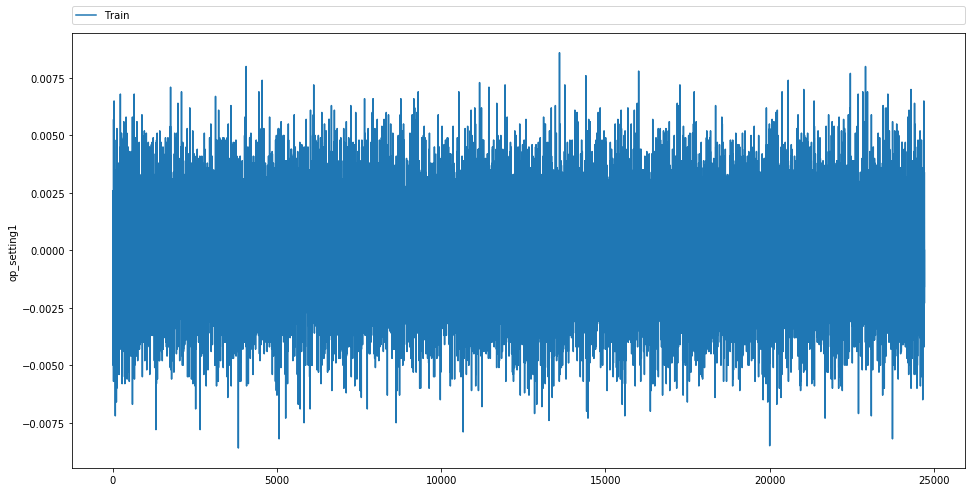

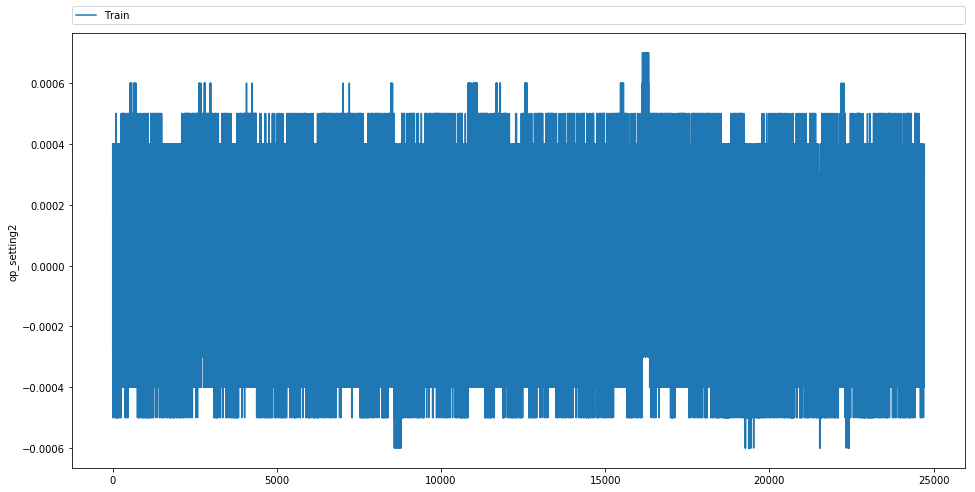

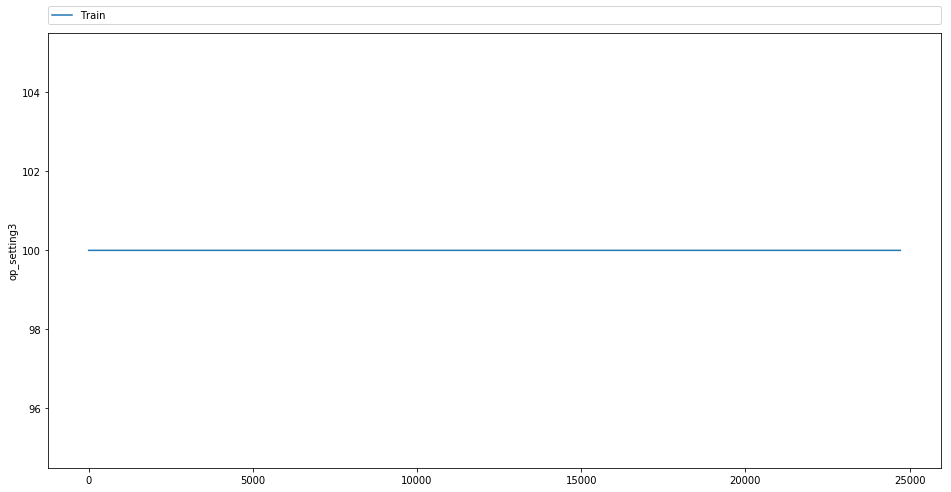

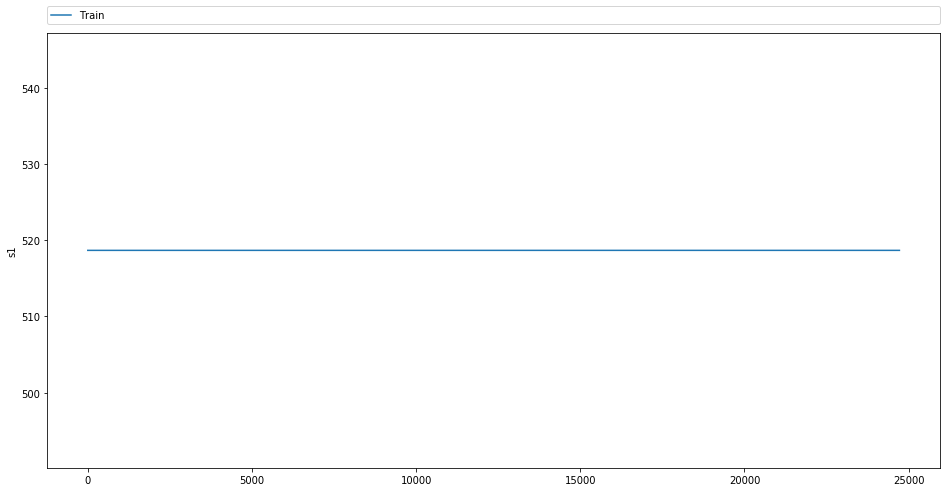

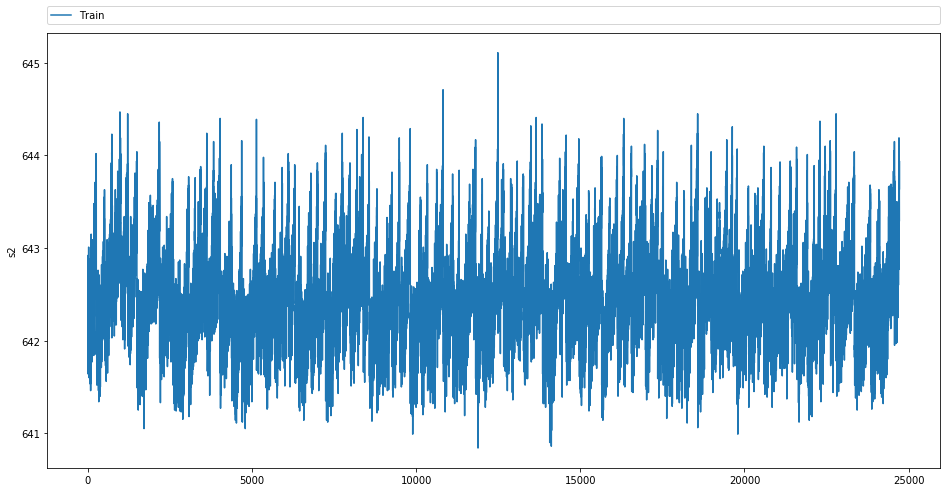

...

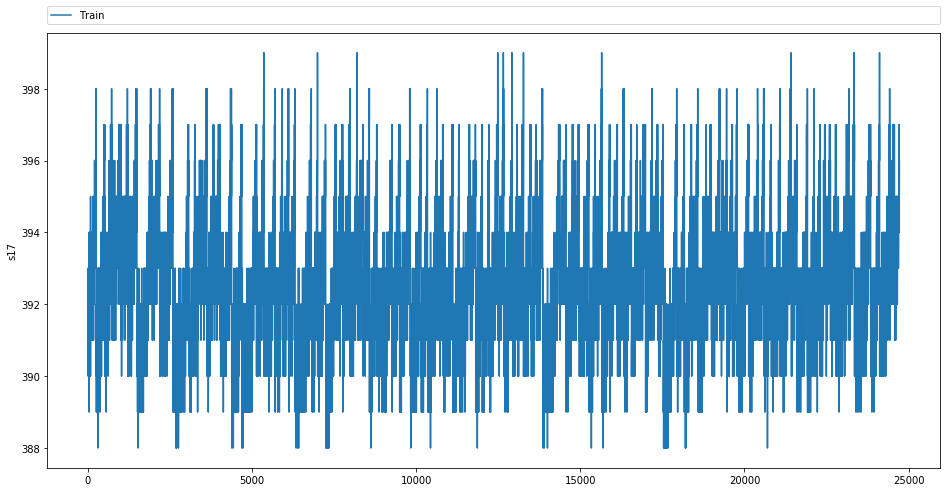

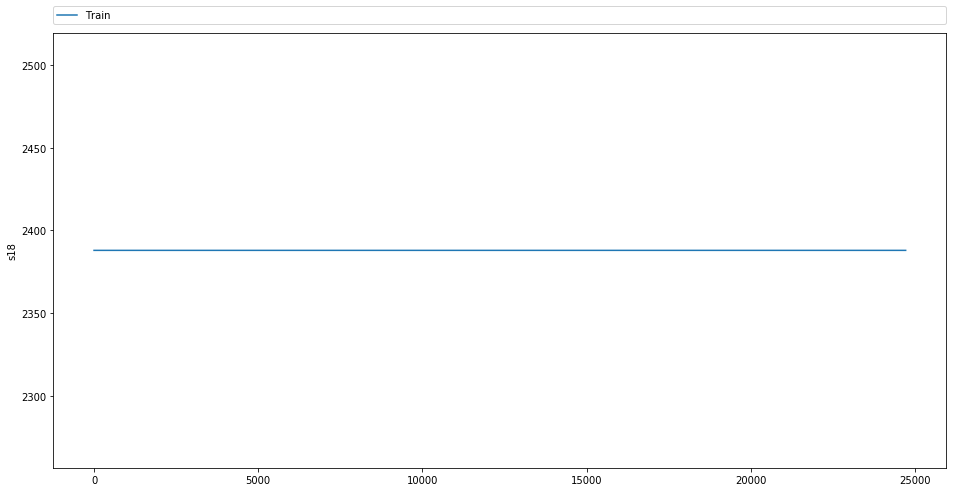

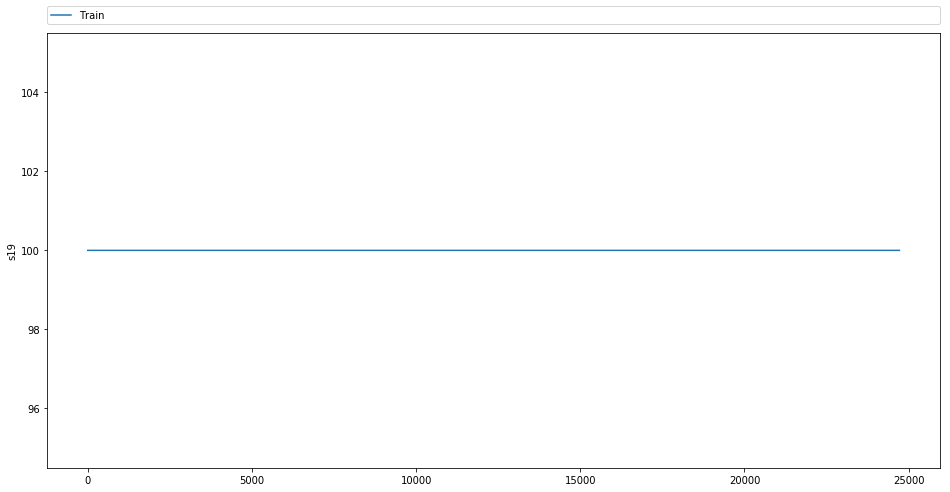

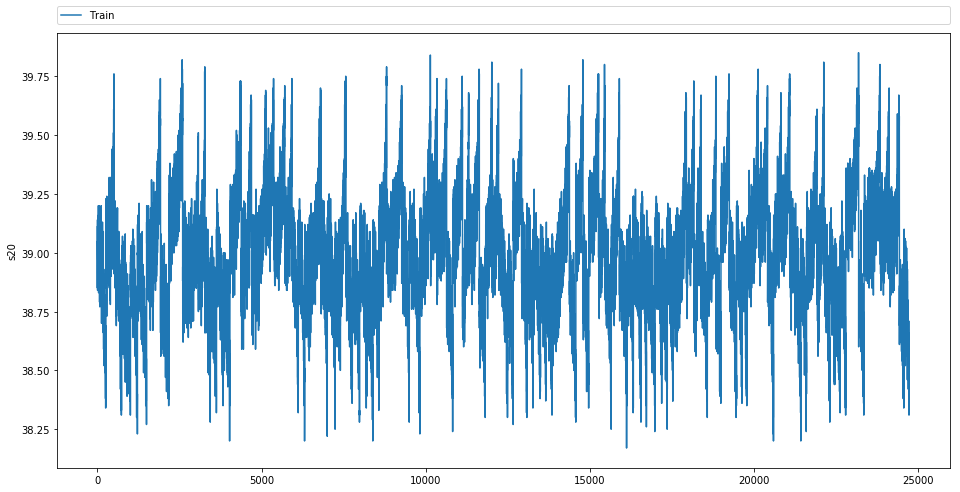

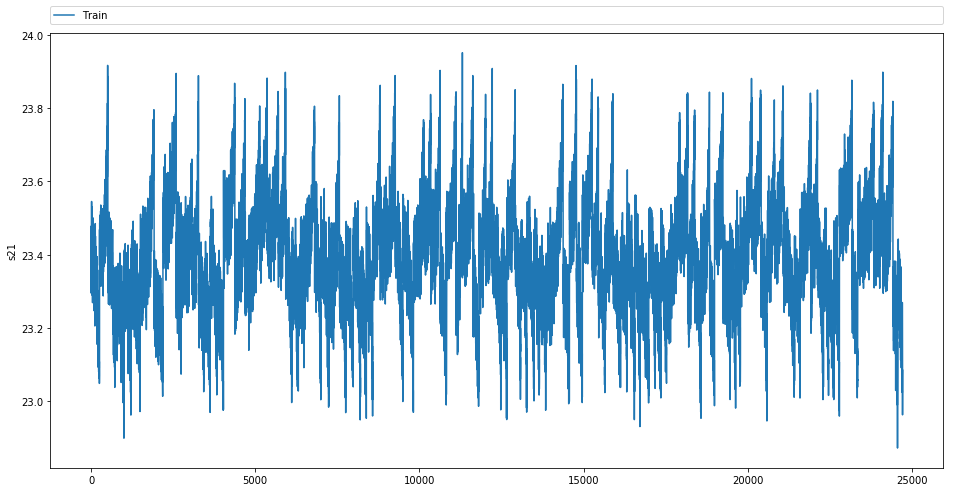

In [50]:
for feature in train.drop(columns = ["unit", "cycles"]).columns:
    fig = plt.figure(figsize = (16, 8))
    plt.plot(train[feature])
    plt.legend(['Train'], bbox_to_anchor=(0., 1.02, 1., .102), loc=3, mode="expand", borderaxespad=0)
    plt.ylabel(feature)
    plt.show()

In [51]:
cyc1 = feature_prepare_by_diff(train, "unit", 1)
cyc2 = feature_prepare_by_diff(train, "unit", 2)
cyc3 = feature_prepare_by_diff(train, "unit", 3)
cyc4 = feature_prepare_by_diff(train, "unit", 4)
cyc5 = feature_prepare_by_diff(train, "unit", 5)
cyc6 = feature_prepare_by_diff(train, "unit", 6)
cyc7 = feature_prepare_by_diff(train, "unit", 7)
cyc8 = feature_prepare_by_diff(train, "unit", 8)
cyc9 = feature_prepare_by_diff(train, "unit", 9)
cyc10 = feature_prepare_by_diff(train, "unit", 10)

train_diff = pd.concat([cyc1, cyc2, cyc3, cyc4, cyc5, cyc6, cyc7, cyc8, cyc9, cyc10], axis = 1)
train_diff.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [52]:
cyc1 = feature_prepare_by_diff(test, "unit", 1)
cyc2 = feature_prepare_by_diff(test, "unit", 2)
cyc3 = feature_prepare_by_diff(test, "unit", 3)
cyc4 = feature_prepare_by_diff(test, "unit", 4)
cyc5 = feature_prepare_by_diff(test, "unit", 5)
cyc6 = feature_prepare_by_diff(test, "unit", 6)
cyc7 = feature_prepare_by_diff(test, "unit", 7)
cyc8 = feature_prepare_by_diff(test, "unit", 8)
cyc9 = feature_prepare_by_diff(test, "unit", 9)
cyc10 = feature_prepare_by_diff(test, "unit", 10)

test_diff = pd.concat([cyc1, cyc2, cyc3, cyc4, cyc5, cyc6, cyc7, cyc8, cyc9, cyc10], axis = 1)
test_diff.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [53]:
train_mean = feature_prepare_by_mean(train, "unit")
train_mean.head()

,unit_mean_of_feature,cycles_mean_of_feature,op_setting1_mean_of_feature,op_setting2_mean_of_feature,op_setting3_mean_of_feature,s1_mean_of_feature,s2_mean_of_feature,s3_mean_of_feature,s4_mean_of_feature,s5_mean_of_feature,s6_mean_of_feature,s7_mean_of_feature,s8_mean_of_feature,s9_mean_of_feature,s10_mean_of_feature,s11_mean_of_feature,s12_mean_of_feature,s13_mean_of_feature,s14_mean_of_feature,s15_mean_of_feature,s16_mean_of_feature,s17_mean_of_feature,s18_mean_of_feature,s19_mean_of_feature,s20_mean_of_feature,s21_mean_of_feature
0,1.0,130.0,0.000102,-0.000050,100.0,518.67,642.573320,1589.227027,1406.597915,14.62,21.609653,553.613166,2388.064788,9071.174208,1.300000,47.462046,521.666564,2388.064788,8149.744324,8.432769,0.03,392.934363,2388.0,100.0,38.857683,23.321745
1,2.0,127.0,0.000135,0.000047,100.0,518.67,642.231621,1585.934822,1400.311976,14.62,21.576047,556.435138,2388.060632,9063.079605,1.301937,47.289209,524.250237,2388.064071,8145.411028,8.355038,0.03,392.055336,2388.0,100.0,39.136680,23.478945
2,3.0,111.5,0.000187,0.000067,100.0,518.67,642.581892,1588.531351,1405.705450,14.62,21.609730,553.714730,2388.073829,9063.696081,1.300000,47.454595,521.701486,2388.072973,8143.492162,8.429477,0.03,392.801802,2388.0,100.0,38.864730,23.322539
3,4.0,136.5,-0.000017,-0.000014,100.0,518.67,642.966801,1593.218971,1415.215588,14.62,21.610000,552.760735,2388.166654,9049.099743,1.300000,47.719706,520.869779,2388.166029,8127.472684,8.466885,0.03,393.992647,2388.0,100.0,38.727390,23.225493
4,5.0,107.0,0.000078,-0.000039,100.0,518.67,642.869202,1592.133662,1411.739859,14.62,21.610000,553.082958,2388.127371,9061.209484,1.300000,47.634507,521.133944,2388.131127,8139.039249,8.453891,0.03,393.633803,2388.0,100.0,38.761925,23.255000


In [54]:
test_mean = feature_prepare_by_mean(test, "unit")
test_mean.head()

,unit_mean_of_feature,cycles_mean_of_feature,op_setting1_mean_of_feature,op_setting2_mean_of_feature,op_setting3_mean_of_feature,s1_mean_of_feature,s2_mean_of_feature,s3_mean_of_feature,s4_mean_of_feature,s5_mean_of_feature,s6_mean_of_feature,s7_mean_of_feature,s8_mean_of_feature,s9_mean_of_feature,s10_mean_of_feature,s11_mean_of_feature,s12_mean_of_feature,s13_mean_of_feature,s14_mean_of_feature,s15_mean_of_feature,s16_mean_of_feature,s17_mean_of_feature,s18_mean_of_feature,s19_mean_of_feature,s20_mean_of_feature,s21_mean_of_feature
0,1.0,117.0,-0.000016,-0.000011,100.0,518.67,642.193391,1584.928112,1398.206524,14.62,21.581845,555.754592,2388.032060,9059.957682,1.300858,47.233691,523.593476,2388.033433,8142.051717,8.364057,0.03,391.579399,2388.0,100.0,39.104464,23.457124
1,2.0,62.5,-0.000506,-0.000002,100.0,518.67,642.542097,1588.658226,1407.010968,14.62,21.609839,553.571613,2388.111855,9046.960161,1.300000,47.480968,521.499274,2388.107177,8128.122984,8.434469,0.03,392.903226,2388.0,100.0,38.862177,23.314119
2,3.0,117.5,-0.000049,0.000041,100.0,518.67,642.373932,1587.857863,1402.768333,14.62,21.601795,558.286239,2388.126410,9069.107436,1.302650,47.367821,526.062521,2388.129872,8149.635556,8.346155,0.03,392.521368,2388.0,100.0,39.211197,23.540120
3,4.0,34.5,-0.000075,0.000022,100.0,518.67,642.554853,1589.098088,1407.175294,14.62,21.610000,553.553971,2388.093824,9051.673971,1.300000,47.468676,521.592206,2388.098676,8132.596324,8.434937,0.03,393.000000,2388.0,100.0,38.869118,23.314722
4,5.0,69.5,-0.000188,-0.000020,100.0,518.67,642.053406,1579.612609,1396.895942,14.62,21.574493,551.569130,2387.666087,9039.925797,1.299928,47.137899,519.700290,2387.671159,8125.160362,8.413896,0.03,390.115942,2388.0,100.0,38.871304,23.326915


In [55]:
train_std = feature_prepare_by_std(train, "unit")
train_std.head()

,unit_std_of_feature,cycles_std_of_feature,op_setting1_std_of_feature,op_setting2_std_of_feature,op_setting3_std_of_feature,s1_std_of_feature,s2_std_of_feature,s3_std_of_feature,s4_std_of_feature,s5_std_of_feature,s6_std_of_feature,s7_std_of_feature,s8_std_of_feature,s9_std_of_feature,s10_std_of_feature,s11_std_of_feature,s12_std_of_feature,s13_std_of_feature,s14_std_of_feature,s15_std_of_feature,s16_std_of_feature,s17_std_of_feature,s18_std_of_feature,s19_std_of_feature,s20_std_of_feature,s21_std_of_feature
0,0.0,74.911058,0.002378,0.000288,0.0,1.139069e-12,0.512974,5.846577,9.646298,7.653123e-14,1.834981e-03,0.912884,0.072322,4.801903,6.229286e-15,0.278438,0.755224,0.072231,3.093943,0.036373,7.995178e-17,1.647037,0.0,0.0,0.191307,0.109115
1,0.0,73.179004,0.002363,0.000280,0.0,1.366946e-12,0.430092,6.526279,8.523418,7.653475e-14,4.898749e-03,3.780733,0.137568,18.787571,4.058593e-03,0.291123,3.582721,0.141341,14.413888,0.042942,7.300280e-17,1.663360,0.0,0.0,0.181773,0.111618
2,0.0,64.230055,0.002334,0.000302,0.0,1.481269e-12,0.513747,6.039755,9.594150,7.121485e-14,1.625286e-03,0.880752,0.062041,10.837193,5.341114e-15,0.264213,0.704888,0.061653,7.139037,0.037642,4.868203e-17,1.607785,0.0,0.0,0.186015,0.108942
3,0.0,78.663842,0.002090,0.000286,0.0,4.555856e-13,0.416478,4.883964,6.994157,7.830377e-14,7.118525e-14,0.702983,0.057174,4.010307,6.451163e-15,0.197024,0.594839,0.057472,3.779305,0.028739,6.604100e-17,1.294304,0.0,0.0,0.153482,0.085508
4,0.0,61.631972,0.002183,0.000297,0.0,1.481410e-12,0.432110,5.575543,8.099243,6.944112e-14,3.561083e-15,0.707940,0.036545,17.491059,5.119057e-15,0.213794,0.535932,0.044485,13.463294,0.030895,4.173144e-17,1.344866,0.0,0.0,0.159002,0.090047


In [56]:
test_std = feature_prepare_by_std(test, "unit")
test_std.head()

,unit_std_of_feature,cycles_std_of_feature,op_setting1_std_of_feature,op_setting2_std_of_feature,op_setting3_std_of_feature,s1_std_of_feature,s2_std_of_feature,s3_std_of_feature,s4_std_of_feature,s5_std_of_feature,s6_std_of_feature,s7_std_of_feature,s8_std_of_feature,s9_std_of_feature,s10_std_of_feature,s11_std_of_feature,s12_std_of_feature,s13_std_of_feature,s14_std_of_feature,s15_std_of_feature,s16_std_of_feature,s17_std_of_feature,s18_std_of_feature,s19_std_of_feature,s20_std_of_feature,s21_std_of_feature
0,0.0,67.405489,0.002155,0.000302,0.0,1.481111e-12,0.370289,4.619579,5.424164,7.298742e-14,3.997002e-03,1.712445,0.064508,8.996628,2.807261e-03,0.160900,1.657543,0.064268,6.848421,0.025045,5.910757e-17,1.127213,0.0,0.0,0.118055,0.072123
1,0.0,35.939764,0.002353,0.000284,0.0,1.255628e-12,0.306953,4.155597,4.772123,4.458908e-14,1.264828e-03,0.468640,0.033938,4.091239,8.917816e-16,0.123007,0.406158,0.037861,3.102313,0.020144,7.663748e-17,1.047019,0.0,0.0,0.101593,0.068810
2,0.0,67.694165,0.002273,0.000289,0.0,1.481097e-12,0.316374,5.267774,5.362282,7.298675e-14,3.845824e-03,1.807704,0.076056,10.245078,4.422565e-03,0.163134,1.749025,0.072286,7.654584,0.028378,5.910703e-17,1.135448,0.0,0.0,0.131852,0.072119
3,0.0,19.773720,0.002187,0.000294,0.0,8.017247e-13,0.278270,4.379379,3.278688,3.579128e-15,2.147477e-14,0.449767,0.031387,3.679477,1.565869e-15,0.104094,0.266927,0.029620,3.084994,0.022530,2.097145e-17,0.977356,0.0,0.0,0.104421,0.058762
4,0.0,39.981246,0.002225,0.000278,0.0,1.255111e-12,0.295584,4.565141,4.504299,5.170202e-14,4.992325e-03,1.132874,0.257799,6.627311,8.512565e-04,0.130705,0.968738,0.252335,6.138615,0.026630,7.312381e-17,0.974660,0.0,0.0,0.123907,0.081267


In [57]:
train_median = feature_prepare_by_median(train, "unit")
train_median.head()

,unit_median_of_feature,cycles_median_of_feature,op_setting1_median_of_feature,op_setting2_median_of_feature,op_setting3_median_of_feature,s1_median_of_feature,s2_median_of_feature,s3_median_of_feature,s4_median_of_feature,s5_median_of_feature,s6_median_of_feature,s7_median_of_feature,s8_median_of_feature,s9_median_of_feature,s10_median_of_feature,s11_median_of_feature,s12_median_of_feature,s13_median_of_feature,s14_median_of_feature,s15_median_of_feature,s16_median_of_feature,s17_median_of_feature,s18_median_of_feature,s19_median_of_feature,s20_median_of_feature,s21_median_of_feature
0,1.0,130.0,0.00020,-0.0001,100.0,518.67,642.490,1588.280,1404.390,14.62,21.61,553.81,2388.05,9071.260,1.3,47.370,521.86,2388.04,8149.970,8.4285,0.03,393.0,2388.0,100.0,38.90,23.33900
1,2.0,127.0,0.00010,0.0001,100.0,518.67,642.150,1585.040,1398.350,14.62,21.58,554.71,2388.01,9055.670,1.3,47.200,522.70,2388.02,8139.890,8.3668,0.03,392.0,2388.0,100.0,39.11,23.44950
2,3.0,111.5,0.00035,0.0000,100.0,518.67,642.520,1587.745,1402.760,14.62,21.61,553.89,2388.06,9061.320,1.3,47.365,521.89,2388.06,8142.305,8.4215,0.03,393.0,2388.0,100.0,38.91,23.34305
3,4.0,136.5,0.00000,0.0000,100.0,518.67,642.905,1592.705,1414.075,14.62,21.61,552.88,2388.16,9048.725,1.3,47.680,520.94,2388.16,8127.690,8.4658,0.03,394.0,2388.0,100.0,38.75,23.23035
4,5.0,107.0,0.00010,-0.0000,100.0,518.67,642.840,1591.800,1410.280,14.62,21.61,553.24,2388.13,9054.660,1.3,47.590,521.20,2388.13,8134.560,8.4505,0.03,394.0,2388.0,100.0,38.78,23.26960


In [58]:
test_median = feature_prepare_by_median(test, "unit")
test_median.head()

,unit_median_of_feature,cycles_median_of_feature,op_setting1_median_of_feature,op_setting2_median_of_feature,op_setting3_median_of_feature,s1_median_of_feature,s2_median_of_feature,s3_median_of_feature,s4_median_of_feature,s5_median_of_feature,s6_median_of_feature,s7_median_of_feature,s8_median_of_feature,s9_median_of_feature,s10_median_of_feature,s11_median_of_feature,s12_median_of_feature,s13_median_of_feature,s14_median_of_feature,s15_median_of_feature,s16_median_of_feature,s17_median_of_feature,s18_median_of_feature,s19_median_of_feature,s20_median_of_feature,s21_median_of_feature
0,1.0,117.0,-0.00020,-0.00000,100.0,518.67,642.160,1584.530,1398.100,14.62,21.58,555.210,2388.020,9058.32,1.3,47.210,522.990,2388.020,8140.250,8.36780,0.03,391.0,2388.0,100.0,39.100,23.45240
1,2.0,62.5,-0.00050,0.00000,100.0,518.67,642.540,1588.315,1406.950,14.62,21.61,553.600,2388.110,9047.12,1.3,47.490,521.525,2388.110,8128.015,8.43375,0.03,393.0,2388.0,100.0,38.855,23.31420
2,3.0,117.5,-0.00005,0.00005,100.0,518.67,642.370,1587.700,1402.150,14.62,21.60,557.605,2388.110,9066.12,1.3,47.340,525.355,2388.110,8147.245,8.34860,0.03,392.0,2388.0,100.0,39.210,23.53740
3,4.0,34.5,-0.00000,-0.00000,100.0,518.67,642.535,1588.590,1407.305,14.62,21.61,553.565,2388.095,9051.48,1.3,47.485,521.600,2388.100,8132.180,8.43420,0.03,393.0,2388.0,100.0,38.870,23.30970
4,5.0,69.5,0.00005,0.00000,100.0,518.67,642.085,1579.900,1397.145,14.62,21.57,551.225,2387.645,9039.22,1.3,47.155,519.270,2387.655,8123.840,8.41460,0.03,390.0,2388.0,100.0,38.870,23.31315


In [59]:
slp1 = feature_prepare_by_slope(train, "unit", 1, 0)
slp2 = feature_prepare_by_slope(train, "unit", 2, 0)
slp3 = feature_prepare_by_slope(train, "unit", 3, 0)
slp4 = feature_prepare_by_slope(train, "unit", 4, 0)
slp5 = feature_prepare_by_slope(train, "unit", 5, 0)
slp6 = feature_prepare_by_slope(train, "unit", 6, 0)
slp7 = feature_prepare_by_slope(train, "unit", 7, 0)
slp8 = feature_prepare_by_slope(train, "unit", 8, 0)
slp9 = feature_prepare_by_slope(train, "unit", 9, 0)
slp10 = feature_prepare_by_slope(train, "unit", 10, 0)

train_slope_0 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
train_slope_0.head()

,unit_slope_of_1_cycle_0,cycles_slope_of_1_cycle_0,op_setting1_slope_of_1_cycle_0,op_setting2_slope_of_1_cycle_0,op_setting3_slope_of_1_cycle_0,s1_slope_of_1_cycle_0,s2_slope_of_1_cycle_0,s3_slope_of_1_cycle_0,s4_slope_of_1_cycle_0,s5_slope_of_1_cycle_0,s6_slope_of_1_cycle_0,s7_slope_of_1_cycle_0,s8_slope_of_1_cycle_0,s9_slope_of_1_cycle_0,s10_slope_of_1_cycle_0,s11_slope_of_1_cycle_0,s12_slope_of_1_cycle_0,s13_slope_of_1_cycle_0,s14_slope_of_1_cycle_0,s15_slope_of_1_cycle_0,s16_slope_of_1_cycle_0,s17_slope_of_1_cycle_0,s18_slope_of_1_cycle_0,s19_slope_of_1_cycle_0,s20_slope_of_1_cycle_0,s21_slope_of_1_cycle_0,unit_slope_of_2_cycle_0,cycles_slope_of_2_cycle_0,op_setting1_slope_of_2_cycle_0,op_setting2_slope_of_2_cycle_0,op_setting3_slope_of_2_cycle_0,s1_slope_of_2_cycle_0,s2_slope_of_2_cycle_0,s3_slope_of_2_cycle_0,s4_slope_of_2_cycle_0,s5_slope_of_2_cycle_0,s6_slope_of_2_cycle_0,s7_slope_of_2_cycle_0,s8_slope_of_2_cycle_0,s9_slope_of_2_cycle_0,s10_slope_of_2_cycle_0,s11_slope_of_2_cycle_0,s12_slope_of_2_cycle_0,s13_slope_of_2_cycle_0,s14_slope_of_2_cycle_0,s15_slope_of_2_cycle_0,s16_slope_of_2_cycle_0,s17_slope_of_2_cycle_0,s18_slope_of_2_cycle_0,s19_slope_of_2_cycle_0,s20_slope_of_2_cycle_0,s21_slope_of_2_cycle_0,unit_slope_of_3_cycle_0,cycles_slope_of_3_cycle_0,op_setting1_slope_of_3_cycle_0,op_setting2_slope_of_3_cycle_0,op_setting3_slope_of_3_cycle_0,s1_slope_of_3_cycle_0,s2_slope_of_3_cycle_0,s3_slope_of_3_cycle_0,s4_slope_of_3_cycle_0,s5_slope_of_3_cycle_0,s6_slope_of_3_cycle_0,s7_slope_of_3_cycle_0,s8_slope_of_3_cycle_0,s9_slope_of_3_cycle_0,s10_slope_of_3_cycle_0,s11_slope_of_3_cycle_0,s12_slope_of_3_cycle_0,s13_slope_of_3_cycle_0,s14_slope_of_3_cycle_0,s15_slope_of_3_cycle_0,s16_slope_of_3_cycle_0,s17_slope_of_3_cycle_0,s18_slope_of_3_cycle_0,s19_slope_of_3_cycle_0,s20_slope_of_3_cycle_0,s21_slope_of_3_cycle_0,unit_slope_of_4_cycle_0,cycles_slope_of_4_cycle_0,op_setting1_slope_of_4_cycle_0,op_setting2_slope_of_4_cycle_0,op_setting3_slope_of_4_cycle_0,s1_slope_of_4_cycle_0,s2_slope_of_4_cycle_0,s3_slope_of_4_cycle_0,s4_slope_of_4_cycle_0,s5_slope_of_4_cycle_0,s6_slope_of_4_cycle_0,s7_slope_of_4_cycle_0,s8_slope_of_4_cycle_0,s9_slope_of_4_cycle_0,s10_slope_of_4_cycle_0,s11_slope_of_4_cycle_0,s12_slope_of_4_cycle_0,s13_slope_of_4_cycle_0,s14_slope_of_4_cycle_0,s15_slope_of_4_cycle_0,s16_slope_of_4_cycle_0,s17_slope_of_4_cycle_0,s18_slope_of_4_cycle_0,s19_slope_of_4_cycle_0,s20_slope_of_4_cycle_0,s21_slope_of_4_cycle_0,unit_slope_of_5_cycle_0,cycles_slope_of_5_cycle_0,op_setting1_slope_of_5_cycle_0,op_setting2_slope_of_5_cycle_0,op_setting3_slope_of_5_cycle_0,s1_slope_of_5_cycle_0,s2_slope_of_5_cycle_0,s3_slope_of_5_cycle_0,s4_slope_of_5_cycle_0,s5_slope_of_5_cycle_0,s6_slope_of_5_cycle_0,s7_slope_of_5_cycle_0,s8_slope_of_5_cycle_0,s9_slope_of_5_cycle_0,s10_slope_of_5_cycle_0,s11_slope_of_5_cycle_0,s12_slope_of_5_cycle_0,s13_slope_of_5_cycle_0,s14_slope_of_5_cycle_0,s15_slope_of_5_cycle_0,s16_slope_of_5_cycle_0,s17_slope_of_5_cycle_0,s18_slope_of_5_cycle_0,s19_slope_of_5_cycle_0,s20_slope_of_5_cycle_0,s21_slope_of_5_cycle_0,unit_slope_of_6_cycle_0,cycles_slope_of_6_cycle_0,op_setting1_slope_of_6_cycle_0,op_setting2_slope_of_6_cycle_0,op_setting3_slope_of_6_cycle_0,s1_slope_of_6_cycle_0,s2_slope_of_6_cycle_0,s3_slope_of_6_cycle_0,s4_slope_of_6_cycle_0,s5_slope_of_6_cycle_0,s6_slope_of_6_cycle_0,s7_slope_of_6_cycle_0,s8_slope_of_6_cycle_0,s9_slope_of_6_cycle_0,s10_slope_of_6_cycle_0,s11_slope_of_6_cycle_0,s12_slope_of_6_cycle_0,s13_slope_of_6_cycle_0,s14_slope_of_6_cycle_0,s15_slope_of_6_cycle_0,s16_slope_of_6_cycle_0,s17_slope_of_6_cycle_0,s18_slope_of_6_cycle_0,s19_slope_of_6_cycle_0,s20_slope_of_6_cycle_0,s21_slope_of_6_cycle_0,unit_slope_of_7_cycle_0,cycles_slope_of_7_cycle_0,op_setting1_slope_of_7_cycle_0,op_setting2_slope_of_7_cycle_0,op_setting3_slope_of_7_cycle_0,s1_slope_of_7_cycle_0,s2_slope_of_7_cycle_0,s3_slope_of_7_cycle_0,s4_slope_of_7_cycle_0,s5_slope_of_7_cycle_0,s6_slope_of_7_cycle_0,s7_slope_of_7_cycle_0,

In [60]:
slp1 = feature_prepare_by_slope(train, "unit", 1, 1)
slp2 = feature_prepare_by_slope(train, "unit", 2, 1)
slp3 = feature_prepare_by_slope(train, "unit", 3, 1)
slp4 = feature_prepare_by_slope(train, "unit", 4, 1)
slp5 = feature_prepare_by_slope(train, "unit", 5, 1)
slp6 = feature_prepare_by_slope(train, "unit", 6, 1)
slp7 = feature_prepare_by_slope(train, "unit", 7, 1)
slp8 = feature_prepare_by_slope(train, "unit", 8, 1)
slp9 = feature_prepare_by_slope(train, "unit", 9, 1)
slp10 = feature_prepare_by_slope(train, "unit", 10, 1)

train_slope_1 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
train_slope_1.head()

,unit_slope_of_1_cycle_1,cycles_slope_of_1_cycle_1,op_setting1_slope_of_1_cycle_1,op_setting2_slope_of_1_cycle_1,op_setting3_slope_of_1_cycle_1,s1_slope_of_1_cycle_1,s2_slope_of_1_cycle_1,s3_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s5_slope_of_1_cycle_1,s6_slope_of_1_cycle_1,s7_slope_of_1_cycle_1,s8_slope_of_1_cycle_1,s9_slope_of_1_cycle_1,s10_slope_of_1_cycle_1,s11_slope_of_1_cycle_1,s12_slope_of_1_cycle_1,s13_slope_of_1_cycle_1,s14_slope_of_1_cycle_1,s15_slope_of_1_cycle_1,s16_slope_of_1_cycle_1,s17_slope_of_1_cycle_1,s18_slope_of_1_cycle_1,s19_slope_of_1_cycle_1,s20_slope_of_1_cycle_1,s21_slope_of_1_cycle_1,unit_slope_of_2_cycle_1,cycles_slope_of_2_cycle_1,op_setting1_slope_of_2_cycle_1,op_setting2_slope_of_2_cycle_1,op_setting3_slope_of_2_cycle_1,s1_slope_of_2_cycle_1,s2_slope_of_2_cycle_1,s3_slope_of_2_cycle_1,s4_slope_of_2_cycle_1,s5_slope_of_2_cycle_1,s6_slope_of_2_cycle_1,s7_slope_of_2_cycle_1,s8_slope_of_2_cycle_1,s9_slope_of_2_cycle_1,s10_slope_of_2_cycle_1,s11_slope_of_2_cycle_1,s12_slope_of_2_cycle_1,s13_slope_of_2_cycle_1,s14_slope_of_2_cycle_1,s15_slope_of_2_cycle_1,s16_slope_of_2_cycle_1,s17_slope_of_2_cycle_1,s18_slope_of_2_cycle_1,s19_slope_of_2_cycle_1,s20_slope_of_2_cycle_1,s21_slope_of_2_cycle_1,unit_slope_of_3_cycle_1,cycles_slope_of_3_cycle_1,op_setting1_slope_of_3_cycle_1,op_setting2_slope_of_3_cycle_1,op_setting3_slope_of_3_cycle_1,s1_slope_of_3_cycle_1,s2_slope_of_3_cycle_1,s3_slope_of_3_cycle_1,s4_slope_of_3_cycle_1,s5_slope_of_3_cycle_1,s6_slope_of_3_cycle_1,s7_slope_of_3_cycle_1,s8_slope_of_3_cycle_1,s9_slope_of_3_cycle_1,s10_slope_of_3_cycle_1,s11_slope_of_3_cycle_1,s12_slope_of_3_cycle_1,s13_slope_of_3_cycle_1,s14_slope_of_3_cycle_1,s15_slope_of_3_cycle_1,s16_slope_of_3_cycle_1,s17_slope_of_3_cycle_1,s18_slope_of_3_cycle_1,s19_slope_of_3_cycle_1,s20_slope_of_3_cycle_1,s21_slope_of_3_cycle_1,unit_slope_of_4_cycle_1,cycles_slope_of_4_cycle_1,op_setting1_slope_of_4_cycle_1,op_setting2_slope_of_4_cycle_1,op_setting3_slope_of_4_cycle_1,s1_slope_of_4_cycle_1,s2_slope_of_4_cycle_1,s3_slope_of_4_cycle_1,s4_slope_of_4_cycle_1,s5_slope_of_4_cycle_1,s6_slope_of_4_cycle_1,s7_slope_of_4_cycle_1,s8_slope_of_4_cycle_1,s9_slope_of_4_cycle_1,s10_slope_of_4_cycle_1,s11_slope_of_4_cycle_1,s12_slope_of_4_cycle_1,s13_slope_of_4_cycle_1,s14_slope_of_4_cycle_1,s15_slope_of_4_cycle_1,s16_slope_of_4_cycle_1,s17_slope_of_4_cycle_1,s18_slope_of_4_cycle_1,s19_slope_of_4_cycle_1,s20_slope_of_4_cycle_1,s21_slope_of_4_cycle_1,unit_slope_of_5_cycle_1,cycles_slope_of_5_cycle_1,op_setting1_slope_of_5_cycle_1,op_setting2_slope_of_5_cycle_1,op_setting3_slope_of_5_cycle_1,s1_slope_of_5_cycle_1,s2_slope_of_5_cycle_1,s3_slope_of_5_cycle_1,s4_slope_of_5_cycle_1,s5_slope_of_5_cycle_1,s6_slope_of_5_cycle_1,s7_slope_of_5_cycle_1,s8_slope_of_5_cycle_1,s9_slope_of_5_cycle_1,s10_slope_of_5_cycle_1,s11_slope_of_5_cycle_1,s12_slope_of_5_cycle_1,s13_slope_of_5_cycle_1,s14_slope_of_5_cycle_1,s15_slope_of_5_cycle_1,s16_slope_of_5_cycle_1,s17_slope_of_5_cycle_1,s18_slope_of_5_cycle_1,s19_slope_of_5_cycle_1,s20_slope_of_5_cycle_1,s21_slope_of_5_cycle_1,unit_slope_of_6_cycle_1,cycles_slope_of_6_cycle_1,op_setting1_slope_of_6_cycle_1,op_setting2_slope_of_6_cycle_1,op_setting3_slope_of_6_cycle_1,s1_slope_of_6_cycle_1,s2_slope_of_6_cycle_1,s3_slope_of_6_cycle_1,s4_slope_of_6_cycle_1,s5_slope_of_6_cycle_1,s6_slope_of_6_cycle_1,s7_slope_of_6_cycle_1,s8_slope_of_6_cycle_1,s9_slope_of_6_cycle_1,s10_slope_of_6_cycle_1,s11_slope_of_6_cycle_1,s12_slope_of_6_cycle_1,s13_slope_of_6_cycle_1,s14_slope_of_6_cycle_1,s15_slope_of_6_cycle_1,s16_slope_of_6_cycle_1,s17_slope_of_6_cycle_1,s18_slope_of_6_cycle_1,s19_slope_of_6_cycle_1,s20_slope_of_6_cycle_1,s21_slope_of_6_cycle_1,unit_slope_of_7_cycle_1,cycles_slope_of_7_cycle_1,op_setting1_slope_of_7_cycle_1,op_setting2_slope_of_7_cycle_1,op_setting3_slope_of_7_cycle_1,s1_slope_of_7_cycle_1,s2_slope_of_7_cycle_1,s3_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,s5_slope_of_7_cycle_1,s6_slope_of_7_cycle_1,s7_slope_of_7_cycle_1,

In [61]:
slp1 = feature_prepare_by_slope(test, "unit", 1, 0)
slp2 = feature_prepare_by_slope(test, "unit", 2, 0)
slp3 = feature_prepare_by_slope(test, "unit", 3, 0)
slp4 = feature_prepare_by_slope(test, "unit", 4, 0)
slp5 = feature_prepare_by_slope(test, "unit", 5, 0)
slp6 = feature_prepare_by_slope(test, "unit", 6, 0)
slp7 = feature_prepare_by_slope(test, "unit", 7, 0)
slp8 = feature_prepare_by_slope(test, "unit", 8, 0)
slp9 = feature_prepare_by_slope(test, "unit", 9, 0)
slp10 = feature_prepare_by_slope(test, "unit", 10, 0)

test_slope_0 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
test_slope_0.head()

,unit_slope_of_1_cycle_0,cycles_slope_of_1_cycle_0,op_setting1_slope_of_1_cycle_0,op_setting2_slope_of_1_cycle_0,op_setting3_slope_of_1_cycle_0,s1_slope_of_1_cycle_0,s2_slope_of_1_cycle_0,s3_slope_of_1_cycle_0,s4_slope_of_1_cycle_0,s5_slope_of_1_cycle_0,s6_slope_of_1_cycle_0,s7_slope_of_1_cycle_0,s8_slope_of_1_cycle_0,s9_slope_of_1_cycle_0,s10_slope_of_1_cycle_0,s11_slope_of_1_cycle_0,s12_slope_of_1_cycle_0,s13_slope_of_1_cycle_0,s14_slope_of_1_cycle_0,s15_slope_of_1_cycle_0,s16_slope_of_1_cycle_0,s17_slope_of_1_cycle_0,s18_slope_of_1_cycle_0,s19_slope_of_1_cycle_0,s20_slope_of_1_cycle_0,s21_slope_of_1_cycle_0,unit_slope_of_2_cycle_0,cycles_slope_of_2_cycle_0,op_setting1_slope_of_2_cycle_0,op_setting2_slope_of_2_cycle_0,op_setting3_slope_of_2_cycle_0,s1_slope_of_2_cycle_0,s2_slope_of_2_cycle_0,s3_slope_of_2_cycle_0,s4_slope_of_2_cycle_0,s5_slope_of_2_cycle_0,s6_slope_of_2_cycle_0,s7_slope_of_2_cycle_0,s8_slope_of_2_cycle_0,s9_slope_of_2_cycle_0,s10_slope_of_2_cycle_0,s11_slope_of_2_cycle_0,s12_slope_of_2_cycle_0,s13_slope_of_2_cycle_0,s14_slope_of_2_cycle_0,s15_slope_of_2_cycle_0,s16_slope_of_2_cycle_0,s17_slope_of_2_cycle_0,s18_slope_of_2_cycle_0,s19_slope_of_2_cycle_0,s20_slope_of_2_cycle_0,s21_slope_of_2_cycle_0,unit_slope_of_3_cycle_0,cycles_slope_of_3_cycle_0,op_setting1_slope_of_3_cycle_0,op_setting2_slope_of_3_cycle_0,op_setting3_slope_of_3_cycle_0,s1_slope_of_3_cycle_0,s2_slope_of_3_cycle_0,s3_slope_of_3_cycle_0,s4_slope_of_3_cycle_0,s5_slope_of_3_cycle_0,s6_slope_of_3_cycle_0,s7_slope_of_3_cycle_0,s8_slope_of_3_cycle_0,s9_slope_of_3_cycle_0,s10_slope_of_3_cycle_0,s11_slope_of_3_cycle_0,s12_slope_of_3_cycle_0,s13_slope_of_3_cycle_0,s14_slope_of_3_cycle_0,s15_slope_of_3_cycle_0,s16_slope_of_3_cycle_0,s17_slope_of_3_cycle_0,s18_slope_of_3_cycle_0,s19_slope_of_3_cycle_0,s20_slope_of_3_cycle_0,s21_slope_of_3_cycle_0,unit_slope_of_4_cycle_0,cycles_slope_of_4_cycle_0,op_setting1_slope_of_4_cycle_0,op_setting2_slope_of_4_cycle_0,op_setting3_slope_of_4_cycle_0,s1_slope_of_4_cycle_0,s2_slope_of_4_cycle_0,s3_slope_of_4_cycle_0,s4_slope_of_4_cycle_0,s5_slope_of_4_cycle_0,s6_slope_of_4_cycle_0,s7_slope_of_4_cycle_0,s8_slope_of_4_cycle_0,s9_slope_of_4_cycle_0,s10_slope_of_4_cycle_0,s11_slope_of_4_cycle_0,s12_slope_of_4_cycle_0,s13_slope_of_4_cycle_0,s14_slope_of_4_cycle_0,s15_slope_of_4_cycle_0,s16_slope_of_4_cycle_0,s17_slope_of_4_cycle_0,s18_slope_of_4_cycle_0,s19_slope_of_4_cycle_0,s20_slope_of_4_cycle_0,s21_slope_of_4_cycle_0,unit_slope_of_5_cycle_0,cycles_slope_of_5_cycle_0,op_setting1_slope_of_5_cycle_0,op_setting2_slope_of_5_cycle_0,op_setting3_slope_of_5_cycle_0,s1_slope_of_5_cycle_0,s2_slope_of_5_cycle_0,s3_slope_of_5_cycle_0,s4_slope_of_5_cycle_0,s5_slope_of_5_cycle_0,s6_slope_of_5_cycle_0,s7_slope_of_5_cycle_0,s8_slope_of_5_cycle_0,s9_slope_of_5_cycle_0,s10_slope_of_5_cycle_0,s11_slope_of_5_cycle_0,s12_slope_of_5_cycle_0,s13_slope_of_5_cycle_0,s14_slope_of_5_cycle_0,s15_slope_of_5_cycle_0,s16_slope_of_5_cycle_0,s17_slope_of_5_cycle_0,s18_slope_of_5_cycle_0,s19_slope_of_5_cycle_0,s20_slope_of_5_cycle_0,s21_slope_of_5_cycle_0,unit_slope_of_6_cycle_0,cycles_slope_of_6_cycle_0,op_setting1_slope_of_6_cycle_0,op_setting2_slope_of_6_cycle_0,op_setting3_slope_of_6_cycle_0,s1_slope_of_6_cycle_0,s2_slope_of_6_cycle_0,s3_slope_of_6_cycle_0,s4_slope_of_6_cycle_0,s5_slope_of_6_cycle_0,s6_slope_of_6_cycle_0,s7_slope_of_6_cycle_0,s8_slope_of_6_cycle_0,s9_slope_of_6_cycle_0,s10_slope_of_6_cycle_0,s11_slope_of_6_cycle_0,s12_slope_of_6_cycle_0,s13_slope_of_6_cycle_0,s14_slope_of_6_cycle_0,s15_slope_of_6_cycle_0,s16_slope_of_6_cycle_0,s17_slope_of_6_cycle_0,s18_slope_of_6_cycle_0,s19_slope_of_6_cycle_0,s20_slope_of_6_cycle_0,s21_slope_of_6_cycle_0,unit_slope_of_7_cycle_0,cycles_slope_of_7_cycle_0,op_setting1_slope_of_7_cycle_0,op_setting2_slope_of_7_cycle_0,op_setting3_slope_of_7_cycle_0,s1_slope_of_7_cycle_0,s2_slope_of_7_cycle_0,s3_slope_of_7_cycle_0,s4_slope_of_7_cycle_0,s5_slope_of_7_cycle_0,s6_slope_of_7_cycle_0,s7_slope_of_7_cycle_0,

In [62]:
slp1 = feature_prepare_by_slope(test, "unit", 1, 1)
slp2 = feature_prepare_by_slope(test, "unit", 2, 1)
slp3 = feature_prepare_by_slope(test, "unit", 3, 1)
slp4 = feature_prepare_by_slope(test, "unit", 4, 1)
slp5 = feature_prepare_by_slope(test, "unit", 5, 1)
slp6 = feature_prepare_by_slope(test, "unit", 6, 1)
slp7 = feature_prepare_by_slope(test, "unit", 7, 1)
slp8 = feature_prepare_by_slope(test, "unit", 8, 1)
slp9 = feature_prepare_by_slope(test, "unit", 9, 1)
slp10 = feature_prepare_by_slope(test, "unit", 10, 1)

test_slope_1 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
test_slope_1.head()

,unit_slope_of_1_cycle_1,cycles_slope_of_1_cycle_1,op_setting1_slope_of_1_cycle_1,op_setting2_slope_of_1_cycle_1,op_setting3_slope_of_1_cycle_1,s1_slope_of_1_cycle_1,s2_slope_of_1_cycle_1,s3_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s5_slope_of_1_cycle_1,s6_slope_of_1_cycle_1,s7_slope_of_1_cycle_1,s8_slope_of_1_cycle_1,s9_slope_of_1_cycle_1,s10_slope_of_1_cycle_1,s11_slope_of_1_cycle_1,s12_slope_of_1_cycle_1,s13_slope_of_1_cycle_1,s14_slope_of_1_cycle_1,s15_slope_of_1_cycle_1,s16_slope_of_1_cycle_1,s17_slope_of_1_cycle_1,s18_slope_of_1_cycle_1,s19_slope_of_1_cycle_1,s20_slope_of_1_cycle_1,s21_slope_of_1_cycle_1,unit_slope_of_2_cycle_1,cycles_slope_of_2_cycle_1,op_setting1_slope_of_2_cycle_1,op_setting2_slope_of_2_cycle_1,op_setting3_slope_of_2_cycle_1,s1_slope_of_2_cycle_1,s2_slope_of_2_cycle_1,s3_slope_of_2_cycle_1,s4_slope_of_2_cycle_1,s5_slope_of_2_cycle_1,s6_slope_of_2_cycle_1,s7_slope_of_2_cycle_1,s8_slope_of_2_cycle_1,s9_slope_of_2_cycle_1,s10_slope_of_2_cycle_1,s11_slope_of_2_cycle_1,s12_slope_of_2_cycle_1,s13_slope_of_2_cycle_1,s14_slope_of_2_cycle_1,s15_slope_of_2_cycle_1,s16_slope_of_2_cycle_1,s17_slope_of_2_cycle_1,s18_slope_of_2_cycle_1,s19_slope_of_2_cycle_1,s20_slope_of_2_cycle_1,s21_slope_of_2_cycle_1,unit_slope_of_3_cycle_1,cycles_slope_of_3_cycle_1,op_setting1_slope_of_3_cycle_1,op_setting2_slope_of_3_cycle_1,op_setting3_slope_of_3_cycle_1,s1_slope_of_3_cycle_1,s2_slope_of_3_cycle_1,s3_slope_of_3_cycle_1,s4_slope_of_3_cycle_1,s5_slope_of_3_cycle_1,s6_slope_of_3_cycle_1,s7_slope_of_3_cycle_1,s8_slope_of_3_cycle_1,s9_slope_of_3_cycle_1,s10_slope_of_3_cycle_1,s11_slope_of_3_cycle_1,s12_slope_of_3_cycle_1,s13_slope_of_3_cycle_1,s14_slope_of_3_cycle_1,s15_slope_of_3_cycle_1,s16_slope_of_3_cycle_1,s17_slope_of_3_cycle_1,s18_slope_of_3_cycle_1,s19_slope_of_3_cycle_1,s20_slope_of_3_cycle_1,s21_slope_of_3_cycle_1,unit_slope_of_4_cycle_1,cycles_slope_of_4_cycle_1,op_setting1_slope_of_4_cycle_1,op_setting2_slope_of_4_cycle_1,op_setting3_slope_of_4_cycle_1,s1_slope_of_4_cycle_1,s2_slope_of_4_cycle_1,s3_slope_of_4_cycle_1,s4_slope_of_4_cycle_1,s5_slope_of_4_cycle_1,s6_slope_of_4_cycle_1,s7_slope_of_4_cycle_1,s8_slope_of_4_cycle_1,s9_slope_of_4_cycle_1,s10_slope_of_4_cycle_1,s11_slope_of_4_cycle_1,s12_slope_of_4_cycle_1,s13_slope_of_4_cycle_1,s14_slope_of_4_cycle_1,s15_slope_of_4_cycle_1,s16_slope_of_4_cycle_1,s17_slope_of_4_cycle_1,s18_slope_of_4_cycle_1,s19_slope_of_4_cycle_1,s20_slope_of_4_cycle_1,s21_slope_of_4_cycle_1,unit_slope_of_5_cycle_1,cycles_slope_of_5_cycle_1,op_setting1_slope_of_5_cycle_1,op_setting2_slope_of_5_cycle_1,op_setting3_slope_of_5_cycle_1,s1_slope_of_5_cycle_1,s2_slope_of_5_cycle_1,s3_slope_of_5_cycle_1,s4_slope_of_5_cycle_1,s5_slope_of_5_cycle_1,s6_slope_of_5_cycle_1,s7_slope_of_5_cycle_1,s8_slope_of_5_cycle_1,s9_slope_of_5_cycle_1,s10_slope_of_5_cycle_1,s11_slope_of_5_cycle_1,s12_slope_of_5_cycle_1,s13_slope_of_5_cycle_1,s14_slope_of_5_cycle_1,s15_slope_of_5_cycle_1,s16_slope_of_5_cycle_1,s17_slope_of_5_cycle_1,s18_slope_of_5_cycle_1,s19_slope_of_5_cycle_1,s20_slope_of_5_cycle_1,s21_slope_of_5_cycle_1,unit_slope_of_6_cycle_1,cycles_slope_of_6_cycle_1,op_setting1_slope_of_6_cycle_1,op_setting2_slope_of_6_cycle_1,op_setting3_slope_of_6_cycle_1,s1_slope_of_6_cycle_1,s2_slope_of_6_cycle_1,s3_slope_of_6_cycle_1,s4_slope_of_6_cycle_1,s5_slope_of_6_cycle_1,s6_slope_of_6_cycle_1,s7_slope_of_6_cycle_1,s8_slope_of_6_cycle_1,s9_slope_of_6_cycle_1,s10_slope_of_6_cycle_1,s11_slope_of_6_cycle_1,s12_slope_of_6_cycle_1,s13_slope_of_6_cycle_1,s14_slope_of_6_cycle_1,s15_slope_of_6_cycle_1,s16_slope_of_6_cycle_1,s17_slope_of_6_cycle_1,s18_slope_of_6_cycle_1,s19_slope_of_6_cycle_1,s20_slope_of_6_cycle_1,s21_slope_of_6_cycle_1,unit_slope_of_7_cycle_1,cycles_slope_of_7_cycle_1,op_setting1_slope_of_7_cycle_1,op_setting2_slope_of_7_cycle_1,op_setting3_slope_of_7_cycle_1,s1_slope_of_7_cycle_1,s2_slope_of_7_cycle_1,s3_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,s5_slope_of_7_cycle_1,s6_slope_of_7_cycle_1,s7_slope_of_7_cycle_1,

In [63]:
train_diff.shape, train_mean.shape, train_std.shape, train_median.shape, train_slope_0.shape, train_slope_1.shape

((100, 260), (100, 26), (100, 26), (100, 26), (100, 260), (100, 260))

In [64]:
trainFD003 = pd.concat([train_diff, train_mean, train_std, train_median, train_slope_0, train_slope_1], axis = 1)
trainFD003.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [65]:
testFD003 = pd.concat([test_diff, test_mean, test_std, test_median, test_slope_0, test_slope_1], axis = 1)
testFD003.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [66]:
trainFD003.shape, testFD003.shape

((100, 858), (100, 858))

In [67]:
trainFD003_RUL = train.groupby('unit', as_index=False)['cycles'].max()["cycles"]
trainFD003_RUL.head()

0    259
1    253
2    222
3    272
4    213
Name: cycles, dtype: int64

In [68]:
RUL["more"] = test.groupby('unit', as_index=False)['cycles'].max()["cycles"]
RUL["total"] = RUL[0] + RUL["more"]
RUL.head()

,0,more,total
0,44,233,277
1,51,124,175
2,27,234,261
3,120,68,188
4,101,138,239


In [69]:
testFD003_RUL = RUL["total"]
testFD003_RUL.head()

0    277
1    175
2    261
3    188
4    239
Name: total, dtype: int64

## FD004

In [70]:
train = pd.read_csv('train_FD004.txt', parse_dates=False, delimiter=" ", decimal=".", header=None)
test = pd.read_csv('test_FD004.txt', parse_dates=False, delimiter=" ", decimal=".", header=None)
RUL = pd.read_csv('RUL_FD004.txt', parse_dates=False, decimal=".", header=None)

train.drop(train.columns[[-1,-2]], axis=1, inplace=True)
test.drop(test.columns[[-1,-2]], axis=1, inplace=True)

cols = ['unit', 'cycles', 'op_setting1', 'op_setting2', 'op_setting3', 's1', 's2', 's3', 's4', 's5', 's6', 's7', 's8', 's9', 's10', 's11', 's12', 's13', 's14', 's15', 's16', 's17', 's18', 's19', 's20', 's21']
train.columns = cols
test.columns = cols
train.shape, test.shape, RUL.shape

((61249, 26), (41214, 26), (248, 1))

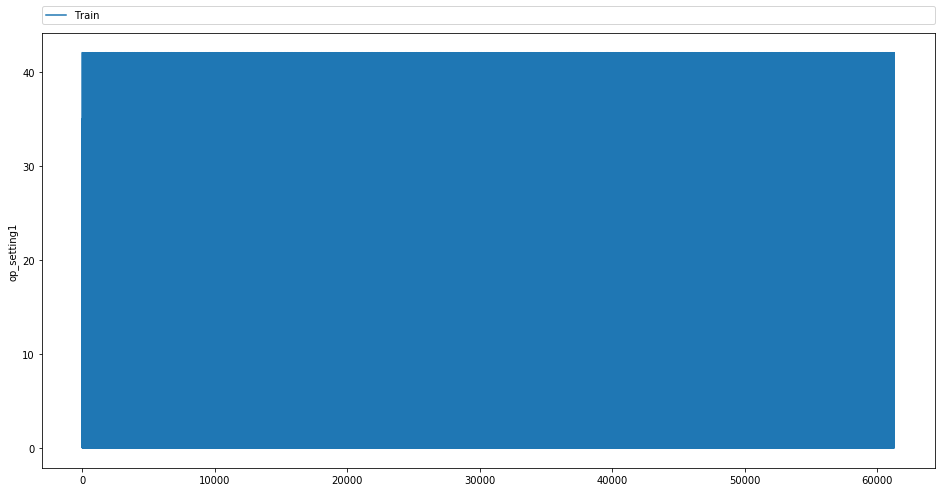

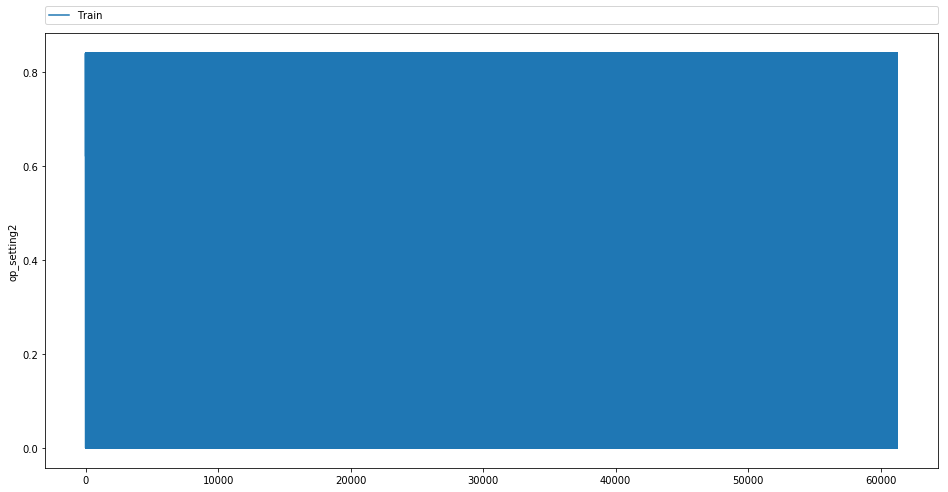

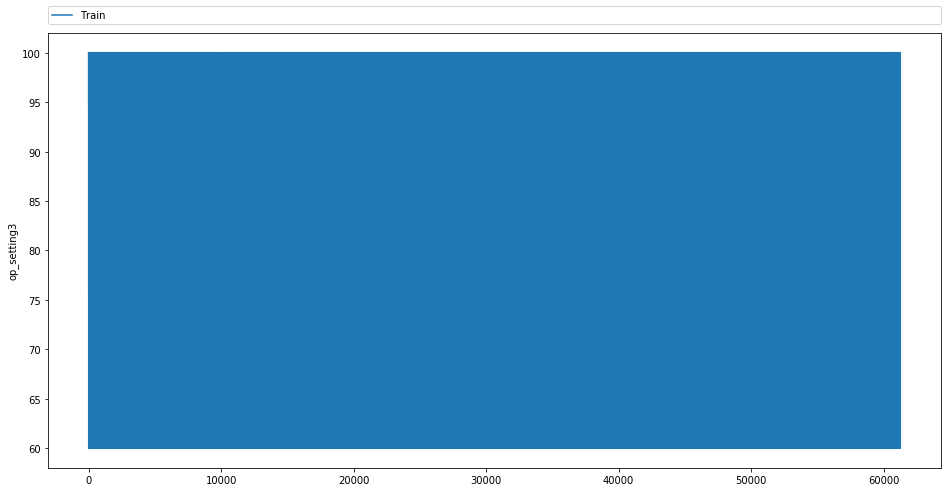

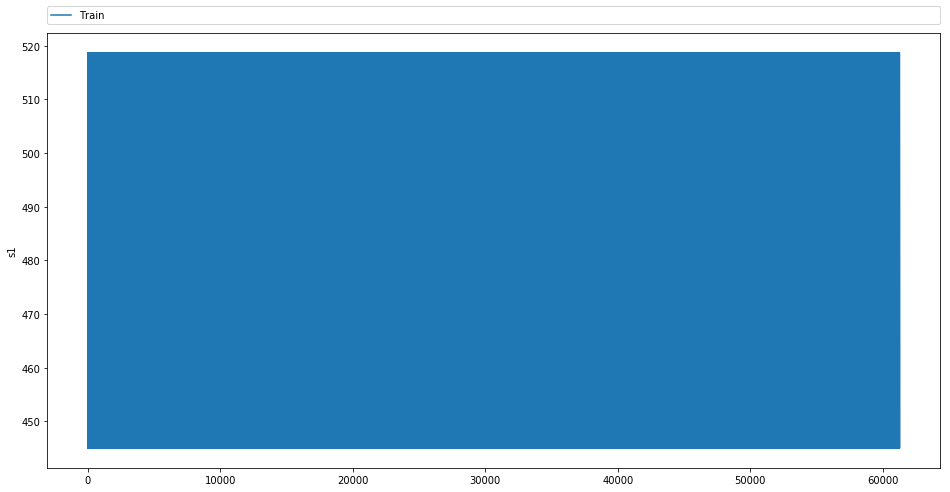

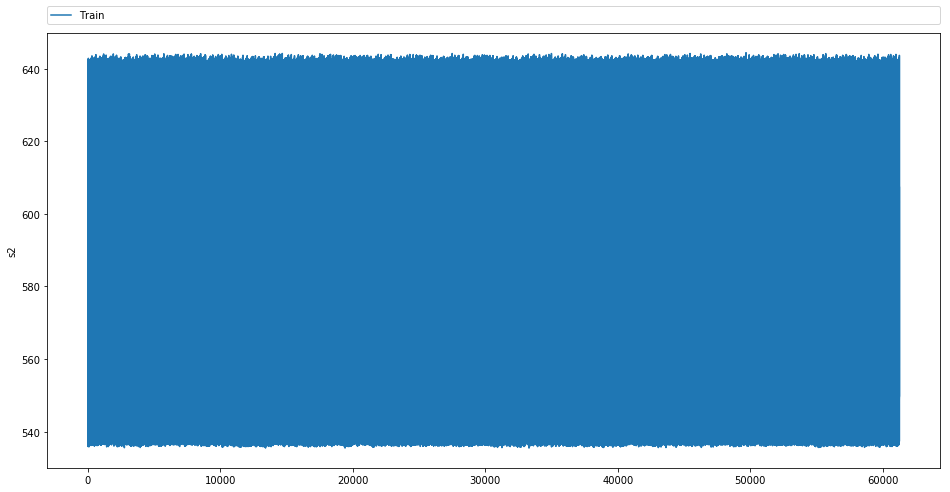

...

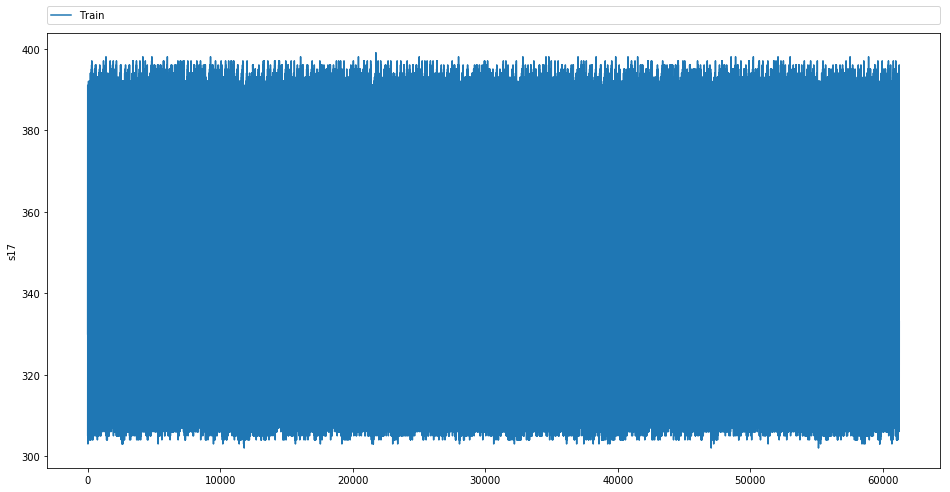

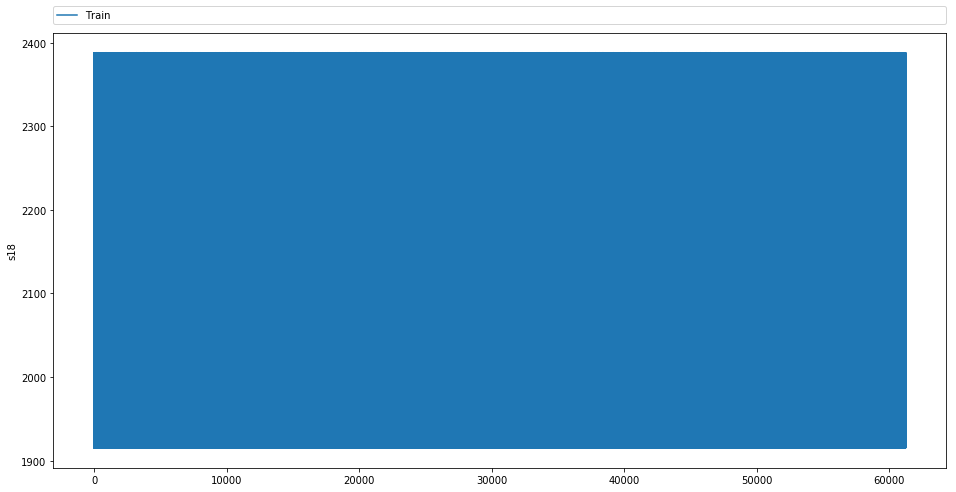

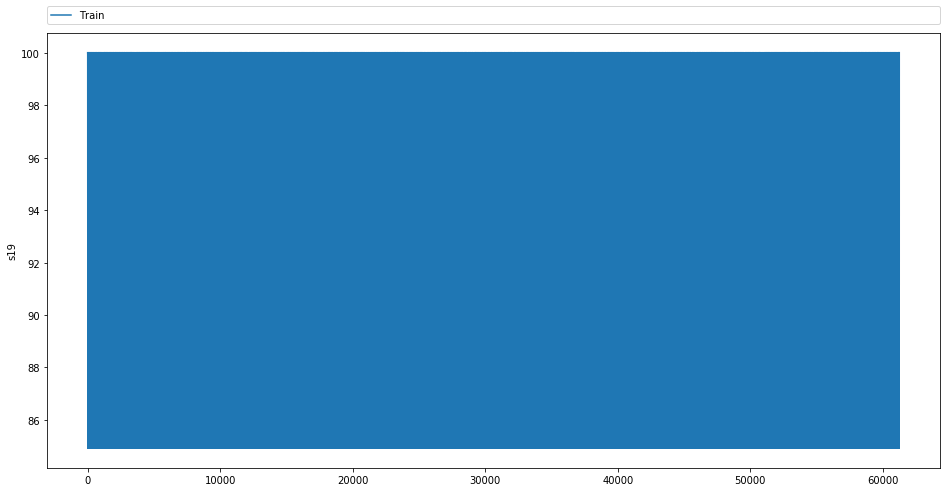

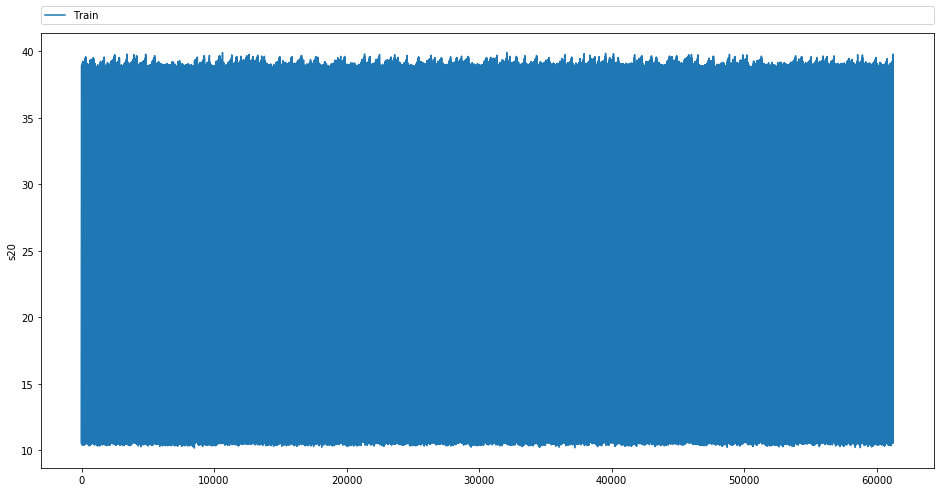

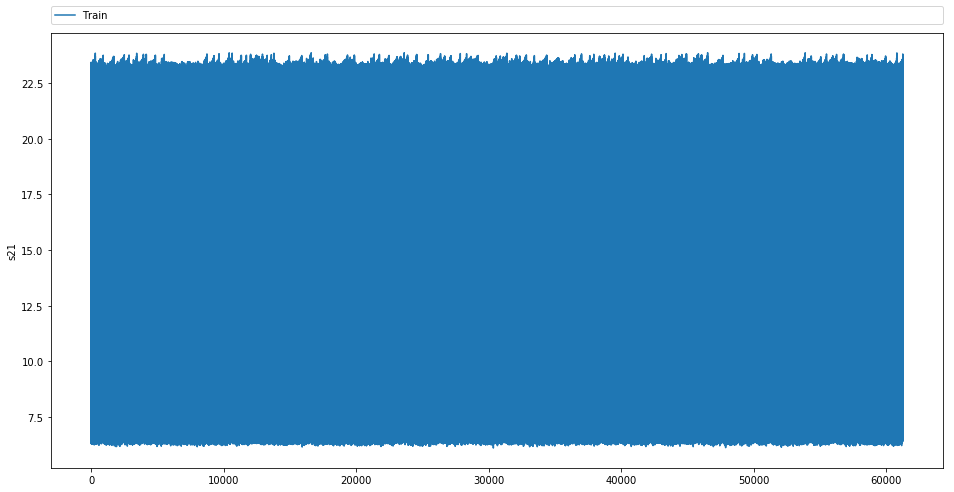

In [71]:
for feature in train.drop(columns = ["unit", "cycles"]).columns:
    fig = plt.figure(figsize = (16, 8))
    plt.plot(train[feature])
    plt.legend(['Train'], bbox_to_anchor=(0., 1.02, 1., .102), loc=3, mode="expand", borderaxespad=0)
    plt.ylabel(feature)
    plt.show()

In [72]:
cyc1 = feature_prepare_by_diff(train, "unit", 1)
cyc2 = feature_prepare_by_diff(train, "unit", 2)
cyc3 = feature_prepare_by_diff(train, "unit", 3)
cyc4 = feature_prepare_by_diff(train, "unit", 4)
cyc5 = feature_prepare_by_diff(train, "unit", 5)
cyc6 = feature_prepare_by_diff(train, "unit", 6)
cyc7 = feature_prepare_by_diff(train, "unit", 7)
cyc8 = feature_prepare_by_diff(train, "unit", 8)
cyc9 = feature_prepare_by_diff(train, "unit", 9)
cyc10 = feature_prepare_by_diff(train, "unit", 10)

train_diff = pd.concat([cyc1, cyc2, cyc3, cyc4, cyc5, cyc6, cyc7, cyc8, cyc9, cyc10], axis = 1)
train_diff.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [73]:
cyc1 = feature_prepare_by_diff(test, "unit", 1)
cyc2 = feature_prepare_by_diff(test, "unit", 2)
cyc3 = feature_prepare_by_diff(test, "unit", 3)
cyc4 = feature_prepare_by_diff(test, "unit", 4)
cyc5 = feature_prepare_by_diff(test, "unit", 5)
cyc6 = feature_prepare_by_diff(test, "unit", 6)
cyc7 = feature_prepare_by_diff(test, "unit", 7)
cyc8 = feature_prepare_by_diff(test, "unit", 8)
cyc9 = feature_prepare_by_diff(test, "unit", 9)
cyc10 = feature_prepare_by_diff(test, "unit", 10)

test_diff = pd.concat([cyc1, cyc2, cyc3, cyc4, cyc5, cyc6, cyc7, cyc8, cyc9, cyc10], axis = 1)
test_diff.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [74]:
train_mean = feature_prepare_by_mean(train, "unit")
train_mean.head()

,unit_mean_of_feature,cycles_mean_of_feature,op_setting1_mean_of_feature,op_setting2_mean_of_feature,op_setting3_mean_of_feature,s1_mean_of_feature,s2_mean_of_feature,s3_mean_of_feature,s4_mean_of_feature,s5_mean_of_feature,s6_mean_of_feature,s7_mean_of_feature,s8_mean_of_feature,s9_mean_of_feature,s10_mean_of_feature,s11_mean_of_feature,s12_mean_of_feature,s13_mean_of_feature,s14_mean_of_feature,s15_mean_of_feature,s16_mean_of_feature,s17_mean_of_feature,s18_mean_of_feature,s19_mean_of_feature,s20_mean_of_feature,s21_mean_of_feature
0,1.0,161.0,24.438707,0.583016,93.146417,471.768037,576.959377,1406.455296,1187.697103,7.902056,11.348879,276.183832,2218.439907,8496.118006,1.088193,42.434019,259.917850,2326.380748,8057.365078,9.311891,0.022897,344.881620,2218.436137,97.417913,20.449595,12.272224
1,2.0,150.0,23.915596,0.576578,93.311037,473.092876,579.091706,1415.878896,1200.057559,8.044548,11.591706,281.462408,2223.034983,8510.514247,1.090334,42.778763,264.945652,2327.878829,8055.962174,9.354264,0.023077,347.361204,2223.023411,97.479933,20.768796,12.455272
2,3.0,154.0,24.051513,0.574404,92.964169,472.521954,577.912052,1412.346254,1195.463681,7.993713,11.493811,281.476678,2218.867101,8515.624495,1.094821,42.653453,264.966775,2324.918469,8069.602671,9.264344,0.023192,346.426710,2218.697068,97.349251,20.770456,12.468967
3,4.0,137.5,24.663518,0.585886,92.992701,471.449562,577.024708,1412.773832,1197.357299,7.834854,11.274927,272.809635,2216.602591,8512.745219,1.085949,42.750328,256.849818,2325.234124,8073.625146,9.398096,0.023029,346.379562,2216.379562,97.360000,20.125511,12.080574
4,5.0,97.0,23.158104,0.550710,93.989637,474.213834,581.474767,1426.769534,1215.471554,8.226062,11.889223,289.960466,2231.538756,8538.751140,1.102124,43.211762,273.072539,2334.071762,8067.233886,9.327459,0.023834,350.093264,2231.445596,97.735596,21.266425,12.764442


In [75]:
test_mean = feature_prepare_by_mean(test, "unit")
test_mean.head()

,unit_mean_of_feature,cycles_mean_of_feature,op_setting1_mean_of_feature,op_setting2_mean_of_feature,op_setting3_mean_of_feature,s1_mean_of_feature,s2_mean_of_feature,s3_mean_of_feature,s4_mean_of_feature,s5_mean_of_feature,s6_mean_of_feature,s7_mean_of_feature,s8_mean_of_feature,s9_mean_of_feature,s10_mean_of_feature,s11_mean_of_feature,s12_mean_of_feature,s13_mean_of_feature,s14_mean_of_feature,s15_mean_of_feature,s16_mean_of_feature,s17_mean_of_feature,s18_mean_of_feature,s19_mean_of_feature,s20_mean_of_feature,s21_mean_of_feature
0,1.0,115.5,24.081043,0.584436,94.434783,473.540565,580.125696,1414.114957,1193.755478,8.023739,11.555217,281.768652,2233.585261,8519.309000,1.089478,42.631783,265.217261,2337.888000,8057.604348,9.280000,0.022783,346.760870,2233.678261,97.903304,20.827522,12.491842
1,2.0,77.0,23.303397,0.566281,93.202614,474.393660,580.574510,1418.621503,1201.666078,8.194575,11.809085,287.094967,2225.229673,8520.509869,1.093922,42.787320,270.203987,2326.882680,8055.964967,9.340977,0.023007,347.751634,2225.235294,97.439085,21.152745,12.688261
2,3.0,71.0,23.981801,0.562790,94.609929,473.160851,579.936383,1416.803191,1198.243688,8.091277,11.685461,286.886170,2234.096099,8526.915674,1.098582,42.745319,269.973191,2339.547021,8066.640284,9.230871,0.023121,347.439716,2234.106383,97.969291,21.128936,12.671770
3,4.0,104.5,24.233799,0.582712,95.769231,473.131394,580.734952,1417.297115,1196.373365,7.991058,11.563125,283.349952,2243.871442,8529.060913,1.096635,42.803558,266.723125,2349.844760,8063.050096,9.228856,0.022981,347.721154,2244.024038,98.406058,20.916202,12.545607
4,5.0,26.0,25.610335,0.573939,92.941176,469.132745,574.079216,1406.859216,1193.558039,7.574510,10.898431,264.031569,2210.324118,8477.445490,1.090000,42.716863,248.601961,2324.557843,8060.075098,9.390867,0.023333,344.568627,2210.294118,97.340588,19.499608,11.700724


In [76]:
train_std = feature_prepare_by_std(train, "unit")
train_std.head()

,unit_std_of_feature,cycles_std_of_feature,op_setting1_std_of_feature,op_setting2_std_of_feature,op_setting3_std_of_feature,s1_std_of_feature,s2_std_of_feature,s3_std_of_feature,s4_std_of_feature,s5_std_of_feature,s6_std_of_feature,s7_std_of_feature,s8_std_of_feature,s9_std_of_feature,s10_std_of_feature,s11_std_of_feature,s12_std_of_feature,s13_std_of_feature,s14_std_of_feature,s15_std_of_feature,s16_std_of_feature,s17_std_of_feature,s18_std_of_feature,s19_std_of_feature,s20_std_of_feature,s21_std_of_feature
0,0.0,92.808944,14.410625,0.302858,15.095748,25.869886,36.972997,106.350610,118.474046,3.524654,5.299587,143.719070,150.994535,338.991971,0.127369,3.304839,135.501238,135.780228,90.230210,0.775986,0.004543,27.876822,151.154236,5.687323,9.730899,5.841748
1,0.0,86.458082,14.407043,0.304021,14.952057,26.024095,37.338294,106.968581,118.389421,3.541322,5.334819,144.079954,151.164636,338.545190,0.126920,3.311230,135.798882,134.504938,86.248046,0.773314,0.004623,28.027251,151.274971,5.633187,9.738232,5.836867
2,0.0,88.767487,14.502799,0.304957,15.254123,26.014505,37.459512,107.894339,120.170080,3.555546,5.356907,146.185728,153.237576,343.659838,0.127485,3.379214,137.797835,137.224669,91.728658,0.784271,0.004669,28.195692,153.367332,5.746991,9.877282,5.927361
3,0.0,79.241193,14.384720,0.298482,15.232747,25.584946,36.710343,105.936613,118.287740,3.496900,5.258600,141.736807,151.583475,338.668961,0.126195,3.311512,133.645344,136.986214,91.712670,0.779741,0.004604,27.638862,151.776109,5.738937,9.574819,5.744087
4,0.0,55.858452,15.035157,0.318288,14.330180,26.818194,38.057634,108.503308,123.121218,3.695748,5.564711,149.805404,147.545118,342.419928,0.131522,3.309904,141.262903,128.936623,87.146180,0.766325,0.004875,28.390902,147.629104,5.398895,10.103235,6.055886


In [77]:
test_std = feature_prepare_by_std(test, "unit")
test_std.head()

,unit_std_of_feature,cycles_std_of_feature,op_setting1_std_of_feature,op_setting2_std_of_feature,op_setting3_std_of_feature,s1_std_of_feature,s2_std_of_feature,s3_std_of_feature,s4_std_of_feature,s5_std_of_feature,s6_std_of_feature,s7_std_of_feature,s8_std_of_feature,s9_std_of_feature,s10_std_of_feature,s11_std_of_feature,s12_std_of_feature,s13_std_of_feature,s14_std_of_feature,s15_std_of_feature,s16_std_of_feature,s17_std_of_feature,s18_std_of_feature,s19_std_of_feature,s20_std_of_feature,s21_std_of_feature
0,0.0,66.539462,14.361686,0.298485,13.873496,25.773124,36.410622,102.668387,114.384156,3.502851,5.253040,141.271033,141.946074,325.727996,0.124029,3.117333,133.110233,124.757816,80.700020,0.717679,0.004491,26.833454,142.131346,5.226840,9.609186,5.756966
1,0.0,44.311398,14.418320,0.305619,15.072352,26.086640,37.733523,108.360191,119.736498,3.556419,5.367976,145.341432,153.452250,343.045206,0.128259,3.346333,137.051585,135.577999,87.563859,0.781366,0.004600,28.268283,153.564866,5.678508,9.801992,5.898187
2,0.0,40.847277,15.535446,0.327323,13.707023,27.890203,38.721012,108.721238,122.209683,3.852546,5.776836,155.368636,142.468162,344.290578,0.130415,3.231623,146.507379,123.292667,81.548193,0.733608,0.004650,28.376643,142.602780,5.164121,10.525491,6.324453
3,0.0,60.188592,14.661869,0.304864,12.331360,26.044476,35.810604,99.493001,112.175789,3.548829,5.306241,141.533665,129.079767,313.984362,0.123352,2.937102,133.415121,110.900941,73.349945,0.662104,0.004585,26.088462,129.234066,4.645840,9.663591,5.793835
4,0.0,14.866069,15.594321,0.314455,15.400535,26.465308,37.334830,107.595538,121.547584,3.744700,5.608946,150.442066,151.673937,341.504521,0.133011,3.340331,141.828065,138.536549,89.536154,0.799620,0.004761,28.184574,151.778957,5.802151,10.212089,6.109493


In [78]:
train_median = feature_prepare_by_median(train, "unit")
train_median.head()

,unit_median_of_feature,cycles_median_of_feature,op_setting1_median_of_feature,op_setting2_median_of_feature,op_setting3_median_of_feature,s1_median_of_feature,s2_median_of_feature,s3_median_of_feature,s4_median_of_feature,s5_median_of_feature,s6_median_of_feature,s7_median_of_feature,s8_median_of_feature,s9_median_of_feature,s10_median_of_feature,s11_median_of_feature,s12_median_of_feature,s13_median_of_feature,s14_median_of_feature,s15_median_of_feature,s16_median_of_feature,s17_median_of_feature,s18_median_of_feature,s19_median_of_feature,s20_median_of_feature,s21_median_of_feature
0,1.0,161.0,25.0031,0.7,100.0,462.54,555.260,1361.980,1127.30,7.05,9.00,194.22,2222.88,8353.37,1.03,41.97,182.670,2387.94,8075.99,9.2316,0.02,333.0,2223.0,100.0,14.92,8.95170
1,2.0,150.0,25.0002,0.7,100.0,462.54,555.790,1368.420,1139.81,7.05,9.03,194.63,2222.95,8352.35,1.02,42.34,183.320,2388.02,8077.75,9.3012,0.02,335.0,2223.0,100.0,14.91,8.92240
2,3.0,154.0,25.0021,0.7,100.0,462.54,555.480,1365.940,1133.19,7.05,9.01,195.80,2223.12,8369.98,1.04,42.22,184.590,2388.12,8091.45,9.1827,0.02,334.0,2223.0,100.0,15.00,9.02100
3,4.0,137.5,25.0019,0.7,100.0,462.54,555.855,1369.295,1134.43,7.05,9.03,194.41,2223.14,8371.92,1.02,42.27,182.895,2388.12,8091.53,9.3321,0.02,334.5,2223.0,100.0,14.79,8.90325
4,5.0,97.0,24.9993,0.7,100.0,462.54,556.340,1370.400,1143.23,7.05,9.03,194.52,2223.28,8392.55,1.02,42.49,183.110,2388.12,8088.97,9.3388,0.02,336.0,2223.0,100.0,14.90,8.95300


In [79]:
test_median = feature_prepare_by_median(test, "unit")
test_median.head()

,unit_median_of_feature,cycles_median_of_feature,op_setting1_median_of_feature,op_setting2_median_of_feature,op_setting3_median_of_feature,s1_median_of_feature,s2_median_of_feature,s3_median_of_feature,s4_median_of_feature,s5_median_of_feature,s6_median_of_feature,s7_median_of_feature,s8_median_of_feature,s9_median_of_feature,s10_median_of_feature,s11_median_of_feature,s12_median_of_feature,s13_median_of_feature,s14_median_of_feature,s15_median_of_feature,s16_median_of_feature,s17_median_of_feature,s18_median_of_feature,s19_median_of_feature,s20_median_of_feature,s21_median_of_feature
0,1.0,115.5,24.99935,0.7,100.0,462.54,555.615,1362.69,1129.680,7.05,9.00,194.09,2222.97,8352.50,1.03,42.165,182.90,2387.885,8071.87,9.23285,0.02,333.5,2223.0,100.0,14.960,8.97420
1,2.0,77.0,24.99980,0.7,100.0,462.54,555.650,1367.94,1134.120,7.05,9.03,195.13,2223.00,8353.69,1.02,42.260,183.50,2388.020,8078.24,9.28380,0.02,335.0,2223.0,100.0,14.980,9.00250
2,3.0,71.0,25.00320,0.7,100.0,462.54,555.140,1362.74,1123.030,7.05,9.01,194.78,2222.94,8349.27,1.02,41.810,183.19,2388.020,8082.22,9.25840,0.02,333.0,2223.0,100.0,14.960,8.92530
3,4.0,104.5,24.99920,0.7,100.0,462.54,555.465,1362.48,1124.475,7.05,9.01,194.21,2222.92,8344.42,1.02,41.855,182.84,2387.900,8072.27,9.26035,0.02,333.0,2223.0,100.0,14.945,8.98695
4,5.0,26.0,25.00390,0.7,100.0,462.54,550.340,1363.26,1133.380,7.05,9.02,175.61,2211.91,8328.93,1.02,42.230,164.95,2388.000,8083.62,9.35510,0.02,333.0,2212.0,100.0,14.250,8.63290


In [80]:
slp1 = feature_prepare_by_slope(train, "unit", 1, 0)
slp2 = feature_prepare_by_slope(train, "unit", 2, 0)
slp3 = feature_prepare_by_slope(train, "unit", 3, 0)
slp4 = feature_prepare_by_slope(train, "unit", 4, 0)
slp5 = feature_prepare_by_slope(train, "unit", 5, 0)
slp6 = feature_prepare_by_slope(train, "unit", 6, 0)
slp7 = feature_prepare_by_slope(train, "unit", 7, 0)
slp8 = feature_prepare_by_slope(train, "unit", 8, 0)
slp9 = feature_prepare_by_slope(train, "unit", 9, 0)
slp10 = feature_prepare_by_slope(train, "unit", 10, 0)

train_slope_0 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
train_slope_0.head()

,unit_slope_of_1_cycle_0,cycles_slope_of_1_cycle_0,op_setting1_slope_of_1_cycle_0,op_setting2_slope_of_1_cycle_0,op_setting3_slope_of_1_cycle_0,s1_slope_of_1_cycle_0,s2_slope_of_1_cycle_0,s3_slope_of_1_cycle_0,s4_slope_of_1_cycle_0,s5_slope_of_1_cycle_0,s6_slope_of_1_cycle_0,s7_slope_of_1_cycle_0,s8_slope_of_1_cycle_0,s9_slope_of_1_cycle_0,s10_slope_of_1_cycle_0,s11_slope_of_1_cycle_0,s12_slope_of_1_cycle_0,s13_slope_of_1_cycle_0,s14_slope_of_1_cycle_0,s15_slope_of_1_cycle_0,s16_slope_of_1_cycle_0,s17_slope_of_1_cycle_0,s18_slope_of_1_cycle_0,s19_slope_of_1_cycle_0,s20_slope_of_1_cycle_0,s21_slope_of_1_cycle_0,unit_slope_of_2_cycle_0,cycles_slope_of_2_cycle_0,op_setting1_slope_of_2_cycle_0,op_setting2_slope_of_2_cycle_0,op_setting3_slope_of_2_cycle_0,s1_slope_of_2_cycle_0,s2_slope_of_2_cycle_0,s3_slope_of_2_cycle_0,s4_slope_of_2_cycle_0,s5_slope_of_2_cycle_0,s6_slope_of_2_cycle_0,s7_slope_of_2_cycle_0,s8_slope_of_2_cycle_0,s9_slope_of_2_cycle_0,s10_slope_of_2_cycle_0,s11_slope_of_2_cycle_0,s12_slope_of_2_cycle_0,s13_slope_of_2_cycle_0,s14_slope_of_2_cycle_0,s15_slope_of_2_cycle_0,s16_slope_of_2_cycle_0,s17_slope_of_2_cycle_0,s18_slope_of_2_cycle_0,s19_slope_of_2_cycle_0,s20_slope_of_2_cycle_0,s21_slope_of_2_cycle_0,unit_slope_of_3_cycle_0,cycles_slope_of_3_cycle_0,op_setting1_slope_of_3_cycle_0,op_setting2_slope_of_3_cycle_0,op_setting3_slope_of_3_cycle_0,s1_slope_of_3_cycle_0,s2_slope_of_3_cycle_0,s3_slope_of_3_cycle_0,s4_slope_of_3_cycle_0,s5_slope_of_3_cycle_0,s6_slope_of_3_cycle_0,s7_slope_of_3_cycle_0,s8_slope_of_3_cycle_0,s9_slope_of_3_cycle_0,s10_slope_of_3_cycle_0,s11_slope_of_3_cycle_0,s12_slope_of_3_cycle_0,s13_slope_of_3_cycle_0,s14_slope_of_3_cycle_0,s15_slope_of_3_cycle_0,s16_slope_of_3_cycle_0,s17_slope_of_3_cycle_0,s18_slope_of_3_cycle_0,s19_slope_of_3_cycle_0,s20_slope_of_3_cycle_0,s21_slope_of_3_cycle_0,unit_slope_of_4_cycle_0,cycles_slope_of_4_cycle_0,op_setting1_slope_of_4_cycle_0,op_setting2_slope_of_4_cycle_0,op_setting3_slope_of_4_cycle_0,s1_slope_of_4_cycle_0,s2_slope_of_4_cycle_0,s3_slope_of_4_cycle_0,s4_slope_of_4_cycle_0,s5_slope_of_4_cycle_0,s6_slope_of_4_cycle_0,s7_slope_of_4_cycle_0,s8_slope_of_4_cycle_0,s9_slope_of_4_cycle_0,s10_slope_of_4_cycle_0,s11_slope_of_4_cycle_0,s12_slope_of_4_cycle_0,s13_slope_of_4_cycle_0,s14_slope_of_4_cycle_0,s15_slope_of_4_cycle_0,s16_slope_of_4_cycle_0,s17_slope_of_4_cycle_0,s18_slope_of_4_cycle_0,s19_slope_of_4_cycle_0,s20_slope_of_4_cycle_0,s21_slope_of_4_cycle_0,unit_slope_of_5_cycle_0,cycles_slope_of_5_cycle_0,op_setting1_slope_of_5_cycle_0,op_setting2_slope_of_5_cycle_0,op_setting3_slope_of_5_cycle_0,s1_slope_of_5_cycle_0,s2_slope_of_5_cycle_0,s3_slope_of_5_cycle_0,s4_slope_of_5_cycle_0,s5_slope_of_5_cycle_0,s6_slope_of_5_cycle_0,s7_slope_of_5_cycle_0,s8_slope_of_5_cycle_0,s9_slope_of_5_cycle_0,s10_slope_of_5_cycle_0,s11_slope_of_5_cycle_0,s12_slope_of_5_cycle_0,s13_slope_of_5_cycle_0,s14_slope_of_5_cycle_0,s15_slope_of_5_cycle_0,s16_slope_of_5_cycle_0,s17_slope_of_5_cycle_0,s18_slope_of_5_cycle_0,s19_slope_of_5_cycle_0,s20_slope_of_5_cycle_0,s21_slope_of_5_cycle_0,unit_slope_of_6_cycle_0,cycles_slope_of_6_cycle_0,op_setting1_slope_of_6_cycle_0,op_setting2_slope_of_6_cycle_0,op_setting3_slope_of_6_cycle_0,s1_slope_of_6_cycle_0,s2_slope_of_6_cycle_0,s3_slope_of_6_cycle_0,s4_slope_of_6_cycle_0,s5_slope_of_6_cycle_0,s6_slope_of_6_cycle_0,s7_slope_of_6_cycle_0,s8_slope_of_6_cycle_0,s9_slope_of_6_cycle_0,s10_slope_of_6_cycle_0,s11_slope_of_6_cycle_0,s12_slope_of_6_cycle_0,s13_slope_of_6_cycle_0,s14_slope_of_6_cycle_0,s15_slope_of_6_cycle_0,s16_slope_of_6_cycle_0,s17_slope_of_6_cycle_0,s18_slope_of_6_cycle_0,s19_slope_of_6_cycle_0,s20_slope_of_6_cycle_0,s21_slope_of_6_cycle_0,unit_slope_of_7_cycle_0,cycles_slope_of_7_cycle_0,op_setting1_slope_of_7_cycle_0,op_setting2_slope_of_7_cycle_0,op_setting3_slope_of_7_cycle_0,s1_slope_of_7_cycle_0,s2_slope_of_7_cycle_0,s3_slope_of_7_cycle_0,s4_slope_of_7_cycle_0,s5_slope_of_7_cycle_0,s6_slope_of_7_cycle_0,s7_slope_of_7_cycle_0,

In [81]:
slp1 = feature_prepare_by_slope(train, "unit", 1, 1)
slp2 = feature_prepare_by_slope(train, "unit", 2, 1)
slp3 = feature_prepare_by_slope(train, "unit", 3, 1)
slp4 = feature_prepare_by_slope(train, "unit", 4, 1)
slp5 = feature_prepare_by_slope(train, "unit", 5, 1)
slp6 = feature_prepare_by_slope(train, "unit", 6, 1)
slp7 = feature_prepare_by_slope(train, "unit", 7, 1)
slp8 = feature_prepare_by_slope(train, "unit", 8, 1)
slp9 = feature_prepare_by_slope(train, "unit", 9, 1)
slp10 = feature_prepare_by_slope(train, "unit", 10, 1)

train_slope_1 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
train_slope_1.head()

,unit_slope_of_1_cycle_1,cycles_slope_of_1_cycle_1,op_setting1_slope_of_1_cycle_1,op_setting2_slope_of_1_cycle_1,op_setting3_slope_of_1_cycle_1,s1_slope_of_1_cycle_1,s2_slope_of_1_cycle_1,s3_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s5_slope_of_1_cycle_1,s6_slope_of_1_cycle_1,s7_slope_of_1_cycle_1,s8_slope_of_1_cycle_1,s9_slope_of_1_cycle_1,s10_slope_of_1_cycle_1,s11_slope_of_1_cycle_1,s12_slope_of_1_cycle_1,s13_slope_of_1_cycle_1,s14_slope_of_1_cycle_1,s15_slope_of_1_cycle_1,s16_slope_of_1_cycle_1,s17_slope_of_1_cycle_1,s18_slope_of_1_cycle_1,s19_slope_of_1_cycle_1,s20_slope_of_1_cycle_1,s21_slope_of_1_cycle_1,unit_slope_of_2_cycle_1,cycles_slope_of_2_cycle_1,op_setting1_slope_of_2_cycle_1,op_setting2_slope_of_2_cycle_1,op_setting3_slope_of_2_cycle_1,s1_slope_of_2_cycle_1,s2_slope_of_2_cycle_1,s3_slope_of_2_cycle_1,s4_slope_of_2_cycle_1,s5_slope_of_2_cycle_1,s6_slope_of_2_cycle_1,s7_slope_of_2_cycle_1,s8_slope_of_2_cycle_1,s9_slope_of_2_cycle_1,s10_slope_of_2_cycle_1,s11_slope_of_2_cycle_1,s12_slope_of_2_cycle_1,s13_slope_of_2_cycle_1,s14_slope_of_2_cycle_1,s15_slope_of_2_cycle_1,s16_slope_of_2_cycle_1,s17_slope_of_2_cycle_1,s18_slope_of_2_cycle_1,s19_slope_of_2_cycle_1,s20_slope_of_2_cycle_1,s21_slope_of_2_cycle_1,unit_slope_of_3_cycle_1,cycles_slope_of_3_cycle_1,op_setting1_slope_of_3_cycle_1,op_setting2_slope_of_3_cycle_1,op_setting3_slope_of_3_cycle_1,s1_slope_of_3_cycle_1,s2_slope_of_3_cycle_1,s3_slope_of_3_cycle_1,s4_slope_of_3_cycle_1,s5_slope_of_3_cycle_1,s6_slope_of_3_cycle_1,s7_slope_of_3_cycle_1,s8_slope_of_3_cycle_1,s9_slope_of_3_cycle_1,s10_slope_of_3_cycle_1,s11_slope_of_3_cycle_1,s12_slope_of_3_cycle_1,s13_slope_of_3_cycle_1,s14_slope_of_3_cycle_1,s15_slope_of_3_cycle_1,s16_slope_of_3_cycle_1,s17_slope_of_3_cycle_1,s18_slope_of_3_cycle_1,s19_slope_of_3_cycle_1,s20_slope_of_3_cycle_1,s21_slope_of_3_cycle_1,unit_slope_of_4_cycle_1,cycles_slope_of_4_cycle_1,op_setting1_slope_of_4_cycle_1,op_setting2_slope_of_4_cycle_1,op_setting3_slope_of_4_cycle_1,s1_slope_of_4_cycle_1,s2_slope_of_4_cycle_1,s3_slope_of_4_cycle_1,s4_slope_of_4_cycle_1,s5_slope_of_4_cycle_1,s6_slope_of_4_cycle_1,s7_slope_of_4_cycle_1,s8_slope_of_4_cycle_1,s9_slope_of_4_cycle_1,s10_slope_of_4_cycle_1,s11_slope_of_4_cycle_1,s12_slope_of_4_cycle_1,s13_slope_of_4_cycle_1,s14_slope_of_4_cycle_1,s15_slope_of_4_cycle_1,s16_slope_of_4_cycle_1,s17_slope_of_4_cycle_1,s18_slope_of_4_cycle_1,s19_slope_of_4_cycle_1,s20_slope_of_4_cycle_1,s21_slope_of_4_cycle_1,unit_slope_of_5_cycle_1,cycles_slope_of_5_cycle_1,op_setting1_slope_of_5_cycle_1,op_setting2_slope_of_5_cycle_1,op_setting3_slope_of_5_cycle_1,s1_slope_of_5_cycle_1,s2_slope_of_5_cycle_1,s3_slope_of_5_cycle_1,s4_slope_of_5_cycle_1,s5_slope_of_5_cycle_1,s6_slope_of_5_cycle_1,s7_slope_of_5_cycle_1,s8_slope_of_5_cycle_1,s9_slope_of_5_cycle_1,s10_slope_of_5_cycle_1,s11_slope_of_5_cycle_1,s12_slope_of_5_cycle_1,s13_slope_of_5_cycle_1,s14_slope_of_5_cycle_1,s15_slope_of_5_cycle_1,s16_slope_of_5_cycle_1,s17_slope_of_5_cycle_1,s18_slope_of_5_cycle_1,s19_slope_of_5_cycle_1,s20_slope_of_5_cycle_1,s21_slope_of_5_cycle_1,unit_slope_of_6_cycle_1,cycles_slope_of_6_cycle_1,op_setting1_slope_of_6_cycle_1,op_setting2_slope_of_6_cycle_1,op_setting3_slope_of_6_cycle_1,s1_slope_of_6_cycle_1,s2_slope_of_6_cycle_1,s3_slope_of_6_cycle_1,s4_slope_of_6_cycle_1,s5_slope_of_6_cycle_1,s6_slope_of_6_cycle_1,s7_slope_of_6_cycle_1,s8_slope_of_6_cycle_1,s9_slope_of_6_cycle_1,s10_slope_of_6_cycle_1,s11_slope_of_6_cycle_1,s12_slope_of_6_cycle_1,s13_slope_of_6_cycle_1,s14_slope_of_6_cycle_1,s15_slope_of_6_cycle_1,s16_slope_of_6_cycle_1,s17_slope_of_6_cycle_1,s18_slope_of_6_cycle_1,s19_slope_of_6_cycle_1,s20_slope_of_6_cycle_1,s21_slope_of_6_cycle_1,unit_slope_of_7_cycle_1,cycles_slope_of_7_cycle_1,op_setting1_slope_of_7_cycle_1,op_setting2_slope_of_7_cycle_1,op_setting3_slope_of_7_cycle_1,s1_slope_of_7_cycle_1,s2_slope_of_7_cycle_1,s3_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,s5_slope_of_7_cycle_1,s6_slope_of_7_cycle_1,s7_slope_of_7_cycle_1,

In [82]:
slp1 = feature_prepare_by_slope(test, "unit", 1, 0)
slp2 = feature_prepare_by_slope(test, "unit", 2, 0)
slp3 = feature_prepare_by_slope(test, "unit", 3, 0)
slp4 = feature_prepare_by_slope(test, "unit", 4, 0)
slp5 = feature_prepare_by_slope(test, "unit", 5, 0)
slp6 = feature_prepare_by_slope(test, "unit", 6, 0)
slp7 = feature_prepare_by_slope(test, "unit", 7, 0)
slp8 = feature_prepare_by_slope(test, "unit", 8, 0)
slp9 = feature_prepare_by_slope(test, "unit", 9, 0)
slp10 = feature_prepare_by_slope(test, "unit", 10, 0)

test_slope_0 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
test_slope_0.head()

,unit_slope_of_1_cycle_0,cycles_slope_of_1_cycle_0,op_setting1_slope_of_1_cycle_0,op_setting2_slope_of_1_cycle_0,op_setting3_slope_of_1_cycle_0,s1_slope_of_1_cycle_0,s2_slope_of_1_cycle_0,s3_slope_of_1_cycle_0,s4_slope_of_1_cycle_0,s5_slope_of_1_cycle_0,s6_slope_of_1_cycle_0,s7_slope_of_1_cycle_0,s8_slope_of_1_cycle_0,s9_slope_of_1_cycle_0,s10_slope_of_1_cycle_0,s11_slope_of_1_cycle_0,s12_slope_of_1_cycle_0,s13_slope_of_1_cycle_0,s14_slope_of_1_cycle_0,s15_slope_of_1_cycle_0,s16_slope_of_1_cycle_0,s17_slope_of_1_cycle_0,s18_slope_of_1_cycle_0,s19_slope_of_1_cycle_0,s20_slope_of_1_cycle_0,s21_slope_of_1_cycle_0,unit_slope_of_2_cycle_0,cycles_slope_of_2_cycle_0,op_setting1_slope_of_2_cycle_0,op_setting2_slope_of_2_cycle_0,op_setting3_slope_of_2_cycle_0,s1_slope_of_2_cycle_0,s2_slope_of_2_cycle_0,s3_slope_of_2_cycle_0,s4_slope_of_2_cycle_0,s5_slope_of_2_cycle_0,s6_slope_of_2_cycle_0,s7_slope_of_2_cycle_0,s8_slope_of_2_cycle_0,s9_slope_of_2_cycle_0,s10_slope_of_2_cycle_0,s11_slope_of_2_cycle_0,s12_slope_of_2_cycle_0,s13_slope_of_2_cycle_0,s14_slope_of_2_cycle_0,s15_slope_of_2_cycle_0,s16_slope_of_2_cycle_0,s17_slope_of_2_cycle_0,s18_slope_of_2_cycle_0,s19_slope_of_2_cycle_0,s20_slope_of_2_cycle_0,s21_slope_of_2_cycle_0,unit_slope_of_3_cycle_0,cycles_slope_of_3_cycle_0,op_setting1_slope_of_3_cycle_0,op_setting2_slope_of_3_cycle_0,op_setting3_slope_of_3_cycle_0,s1_slope_of_3_cycle_0,s2_slope_of_3_cycle_0,s3_slope_of_3_cycle_0,s4_slope_of_3_cycle_0,s5_slope_of_3_cycle_0,s6_slope_of_3_cycle_0,s7_slope_of_3_cycle_0,s8_slope_of_3_cycle_0,s9_slope_of_3_cycle_0,s10_slope_of_3_cycle_0,s11_slope_of_3_cycle_0,s12_slope_of_3_cycle_0,s13_slope_of_3_cycle_0,s14_slope_of_3_cycle_0,s15_slope_of_3_cycle_0,s16_slope_of_3_cycle_0,s17_slope_of_3_cycle_0,s18_slope_of_3_cycle_0,s19_slope_of_3_cycle_0,s20_slope_of_3_cycle_0,s21_slope_of_3_cycle_0,unit_slope_of_4_cycle_0,cycles_slope_of_4_cycle_0,op_setting1_slope_of_4_cycle_0,op_setting2_slope_of_4_cycle_0,op_setting3_slope_of_4_cycle_0,s1_slope_of_4_cycle_0,s2_slope_of_4_cycle_0,s3_slope_of_4_cycle_0,s4_slope_of_4_cycle_0,s5_slope_of_4_cycle_0,s6_slope_of_4_cycle_0,s7_slope_of_4_cycle_0,s8_slope_of_4_cycle_0,s9_slope_of_4_cycle_0,s10_slope_of_4_cycle_0,s11_slope_of_4_cycle_0,s12_slope_of_4_cycle_0,s13_slope_of_4_cycle_0,s14_slope_of_4_cycle_0,s15_slope_of_4_cycle_0,s16_slope_of_4_cycle_0,s17_slope_of_4_cycle_0,s18_slope_of_4_cycle_0,s19_slope_of_4_cycle_0,s20_slope_of_4_cycle_0,s21_slope_of_4_cycle_0,unit_slope_of_5_cycle_0,cycles_slope_of_5_cycle_0,op_setting1_slope_of_5_cycle_0,op_setting2_slope_of_5_cycle_0,op_setting3_slope_of_5_cycle_0,s1_slope_of_5_cycle_0,s2_slope_of_5_cycle_0,s3_slope_of_5_cycle_0,s4_slope_of_5_cycle_0,s5_slope_of_5_cycle_0,s6_slope_of_5_cycle_0,s7_slope_of_5_cycle_0,s8_slope_of_5_cycle_0,s9_slope_of_5_cycle_0,s10_slope_of_5_cycle_0,s11_slope_of_5_cycle_0,s12_slope_of_5_cycle_0,s13_slope_of_5_cycle_0,s14_slope_of_5_cycle_0,s15_slope_of_5_cycle_0,s16_slope_of_5_cycle_0,s17_slope_of_5_cycle_0,s18_slope_of_5_cycle_0,s19_slope_of_5_cycle_0,s20_slope_of_5_cycle_0,s21_slope_of_5_cycle_0,unit_slope_of_6_cycle_0,cycles_slope_of_6_cycle_0,op_setting1_slope_of_6_cycle_0,op_setting2_slope_of_6_cycle_0,op_setting3_slope_of_6_cycle_0,s1_slope_of_6_cycle_0,s2_slope_of_6_cycle_0,s3_slope_of_6_cycle_0,s4_slope_of_6_cycle_0,s5_slope_of_6_cycle_0,s6_slope_of_6_cycle_0,s7_slope_of_6_cycle_0,s8_slope_of_6_cycle_0,s9_slope_of_6_cycle_0,s10_slope_of_6_cycle_0,s11_slope_of_6_cycle_0,s12_slope_of_6_cycle_0,s13_slope_of_6_cycle_0,s14_slope_of_6_cycle_0,s15_slope_of_6_cycle_0,s16_slope_of_6_cycle_0,s17_slope_of_6_cycle_0,s18_slope_of_6_cycle_0,s19_slope_of_6_cycle_0,s20_slope_of_6_cycle_0,s21_slope_of_6_cycle_0,unit_slope_of_7_cycle_0,cycles_slope_of_7_cycle_0,op_setting1_slope_of_7_cycle_0,op_setting2_slope_of_7_cycle_0,op_setting3_slope_of_7_cycle_0,s1_slope_of_7_cycle_0,s2_slope_of_7_cycle_0,s3_slope_of_7_cycle_0,s4_slope_of_7_cycle_0,s5_slope_of_7_cycle_0,s6_slope_of_7_cycle_0,s7_slope_of_7_cycle_0,

In [83]:
slp1 = feature_prepare_by_slope(test, "unit", 1, 1)
slp2 = feature_prepare_by_slope(test, "unit", 2, 1)
slp3 = feature_prepare_by_slope(test, "unit", 3, 1)
slp4 = feature_prepare_by_slope(test, "unit", 4, 1)
slp5 = feature_prepare_by_slope(test, "unit", 5, 1)
slp6 = feature_prepare_by_slope(test, "unit", 6, 1)
slp7 = feature_prepare_by_slope(test, "unit", 7, 1)
slp8 = feature_prepare_by_slope(test, "unit", 8, 1)
slp9 = feature_prepare_by_slope(test, "unit", 9, 1)
slp10 = feature_prepare_by_slope(test, "unit", 10, 1)

test_slope_1 = pd.concat([slp1, slp2, slp3, slp4, slp5, slp6, slp7, slp8, slp9, slp10], axis = 1)
test_slope_1.head()

,unit_slope_of_1_cycle_1,cycles_slope_of_1_cycle_1,op_setting1_slope_of_1_cycle_1,op_setting2_slope_of_1_cycle_1,op_setting3_slope_of_1_cycle_1,s1_slope_of_1_cycle_1,s2_slope_of_1_cycle_1,s3_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s5_slope_of_1_cycle_1,s6_slope_of_1_cycle_1,s7_slope_of_1_cycle_1,s8_slope_of_1_cycle_1,s9_slope_of_1_cycle_1,s10_slope_of_1_cycle_1,s11_slope_of_1_cycle_1,s12_slope_of_1_cycle_1,s13_slope_of_1_cycle_1,s14_slope_of_1_cycle_1,s15_slope_of_1_cycle_1,s16_slope_of_1_cycle_1,s17_slope_of_1_cycle_1,s18_slope_of_1_cycle_1,s19_slope_of_1_cycle_1,s20_slope_of_1_cycle_1,s21_slope_of_1_cycle_1,unit_slope_of_2_cycle_1,cycles_slope_of_2_cycle_1,op_setting1_slope_of_2_cycle_1,op_setting2_slope_of_2_cycle_1,op_setting3_slope_of_2_cycle_1,s1_slope_of_2_cycle_1,s2_slope_of_2_cycle_1,s3_slope_of_2_cycle_1,s4_slope_of_2_cycle_1,s5_slope_of_2_cycle_1,s6_slope_of_2_cycle_1,s7_slope_of_2_cycle_1,s8_slope_of_2_cycle_1,s9_slope_of_2_cycle_1,s10_slope_of_2_cycle_1,s11_slope_of_2_cycle_1,s12_slope_of_2_cycle_1,s13_slope_of_2_cycle_1,s14_slope_of_2_cycle_1,s15_slope_of_2_cycle_1,s16_slope_of_2_cycle_1,s17_slope_of_2_cycle_1,s18_slope_of_2_cycle_1,s19_slope_of_2_cycle_1,s20_slope_of_2_cycle_1,s21_slope_of_2_cycle_1,unit_slope_of_3_cycle_1,cycles_slope_of_3_cycle_1,op_setting1_slope_of_3_cycle_1,op_setting2_slope_of_3_cycle_1,op_setting3_slope_of_3_cycle_1,s1_slope_of_3_cycle_1,s2_slope_of_3_cycle_1,s3_slope_of_3_cycle_1,s4_slope_of_3_cycle_1,s5_slope_of_3_cycle_1,s6_slope_of_3_cycle_1,s7_slope_of_3_cycle_1,s8_slope_of_3_cycle_1,s9_slope_of_3_cycle_1,s10_slope_of_3_cycle_1,s11_slope_of_3_cycle_1,s12_slope_of_3_cycle_1,s13_slope_of_3_cycle_1,s14_slope_of_3_cycle_1,s15_slope_of_3_cycle_1,s16_slope_of_3_cycle_1,s17_slope_of_3_cycle_1,s18_slope_of_3_cycle_1,s19_slope_of_3_cycle_1,s20_slope_of_3_cycle_1,s21_slope_of_3_cycle_1,unit_slope_of_4_cycle_1,cycles_slope_of_4_cycle_1,op_setting1_slope_of_4_cycle_1,op_setting2_slope_of_4_cycle_1,op_setting3_slope_of_4_cycle_1,s1_slope_of_4_cycle_1,s2_slope_of_4_cycle_1,s3_slope_of_4_cycle_1,s4_slope_of_4_cycle_1,s5_slope_of_4_cycle_1,s6_slope_of_4_cycle_1,s7_slope_of_4_cycle_1,s8_slope_of_4_cycle_1,s9_slope_of_4_cycle_1,s10_slope_of_4_cycle_1,s11_slope_of_4_cycle_1,s12_slope_of_4_cycle_1,s13_slope_of_4_cycle_1,s14_slope_of_4_cycle_1,s15_slope_of_4_cycle_1,s16_slope_of_4_cycle_1,s17_slope_of_4_cycle_1,s18_slope_of_4_cycle_1,s19_slope_of_4_cycle_1,s20_slope_of_4_cycle_1,s21_slope_of_4_cycle_1,unit_slope_of_5_cycle_1,cycles_slope_of_5_cycle_1,op_setting1_slope_of_5_cycle_1,op_setting2_slope_of_5_cycle_1,op_setting3_slope_of_5_cycle_1,s1_slope_of_5_cycle_1,s2_slope_of_5_cycle_1,s3_slope_of_5_cycle_1,s4_slope_of_5_cycle_1,s5_slope_of_5_cycle_1,s6_slope_of_5_cycle_1,s7_slope_of_5_cycle_1,s8_slope_of_5_cycle_1,s9_slope_of_5_cycle_1,s10_slope_of_5_cycle_1,s11_slope_of_5_cycle_1,s12_slope_of_5_cycle_1,s13_slope_of_5_cycle_1,s14_slope_of_5_cycle_1,s15_slope_of_5_cycle_1,s16_slope_of_5_cycle_1,s17_slope_of_5_cycle_1,s18_slope_of_5_cycle_1,s19_slope_of_5_cycle_1,s20_slope_of_5_cycle_1,s21_slope_of_5_cycle_1,unit_slope_of_6_cycle_1,cycles_slope_of_6_cycle_1,op_setting1_slope_of_6_cycle_1,op_setting2_slope_of_6_cycle_1,op_setting3_slope_of_6_cycle_1,s1_slope_of_6_cycle_1,s2_slope_of_6_cycle_1,s3_slope_of_6_cycle_1,s4_slope_of_6_cycle_1,s5_slope_of_6_cycle_1,s6_slope_of_6_cycle_1,s7_slope_of_6_cycle_1,s8_slope_of_6_cycle_1,s9_slope_of_6_cycle_1,s10_slope_of_6_cycle_1,s11_slope_of_6_cycle_1,s12_slope_of_6_cycle_1,s13_slope_of_6_cycle_1,s14_slope_of_6_cycle_1,s15_slope_of_6_cycle_1,s16_slope_of_6_cycle_1,s17_slope_of_6_cycle_1,s18_slope_of_6_cycle_1,s19_slope_of_6_cycle_1,s20_slope_of_6_cycle_1,s21_slope_of_6_cycle_1,unit_slope_of_7_cycle_1,cycles_slope_of_7_cycle_1,op_setting1_slope_of_7_cycle_1,op_setting2_slope_of_7_cycle_1,op_setting3_slope_of_7_cycle_1,s1_slope_of_7_cycle_1,s2_slope_of_7_cycle_1,s3_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,s5_slope_of_7_cycle_1,s6_slope_of_7_cycle_1,s7_slope_of_7_cycle_1,

In [84]:
train_diff.shape, train_mean.shape, train_std.shape, train_median.shape, train_slope_0.shape, train_slope_1.shape

((249, 260), (249, 26), (249, 26), (249, 26), (249, 260), (249, 260))

In [85]:
trainFD004 = pd.concat([train_diff, train_mean, train_std, train_median, train_slope_0, train_slope_1], axis = 1)
trainFD004.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [86]:
testFD004 = pd.concat([test_diff, test_mean, test_std, test_median, test_slope_0, test_slope_1], axis = 1)
testFD004.head()

,unit_mean_diff_of_1_cycle,cycles_mean_diff_of_1_cycle,op_setting1_mean_diff_of_1_cycle,op_setting2_mean_diff_of_1_cycle,op_setting3_mean_diff_of_1_cycle,s1_mean_diff_of_1_cycle,s2_mean_diff_of_1_cycle,s3_mean_diff_of_1_cycle,s4_mean_diff_of_1_cycle,s5_mean_diff_of_1_cycle,s6_mean_diff_of_1_cycle,s7_mean_diff_of_1_cycle,s8_mean_diff_of_1_cycle,s9_mean_diff_of_1_cycle,s10_mean_diff_of_1_cycle,s11_mean_diff_of_1_cycle,s12_mean_diff_of_1_cycle,s13_mean_diff_of_1_cycle,s14_mean_diff_of_1_cycle,s15_mean_diff_of_1_cycle,s16_mean_diff_of_1_cycle,s17_mean_diff_of_1_cycle,s18_mean_diff_of_1_cycle,s19_mean_diff_of_1_cycle,s20_mean_diff_of_1_cycle,s21_mean_diff_of_1_cycle,unit_mean_diff_of_2_cycle,cycles_mean_diff_of_2_cycle,op_setting1_mean_diff_of_2_cycle,op_setting2_mean_diff_of_2_cycle,op_setting3_mean_diff_of_2_cycle,s1_mean_diff_of_2_cycle,s2_mean_diff_of_2_cycle,s3_mean_diff_of_2_cycle,s4_mean_diff_of_2_cycle,s5_mean_diff_of_2_cycle,s6_mean_diff_of_2_cycle,s7_mean_diff_of_2_cycle,s8_mean_diff_of_2_cycle,s9_mean_diff_of_2_cycle,s10_mean_diff_of_2_cycle,s11_mean_diff_of_2_cycle,s12_mean_diff_of_2_cycle,s13_mean_diff_of_2_cycle,s14_mean_diff_of_2_cycle,s15_mean_diff_of_2_cycle,s16_mean_diff_of_2_cycle,s17_mean_diff_of_2_cycle,s18_mean_diff_of_2_cycle,s19_mean_diff_of_2_cycle,s20_mean_diff_of_2_cycle,s21_mean_diff_of_2_cycle,unit_mean_diff_of_3_cycle,cycles_mean_diff_of_3_cycle,op_setting1_mean_diff_of_3_cycle,op_setting2_mean_diff_of_3_cycle,op_setting3_mean_diff_of_3_cycle,s1_mean_diff_of_3_cycle,s2_mean_diff_of_3_cycle,s3_mean_diff_of_3_cycle,s4_mean_diff_of_3_cycle,s5_mean_diff_of_3_cycle,s6_mean_diff_of_3_cycle,s7_mean_diff_of_3_cycle,s8_mean_diff_of_3_cycle,s9_mean_diff_of_3_cycle,s10_mean_diff_of_3_cycle,s11_mean_diff_of_3_cycle,s12_mean_diff_of_3_cycle,s13_mean_diff_of_3_cycle,s14_mean_diff_of_3_cycle,s15_mean_diff_of_3_cycle,s16_mean_diff_of_3_cycle,s17_mean_diff_of_3_cycle,s18_mean_diff_of_3_cycle,s19_mean_diff_of_3_cycle,s20_mean_diff_of_3_cycle,s21_mean_diff_of_3_cycle,unit_mean_diff_of_4_cycle,cycles_mean_diff_of_4_cycle,op_setting1_mean_diff_of_4_cycle,op_setting2_mean_diff_of_4_cycle,op_setting3_mean_diff_of_4_cycle,s1_mean_diff_of_4_cycle,s2_mean_diff_of_4_cycle,s3_mean_diff_of_4_cycle,s4_mean_diff_of_4_cycle,s5_mean_diff_of_4_cycle,s6_mean_diff_of_4_cycle,s7_mean_diff_of_4_cycle,s8_mean_diff_of_4_cycle,s9_mean_diff_of_4_cycle,s10_mean_diff_of_4_cycle,s11_mean_diff_of_4_cycle,s12_mean_diff_of_4_cycle,s13_mean_diff_of_4_cycle,s14_mean_diff_of_4_cycle,s15_mean_diff_of_4_cycle,s16_mean_diff_of_4_cycle,s17_mean_diff_of_4_cycle,s18_mean_diff_of_4_cycle,s19_mean_diff_of_4_cycle,s20_mean_diff_of_4_cycle,s21_mean_diff_of_4_cycle,unit_mean_diff_of_5_cycle,cycles_mean_diff_of_5_cycle,op_setting1_mean_diff_of_5_cycle,op_setting2_mean_diff_of_5_cycle,op_setting3_mean_diff_of_5_cycle,s1_mean_diff_of_5_cycle,s2_mean_diff_of_5_cycle,s3_mean_diff_of_5_cycle,s4_mean_diff_of_5_cycle,s5_mean_diff_of_5_cycle,s6_mean_diff_of_5_cycle,s7_mean_diff_of_5_cycle,s8_mean_diff_of_5_cycle,s9_mean_diff_of_5_cycle,s10_mean_diff_of_5_cycle,s11_mean_diff_of_5_cycle,s12_mean_diff_of_5_cycle,s13_mean_diff_of_5_cycle,s14_mean_diff_of_5_cycle,s15_mean_diff_of_5_cycle,s16_mean_diff_of_5_cycle,s17_mean_diff_of_5_cycle,s18_mean_diff_of_5_cycle,s19_mean_diff_of_5_cycle,s20_mean_diff_of_5_cycle,s21_mean_diff_of_5_cycle,unit_mean_diff_of_6_cycle,cycles_mean_diff_of_6_cycle,op_setting1_mean_diff_of_6_cycle,op_setting2_mean_diff_of_6_cycle,op_setting3_mean_diff_of_6_cycle,s1_mean_diff_of_6_cycle,s2_mean_diff_of_6_cycle,s3_mean_diff_of_6_cycle,s4_mean_diff_of_6_cycle,s5_mean_diff_of_6_cycle,s6_mean_diff_of_6_cycle,s7_mean_diff_of_6_cycle,s8_mean_diff_of_6_cycle,s9_mean_diff_of_6_cycle,s10_mean_diff_of_6_cycle,s11_mean_diff_of_6_cycle,s12_mean_diff_of_6_cycle,s13_mean_diff_of_6_cycle,s14_mean_diff_of_6_cycle,s15_mean_diff_of_6_cycle,s16_mean_diff_of_6_cycle,s17_mean_diff_of_6_cycle,s18_mean_diff_of_6_cycle,s19_mean_diff_of_6_cycle,s20_mean_diff_of_6_cycle,s21_mean_d

In [87]:
trainFD004.shape, testFD004.shape

((249, 858), (248, 858))

In [88]:
trainFD004_RUL = train.groupby('unit', as_index=False)['cycles'].max()["cycles"]
trainFD004_RUL.head()

0    321
1    299
2    307
3    274
4    193
Name: cycles, dtype: int64

In [89]:
RUL["more"] = test.groupby('unit', as_index=False)['cycles'].max()["cycles"]
RUL["total"] = RUL[0] + RUL["more"]
RUL.head()

,0,more,total
0,22,230,252
1,39,153,192
2,107,141,248
3,75,208,283
4,149,51,200


In [90]:
testFD004_RUL = RUL["total"]
testFD004_RUL.head()

0    252
1    192
2    248
3    283
4    200
Name: total, dtype: int64

## All Train Dataset - All Test Dataset

In [91]:
trainDataFrame = pd.concat([trainFD001, trainFD002, trainFD003, trainFD004], axis = 0)
trainDataFrame.shape

(709, 858)

In [138]:
trainDataFrame_RUL = pd.concat([trainFD001_RUL, trainFD002_RUL, trainFD003_RUL, trainFD004_RUL], axis = 0).values
trainDataFrame_RUL.shape

(709,)

In [93]:
testDataFrame = pd.concat([testFD001, testFD002, testFD003, testFD004], axis = 0)
testDataFrame.shape

(707, 858)

In [139]:
testDataFrame_RUL = pd.concat([testFD001_RUL, testFD002_RUL, testFD003_RUL, testFD004_RUL], axis = 0).values
testDataFrame_RUL.shape

(707,)

In [95]:
trainDataFrame.to_csv (r'C:\Users\Ali\Kodluyoruz\trainDataFrame.csv', index = None, header=True)

In [96]:
trainDataFrame_RUL.to_csv (r'C:\Users\Ali\Kodluyoruz\trainDataFrame_RUL.csv', index = None, header=True)

In [97]:
testDataFrame.to_csv (r'C:\Users\Ali\Kodluyoruz\testDataFrame.csv', index = None, header=True)

In [98]:
testDataFrame_RUL.to_csv (r'C:\Users\Ali\Kodluyoruz\testDataFrame_RUL.csv', index = None, header=True)

## Feature Selection

Best alpha using built-in LassoCV: 71.294318
Best score using built-in LassoCV: 0.998433
Lasso picked 36 variables and eliminated the other 822 variables


Text(0.5, 1.0, 'Feature importance using Lasso Model')

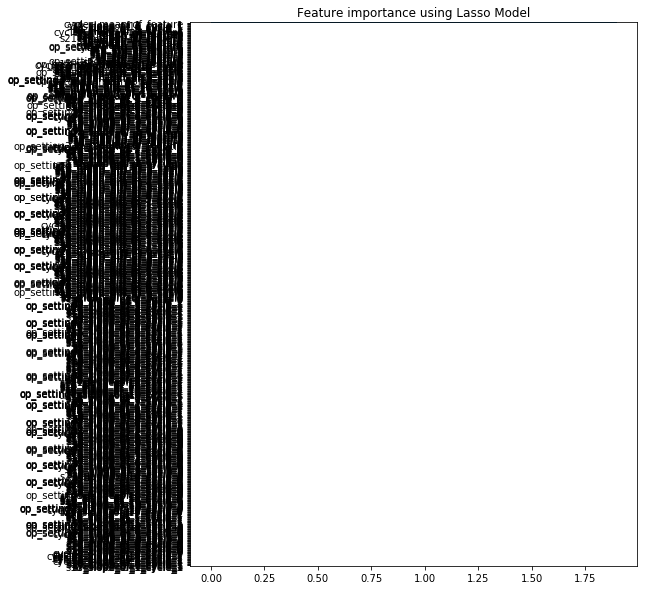

In [99]:
# Feature Selection
reg = LassoCV(n_jobs=-1)
reg.fit(trainDataFrame, trainDataFrame_RUL)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(trainDataFrame,trainDataFrame_RUL))
coef = pd.Series(reg.coef_, index = trainDataFrame.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  
      str(sum(coef == 0)) + " variables")

imp_coef = coef.sort_values()
import matplotlib
matplotlib.rcParams['figure.figsize'] = (8.0, 10.0)
imp_coef.plot(kind = "barh")
plt.title("Feature importance using Lasso Model")

In [100]:
newCols = list(coef[coef != 0].index)
newCols

['cycles_mean_of_feature',
 'cycles_median_of_feature',
 'cycles_slope_of_1_cycle_1',
 's3_slope_of_1_cycle_1',
 's4_slope_of_1_cycle_1',
 's7_slope_of_1_cycle_1',
 's8_slope_of_1_cycle_1',
 's18_slope_of_1_cycle_1',
 'cycles_slope_of_2_cycle_1',
 's4_slope_of_2_cycle_1',
 's7_slope_of_2_cycle_1',
 'cycles_slope_of_3_cycle_1',
 's4_slope_of_3_cycle_1',
 's18_slope_of_3_cycle_1',
 'cycles_slope_of_4_cycle_1',
 's3_slope_of_4_cycle_1',
 's4_slope_of_4_cycle_1',
 's18_slope_of_4_cycle_1',
 'cycles_slope_of_5_cycle_1',
 's18_slope_of_5_cycle_1',
 'cycles_slope_of_6_cycle_1',
 's4_slope_of_6_cycle_1',
 's7_slope_of_6_cycle_1',
 'cycles_slope_of_7_cycle_1',
 's4_slope_of_7_cycle_1',
 's9_slope_of_7_cycle_1',
 's18_slope_of_7_cycle_1',
 'cycles_slope_of_8_cycle_1',
 's7_slope_of_8_cycle_1',
 's18_slope_of_8_cycle_1',
 'cycles_slope_of_9_cycle_1',
 's3_slope_of_9_cycle_1',
 's7_slope_of_9_cycle_1',
 'cycles_slope_of_10_cycle_1',
 's3_slope_of_10_cycle_1',
 's7_slope_of_10_cycle_1']

## Model

In [214]:
X_train1 = trainDataFrame[newCols]
X_train1.head()

,cycles_mean_of_feature,cycles_median_of_feature,cycles_slope_of_1_cycle_1,s3_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s7_slope_of_1_cycle_1,s8_slope_of_1_cycle_1,s18_slope_of_1_cycle_1,cycles_slope_of_2_cycle_1,s4_slope_of_2_cycle_1,s7_slope_of_2_cycle_1,cycles_slope_of_3_cycle_1,s4_slope_of_3_cycle_1,s18_slope_of_3_cycle_1,cycles_slope_of_4_cycle_1,s3_slope_of_4_cycle_1,s4_slope_of_4_cycle_1,s18_slope_of_4_cycle_1,cycles_slope_of_5_cycle_1,s18_slope_of_5_cycle_1,cycles_slope_of_6_cycle_1,s4_slope_of_6_cycle_1,s7_slope_of_6_cycle_1,cycles_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,s9_slope_of_7_cycle_1,s18_slope_of_7_cycle_1,cycles_slope_of_8_cycle_1,s7_slope_of_8_cycle_1,s18_slope_of_8_cycle_1,cycles_slope_of_9_cycle_1,s3_slope_of_9_cycle_1,s7_slope_of_9_cycle_1,cycles_slope_of_10_cycle_1,s3_slope_of_10_cycle_1,s7_slope_of_10_cycle_1
0,96.5,96.5,1.0,1583.710532,1395.131267,554.688830,2388.012096,2388.0,1.5,1395.192723,554.682583,2.0,1395.255662,2388.0,2.5,1583.786299,1395.314332,2388.0,3.0,2388.0,3.5,1395.458864,554.657282,4.0,1395.724615,9051.694671,2388.0,4.5,554.644671,2388.0,5.0,1584.109543,554.603218,5.5,1584.118500,554.609989
1,144.0,144.0,-191.0,1568.617680,1371.627330,556.905731,2387.857968,2388.0,-190.5,1371.953527,556.883026,-190.0,1372.236525,2388.0,-189.5,1569.138373,1372.580097,2388.0,-189.0,2388.0,-188.5,1373.234591,556.769713,-188.0,1372.216639,9021.370018,2388.0,-187.5,556.724618,2388.0,-187.0,1568.692116,556.887560,-186.5,1568.446476,556.734707
2,90.0,90.0,-478.0,1539.885576,1331.112583,559.584866,2387.821402,2388.0,-477.5,1330.631497,559.668152,-477.0,1331.927491,2388.0,-476.5,1541.571542,1333.292383,2388.0,-476.0,2388.0,-475.5,1336.532061,559.165227,-475.0,1329.683189,8746.085162,2388.0,-474.5,559.365559,2388.0,-474.0,1539.971959,559.611836,-473.5,1545.277333,558.756157
3,95.0,95.0,-657.0,1540.640848,1334.669488,560.089606,2387.915465,2388.0,-656.5,1336.644608,560.000360,-656.0,1334.620124,2388.0,-655.5,1544.295222,1337.666413,2388.0,-655.0,2388.0,-654.5,1334.952849,559.960722,-654.0,1334.724497,8661.211668,2388.0,-653.5,559.852586,2388.0,-653.0,1540.918121,560.543120,-652.5,1550.388519,559.319369
4,135.0,135.0,-846.0,1523.396282,1301.748739,563.085600,2387.513912,2388.0,-845.5,1301.395459,563.144102,-845.0,1301.043902,2388.0,-844.5,1523.083508,1301.507301,2388.0,-844.0,2388.0,-843.5,1299.784532,563.186950,-843.0,1305.250824,8863.680262,2388.0,-842.5,562.803354,2388.0,-842.0,1519.495879,563.314691,-841.5,1526.926349,562.616579


In [215]:
X_train1.shape

(709, 36)

In [262]:
scaler = MinMaxScaler()
X_train1 = scaler.fit_transform(X_train1)

In [263]:
X_test1 = testDataFrame[newCols]
X_test1.head()

,cycles_mean_of_feature,cycles_median_of_feature,cycles_slope_of_1_cycle_1,s3_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s7_slope_of_1_cycle_1,s8_slope_of_1_cycle_1,s18_slope_of_1_cycle_1,cycles_slope_of_2_cycle_1,s4_slope_of_2_cycle_1,s7_slope_of_2_cycle_1,cycles_slope_of_3_cycle_1,s4_slope_of_3_cycle_1,s18_slope_of_3_cycle_1,cycles_slope_of_4_cycle_1,s3_slope_of_4_cycle_1,s4_slope_of_4_cycle_1,s18_slope_of_4_cycle_1,cycles_slope_of_5_cycle_1,s18_slope_of_5_cycle_1,cycles_slope_of_6_cycle_1,s4_slope_of_6_cycle_1,s7_slope_of_6_cycle_1,cycles_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,s9_slope_of_7_cycle_1,s18_slope_of_7_cycle_1,cycles_slope_of_8_cycle_1,s7_slope_of_8_cycle_1,s18_slope_of_8_cycle_1,cycles_slope_of_9_cycle_1,s3_slope_of_9_cycle_1,s7_slope_of_9_cycle_1,cycles_slope_of_10_cycle_1,s3_slope_of_10_cycle_1,s7_slope_of_10_cycle_1
0,16.0,16.0,1.0,1584.974798,1401.819355,554.213488,2388.018327,2388.0,1.5,1401.660958,554.224292,2.0,1401.552242,2388.0,2.5,1584.793393,1401.354018,2388.0,3.0,2388.0,3.5,1401.470667,554.219667,4.0,1401.460571,9050.129571,2388.0,4.5,554.179583,2388.0,5.0,1585.158704,554.169444,5.5,1585.121333,554.178667
1,25.0,25.0,-30.0,1588.605556,1404.910173,553.497245,2388.113148,2388.0,-29.5,1404.557409,553.568525,-29.0,1405.951484,2388.0,-28.5,1588.497232,1404.748054,2388.0,-28.0,2388.0,-27.5,1403.781548,553.442024,-27.0,1404.052585,9048.300884,2388.0,-26.5,553.586417,2388.0,-26.0,1588.795667,553.470111,-25.5,1591.367800,553.532000
2,63.5,63.5,-79.0,1586.902702,1400.291281,553.931603,2388.067000,2388.0,-78.5,1400.305698,553.930095,-78.0,1400.460324,2388.0,-77.5,1586.657893,1400.641270,2388.0,-77.0,2388.0,-76.5,1400.404081,553.935340,-76.0,1400.474328,9055.081401,2388.0,-75.5,553.872704,2388.0,-75.0,1587.506825,553.851832,-74.5,1587.331117,553.863113
3,53.5,53.5,-205.0,1580.853494,1395.803782,554.508168,2387.971866,2388.0,-204.5,1395.862298,554.520068,-204.0,1396.702663,2388.0,-203.5,1580.012541,1396.614287,2388.0,-203.0,2388.0,-202.5,1396.497145,554.567876,-202.0,1395.281338,9053.870688,2388.0,-201.5,554.636016,2388.0,-201.0,1581.167616,554.666242,-200.5,1579.875382,554.580655
4,49.5,49.5,-311.0,1579.029168,1394.573642,554.381152,2387.949633,2388.0,-310.5,1394.690388,554.372520,-310.0,1398.237659,2388.0,-309.5,1579.290822,1398.185499,2388.0,-309.0,2388.0,-308.5,1398.203833,554.251500,-308.0,1397.384922,9048.819929,2388.0,-307.5,554.195389,2388.0,-307.0,1581.579670,554.216337,-306.5,1582.540933,554.425844


In [264]:
X_test1.shape

(707, 36)

In [265]:
X_test1 = scaler.fit_transform(X_test1)

In [266]:
X_tr, X_val, Y_tr, Y_val = train_test_split(X_train1, trainDataFrame_RUL, test_size = 0.33, random_state = 2019)
X_tr.shape, X_val.shape, Y_tr.shape, Y_val.shape

((475, 36), (234, 36), (475,), (234,))

In [286]:
model = cat.CatBoostRegressor(iterations=20000,
                                 learning_rate=0.1,
                                 depth=1,
                                 eval_metric='RMSE',
                                 colsample_bylevel=0.3,
                                 random_seed = 2019,
                                 bagging_temperature = 0.5,
                                 metric_period = None,
                                 early_stopping_rounds=100
                                )
model.fit(X_tr, Y_tr, eval_set = (X_val, Y_val), verbose = 50)

0:	learn: 61.9176053	test: 62.9711509	best: 62.9711509 (0)	total: 5.42ms	remaining: 1m 48s
50:	learn: 22.0864182	test: 23.1459307	best: 23.1459307 (50)	total: 319ms	remaining: 2m 4s
100:	learn: 17.0911560	test: 17.5907656	best: 17.5907656 (100)	total: 623ms	remaining: 2m 2s
150:	learn: 16.1458674	test: 16.7887882	best: 16.7887882 (150)	total: 927ms	remaining: 2m 1s
200:	learn: 15.7802579	test: 16.2619691	best: 16.2619691 (200)	total: 1.23s	remaining: 2m 1s
250:	learn: 15.7081575	test: 16.2018618	best: 16.2005664 (244)	total: 1.58s	remaining: 2m 4s
300:	learn: 15.6401647	test: 16.1579376	best: 16.1579376 (300)	total: 1.89s	remaining: 2m 3s
350:	learn: 15.5779154	test: 16.0998984	best: 16.0998984 (350)	total: 2.18s	remaining: 2m 2s
400:	learn: 15.5236480	test: 16.0564317	best: 16.0564167 (399)	total: 2.49s	remaining: 2m 1s
450:	learn: 15.4710634	test: 16.0114047	best: 16.0107272 (448)	total: 2.82s	remaining: 2m 2s
500:	learn: 15.4202577	test: 15.9596030	best: 15.9582572 (495)	total: 3.12

In [287]:
xpredictedRUL = model.predict(X_test1)
xpredictedRUL.shape

(707,)

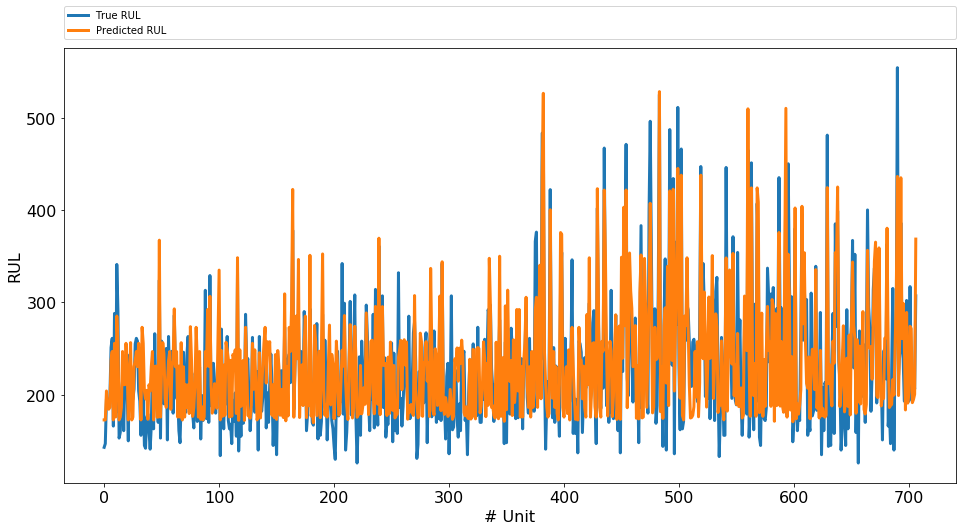

In [288]:
plt.figure(figsize = (16, 8))
plt.plot(testDataFrame_RUL,linewidth=3)
plt.plot(xpredictedRUL,linewidth=3)
plt.xlabel('# Unit', fontsize=16)
plt.xticks(fontsize=16)
plt.ylabel('RUL', fontsize=16)
plt.yticks(fontsize=16)
plt.legend(['True RUL','Predicted RUL'], bbox_to_anchor=(0., 1.02, 1., .102), loc=3, mode="expand", borderaxespad=0)
plt.show()

In [289]:
mse = mean_squared_error(testDataFrame_RUL, xpredictedRUL)
print (mse)
print ('Root Mean Squared Error (RMSE): '+ str(np.sqrt(mse)))

1913.411599608587
Root Mean Squared Error (RMSE): 43.742560505857305


## Neural Network

In [313]:
model = Sequential()
model.add(Dense(36, input_dim=36, kernel_initializer='normal', activation='relu'))
model.add(Dropout(rate=0.2))
model.add(Dense(8, kernel_initializer='normal'))
model.add(Dense(1, kernel_initializer='normal'))
model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mae'])
es = EarlyStopping(monitor='val_loss', mode='min', patience=200)
model.fit(X_train1, trainDataFrame_RUL, validation_split=0.25, epochs=10000, batch_size=256, callbacks=[es],
          verbose=True)

Train on 531 samples, validate on 178 samples
Epoch 1/10000
531/531 [==============================] - 1s 1ms/step - loss: 52364.7479 - mean_absolute_error: 220.2303 - val_loss: 65092.4453 - val_mean_absolute_error: 243.8900
Epoch 2/10000
531/531 [==============================] - 0s 21us/step - loss: 52358.7047 - mean_absolute_error: 220.2167 - val_loss: 65086.0625 - val_mean_absolute_error: 243.8770
Epoch 3/10000
531/531 [==============================] - 0s 24us/step - loss: 52352.0603 - mean_absolute_error: 220.2017 - val_loss: 65078.6758 - val_mean_absolute_error: 243.8620
Epoch 4/10000
531/531 [==============================] - 0s 21us/step - loss: 52344.0245 - mean_absolute_error: 220.1836 - val_loss: 65069.9727 - val_mean_absolute_error: 243.8443
Epoch 5/10000
531/531 [==============================] - 0s 23us/step - loss: 52334.5325 - mean_absolute_error: 220.1624 - val_loss: 65059.7266 - val_mean_absolute_error: 243.8235
Epoch 6/10000
531/531 [==============================] 

Epoch 46/10000
531/531 [==============================] - 0s 21us/step - loss: 40656.5906 - mean_absolute_error: 192.0592 - val_loss: 53615.4141 - val_mean_absolute_error: 219.2654
Epoch 47/10000
531/531 [==============================] - 0s 24us/step - loss: 39773.3107 - mean_absolute_error: 189.7575 - val_loss: 52797.0039 - val_mean_absolute_error: 217.3973
Epoch 48/10000
531/531 [==============================] - 0s 21us/step - loss: 38874.1096 - mean_absolute_error: 187.4456 - val_loss: 51943.9453 - val_mean_absolute_error: 215.4321
Epoch 49/10000
531/531 [==============================] - 0s 19us/step - loss: 37974.8461 - mean_absolute_error: 184.9935 - val_loss: 51057.1445 - val_mean_absolute_error: 213.3690
Epoch 50/10000
531/531 [==============================] - 0s 21us/step - loss: 37180.3299 - mean_absolute_error: 182.7357 - val_loss: 50145.3867 - val_mean_absolute_error: 211.2257
Epoch 51/10000
531/531 [==============================] - 0s 23us/step - loss: 36040.5767 - mea

531/531 [==============================] - 0s 19us/step - loss: 5791.0055 - mean_absolute_error: 55.4734 - val_loss: 13450.5010 - val_mean_absolute_error: 93.0495
Epoch 92/10000
531/531 [==============================] - 0s 21us/step - loss: 5158.9497 - mean_absolute_error: 53.2027 - val_loss: 13134.2852 - val_mean_absolute_error: 91.8373
Epoch 93/10000
531/531 [==============================] - 0s 21us/step - loss: 5200.2831 - mean_absolute_error: 54.4186 - val_loss: 12825.3291 - val_mean_absolute_error: 90.6453
Epoch 94/10000
531/531 [==============================] - 0s 21us/step - loss: 5090.9675 - mean_absolute_error: 53.4881 - val_loss: 12540.9648 - val_mean_absolute_error: 89.5665
Epoch 95/10000
531/531 [==============================] - 0s 23us/step - loss: 5214.6962 - mean_absolute_error: 54.6138 - val_loss: 12312.3369 - val_mean_absolute_error: 88.7114
Epoch 96/10000
531/531 [==============================] - 0s 19us/step - loss: 5028.0902 - mean_absolute_error: 53.8053 - val

Epoch 137/10000
531/531 [==============================] - 0s 21us/step - loss: 5220.3732 - mean_absolute_error: 55.9177 - val_loss: 10985.3965 - val_mean_absolute_error: 83.6077
Epoch 138/10000
531/531 [==============================] - 0s 19us/step - loss: 4957.1768 - mean_absolute_error: 54.0239 - val_loss: 10995.6211 - val_mean_absolute_error: 83.6514
Epoch 139/10000
531/531 [==============================] - 0s 23us/step - loss: 5018.9838 - mean_absolute_error: 55.0912 - val_loss: 11007.2480 - val_mean_absolute_error: 83.7007
Epoch 140/10000
531/531 [==============================] - 0s 23us/step - loss: 4694.1669 - mean_absolute_error: 52.9956 - val_loss: 11029.6562 - val_mean_absolute_error: 83.7931
Epoch 141/10000
531/531 [==============================] - 0s 21us/step - loss: 4525.4688 - mean_absolute_error: 51.5561 - val_loss: 11041.3457 - val_mean_absolute_error: 83.8422
Epoch 142/10000
531/531 [==============================] - 0s 19us/step - loss: 4643.2999 - mean_absolute

Epoch 183/10000
531/531 [==============================] - 0s 21us/step - loss: 4701.7572 - mean_absolute_error: 54.0157 - val_loss: 10452.7754 - val_mean_absolute_error: 81.5253
Epoch 184/10000
531/531 [==============================] - 0s 21us/step - loss: 4716.6672 - mean_absolute_error: 53.4962 - val_loss: 10445.0098 - val_mean_absolute_error: 81.4956
Epoch 185/10000
531/531 [==============================] - 0s 21us/step - loss: 4619.1128 - mean_absolute_error: 53.3627 - val_loss: 10462.0342 - val_mean_absolute_error: 81.5689
Epoch 186/10000
531/531 [==============================] - 0s 21us/step - loss: 5004.6494 - mean_absolute_error: 55.5324 - val_loss: 10491.4658 - val_mean_absolute_error: 81.6932
Epoch 187/10000
531/531 [==============================] - 0s 19us/step - loss: 4959.2461 - mean_absolute_error: 55.9856 - val_loss: 10521.3994 - val_mean_absolute_error: 81.8223
Epoch 188/10000
531/531 [==============================] - 0s 21us/step - loss: 4908.1022 - mean_absolute

Epoch 229/10000
531/531 [==============================] - 0s 21us/step - loss: 4512.5457 - mean_absolute_error: 52.2260 - val_loss: 10656.7695 - val_mean_absolute_error: 82.5105
Epoch 230/10000
531/531 [==============================] - 0s 21us/step - loss: 4879.3868 - mean_absolute_error: 53.7908 - val_loss: 10662.3818 - val_mean_absolute_error: 82.5365
Epoch 231/10000
531/531 [==============================] - 0s 19us/step - loss: 4811.7629 - mean_absolute_error: 52.6435 - val_loss: 10606.4521 - val_mean_absolute_error: 82.3077
Epoch 232/10000
531/531 [==============================] - 0s 21us/step - loss: 4535.1259 - mean_absolute_error: 52.3732 - val_loss: 10551.9541 - val_mean_absolute_error: 82.0834
Epoch 233/10000
531/531 [==============================] - 0s 21us/step - loss: 4562.7466 - mean_absolute_error: 51.7590 - val_loss: 10486.3643 - val_mean_absolute_error: 81.8132
Epoch 234/10000
531/531 [==============================] - 0s 21us/step - loss: 4685.4344 - mean_absolute

Epoch 275/10000
531/531 [==============================] - 0s 23us/step - loss: 4526.7800 - mean_absolute_error: 52.8135 - val_loss: 9822.4951 - val_mean_absolute_error: 79.1070
Epoch 276/10000
531/531 [==============================] - 0s 21us/step - loss: 4495.8555 - mean_absolute_error: 52.1592 - val_loss: 9803.5146 - val_mean_absolute_error: 79.0278
Epoch 277/10000
531/531 [==============================] - 0s 17us/step - loss: 4573.6761 - mean_absolute_error: 51.7136 - val_loss: 9821.4033 - val_mean_absolute_error: 79.1081
Epoch 278/10000
531/531 [==============================] - 0s 21us/step - loss: 4377.3848 - mean_absolute_error: 52.3789 - val_loss: 9834.5127 - val_mean_absolute_error: 79.1701
Epoch 279/10000
531/531 [==============================] - 0s 21us/step - loss: 4645.4486 - mean_absolute_error: 53.5554 - val_loss: 9847.8809 - val_mean_absolute_error: 79.2330
Epoch 280/10000
531/531 [==============================] - 0s 19us/step - loss: 4577.9181 - mean_absolute_erro

531/531 [==============================] - 0s 21us/step - loss: 4332.5857 - mean_absolute_error: 50.8859 - val_loss: 9597.4014 - val_mean_absolute_error: 78.2815
Epoch 322/10000
531/531 [==============================] - 0s 21us/step - loss: 4772.8596 - mean_absolute_error: 54.3276 - val_loss: 9586.0713 - val_mean_absolute_error: 78.2346
Epoch 323/10000
531/531 [==============================] - 0s 21us/step - loss: 4225.7612 - mean_absolute_error: 49.9970 - val_loss: 9571.7568 - val_mean_absolute_error: 78.1745
Epoch 324/10000
531/531 [==============================] - 0s 21us/step - loss: 4235.3614 - mean_absolute_error: 49.7333 - val_loss: 9541.1699 - val_mean_absolute_error: 78.0415
Epoch 325/10000
531/531 [==============================] - 0s 19us/step - loss: 4339.3647 - mean_absolute_error: 50.8604 - val_loss: 9516.3379 - val_mean_absolute_error: 77.9338
Epoch 326/10000
531/531 [==============================] - 0s 19us/step - loss: 4610.7584 - mean_absolute_error: 53.0348 - val

531/531 [==============================] - 0s 19us/step - loss: 4146.3134 - mean_absolute_error: 50.5084 - val_loss: 9333.2783 - val_mean_absolute_error: 77.2693
Epoch 368/10000
531/531 [==============================] - 0s 21us/step - loss: 4069.9519 - mean_absolute_error: 50.0362 - val_loss: 9297.7266 - val_mean_absolute_error: 77.1130
Epoch 369/10000
531/531 [==============================] - 0s 19us/step - loss: 4306.0418 - mean_absolute_error: 50.6448 - val_loss: 9258.9658 - val_mean_absolute_error: 76.9416
Epoch 370/10000
531/531 [==============================] - 0s 19us/step - loss: 3974.4015 - mean_absolute_error: 49.3681 - val_loss: 9241.5000 - val_mean_absolute_error: 76.8660
Epoch 371/10000
531/531 [==============================] - 0s 21us/step - loss: 4226.1774 - mean_absolute_error: 51.0202 - val_loss: 9218.8145 - val_mean_absolute_error: 76.7666
Epoch 372/10000
531/531 [==============================] - 0s 21us/step - loss: 4295.2247 - mean_absolute_error: 51.2230 - val

531/531 [==============================] - 0s 21us/step - loss: 4042.8625 - mean_absolute_error: 49.3024 - val_loss: 8668.3252 - val_mean_absolute_error: 74.3763
Epoch 414/10000
531/531 [==============================] - 0s 21us/step - loss: 4026.6461 - mean_absolute_error: 50.5053 - val_loss: 8643.4570 - val_mean_absolute_error: 74.2629
Epoch 415/10000
531/531 [==============================] - 0s 19us/step - loss: 3842.6453 - mean_absolute_error: 48.3247 - val_loss: 8629.1992 - val_mean_absolute_error: 74.1996
Epoch 416/10000
531/531 [==============================] - 0s 21us/step - loss: 4267.5206 - mean_absolute_error: 50.4414 - val_loss: 8628.2910 - val_mean_absolute_error: 74.1995
Epoch 417/10000
531/531 [==============================] - 0s 19us/step - loss: 4283.9674 - mean_absolute_error: 51.1727 - val_loss: 8655.9971 - val_mean_absolute_error: 74.3346
Epoch 418/10000
531/531 [==============================] - 0s 19us/step - loss: 4149.9328 - mean_absolute_error: 49.8886 - val

531/531 [==============================] - 0s 19us/step - loss: 3945.0125 - mean_absolute_error: 48.5252 - val_loss: 8200.8721 - val_mean_absolute_error: 72.3499
Epoch 460/10000
531/531 [==============================] - 0s 23us/step - loss: 3899.4390 - mean_absolute_error: 49.3647 - val_loss: 8232.0088 - val_mean_absolute_error: 72.5080
Epoch 461/10000
531/531 [==============================] - 0s 21us/step - loss: 4059.6097 - mean_absolute_error: 48.6141 - val_loss: 8255.1191 - val_mean_absolute_error: 72.6256
Epoch 462/10000
531/531 [==============================] - 0s 19us/step - loss: 3823.9553 - mean_absolute_error: 48.5174 - val_loss: 8266.2441 - val_mean_absolute_error: 72.6859
Epoch 463/10000
531/531 [==============================] - 0s 19us/step - loss: 4087.0800 - mean_absolute_error: 49.0747 - val_loss: 8237.0889 - val_mean_absolute_error: 72.5482
Epoch 464/10000
531/531 [==============================] - 0s 19us/step - loss: 3819.2741 - mean_absolute_error: 48.1125 - val

531/531 [==============================] - 0s 21us/step - loss: 3967.0088 - mean_absolute_error: 48.4170 - val_loss: 7786.9248 - val_mean_absolute_error: 70.5441
Epoch 506/10000
531/531 [==============================] - 0s 21us/step - loss: 3673.0291 - mean_absolute_error: 47.5063 - val_loss: 7756.9780 - val_mean_absolute_error: 70.3991
Epoch 507/10000
531/531 [==============================] - 0s 21us/step - loss: 3548.8810 - mean_absolute_error: 45.7991 - val_loss: 7724.1812 - val_mean_absolute_error: 70.2390
Epoch 508/10000
531/531 [==============================] - 0s 21us/step - loss: 3594.6317 - mean_absolute_error: 46.5893 - val_loss: 7668.0518 - val_mean_absolute_error: 69.9637
Epoch 509/10000
531/531 [==============================] - 0s 19us/step - loss: 3855.2875 - mean_absolute_error: 48.7494 - val_loss: 7624.8906 - val_mean_absolute_error: 69.7515
Epoch 510/10000
531/531 [==============================] - 0s 19us/step - loss: 3725.1629 - mean_absolute_error: 47.9203 - val

Epoch 551/10000
531/531 [==============================] - 0s 24us/step - loss: 3675.0944 - mean_absolute_error: 47.5534 - val_loss: 7100.1758 - val_mean_absolute_error: 67.3500
Epoch 552/10000
531/531 [==============================] - 0s 19us/step - loss: 3330.4784 - mean_absolute_error: 45.9882 - val_loss: 7147.2480 - val_mean_absolute_error: 67.5927
Epoch 553/10000
531/531 [==============================] - 0s 21us/step - loss: 3741.4369 - mean_absolute_error: 48.0495 - val_loss: 7193.0981 - val_mean_absolute_error: 67.8283
Epoch 554/10000
531/531 [==============================] - 0s 23us/step - loss: 3489.4542 - mean_absolute_error: 45.5920 - val_loss: 7202.0640 - val_mean_absolute_error: 67.8796
Epoch 555/10000
531/531 [==============================] - 0s 23us/step - loss: 3306.6785 - mean_absolute_error: 44.3362 - val_loss: 7183.2954 - val_mean_absolute_error: 67.7895
Epoch 556/10000
531/531 [==============================] - 0s 19us/step - loss: 3522.3615 - mean_absolute_erro

Epoch 597/10000
531/531 [==============================] - 0s 21us/step - loss: 3251.1150 - mean_absolute_error: 44.2256 - val_loss: 6526.4146 - val_mean_absolute_error: 64.6491
Epoch 598/10000
531/531 [==============================] - 0s 21us/step - loss: 3341.5284 - mean_absolute_error: 44.3958 - val_loss: 6496.6069 - val_mean_absolute_error: 64.4945
Epoch 599/10000
531/531 [==============================] - 0s 23us/step - loss: 3408.6962 - mean_absolute_error: 46.8565 - val_loss: 6425.2485 - val_mean_absolute_error: 64.1132
Epoch 600/10000
531/531 [==============================] - 0s 21us/step - loss: 3166.1988 - mean_absolute_error: 44.6331 - val_loss: 6399.3306 - val_mean_absolute_error: 63.9789
Epoch 601/10000
531/531 [==============================] - 0s 19us/step - loss: 3750.2842 - mean_absolute_error: 47.7747 - val_loss: 6410.6602 - val_mean_absolute_error: 64.0499
Epoch 602/10000
531/531 [==============================] - 0s 19us/step - loss: 3196.8910 - mean_absolute_erro

531/531 [==============================] - 0s 19us/step - loss: 3290.3147 - mean_absolute_error: 44.6258 - val_loss: 5985.5396 - val_mean_absolute_error: 62.0462
Epoch 643/10000
531/531 [==============================] - 0s 21us/step - loss: 3227.9576 - mean_absolute_error: 43.8783 - val_loss: 5935.2158 - val_mean_absolute_error: 61.7678
Epoch 644/10000
531/531 [==============================] - 0s 21us/step - loss: 3209.5721 - mean_absolute_error: 44.5129 - val_loss: 5898.8926 - val_mean_absolute_error: 61.5683
Epoch 645/10000
531/531 [==============================] - 0s 19us/step - loss: 3004.3966 - mean_absolute_error: 42.6977 - val_loss: 5898.0420 - val_mean_absolute_error: 61.5743
Epoch 646/10000
531/531 [==============================] - 0s 19us/step - loss: 3088.7604 - mean_absolute_error: 43.7871 - val_loss: 5913.6631 - val_mean_absolute_error: 61.6748
Epoch 647/10000
531/531 [==============================] - 0s 21us/step - loss: 3234.6258 - mean_absolute_error: 44.9895 - val

531/531 [==============================] - 0s 23us/step - loss: 2825.4663 - mean_absolute_error: 40.6441 - val_loss: 5454.9619 - val_mean_absolute_error: 59.4090
Epoch 689/10000
531/531 [==============================] - 0s 21us/step - loss: 2864.8419 - mean_absolute_error: 41.3166 - val_loss: 5429.2842 - val_mean_absolute_error: 59.2650
Epoch 690/10000
531/531 [==============================] - 0s 23us/step - loss: 2935.8222 - mean_absolute_error: 41.2429 - val_loss: 5417.0752 - val_mean_absolute_error: 59.2022
Epoch 691/10000
531/531 [==============================] - 0s 19us/step - loss: 2807.7434 - mean_absolute_error: 40.9528 - val_loss: 5383.4893 - val_mean_absolute_error: 59.0116
Epoch 692/10000
531/531 [==============================] - 0s 21us/step - loss: 2645.1157 - mean_absolute_error: 38.9583 - val_loss: 5372.5039 - val_mean_absolute_error: 58.9569
Epoch 693/10000
531/531 [==============================] - 0s 21us/step - loss: 3085.4486 - mean_absolute_error: 42.2450 - val

Epoch 734/10000
531/531 [==============================] - 0s 21us/step - loss: 2594.1526 - mean_absolute_error: 39.4134 - val_loss: 4592.7974 - val_mean_absolute_error: 54.6008
Epoch 735/10000
531/531 [==============================] - 0s 19us/step - loss: 2510.4335 - mean_absolute_error: 39.2401 - val_loss: 4599.3677 - val_mean_absolute_error: 54.6547
Epoch 736/10000
531/531 [==============================] - 0s 19us/step - loss: 2389.6047 - mean_absolute_error: 37.7831 - val_loss: 4588.5420 - val_mean_absolute_error: 54.5973
Epoch 737/10000
531/531 [==============================] - 0s 21us/step - loss: 2671.2251 - mean_absolute_error: 40.7912 - val_loss: 4575.7847 - val_mean_absolute_error: 54.5276
Epoch 738/10000
531/531 [==============================] - 0s 21us/step - loss: 2453.9905 - mean_absolute_error: 39.3040 - val_loss: 4580.7539 - val_mean_absolute_error: 54.5711
Epoch 739/10000
531/531 [==============================] - 0s 19us/step - loss: 2593.9850 - mean_absolute_erro

531/531 [==============================] - 0s 21us/step - loss: 2225.2611 - mean_absolute_error: 36.6890 - val_loss: 3873.4272 - val_mean_absolute_error: 50.4125
Epoch 781/10000
531/531 [==============================] - 0s 19us/step - loss: 2510.6215 - mean_absolute_error: 38.2249 - val_loss: 3807.2903 - val_mean_absolute_error: 49.9506
Epoch 782/10000
531/531 [==============================] - 0s 23us/step - loss: 2102.3042 - mean_absolute_error: 35.7310 - val_loss: 3741.6763 - val_mean_absolute_error: 49.4855
Epoch 783/10000
531/531 [==============================] - 0s 21us/step - loss: 2394.4958 - mean_absolute_error: 38.2905 - val_loss: 3667.3110 - val_mean_absolute_error: 48.9624
Epoch 784/10000
531/531 [==============================] - 0s 21us/step - loss: 2118.3559 - mean_absolute_error: 35.7419 - val_loss: 3592.2893 - val_mean_absolute_error: 48.4284
Epoch 785/10000
531/531 [==============================] - 0s 17us/step - loss: 2304.3910 - mean_absolute_error: 36.9698 - val

531/531 [==============================] - 0s 21us/step - loss: 1944.8388 - mean_absolute_error: 34.2300 - val_loss: 2996.4998 - val_mean_absolute_error: 44.5259
Epoch 827/10000
531/531 [==============================] - 0s 21us/step - loss: 1984.7900 - mean_absolute_error: 33.8962 - val_loss: 2950.9102 - val_mean_absolute_error: 44.1680
Epoch 828/10000
531/531 [==============================] - 0s 21us/step - loss: 1836.9944 - mean_absolute_error: 33.0541 - val_loss: 2909.7603 - val_mean_absolute_error: 43.8466
Epoch 829/10000
531/531 [==============================] - 0s 21us/step - loss: 1792.5796 - mean_absolute_error: 33.2575 - val_loss: 2887.3140 - val_mean_absolute_error: 43.6789
Epoch 830/10000
531/531 [==============================] - 0s 19us/step - loss: 1821.6807 - mean_absolute_error: 34.0619 - val_loss: 2853.6023 - val_mean_absolute_error: 43.4144
Epoch 831/10000
531/531 [==============================] - 0s 21us/step - loss: 1876.0173 - mean_absolute_error: 34.3014 - val

Epoch 872/10000
531/531 [==============================] - 0s 21us/step - loss: 1827.1924 - mean_absolute_error: 32.5668 - val_loss: 2141.7642 - val_mean_absolute_error: 37.8303
Epoch 873/10000
531/531 [==============================] - 0s 21us/step - loss: 1380.1163 - mean_absolute_error: 29.0249 - val_loss: 2139.0464 - val_mean_absolute_error: 37.8331
Epoch 874/10000
531/531 [==============================] - 0s 19us/step - loss: 1422.6020 - mean_absolute_error: 28.7133 - val_loss: 2140.3865 - val_mean_absolute_error: 37.8779
Epoch 875/10000
531/531 [==============================] - 0s 19us/step - loss: 1632.1524 - mean_absolute_error: 31.0514 - val_loss: 2137.5532 - val_mean_absolute_error: 37.8771
Epoch 876/10000
531/531 [==============================] - 0s 21us/step - loss: 1783.4430 - mean_absolute_error: 30.9801 - val_loss: 2118.5540 - val_mean_absolute_error: 37.7094
Epoch 877/10000
531/531 [==============================] - 0s 19us/step - loss: 1403.9378 - mean_absolute_erro

531/531 [==============================] - 0s 19us/step - loss: 1146.8308 - mean_absolute_error: 26.0813 - val_loss: 1509.8866 - val_mean_absolute_error: 31.9547
Epoch 919/10000
531/531 [==============================] - 0s 21us/step - loss: 1232.4110 - mean_absolute_error: 27.4220 - val_loss: 1452.8070 - val_mean_absolute_error: 31.2640
Epoch 920/10000
531/531 [==============================] - 0s 23us/step - loss: 1126.6246 - mean_absolute_error: 26.4226 - val_loss: 1422.6571 - val_mean_absolute_error: 30.9084
Epoch 921/10000
531/531 [==============================] - 0s 21us/step - loss: 1278.3966 - mean_absolute_error: 28.0060 - val_loss: 1432.8383 - val_mean_absolute_error: 31.0582
Epoch 922/10000
531/531 [==============================] - 0s 17us/step - loss: 1272.7464 - mean_absolute_error: 27.6316 - val_loss: 1466.9987 - val_mean_absolute_error: 31.5189
Epoch 923/10000
531/531 [==============================] - 0s 21us/step - loss: 1359.5556 - mean_absolute_error: 27.8081 - val

531/531 [==============================] - 0s 21us/step - loss: 1201.8710 - mean_absolute_error: 26.6453 - val_loss: 943.0510 - val_mean_absolute_error: 25.2064
Epoch 965/10000
531/531 [==============================] - 0s 19us/step - loss: 1289.2342 - mean_absolute_error: 27.5135 - val_loss: 933.5940 - val_mean_absolute_error: 25.0809
Epoch 966/10000
531/531 [==============================] - 0s 19us/step - loss: 942.2089 - mean_absolute_error: 24.0731 - val_loss: 927.4162 - val_mean_absolute_error: 25.0105
Epoch 967/10000
531/531 [==============================] - 0s 21us/step - loss: 1074.0448 - mean_absolute_error: 25.6631 - val_loss: 923.6332 - val_mean_absolute_error: 24.9793
Epoch 968/10000
531/531 [==============================] - 0s 19us/step - loss: 1323.0481 - mean_absolute_error: 26.9671 - val_loss: 936.9899 - val_mean_absolute_error: 25.2410
Epoch 969/10000
531/531 [==============================] - 0s 21us/step - loss: 1066.6605 - mean_absolute_error: 25.6691 - val_loss:

531/531 [==============================] - 0s 19us/step - loss: 896.7400 - mean_absolute_error: 23.4251 - val_loss: 623.3265 - val_mean_absolute_error: 20.4770
Epoch 1011/10000
531/531 [==============================] - 0s 23us/step - loss: 942.7891 - mean_absolute_error: 23.4012 - val_loss: 625.2027 - val_mean_absolute_error: 20.5522
Epoch 1012/10000
531/531 [==============================] - 0s 21us/step - loss: 962.1526 - mean_absolute_error: 24.2466 - val_loss: 638.1767 - val_mean_absolute_error: 20.8671
Epoch 1013/10000
531/531 [==============================] - 0s 21us/step - loss: 968.6532 - mean_absolute_error: 24.1959 - val_loss: 629.6295 - val_mean_absolute_error: 20.7057
Epoch 1014/10000
531/531 [==============================] - 0s 19us/step - loss: 885.3846 - mean_absolute_error: 23.3376 - val_loss: 605.5690 - val_mean_absolute_error: 20.1924
Epoch 1015/10000
531/531 [==============================] - 0s 19us/step - loss: 873.7558 - mean_absolute_error: 23.0005 - val_loss:

531/531 [==============================] - 0s 21us/step - loss: 906.0138 - mean_absolute_error: 22.8539 - val_loss: 473.2498 - val_mean_absolute_error: 17.8509
Epoch 1057/10000
531/531 [==============================] - 0s 21us/step - loss: 829.5589 - mean_absolute_error: 22.3757 - val_loss: 454.8309 - val_mean_absolute_error: 17.3876
Epoch 1058/10000
531/531 [==============================] - 0s 19us/step - loss: 851.3461 - mean_absolute_error: 22.8734 - val_loss: 447.6133 - val_mean_absolute_error: 17.2089
Epoch 1059/10000
531/531 [==============================] - 0s 19us/step - loss: 877.5701 - mean_absolute_error: 22.8664 - val_loss: 440.5286 - val_mean_absolute_error: 17.0309
Epoch 1060/10000
531/531 [==============================] - 0s 17us/step - loss: 1027.9273 - mean_absolute_error: 23.8725 - val_loss: 436.3474 - val_mean_absolute_error: 16.9335
Epoch 1061/10000
531/531 [==============================] - 0s 23us/step - loss: 867.5243 - mean_absolute_error: 22.9222 - val_loss

531/531 [==============================] - 0s 21us/step - loss: 798.4769 - mean_absolute_error: 22.0632 - val_loss: 291.4519 - val_mean_absolute_error: 13.1337
Epoch 1103/10000
531/531 [==============================] - 0s 19us/step - loss: 856.5735 - mean_absolute_error: 22.8310 - val_loss: 282.3459 - val_mean_absolute_error: 12.8073
Epoch 1104/10000
531/531 [==============================] - 0s 21us/step - loss: 983.4719 - mean_absolute_error: 23.5511 - val_loss: 281.7013 - val_mean_absolute_error: 12.7996
Epoch 1105/10000
531/531 [==============================] - 0s 21us/step - loss: 907.5949 - mean_absolute_error: 23.0056 - val_loss: 286.5567 - val_mean_absolute_error: 12.9942
Epoch 1106/10000
531/531 [==============================] - 0s 21us/step - loss: 833.4562 - mean_absolute_error: 22.4713 - val_loss: 300.8671 - val_mean_absolute_error: 13.4983
Epoch 1107/10000
531/531 [==============================] - 0s 21us/step - loss: 858.9266 - mean_absolute_error: 22.6388 - val_loss:

531/531 [==============================] - 0s 21us/step - loss: 900.0113 - mean_absolute_error: 23.2429 - val_loss: 289.9600 - val_mean_absolute_error: 13.5349
Epoch 1149/10000
531/531 [==============================] - 0s 19us/step - loss: 939.9634 - mean_absolute_error: 23.3952 - val_loss: 294.2813 - val_mean_absolute_error: 13.6840
Epoch 1150/10000
531/531 [==============================] - 0s 21us/step - loss: 823.3969 - mean_absolute_error: 21.4194 - val_loss: 280.7366 - val_mean_absolute_error: 13.2196
Epoch 1151/10000
531/531 [==============================] - 0s 19us/step - loss: 889.1096 - mean_absolute_error: 22.9817 - val_loss: 253.0098 - val_mean_absolute_error: 12.1847
Epoch 1152/10000
531/531 [==============================] - 0s 19us/step - loss: 945.3801 - mean_absolute_error: 22.9764 - val_loss: 234.1242 - val_mean_absolute_error: 11.4269
Epoch 1153/10000
531/531 [==============================] - 0s 21us/step - loss: 961.8673 - mean_absolute_error: 23.6301 - val_loss:

531/531 [==============================] - 0s 21us/step - loss: 862.5135 - mean_absolute_error: 22.5201 - val_loss: 217.9204 - val_mean_absolute_error: 11.0622
Epoch 1195/10000
531/531 [==============================] - 0s 19us/step - loss: 793.2454 - mean_absolute_error: 21.5091 - val_loss: 221.4508 - val_mean_absolute_error: 11.2260
Epoch 1196/10000
531/531 [==============================] - 0s 21us/step - loss: 796.7954 - mean_absolute_error: 21.2803 - val_loss: 223.7814 - val_mean_absolute_error: 11.3370
Epoch 1197/10000
531/531 [==============================] - 0s 19us/step - loss: 978.4926 - mean_absolute_error: 23.6956 - val_loss: 233.9666 - val_mean_absolute_error: 11.7680
Epoch 1198/10000
531/531 [==============================] - 0s 19us/step - loss: 928.5430 - mean_absolute_error: 22.6082 - val_loss: 247.0886 - val_mean_absolute_error: 12.2966
Epoch 1199/10000
531/531 [==============================] - 0s 23us/step - loss: 864.6311 - mean_absolute_error: 22.2057 - val_loss:

531/531 [==============================] - 0s 23us/step - loss: 843.1316 - mean_absolute_error: 22.0650 - val_loss: 188.2475 - val_mean_absolute_error: 10.1212
Epoch 1241/10000
531/531 [==============================] - 0s 19us/step - loss: 857.8380 - mean_absolute_error: 22.1227 - val_loss: 186.2255 - val_mean_absolute_error: 10.0367
Epoch 1242/10000
531/531 [==============================] - 0s 21us/step - loss: 881.3735 - mean_absolute_error: 22.5088 - val_loss: 184.2458 - val_mean_absolute_error: 9.9551
Epoch 1243/10000
531/531 [==============================] - 0s 19us/step - loss: 781.6592 - mean_absolute_error: 21.6872 - val_loss: 183.1081 - val_mean_absolute_error: 9.9095
Epoch 1244/10000
531/531 [==============================] - 0s 21us/step - loss: 801.9387 - mean_absolute_error: 21.6735 - val_loss: 190.9209 - val_mean_absolute_error: 10.2724
Epoch 1245/10000
531/531 [==============================] - 0s 21us/step - loss: 832.6644 - mean_absolute_error: 22.8213 - val_loss: 2

Epoch 1286/10000
531/531 [==============================] - 0s 23us/step - loss: 991.2453 - mean_absolute_error: 23.4390 - val_loss: 175.6056 - val_mean_absolute_error: 9.8523
Epoch 1287/10000
531/531 [==============================] - 0s 19us/step - loss: 806.4586 - mean_absolute_error: 22.0913 - val_loss: 162.1545 - val_mean_absolute_error: 9.2480
Epoch 1288/10000
531/531 [==============================] - 0s 19us/step - loss: 897.3559 - mean_absolute_error: 22.2641 - val_loss: 157.2804 - val_mean_absolute_error: 9.0491
Epoch 1289/10000
531/531 [==============================] - ETA: 0s - loss: 818.5873 - mean_absolute_error: 22.13 - 0s 21us/step - loss: 810.3027 - mean_absolute_error: 21.9092 - val_loss: 161.2557 - val_mean_absolute_error: 9.2150
Epoch 1290/10000
531/531 [==============================] - 0s 19us/step - loss: 840.5069 - mean_absolute_error: 22.0384 - val_loss: 172.9039 - val_mean_absolute_error: 9.7520
Epoch 1291/10000
531/531 [==============================] - 0s 1

531/531 [==============================] - 0s 21us/step - loss: 952.7058 - mean_absolute_error: 23.4394 - val_loss: 135.5131 - val_mean_absolute_error: 8.3083
Epoch 1333/10000
531/531 [==============================] - 0s 21us/step - loss: 820.3658 - mean_absolute_error: 22.2277 - val_loss: 134.3820 - val_mean_absolute_error: 8.2744
Epoch 1334/10000
531/531 [==============================] - 0s 19us/step - loss: 787.2196 - mean_absolute_error: 21.6895 - val_loss: 142.8786 - val_mean_absolute_error: 8.5985
Epoch 1335/10000
531/531 [==============================] - 0s 21us/step - loss: 873.5346 - mean_absolute_error: 22.2589 - val_loss: 155.2628 - val_mean_absolute_error: 9.2059
Epoch 1336/10000
531/531 [==============================] - 0s 19us/step - loss: 863.8303 - mean_absolute_error: 22.4765 - val_loss: 173.3729 - val_mean_absolute_error: 10.1149
Epoch 1337/10000
531/531 [==============================] - 0s 19us/step - loss: 808.0715 - mean_absolute_error: 22.2658 - val_loss: 190

531/531 [==============================] - 0s 23us/step - loss: 812.7336 - mean_absolute_error: 21.8626 - val_loss: 142.2064 - val_mean_absolute_error: 8.7874
Epoch 1379/10000
531/531 [==============================] - 0s 19us/step - loss: 872.5818 - mean_absolute_error: 22.7907 - val_loss: 140.9741 - val_mean_absolute_error: 8.7294
Epoch 1380/10000
531/531 [==============================] - 0s 21us/step - loss: 691.0132 - mean_absolute_error: 20.5726 - val_loss: 147.6164 - val_mean_absolute_error: 9.0842
Epoch 1381/10000
531/531 [==============================] - 0s 21us/step - loss: 851.6604 - mean_absolute_error: 22.5905 - val_loss: 150.0143 - val_mean_absolute_error: 9.2157
Epoch 1382/10000
531/531 [==============================] - 0s 19us/step - loss: 769.6310 - mean_absolute_error: 21.1206 - val_loss: 149.7531 - val_mean_absolute_error: 9.2064
Epoch 1383/10000
531/531 [==============================] - 0s 21us/step - loss: 694.7850 - mean_absolute_error: 20.3031 - val_loss: 155.

531/531 [==============================] - 0s 21us/step - loss: 733.1121 - mean_absolute_error: 20.9041 - val_loss: 142.4159 - val_mean_absolute_error: 9.1509
Epoch 1425/10000
531/531 [==============================] - 0s 19us/step - loss: 846.0315 - mean_absolute_error: 21.9392 - val_loss: 128.3381 - val_mean_absolute_error: 8.4087
Epoch 1426/10000
531/531 [==============================] - 0s 21us/step - loss: 829.5683 - mean_absolute_error: 22.0862 - val_loss: 119.3948 - val_mean_absolute_error: 7.8944
Epoch 1427/10000
531/531 [==============================] - 0s 19us/step - loss: 778.6638 - mean_absolute_error: 21.6109 - val_loss: 115.6290 - val_mean_absolute_error: 7.6944
Epoch 1428/10000
531/531 [==============================] - 0s 21us/step - loss: 778.2879 - mean_absolute_error: 21.3975 - val_loss: 114.9681 - val_mean_absolute_error: 7.6645
Epoch 1429/10000
531/531 [==============================] - 0s 19us/step - loss: 987.7334 - mean_absolute_error: 23.0728 - val_loss: 120.

531/531 [==============================] - 0s 19us/step - loss: 825.1406 - mean_absolute_error: 20.6458 - val_loss: 139.3756 - val_mean_absolute_error: 9.2557
Epoch 1471/10000
531/531 [==============================] - 0s 21us/step - loss: 830.8967 - mean_absolute_error: 21.8890 - val_loss: 131.0882 - val_mean_absolute_error: 8.7943
Epoch 1472/10000
531/531 [==============================] - 0s 21us/step - loss: 737.1453 - mean_absolute_error: 20.7662 - val_loss: 124.5372 - val_mean_absolute_error: 8.4313
Epoch 1473/10000
531/531 [==============================] - 0s 19us/step - loss: 760.3161 - mean_absolute_error: 21.2112 - val_loss: 124.2278 - val_mean_absolute_error: 8.4194
Epoch 1474/10000
531/531 [==============================] - 0s 19us/step - loss: 772.6716 - mean_absolute_error: 20.8340 - val_loss: 125.2001 - val_mean_absolute_error: 8.4800
Epoch 1475/10000
531/531 [==============================] - 0s 21us/step - loss: 926.3270 - mean_absolute_error: 21.9136 - val_loss: 113.

531/531 [==============================] - 0s 23us/step - loss: 794.8280 - mean_absolute_error: 21.5138 - val_loss: 116.9915 - val_mean_absolute_error: 8.2399
Epoch 1517/10000
531/531 [==============================] - 0s 19us/step - loss: 732.2172 - mean_absolute_error: 20.6642 - val_loss: 112.0775 - val_mean_absolute_error: 7.9635
Epoch 1518/10000
531/531 [==============================] - 0s 19us/step - loss: 677.0057 - mean_absolute_error: 20.5581 - val_loss: 106.1761 - val_mean_absolute_error: 7.6237
Epoch 1519/10000
531/531 [==============================] - 0s 19us/step - loss: 689.8554 - mean_absolute_error: 20.2928 - val_loss: 115.8768 - val_mean_absolute_error: 8.1994
Epoch 1520/10000
531/531 [==============================] - 0s 21us/step - loss: 787.4731 - mean_absolute_error: 21.4197 - val_loss: 129.1453 - val_mean_absolute_error: 8.9784
Epoch 1521/10000
531/531 [==============================] - 0s 19us/step - loss: 800.9928 - mean_absolute_error: 21.3142 - val_loss: 135.

531/531 [==============================] - 0s 23us/step - loss: 773.6887 - mean_absolute_error: 20.2446 - val_loss: 122.4697 - val_mean_absolute_error: 8.8932
Epoch 1563/10000
531/531 [==============================] - 0s 19us/step - loss: 849.7178 - mean_absolute_error: 22.0026 - val_loss: 140.8255 - val_mean_absolute_error: 9.8762
Epoch 1564/10000
531/531 [==============================] - 0s 19us/step - loss: 859.2002 - mean_absolute_error: 22.3076 - val_loss: 134.3262 - val_mean_absolute_error: 9.5419
Epoch 1565/10000
531/531 [==============================] - 0s 21us/step - loss: 746.3216 - mean_absolute_error: 21.2298 - val_loss: 113.1918 - val_mean_absolute_error: 8.3770
Epoch 1566/10000
531/531 [==============================] - 0s 19us/step - loss: 745.7814 - mean_absolute_error: 20.8142 - val_loss: 100.0274 - val_mean_absolute_error: 7.5687
Epoch 1567/10000
531/531 [==============================] - 0s 17us/step - loss: 808.4445 - mean_absolute_error: 21.6785 - val_loss: 97.7

Epoch 1609/10000
531/531 [==============================] - 0s 19us/step - loss: 729.6546 - mean_absolute_error: 20.6831 - val_loss: 96.5850 - val_mean_absolute_error: 7.6052
Epoch 1610/10000
531/531 [==============================] - 0s 21us/step - loss: 796.2619 - mean_absolute_error: 21.5462 - val_loss: 106.8470 - val_mean_absolute_error: 8.2437
Epoch 1611/10000
531/531 [==============================] - 0s 21us/step - loss: 728.5621 - mean_absolute_error: 20.8661 - val_loss: 126.1086 - val_mean_absolute_error: 9.3572
Epoch 1612/10000
531/531 [==============================] - 0s 19us/step - loss: 874.4002 - mean_absolute_error: 22.4374 - val_loss: 133.1709 - val_mean_absolute_error: 9.7468
Epoch 1613/10000
531/531 [==============================] - 0s 19us/step - loss: 747.9800 - mean_absolute_error: 21.4801 - val_loss: 124.2207 - val_mean_absolute_error: 9.2643
Epoch 1614/10000
531/531 [==============================] - 0s 21us/step - loss: 787.2129 - mean_absolute_error: 21.6419 

531/531 [==============================] - 0s 21us/step - loss: 769.0670 - mean_absolute_error: 21.1970 - val_loss: 93.2553 - val_mean_absolute_error: 7.6551
Epoch 1656/10000
531/531 [==============================] - 0s 19us/step - loss: 842.1135 - mean_absolute_error: 22.1439 - val_loss: 81.5990 - val_mean_absolute_error: 6.8735
Epoch 1657/10000
531/531 [==============================] - 0s 19us/step - loss: 760.7637 - mean_absolute_error: 21.5787 - val_loss: 73.0799 - val_mean_absolute_error: 6.2745
Epoch 1658/10000
531/531 [==============================] - 0s 23us/step - loss: 827.4450 - mean_absolute_error: 21.1336 - val_loss: 71.3419 - val_mean_absolute_error: 6.1548
Epoch 1659/10000
531/531 [==============================] - 0s 19us/step - loss: 767.3765 - mean_absolute_error: 21.3209 - val_loss: 77.6626 - val_mean_absolute_error: 6.6240
Epoch 1660/10000
531/531 [==============================] - 0s 19us/step - loss: 786.5870 - mean_absolute_error: 20.6783 - val_loss: 87.7520 -

Epoch 1702/10000
531/531 [==============================] - 0s 21us/step - loss: 701.0142 - mean_absolute_error: 20.5718 - val_loss: 65.1165 - val_mean_absolute_error: 5.9472
Epoch 1703/10000
531/531 [==============================] - 0s 21us/step - loss: 783.4721 - mean_absolute_error: 21.5780 - val_loss: 65.2753 - val_mean_absolute_error: 5.9661
Epoch 1704/10000
531/531 [==============================] - 0s 19us/step - loss: 787.6135 - mean_absolute_error: 21.7916 - val_loss: 75.2775 - val_mean_absolute_error: 6.7359
Epoch 1705/10000
531/531 [==============================] - 0s 17us/step - loss: 755.0927 - mean_absolute_error: 20.5987 - val_loss: 78.6983 - val_mean_absolute_error: 6.9854
Epoch 1706/10000
531/531 [==============================] - 0s 21us/step - loss: 754.3151 - mean_absolute_error: 21.0754 - val_loss: 79.3319 - val_mean_absolute_error: 7.0336
Epoch 1707/10000
531/531 [==============================] - 0s 19us/step - loss: 721.2823 - mean_absolute_error: 20.3359 - va

531/531 [==============================] - 0s 23us/step - loss: 735.4593 - mean_absolute_error: 20.8580 - val_loss: 82.0875 - val_mean_absolute_error: 7.4276
Epoch 1749/10000
531/531 [==============================] - 0s 19us/step - loss: 775.4257 - mean_absolute_error: 21.6220 - val_loss: 66.5061 - val_mean_absolute_error: 6.3251
Epoch 1750/10000
531/531 [==============================] - 0s 19us/step - loss: 846.1955 - mean_absolute_error: 21.5511 - val_loss: 52.4330 - val_mean_absolute_error: 5.1745
Epoch 1751/10000
531/531 [==============================] - 0s 21us/step - loss: 732.6651 - mean_absolute_error: 20.7806 - val_loss: 48.5730 - val_mean_absolute_error: 4.9207
Epoch 1752/10000
531/531 [==============================] - 0s 21us/step - loss: 832.8929 - mean_absolute_error: 21.9553 - val_loss: 48.6427 - val_mean_absolute_error: 4.9234
Epoch 1753/10000
531/531 [==============================] - 0s 19us/step - loss: 705.5121 - mean_absolute_error: 20.3006 - val_loss: 54.1149 -

Epoch 1795/10000
531/531 [==============================] - 0s 21us/step - loss: 784.8226 - mean_absolute_error: 20.8723 - val_loss: 47.0472 - val_mean_absolute_error: 4.8938
Epoch 1796/10000
531/531 [==============================] - 0s 24us/step - loss: 863.5412 - mean_absolute_error: 22.7972 - val_loss: 46.7990 - val_mean_absolute_error: 4.8748
Epoch 1797/10000
531/531 [==============================] - 0s 21us/step - loss: 766.6004 - mean_absolute_error: 21.0965 - val_loss: 50.2462 - val_mean_absolute_error: 5.1739
Epoch 1798/10000
531/531 [==============================] - 0s 19us/step - loss: 772.6997 - mean_absolute_error: 20.9024 - val_loss: 52.6618 - val_mean_absolute_error: 5.3808
Epoch 1799/10000
531/531 [==============================] - 0s 19us/step - loss: 687.5690 - mean_absolute_error: 20.4059 - val_loss: 55.3945 - val_mean_absolute_error: 5.6220
Epoch 1800/10000
531/531 [==============================] - 0s 19us/step - loss: 800.8773 - mean_absolute_error: 20.4687 - va

531/531 [==============================] - 0s 21us/step - loss: 723.7591 - mean_absolute_error: 20.4429 - val_loss: 40.6440 - val_mean_absolute_error: 4.5401
Epoch 1842/10000
531/531 [==============================] - 0s 21us/step - loss: 782.7935 - mean_absolute_error: 20.6516 - val_loss: 37.8221 - val_mean_absolute_error: 4.3274
Epoch 1843/10000
531/531 [==============================] - 0s 17us/step - loss: 814.6239 - mean_absolute_error: 21.1444 - val_loss: 39.8905 - val_mean_absolute_error: 4.4849
Epoch 1844/10000
531/531 [==============================] - 0s 19us/step - loss: 783.3320 - mean_absolute_error: 20.9019 - val_loss: 54.0077 - val_mean_absolute_error: 5.7763
Epoch 1845/10000
531/531 [==============================] - 0s 21us/step - loss: 690.4783 - mean_absolute_error: 20.3091 - val_loss: 65.7376 - val_mean_absolute_error: 6.7016
Epoch 1846/10000
531/531 [==============================] - 0s 23us/step - loss: 716.8517 - mean_absolute_error: 20.5636 - val_loss: 79.0531 -

Epoch 1888/10000
531/531 [==============================] - 0s 23us/step - loss: 787.0898 - mean_absolute_error: 21.7647 - val_loss: 43.8418 - val_mean_absolute_error: 4.9910
Epoch 1889/10000
531/531 [==============================] - 0s 21us/step - loss: 791.8007 - mean_absolute_error: 21.3579 - val_loss: 40.9924 - val_mean_absolute_error: 4.7125
Epoch 1890/10000
531/531 [==============================] - 0s 19us/step - loss: 694.7487 - mean_absolute_error: 20.8409 - val_loss: 40.0250 - val_mean_absolute_error: 4.6217
Epoch 1891/10000
531/531 [==============================] - 0s 21us/step - loss: 730.8314 - mean_absolute_error: 20.8549 - val_loss: 42.9598 - val_mean_absolute_error: 4.9221
Epoch 1892/10000
531/531 [==============================] - 0s 19us/step - loss: 744.3130 - mean_absolute_error: 21.4148 - val_loss: 55.3058 - val_mean_absolute_error: 6.0480
Epoch 1893/10000
531/531 [==============================] - 0s 19us/step - loss: 727.6425 - mean_absolute_error: 20.8022 - va

531/531 [==============================] - 0s 21us/step - loss: 704.4026 - mean_absolute_error: 20.2744 - val_loss: 37.6072 - val_mean_absolute_error: 4.5706
Epoch 1935/10000
531/531 [==============================] - 0s 21us/step - loss: 790.7857 - mean_absolute_error: 21.1800 - val_loss: 34.7415 - val_mean_absolute_error: 4.2702
Epoch 1936/10000
531/531 [==============================] - 0s 21us/step - loss: 730.7715 - mean_absolute_error: 19.5556 - val_loss: 37.0697 - val_mean_absolute_error: 4.5228
Epoch 1937/10000
531/531 [==============================] - 0s 21us/step - loss: 778.3023 - mean_absolute_error: 21.0099 - val_loss: 42.5067 - val_mean_absolute_error: 5.0814
Epoch 1938/10000
531/531 [==============================] - 0s 21us/step - loss: 802.7488 - mean_absolute_error: 21.4920 - val_loss: 51.4562 - val_mean_absolute_error: 5.9043
Epoch 1939/10000
531/531 [==============================] - 0s 19us/step - loss: 700.7947 - mean_absolute_error: 19.4613 - val_loss: 68.5560 -

531/531 [==============================] - 0s 19us/step - loss: 773.0257 - mean_absolute_error: 21.1456 - val_loss: 76.0054 - val_mean_absolute_error: 7.9208
Epoch 1981/10000
531/531 [==============================] - 0s 19us/step - loss: 653.0864 - mean_absolute_error: 19.5149 - val_loss: 49.4960 - val_mean_absolute_error: 5.9249
Epoch 1982/10000
531/531 [==============================] - 0s 19us/step - loss: 862.7199 - mean_absolute_error: 21.4749 - val_loss: 30.8534 - val_mean_absolute_error: 4.0564
Epoch 1983/10000
531/531 [==============================] - 0s 23us/step - loss: 685.7944 - mean_absolute_error: 19.9280 - val_loss: 24.5211 - val_mean_absolute_error: 3.4364
Epoch 1984/10000
531/531 [==============================] - 0s 21us/step - loss: 702.4890 - mean_absolute_error: 20.5910 - val_loss: 24.2408 - val_mean_absolute_error: 3.4151
Epoch 1985/10000
531/531 [==============================] - 0s 17us/step - loss: 645.3352 - mean_absolute_error: 19.5274 - val_loss: 28.6490 -

531/531 [==============================] - 0s 17us/step - loss: 641.8419 - mean_absolute_error: 19.0015 - val_loss: 33.6392 - val_mean_absolute_error: 4.5619
Epoch 2027/10000
531/531 [==============================] - 0s 23us/step - loss: 693.1515 - mean_absolute_error: 20.4018 - val_loss: 36.3041 - val_mean_absolute_error: 4.8430
Epoch 2028/10000
531/531 [==============================] - 0s 19us/step - loss: 684.3164 - mean_absolute_error: 19.7802 - val_loss: 42.6456 - val_mean_absolute_error: 5.4682
Epoch 2029/10000
531/531 [==============================] - 0s 21us/step - loss: 843.8280 - mean_absolute_error: 21.8690 - val_loss: 50.5669 - val_mean_absolute_error: 6.1632
Epoch 2030/10000
531/531 [==============================] - 0s 19us/step - loss: 616.0111 - mean_absolute_error: 19.5679 - val_loss: 65.9173 - val_mean_absolute_error: 7.3463
Epoch 2031/10000
531/531 [==============================] - 0s 19us/step - loss: 660.0769 - mean_absolute_error: 20.1275 - val_loss: 69.6862 -

Epoch 2073/10000
531/531 [==============================] - 0s 21us/step - loss: 792.6155 - mean_absolute_error: 21.0569 - val_loss: 21.4141 - val_mean_absolute_error: 3.3141
Epoch 2074/10000
531/531 [==============================] - 0s 19us/step - loss: 676.5131 - mean_absolute_error: 20.4384 - val_loss: 21.0720 - val_mean_absolute_error: 3.2790
Epoch 2075/10000
531/531 [==============================] - 0s 21us/step - loss: 632.7254 - mean_absolute_error: 18.9434 - val_loss: 23.2445 - val_mean_absolute_error: 3.5566
Epoch 2076/10000
531/531 [==============================] - 0s 21us/step - loss: 702.6514 - mean_absolute_error: 20.3540 - val_loss: 27.2963 - val_mean_absolute_error: 4.0765
Epoch 2077/10000
531/531 [==============================] - 0s 19us/step - loss: 695.6733 - mean_absolute_error: 20.7022 - val_loss: 37.9326 - val_mean_absolute_error: 5.2026
Epoch 2078/10000
531/531 [==============================] - 0s 21us/step - loss: 709.6689 - mean_absolute_error: 20.4487 - va

531/531 [==============================] - 0s 19us/step - loss: 773.2456 - mean_absolute_error: 20.5430 - val_loss: 15.9040 - val_mean_absolute_error: 2.7555
Epoch 2120/10000
531/531 [==============================] - 0s 19us/step - loss: 696.4626 - mean_absolute_error: 20.0789 - val_loss: 15.2084 - val_mean_absolute_error: 2.6863
Epoch 2121/10000
531/531 [==============================] - 0s 23us/step - loss: 724.7115 - mean_absolute_error: 20.1925 - val_loss: 16.0430 - val_mean_absolute_error: 2.7599
Epoch 2122/10000
531/531 [==============================] - 0s 23us/step - loss: 805.5492 - mean_absolute_error: 21.4991 - val_loss: 20.5088 - val_mean_absolute_error: 3.3710
Epoch 2123/10000
531/531 [==============================] - 0s 19us/step - loss: 755.6949 - mean_absolute_error: 20.7638 - val_loss: 31.9150 - val_mean_absolute_error: 4.7904
Epoch 2124/10000
531/531 [==============================] - 0s 19us/step - loss: 770.1887 - mean_absolute_error: 20.4204 - val_loss: 39.8153 -

Epoch 2166/10000
531/531 [==============================] - 0s 19us/step - loss: 839.6310 - mean_absolute_error: 21.4340 - val_loss: 56.2590 - val_mean_absolute_error: 6.9735
Epoch 2167/10000
531/531 [==============================] - 0s 17us/step - loss: 754.2751 - mean_absolute_error: 21.2277 - val_loss: 36.2158 - val_mean_absolute_error: 5.3248
Epoch 2168/10000
531/531 [==============================] - 0s 19us/step - loss: 799.6755 - mean_absolute_error: 20.7544 - val_loss: 23.6190 - val_mean_absolute_error: 4.0063
Epoch 2169/10000
531/531 [==============================] - 0s 21us/step - loss: 652.0719 - mean_absolute_error: 19.1322 - val_loss: 19.8214 - val_mean_absolute_error: 3.5157
Epoch 2170/10000
531/531 [==============================] - 0s 21us/step - loss: 711.2245 - mean_absolute_error: 21.0004 - val_loss: 22.6312 - val_mean_absolute_error: 3.8893
Epoch 2171/10000
531/531 [==============================] - 0s 19us/step - loss: 754.3267 - mean_absolute_error: 20.5313 - va

531/531 [==============================] - 0s 21us/step - loss: 668.4882 - mean_absolute_error: 19.6238 - val_loss: 40.2466 - val_mean_absolute_error: 5.6862
Epoch 2213/10000
531/531 [==============================] - 0s 21us/step - loss: 661.0226 - mean_absolute_error: 19.9513 - val_loss: 29.9034 - val_mean_absolute_error: 4.7289
Epoch 2214/10000
531/531 [==============================] - 0s 19us/step - loss: 740.2451 - mean_absolute_error: 20.3889 - val_loss: 26.0515 - val_mean_absolute_error: 4.3373
Epoch 2215/10000
531/531 [==============================] - 0s 19us/step - loss: 686.9238 - mean_absolute_error: 20.5767 - val_loss: 36.6322 - val_mean_absolute_error: 5.3580
Epoch 2216/10000
531/531 [==============================] - 0s 19us/step - loss: 670.7438 - mean_absolute_error: 19.8416 - val_loss: 42.8644 - val_mean_absolute_error: 5.9045
Epoch 2217/10000
531/531 [==============================] - 0s 19us/step - loss: 650.4731 - mean_absolute_error: 19.2275 - val_loss: 40.1638 -

Epoch 2259/10000
531/531 [==============================] - 0s 19us/step - loss: 748.0797 - mean_absolute_error: 20.7242 - val_loss: 34.8534 - val_mean_absolute_error: 5.2969
Epoch 2260/10000
531/531 [==============================] - 0s 19us/step - loss: 750.8018 - mean_absolute_error: 20.2843 - val_loss: 22.6073 - val_mean_absolute_error: 4.0517
Epoch 2261/10000
531/531 [==============================] - 0s 19us/step - loss: 676.1637 - mean_absolute_error: 19.9716 - val_loss: 17.3208 - val_mean_absolute_error: 3.4015
Epoch 2262/10000
531/531 [==============================] - 0s 21us/step - loss: 725.2985 - mean_absolute_error: 20.4650 - val_loss: 16.0364 - val_mean_absolute_error: 3.2281
Epoch 2263/10000
531/531 [==============================] - 0s 21us/step - loss: 642.8514 - mean_absolute_error: 18.8066 - val_loss: 18.2077 - val_mean_absolute_error: 3.5308
Epoch 2264/10000
531/531 [==============================] - 0s 19us/step - loss: 687.2038 - mean_absolute_error: 19.1341 - va

Epoch 2306/10000
531/531 [==============================] - 0s 19us/step - loss: 722.0849 - mean_absolute_error: 20.6340 - val_loss: 27.6104 - val_mean_absolute_error: 4.7436
Epoch 2307/10000
531/531 [==============================] - 0s 19us/step - loss: 662.9631 - mean_absolute_error: 19.3001 - val_loss: 30.4185 - val_mean_absolute_error: 5.0390
Epoch 2308/10000
531/531 [==============================] - 0s 21us/step - loss: 617.2578 - mean_absolute_error: 18.9667 - val_loss: 32.3664 - val_mean_absolute_error: 5.2336
Epoch 2309/10000
531/531 [==============================] - 0s 21us/step - loss: 604.3231 - mean_absolute_error: 19.0144 - val_loss: 39.7000 - val_mean_absolute_error: 5.9040
Epoch 2310/10000
531/531 [==============================] - 0s 21us/step - loss: 672.7765 - mean_absolute_error: 19.7063 - val_loss: 44.2462 - val_mean_absolute_error: 6.2843
Epoch 2311/10000
531/531 [==============================] - 0s 19us/step - loss: 612.4510 - mean_absolute_error: 18.7296 - va

Epoch 2353/10000
531/531 [==============================] - 0s 19us/step - loss: 665.0345 - mean_absolute_error: 20.0040 - val_loss: 15.1478 - val_mean_absolute_error: 3.2387
Epoch 2354/10000
531/531 [==============================] - 0s 19us/step - loss: 713.7209 - mean_absolute_error: 19.9006 - val_loss: 12.3097 - val_mean_absolute_error: 2.8236
Epoch 2355/10000
531/531 [==============================] - 0s 19us/step - loss: 598.3590 - mean_absolute_error: 18.2219 - val_loss: 16.5561 - val_mean_absolute_error: 3.4403
Epoch 2356/10000
531/531 [==============================] - 0s 21us/step - loss: 614.0821 - mean_absolute_error: 19.2025 - val_loss: 27.4423 - val_mean_absolute_error: 4.7273
Epoch 2357/10000
531/531 [==============================] - 0s 19us/step - loss: 776.2154 - mean_absolute_error: 21.0633 - val_loss: 35.6134 - val_mean_absolute_error: 5.5299
Epoch 2358/10000
531/531 [==============================] - 0s 19us/step - loss: 680.7059 - mean_absolute_error: 19.9897 - va

Epoch 2400/10000
531/531 [==============================] - 0s 19us/step - loss: 600.6842 - mean_absolute_error: 18.9655 - val_loss: 11.3054 - val_mean_absolute_error: 2.8384
Epoch 2401/10000
531/531 [==============================] - 0s 21us/step - loss: 659.2663 - mean_absolute_error: 19.4583 - val_loss: 14.2852 - val_mean_absolute_error: 3.2858
Epoch 2402/10000
531/531 [==============================] - 0s 19us/step - loss: 705.8794 - mean_absolute_error: 20.5581 - val_loss: 16.0773 - val_mean_absolute_error: 3.5305
Epoch 2403/10000
531/531 [==============================] - 0s 21us/step - loss: 603.7126 - mean_absolute_error: 18.8700 - val_loss: 13.6932 - val_mean_absolute_error: 3.1988
Epoch 2404/10000
531/531 [==============================] - 0s 23us/step - loss: 640.1298 - mean_absolute_error: 19.6177 - val_loss: 9.7687 - val_mean_absolute_error: 2.5711
Epoch 2405/10000
531/531 [==============================] - 0s 23us/step - loss: 643.2469 - mean_absolute_error: 19.6073 - val

Epoch 2447/10000
531/531 [==============================] - 0s 21us/step - loss: 691.4996 - mean_absolute_error: 19.5185 - val_loss: 15.1518 - val_mean_absolute_error: 3.5121
Epoch 2448/10000
531/531 [==============================] - 0s 21us/step - loss: 703.9696 - mean_absolute_error: 20.0876 - val_loss: 9.6348 - val_mean_absolute_error: 2.6285
Epoch 2449/10000
531/531 [==============================] - 0s 19us/step - loss: 645.2032 - mean_absolute_error: 19.3080 - val_loss: 9.2662 - val_mean_absolute_error: 2.5627
Epoch 2450/10000
531/531 [==============================] - 0s 19us/step - loss: 747.8514 - mean_absolute_error: 20.5105 - val_loss: 10.4866 - val_mean_absolute_error: 2.7929
Epoch 2451/10000
531/531 [==============================] - 0s 19us/step - loss: 755.8720 - mean_absolute_error: 21.0867 - val_loss: 16.4030 - val_mean_absolute_error: 3.7146
Epoch 2452/10000
531/531 [==============================] - 0s 19us/step - loss: 603.9836 - mean_absolute_error: 18.6811 - val_

Epoch 2494/10000
531/531 [==============================] - 0s 21us/step - loss: 698.5721 - mean_absolute_error: 19.4161 - val_loss: 8.0423 - val_mean_absolute_error: 2.4807
Epoch 2495/10000
531/531 [==============================] - 0s 23us/step - loss: 638.1857 - mean_absolute_error: 19.1394 - val_loss: 6.8480 - val_mean_absolute_error: 2.2313
Epoch 2496/10000
531/531 [==============================] - 0s 21us/step - loss: 647.6408 - mean_absolute_error: 19.9051 - val_loss: 8.9551 - val_mean_absolute_error: 2.6525
Epoch 2497/10000
531/531 [==============================] - 0s 21us/step - loss: 643.7636 - mean_absolute_error: 19.5046 - val_loss: 13.3409 - val_mean_absolute_error: 3.3575
Epoch 2498/10000
531/531 [==============================] - 0s 19us/step - loss: 643.9091 - mean_absolute_error: 18.9316 - val_loss: 17.3886 - val_mean_absolute_error: 3.9092
Epoch 2499/10000
531/531 [==============================] - 0s 21us/step - loss: 570.3789 - mean_absolute_error: 18.4590 - val_l

531/531 [==============================] - 0s 19us/step - loss: 628.1480 - mean_absolute_error: 18.6510 - val_loss: 13.0232 - val_mean_absolute_error: 3.3307
Epoch 2541/10000
531/531 [==============================] - 0s 23us/step - loss: 749.9690 - mean_absolute_error: 20.4393 - val_loss: 32.4318 - val_mean_absolute_error: 5.4967
Epoch 2542/10000
531/531 [==============================] - 0s 21us/step - loss: 715.3726 - mean_absolute_error: 20.2661 - val_loss: 51.4631 - val_mean_absolute_error: 6.9914
Epoch 2543/10000
531/531 [==============================] - 0s 19us/step - loss: 681.7319 - mean_absolute_error: 19.9080 - val_loss: 48.8278 - val_mean_absolute_error: 6.8041
Epoch 2544/10000
531/531 [==============================] - 0s 21us/step - loss: 706.1724 - mean_absolute_error: 19.7753 - val_loss: 26.9255 - val_mean_absolute_error: 4.9818
Epoch 2545/10000
531/531 [==============================] - 0s 19us/step - loss: 602.0686 - mean_absolute_error: 18.3868 - val_loss: 8.0423 - 

531/531 [==============================] - 0s 21us/step - loss: 637.7785 - mean_absolute_error: 18.8070 - val_loss: 36.2637 - val_mean_absolute_error: 5.8105
Epoch 2588/10000
531/531 [==============================] - 0s 19us/step - loss: 676.9009 - mean_absolute_error: 19.7637 - val_loss: 24.6568 - val_mean_absolute_error: 4.7343
Epoch 2589/10000
531/531 [==============================] - 0s 21us/step - loss: 637.1003 - mean_absolute_error: 19.2000 - val_loss: 14.1971 - val_mean_absolute_error: 3.4791
Epoch 2590/10000
531/531 [==============================] - 0s 21us/step - loss: 629.4038 - mean_absolute_error: 19.1642 - val_loss: 6.6263 - val_mean_absolute_error: 2.1988
Epoch 2591/10000
531/531 [==============================] - 0s 21us/step - loss: 711.3015 - mean_absolute_error: 19.5970 - val_loss: 3.0151 - val_mean_absolute_error: 1.3298
Epoch 2592/10000
531/531 [==============================] - 0s 19us/step - loss: 640.3295 - mean_absolute_error: 19.6821 - val_loss: 3.4643 - va

531/531 [==============================] - 0s 19us/step - loss: 618.8891 - mean_absolute_error: 19.1759 - val_loss: 28.0689 - val_mean_absolute_error: 5.0595
Epoch 2635/10000
531/531 [==============================] - 0s 19us/step - loss: 622.9838 - mean_absolute_error: 19.2358 - val_loss: 29.3563 - val_mean_absolute_error: 5.1687
Epoch 2636/10000
531/531 [==============================] - 0s 21us/step - loss: 655.5264 - mean_absolute_error: 19.3732 - val_loss: 21.0954 - val_mean_absolute_error: 4.3137
Epoch 2637/10000
531/531 [==============================] - 0s 21us/step - loss: 696.2385 - mean_absolute_error: 19.4267 - val_loss: 12.6294 - val_mean_absolute_error: 3.2231
Epoch 2638/10000
531/531 [==============================] - 0s 21us/step - loss: 641.8169 - mean_absolute_error: 18.8931 - val_loss: 8.6952 - val_mean_absolute_error: 2.5931
Epoch 2639/10000
531/531 [==============================] - 0s 19us/step - loss: 619.6197 - mean_absolute_error: 18.8774 - val_loss: 10.0376 - 

Epoch 2681/10000
531/531 [==============================] - 0s 23us/step - loss: 624.7477 - mean_absolute_error: 18.5368 - val_loss: 12.7148 - val_mean_absolute_error: 3.3206
Epoch 2682/10000
531/531 [==============================] - 0s 21us/step - loss: 581.7740 - mean_absolute_error: 18.7473 - val_loss: 13.1232 - val_mean_absolute_error: 3.3810
Epoch 2683/10000
531/531 [==============================] - 0s 19us/step - loss: 649.0129 - mean_absolute_error: 18.8145 - val_loss: 10.9491 - val_mean_absolute_error: 3.0669
Epoch 2684/10000
531/531 [==============================] - 0s 19us/step - loss: 714.2655 - mean_absolute_error: 19.5870 - val_loss: 7.8057 - val_mean_absolute_error: 2.5498
Epoch 2685/10000
531/531 [==============================] - 0s 21us/step - loss: 740.6766 - mean_absolute_error: 19.2022 - val_loss: 4.0374 - val_mean_absolute_error: 1.7599
Epoch 2686/10000
531/531 [==============================] - 0s 23us/step - loss: 587.9957 - mean_absolute_error: 18.6401 - val_

Epoch 2728/10000
531/531 [==============================] - 0s 21us/step - loss: 644.2982 - mean_absolute_error: 18.3351 - val_loss: 2.0610 - val_mean_absolute_error: 1.1269
Epoch 2729/10000
531/531 [==============================] - 0s 19us/step - loss: 579.2372 - mean_absolute_error: 18.4010 - val_loss: 2.8454 - val_mean_absolute_error: 1.4104
Epoch 2730/10000
531/531 [==============================] - 0s 21us/step - loss: 596.1490 - mean_absolute_error: 18.2311 - val_loss: 3.2199 - val_mean_absolute_error: 1.5313
Epoch 2731/10000
531/531 [==============================] - 0s 21us/step - loss: 604.1041 - mean_absolute_error: 18.5609 - val_loss: 5.6093 - val_mean_absolute_error: 2.1109
Epoch 2732/10000
531/531 [==============================] - 0s 21us/step - loss: 685.7278 - mean_absolute_error: 19.9400 - val_loss: 8.0990 - val_mean_absolute_error: 2.5876
Epoch 2733/10000
531/531 [==============================] - 0s 19us/step - loss: 557.3223 - mean_absolute_error: 17.6664 - val_los

531/531 [==============================] - 0s 19us/step - loss: 677.2511 - mean_absolute_error: 19.8269 - val_loss: 2.6912 - val_mean_absolute_error: 1.3786
Epoch 2776/10000
531/531 [==============================] - 0s 19us/step - loss: 638.5260 - mean_absolute_error: 18.9215 - val_loss: 12.7096 - val_mean_absolute_error: 3.3048
Epoch 2777/10000
531/531 [==============================] - 0s 23us/step - loss: 543.1344 - mean_absolute_error: 18.1687 - val_loss: 26.6192 - val_mean_absolute_error: 4.8816
Epoch 2778/10000
531/531 [==============================] - 0s 21us/step - loss: 627.9950 - mean_absolute_error: 18.6708 - val_loss: 26.8451 - val_mean_absolute_error: 4.8998
Epoch 2779/10000
531/531 [==============================] - 0s 19us/step - loss: 606.5349 - mean_absolute_error: 18.8168 - val_loss: 15.4004 - val_mean_absolute_error: 3.6517
Epoch 2780/10000
531/531 [==============================] - 0s 19us/step - loss: 598.7123 - mean_absolute_error: 18.2994 - val_loss: 7.2722 - v

531/531 [==============================] - 0s 19us/step - loss: 662.8103 - mean_absolute_error: 19.2309 - val_loss: 5.9457 - val_mean_absolute_error: 2.1117
Epoch 2823/10000
531/531 [==============================] - 0s 19us/step - loss: 583.3465 - mean_absolute_error: 18.6330 - val_loss: 7.3256 - val_mean_absolute_error: 2.3772
Epoch 2824/10000
531/531 [==============================] - 0s 23us/step - loss: 547.6310 - mean_absolute_error: 17.4833 - val_loss: 7.5500 - val_mean_absolute_error: 2.4150
Epoch 2825/10000
531/531 [==============================] - 0s 19us/step - loss: 636.9307 - mean_absolute_error: 19.1828 - val_loss: 10.9858 - val_mean_absolute_error: 2.9877
Epoch 2826/10000
531/531 [==============================] - 0s 21us/step - loss: 615.8252 - mean_absolute_error: 19.3232 - val_loss: 18.1887 - val_mean_absolute_error: 3.9328
Epoch 2827/10000
531/531 [==============================] - 0s 19us/step - loss: 640.7105 - mean_absolute_error: 18.6877 - val_loss: 19.3736 - va

Epoch 2868/10000
531/531 [==============================] - 0s 21us/step - loss: 641.1791 - mean_absolute_error: 19.4279 - val_loss: 16.4354 - val_mean_absolute_error: 3.6573
Epoch 2869/10000
531/531 [==============================] - 0s 19us/step - loss: 609.9991 - mean_absolute_error: 18.9371 - val_loss: 23.1782 - val_mean_absolute_error: 4.4142
Epoch 2870/10000
531/531 [==============================] - 0s 21us/step - loss: 542.3293 - mean_absolute_error: 17.6829 - val_loss: 29.2637 - val_mean_absolute_error: 5.0133
Epoch 2871/10000
531/531 [==============================] - 0s 19us/step - loss: 596.0949 - mean_absolute_error: 18.7104 - val_loss: 26.6497 - val_mean_absolute_error: 4.7695
Epoch 2872/10000
531/531 [==============================] - 0s 19us/step - loss: 524.3308 - mean_absolute_error: 17.0934 - val_loss: 29.1443 - val_mean_absolute_error: 5.0078
Epoch 2873/10000
531/531 [==============================] - 0s 19us/step - loss: 653.9892 - mean_absolute_error: 19.6311 - va

In [310]:
xpredictedRUL = model.predict(X_test1)
xpredictedRUL.shape

(707, 1)

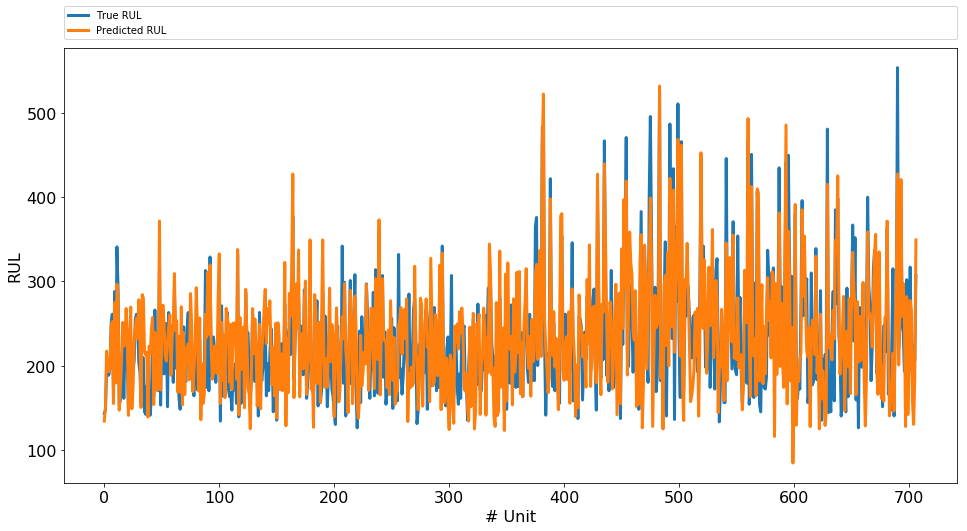

In [311]:
plt.figure(figsize = (16, 8))
plt.plot(testDataFrame_RUL,linewidth=3)
plt.plot(xpredictedRUL,linewidth=3)
plt.xlabel('# Unit', fontsize=16)
plt.xticks(fontsize=16)
plt.ylabel('RUL', fontsize=16)
plt.yticks(fontsize=16)
plt.legend(['True RUL','Predicted RUL'], bbox_to_anchor=(0., 1.02, 1., .102), loc=3, mode="expand", borderaxespad=0)
plt.show()

In [314]:
mse = mean_squared_error(testDataFrame_RUL, xpredictedRUL)
print (mse)
print ('Root Mean Squared Error (RMSE): '+ str(np.sqrt(mse)))

2266.2741322939587
Root Mean Squared Error (RMSE): 47.6054002429762


## Model for FD0001

In [316]:
reg = LassoCV(n_jobs=-1)
reg.fit(trainFD001, trainFD001_RUL)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)
print("Best score using built-in LassoCV: %f" %reg.score(trainDataFrame,trainDataFrame_RUL))
coef = pd.Series(reg.coef_, index = trainDataFrame.columns)

print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  
      str(sum(coef == 0)) + " variables")

Best alpha using built-in LassoCV: 41.780279
Best score using built-in LassoCV: 0.700985
Lasso picked 18 variables and eliminated the other 840 variables


In [317]:
newCols = list(coef[coef != 0].index)
newCols

['s9_mean_diff_of_10_cycle',
 'cycles_mean_of_feature',
 'cycles_median_of_feature',
 'cycles_slope_of_1_cycle_1',
 's4_slope_of_1_cycle_1',
 's9_slope_of_1_cycle_1',
 'cycles_slope_of_2_cycle_1',
 's9_slope_of_2_cycle_1',
 'cycles_slope_of_3_cycle_1',
 'cycles_slope_of_4_cycle_1',
 'cycles_slope_of_5_cycle_1',
 'cycles_slope_of_6_cycle_1',
 's3_slope_of_6_cycle_1',
 'cycles_slope_of_7_cycle_1',
 's4_slope_of_7_cycle_1',
 'cycles_slope_of_8_cycle_1',
 'cycles_slope_of_9_cycle_1',
 'cycles_slope_of_10_cycle_1']

In [318]:
X_train1 = trainFD001[newCols]
X_train1.head()

,s9_mean_diff_of_10_cycle,cycles_mean_of_feature,cycles_median_of_feature,cycles_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s9_slope_of_1_cycle_1,cycles_slope_of_2_cycle_1,s9_slope_of_2_cycle_1,cycles_slope_of_3_cycle_1,cycles_slope_of_4_cycle_1,cycles_slope_of_5_cycle_1,cycles_slope_of_6_cycle_1,s3_slope_of_6_cycle_1,cycles_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,cycles_slope_of_8_cycle_1,cycles_slope_of_9_cycle_1,cycles_slope_of_10_cycle_1
0,-381.155895,96.5,96.5,1.0,1395.131267,9051.999638,1.5,9051.972634,2.0,2.5,3.0,3.5,1583.832907,4.0,1395.724615,4.5,5.0,5.5
1,33.658750,144.0,144.0,-191.0,1371.627330,9020.597980,-190.5,9021.263657,-190.0,-189.5,-189.0,-188.5,1569.416438,-188.0,1372.216639,-187.5,-187.0,-186.5
2,357.823444,90.0,90.0,-478.0,1331.112583,8756.326214,-477.5,8753.610774,-477.0,-476.5,-476.0,-475.5,1542.201066,-475.0,1329.683189,-474.5,-474.0,-473.5
3,243.248737,95.0,95.0,-657.0,1334.669488,8659.331778,-656.5,8668.028501,-656.0,-655.5,-655.0,-654.5,1542.740192,-654.0,1334.724497,-653.5,-653.0,-652.5
4,102.589222,135.0,135.0,-846.0,1301.748739,8854.498288,-845.5,8853.427333,-845.0,-844.5,-844.0,-843.5,1521.015919,-843.0,1305.250824,-842.5,-842.0,-841.5


In [319]:
scaler = MinMaxScaler()
X_train1 = scaler.fit_transform(X_train1)

In [324]:
X_test1 = testFD001[newCols]
X_test1.head()

,s9_mean_diff_of_10_cycle,cycles_mean_of_feature,cycles_median_of_feature,cycles_slope_of_1_cycle_1,s4_slope_of_1_cycle_1,s9_slope_of_1_cycle_1,cycles_slope_of_2_cycle_1,s9_slope_of_2_cycle_1,cycles_slope_of_3_cycle_1,cycles_slope_of_4_cycle_1,cycles_slope_of_5_cycle_1,cycles_slope_of_6_cycle_1,s3_slope_of_6_cycle_1,cycles_slope_of_7_cycle_1,s4_slope_of_7_cycle_1,cycles_slope_of_8_cycle_1,cycles_slope_of_9_cycle_1,cycles_slope_of_10_cycle_1
0,-2715.023333,16.0,16.0,1.0,1401.819355,9049.997823,1.5,9050.471292,2.0,2.5,3.0,3.5,1584.903667,4.0,1401.460571,4.5,5.0,5.5
1,226.430000,25.0,25.0,-30.0,1404.910173,9045.834444,-29.5,9046.832199,-29.0,-28.5,-28.0,-27.5,1588.602083,-27.0,1404.052585,-26.5,-26.0,-25.5
2,-301.883083,63.5,63.5,-79.0,1400.291281,9054.586999,-78.5,9054.601523,-78.0,-77.5,-77.0,-76.5,1586.095003,-76.0,1400.474328,-75.5,-75.0,-74.5
3,-164.407545,53.5,53.5,-205.0,1395.803782,9050.531759,-204.5,9050.531341,-204.0,-203.5,-203.0,-202.5,1579.314890,-202.0,1395.281338,-201.5,-201.0,-200.5
4,201.109778,49.5,49.5,-311.0,1394.573642,9049.818970,-310.5,9049.791867,-310.0,-309.5,-309.0,-308.5,1578.956333,-308.0,1397.384922,-307.5,-307.0,-306.5


In [325]:
X_test1 = scaler.fit_transform(X_test1)

In [351]:
model = Sequential()
model.add(Dense(18, input_dim=18, kernel_initializer='normal', activation='relu'))
model.add(Dropout(rate=0.2))
model.add(Dense(8, kernel_initializer='normal'))
model.add(Dense(1, kernel_initializer='normal'))
model.compile(loss='mean_squared_error', optimizer='adam',metrics=['mae'])
es = EarlyStopping(monitor='val_loss', mode='min', patience=200)
model.fit(X_train1, trainFD001_RUL, validation_split=0.25, epochs=10000, batch_size=256, callbacks=[es],
          verbose=True)

Train on 75 samples, validate on 25 samples
Epoch 1/10000
75/75 [==============================] - 1s 10ms/step - loss: 42607.3359 - mean_absolute_error: 202.1207 - val_loss: 50938.2969 - val_mean_absolute_error: 218.8791
Epoch 2/10000
75/75 [==============================] - 0s 26us/step - loss: 42606.3594 - mean_absolute_error: 202.1182 - val_loss: 50937.5156 - val_mean_absolute_error: 218.8774
Epoch 3/10000
75/75 [==============================] - 0s 39us/step - loss: 42605.5000 - mean_absolute_error: 202.1162 - val_loss: 50936.6133 - val_mean_absolute_error: 218.8753
Epoch 4/10000
75/75 [==============================] - 0s 53us/step - loss: 42604.4609 - mean_absolute_error: 202.1136 - val_loss: 50935.6953 - val_mean_absolute_error: 218.8733
Epoch 5/10000
75/75 [==============================] - 0s 53us/step - loss: 42603.3750 - mean_absolute_error: 202.1109 - val_loss: 50934.7891 - val_mean_absolute_error: 218.8712
Epoch 6/10000
75/75 [==============================] - 0s 53us/ste

Epoch 47/10000
75/75 [==============================] - 0s 66us/step - loss: 42455.8242 - mean_absolute_error: 201.7489 - val_loss: 50830.0664 - val_mean_absolute_error: 218.6375
Epoch 48/10000
75/75 [==============================] - 0s 53us/step - loss: 42448.6875 - mean_absolute_error: 201.7286 - val_loss: 50824.6406 - val_mean_absolute_error: 218.6254
Epoch 49/10000
75/75 [==============================] - 0s 66us/step - loss: 42437.2695 - mean_absolute_error: 201.7006 - val_loss: 50818.9609 - val_mean_absolute_error: 218.6127
Epoch 50/10000
75/75 [==============================] - 0s 53us/step - loss: 42433.9609 - mean_absolute_error: 201.6916 - val_loss: 50813.1055 - val_mean_absolute_error: 218.5997
Epoch 51/10000
75/75 [==============================] - 0s 53us/step - loss: 42423.4219 - mean_absolute_error: 201.6690 - val_loss: 50807.0312 - val_mean_absolute_error: 218.5861
Epoch 52/10000
75/75 [==============================] - 0s 53us/step - loss: 42406.1875 - mean_absolute_e

Epoch 93/10000
75/75 [==============================] - 0s 53us/step - loss: 41538.8203 - mean_absolute_error: 199.4693 - val_loss: 50249.3398 - val_mean_absolute_error: 217.3413
Epoch 94/10000
75/75 [==============================] - 0s 53us/step - loss: 41498.0352 - mean_absolute_error: 199.3909 - val_loss: 50226.4336 - val_mean_absolute_error: 217.2900
Epoch 95/10000
75/75 [==============================] - 0s 40us/step - loss: 41429.2656 - mean_absolute_error: 199.1953 - val_loss: 50202.9219 - val_mean_absolute_error: 217.2374
Epoch 96/10000
75/75 [==============================] - 0s 27us/step - loss: 41417.3438 - mean_absolute_error: 199.1701 - val_loss: 50178.9648 - val_mean_absolute_error: 217.1837
Epoch 97/10000
75/75 [==============================] - 0s 53us/step - loss: 41322.7344 - mean_absolute_error: 198.9369 - val_loss: 50154.3516 - val_mean_absolute_error: 217.1286
Epoch 98/10000
75/75 [==============================] - 0s 40us/step - loss: 41347.6445 - mean_absolute_e

Epoch 139/10000
75/75 [==============================] - 0s 40us/step - loss: 38655.0977 - mean_absolute_error: 192.1841 - val_loss: 48501.9297 - val_mean_absolute_error: 213.3961
Epoch 140/10000
75/75 [==============================] - 0s 40us/step - loss: 38553.7266 - mean_absolute_error: 191.8785 - val_loss: 48445.8086 - val_mean_absolute_error: 213.2681
Epoch 141/10000
75/75 [==============================] - 0s 53us/step - loss: 38496.7773 - mean_absolute_error: 191.7392 - val_loss: 48388.7891 - val_mean_absolute_error: 213.1381
Epoch 142/10000
75/75 [==============================] - 0s 40us/step - loss: 38362.6250 - mean_absolute_error: 191.3114 - val_loss: 48330.8516 - val_mean_absolute_error: 213.0059
Epoch 143/10000
75/75 [==============================] - 0s 40us/step - loss: 38353.7383 - mean_absolute_error: 191.2382 - val_loss: 48272.0742 - val_mean_absolute_error: 212.8716
Epoch 144/10000
75/75 [==============================] - 0s 27us/step - loss: 38163.8750 - mean_abso

Epoch 185/10000
75/75 [==============================] - 0s 40us/step - loss: 32809.4609 - mean_absolute_error: 176.2769 - val_loss: 44939.5898 - val_mean_absolute_error: 205.1164
Epoch 186/10000
75/75 [==============================] - 0s 40us/step - loss: 32894.3203 - mean_absolute_error: 176.5582 - val_loss: 44839.1953 - val_mean_absolute_error: 204.8781
Epoch 187/10000
75/75 [==============================] - 0s 40us/step - loss: 32464.4961 - mean_absolute_error: 175.0594 - val_loss: 44737.9258 - val_mean_absolute_error: 204.6375
Epoch 188/10000
75/75 [==============================] - 0s 40us/step - loss: 32547.7227 - mean_absolute_error: 175.3185 - val_loss: 44635.5195 - val_mean_absolute_error: 204.3939
Epoch 189/10000
75/75 [==============================] - 0s 40us/step - loss: 32205.8066 - mean_absolute_error: 174.2826 - val_loss: 44532.3281 - val_mean_absolute_error: 204.1482
Epoch 190/10000
75/75 [==============================] - 0s 40us/step - loss: 32183.5391 - mean_abso

Epoch 231/10000
75/75 [==============================] - 0s 40us/step - loss: 24368.9219 - mean_absolute_error: 149.9559 - val_loss: 39376.5781 - val_mean_absolute_error: 191.4609
Epoch 232/10000
75/75 [==============================] - 0s 40us/step - loss: 24185.1230 - mean_absolute_error: 149.2454 - val_loss: 39236.2109 - val_mean_absolute_error: 191.1036
Epoch 233/10000
75/75 [==============================] - 0s 27us/step - loss: 24423.3867 - mean_absolute_error: 150.5405 - val_loss: 39095.1914 - val_mean_absolute_error: 190.7438
Epoch 234/10000
75/75 [==============================] - 0s 40us/step - loss: 23693.0059 - mean_absolute_error: 147.7353 - val_loss: 38953.5352 - val_mean_absolute_error: 190.3817
Epoch 235/10000
75/75 [==============================] - 0s 40us/step - loss: 23691.6133 - mean_absolute_error: 147.4724 - val_loss: 38811.1445 - val_mean_absolute_error: 190.0171
Epoch 236/10000
75/75 [==============================] - 0s 40us/step - loss: 23373.9062 - mean_abso

Epoch 277/10000
75/75 [==============================] - 0s 40us/step - loss: 15125.7979 - mean_absolute_error: 114.6663 - val_loss: 32405.7617 - val_mean_absolute_error: 172.8045
Epoch 278/10000
75/75 [==============================] - 0s 40us/step - loss: 15551.2383 - mean_absolute_error: 116.2465 - val_loss: 32248.5059 - val_mean_absolute_error: 172.3599
Epoch 279/10000
75/75 [==============================] - 0s 40us/step - loss: 15510.7021 - mean_absolute_error: 115.1689 - val_loss: 32091.1523 - val_mean_absolute_error: 171.9138
Epoch 280/10000
75/75 [==============================] - 0s 53us/step - loss: 15109.4502 - mean_absolute_error: 113.0987 - val_loss: 31934.0352 - val_mean_absolute_error: 171.4673
Epoch 281/10000
75/75 [==============================] - 0s 40us/step - loss: 14900.0498 - mean_absolute_error: 112.6601 - val_loss: 31776.9980 - val_mean_absolute_error: 171.0198
Epoch 282/10000
75/75 [==============================] - 0s 27us/step - loss: 15046.2764 - mean_abso

Epoch 323/10000
75/75 [==============================] - 0s 40us/step - loss: 8799.7383 - mean_absolute_error: 78.9591 - val_loss: 25512.8984 - val_mean_absolute_error: 152.0785
Epoch 324/10000
75/75 [==============================] - 0s 40us/step - loss: 8509.9834 - mean_absolute_error: 78.1706 - val_loss: 25376.8457 - val_mean_absolute_error: 151.6404
Epoch 325/10000
75/75 [==============================] - 0s 27us/step - loss: 8058.6909 - mean_absolute_error: 75.1001 - val_loss: 25242.2949 - val_mean_absolute_error: 151.2059
Epoch 326/10000
75/75 [==============================] - 0s 40us/step - loss: 8388.6709 - mean_absolute_error: 76.0335 - val_loss: 25109.2500 - val_mean_absolute_error: 150.7750
Epoch 327/10000
75/75 [==============================] - 0s 40us/step - loss: 8387.6641 - mean_absolute_error: 74.7755 - val_loss: 24977.1348 - val_mean_absolute_error: 150.3459
Epoch 328/10000
75/75 [==============================] - 0s 27us/step - loss: 7300.0439 - mean_absolute_error:

Epoch 370/10000
75/75 [==============================] - 0s 40us/step - loss: 4627.8799 - mean_absolute_error: 52.7208 - val_loss: 20329.9648 - val_mean_absolute_error: 134.3741
Epoch 371/10000
75/75 [==============================] - 0s 40us/step - loss: 4908.8125 - mean_absolute_error: 52.9445 - val_loss: 20245.8730 - val_mean_absolute_error: 134.0675
Epoch 372/10000
75/75 [==============================] - 0s 40us/step - loss: 5280.1001 - mean_absolute_error: 58.0094 - val_loss: 20163.1973 - val_mean_absolute_error: 133.7655
Epoch 373/10000
75/75 [==============================] - 0s 40us/step - loss: 4999.8330 - mean_absolute_error: 52.1381 - val_loss: 20081.8262 - val_mean_absolute_error: 133.4675
Epoch 374/10000
75/75 [==============================] - 0s 40us/step - loss: 5174.0254 - mean_absolute_error: 55.8359 - val_loss: 20002.2695 - val_mean_absolute_error: 133.1756
Epoch 375/10000
75/75 [==============================] - 0s 40us/step - loss: 4242.3389 - mean_absolute_error:

Epoch 417/10000
75/75 [==============================] - 0s 27us/step - loss: 4138.0640 - mean_absolute_error: 50.4260 - val_loss: 17567.4141 - val_mean_absolute_error: 123.9304
Epoch 418/10000
75/75 [==============================] - 0s 27us/step - loss: 3993.9651 - mean_absolute_error: 48.1125 - val_loss: 17526.4141 - val_mean_absolute_error: 123.7692
Epoch 419/10000
75/75 [==============================] - 0s 40us/step - loss: 4276.9390 - mean_absolute_error: 49.2243 - val_loss: 17486.7246 - val_mean_absolute_error: 123.6131
Epoch 420/10000
75/75 [==============================] - 0s 40us/step - loss: 4624.7148 - mean_absolute_error: 54.6975 - val_loss: 17447.7734 - val_mean_absolute_error: 123.4598
Epoch 421/10000
75/75 [==============================] - 0s 40us/step - loss: 4147.6333 - mean_absolute_error: 54.2536 - val_loss: 17409.5977 - val_mean_absolute_error: 123.3094
Epoch 422/10000
75/75 [==============================] - 0s 26us/step - loss: 3745.9983 - mean_absolute_error:

75/75 [==============================] - 0s 40us/step - loss: 3885.3774 - mean_absolute_error: 49.8797 - val_loss: 16492.7871 - val_mean_absolute_error: 119.6836
Epoch 464/10000
75/75 [==============================] - 0s 40us/step - loss: 4233.3135 - mean_absolute_error: 52.9686 - val_loss: 16482.3320 - val_mean_absolute_error: 119.6430
Epoch 465/10000
75/75 [==============================] - 0s 27us/step - loss: 4502.6123 - mean_absolute_error: 52.1421 - val_loss: 16471.7617 - val_mean_absolute_error: 119.6019
Epoch 466/10000
75/75 [==============================] - 0s 40us/step - loss: 4903.1333 - mean_absolute_error: 55.2517 - val_loss: 16459.9219 - val_mean_absolute_error: 119.5555
Epoch 467/10000
75/75 [==============================] - 0s 40us/step - loss: 4128.0718 - mean_absolute_error: 45.7596 - val_loss: 16449.0371 - val_mean_absolute_error: 119.5131
Epoch 468/10000
75/75 [==============================] - 0s 40us/step - loss: 4265.7817 - mean_absolute_error: 52.2973 - val_l

Epoch 510/10000
75/75 [==============================] - 0s 40us/step - loss: 3316.1392 - mean_absolute_error: 41.6316 - val_loss: 16150.5615 - val_mean_absolute_error: 118.3828
Epoch 511/10000
75/75 [==============================] - 0s 40us/step - loss: 4471.4155 - mean_absolute_error: 54.3847 - val_loss: 16139.7051 - val_mean_absolute_error: 118.3401
Epoch 512/10000
75/75 [==============================] - 0s 40us/step - loss: 3599.9233 - mean_absolute_error: 42.6381 - val_loss: 16126.4473 - val_mean_absolute_error: 118.2873
Epoch 513/10000
75/75 [==============================] - 0s 40us/step - loss: 4602.4302 - mean_absolute_error: 55.8576 - val_loss: 16114.1260 - val_mean_absolute_error: 118.2385
Epoch 514/10000
75/75 [==============================] - 0s 40us/step - loss: 5071.1968 - mean_absolute_error: 55.7170 - val_loss: 16102.2842 - val_mean_absolute_error: 118.1916
Epoch 515/10000
75/75 [==============================] - 0s 27us/step - loss: 4296.9653 - mean_absolute_error:

75/75 [==============================] - 0s 40us/step - loss: 4135.8164 - mean_absolute_error: 52.6990 - val_loss: 15724.5371 - val_mean_absolute_error: 116.7135
Epoch 557/10000
75/75 [==============================] - 0s 40us/step - loss: 4259.1426 - mean_absolute_error: 52.1377 - val_loss: 15718.4639 - val_mean_absolute_error: 116.6904
Epoch 558/10000
75/75 [==============================] - 0s 40us/step - loss: 5098.8081 - mean_absolute_error: 55.9570 - val_loss: 15713.0762 - val_mean_absolute_error: 116.6702
Epoch 559/10000
75/75 [==============================] - 0s 40us/step - loss: 3812.6750 - mean_absolute_error: 48.5394 - val_loss: 15707.8623 - val_mean_absolute_error: 116.6508
Epoch 560/10000
75/75 [==============================] - 0s 40us/step - loss: 3654.6541 - mean_absolute_error: 45.1953 - val_loss: 15701.7451 - val_mean_absolute_error: 116.6275
Epoch 561/10000
75/75 [==============================] - 0s 27us/step - loss: 4088.7222 - mean_absolute_error: 52.7603 - val_l

Epoch 603/10000
75/75 [==============================] - 0s 40us/step - loss: 4043.3762 - mean_absolute_error: 49.4637 - val_loss: 15490.7559 - val_mean_absolute_error: 115.8473
Epoch 604/10000
75/75 [==============================] - 0s 40us/step - loss: 4668.4507 - mean_absolute_error: 55.2496 - val_loss: 15481.6680 - val_mean_absolute_error: 115.8113
Epoch 605/10000
75/75 [==============================] - 0s 27us/step - loss: 3480.0107 - mean_absolute_error: 47.0720 - val_loss: 15473.6592 - val_mean_absolute_error: 115.7800
Epoch 606/10000
75/75 [==============================] - 0s 40us/step - loss: 4193.2148 - mean_absolute_error: 50.0413 - val_loss: 15463.6338 - val_mean_absolute_error: 115.7400
Epoch 607/10000
75/75 [==============================] - 0s 27us/step - loss: 4281.4824 - mean_absolute_error: 54.0816 - val_loss: 15453.4473 - val_mean_absolute_error: 115.6993
Epoch 608/10000
75/75 [==============================] - 0s 27us/step - loss: 4717.6182 - mean_absolute_error:

75/75 [==============================] - 0s 40us/step - loss: 4036.2317 - mean_absolute_error: 50.9603 - val_loss: 15211.8389 - val_mean_absolute_error: 114.7831
Epoch 650/10000
75/75 [==============================] - 0s 40us/step - loss: 4209.4785 - mean_absolute_error: 51.5455 - val_loss: 15208.6592 - val_mean_absolute_error: 114.7723
Epoch 651/10000
75/75 [==============================] - 0s 40us/step - loss: 3751.3616 - mean_absolute_error: 46.4645 - val_loss: 15203.4961 - val_mean_absolute_error: 114.7529
Epoch 652/10000
75/75 [==============================] - 0s 40us/step - loss: 4931.3521 - mean_absolute_error: 55.3390 - val_loss: 15199.7500 - val_mean_absolute_error: 114.7397
Epoch 653/10000
75/75 [==============================] - 0s 53us/step - loss: 3598.2705 - mean_absolute_error: 46.0476 - val_loss: 15195.7939 - val_mean_absolute_error: 114.7256
Epoch 654/10000
75/75 [==============================] - 0s 40us/step - loss: 3957.0508 - mean_absolute_error: 51.0622 - val_l

Epoch 696/10000
75/75 [==============================] - 0s 40us/step - loss: 4183.8652 - mean_absolute_error: 50.1899 - val_loss: 14860.3750 - val_mean_absolute_error: 113.4004
Epoch 697/10000
75/75 [==============================] - 0s 27us/step - loss: 4169.7690 - mean_absolute_error: 52.4302 - val_loss: 14854.3301 - val_mean_absolute_error: 113.3771
Epoch 698/10000
75/75 [==============================] - 0s 40us/step - loss: 4092.1174 - mean_absolute_error: 51.0579 - val_loss: 14848.5654 - val_mean_absolute_error: 113.3550
Epoch 699/10000
75/75 [==============================] - 0s 27us/step - loss: 3855.9875 - mean_absolute_error: 51.7752 - val_loss: 14842.7129 - val_mean_absolute_error: 113.3326
Epoch 700/10000
75/75 [==============================] - 0s 40us/step - loss: 4056.5129 - mean_absolute_error: 47.1002 - val_loss: 14836.2959 - val_mean_absolute_error: 113.3076
Epoch 701/10000
75/75 [==============================] - 0s 27us/step - loss: 4182.0176 - mean_absolute_error:

Epoch 743/10000
75/75 [==============================] - 0s 40us/step - loss: 4053.1592 - mean_absolute_error: 45.7262 - val_loss: 14611.9336 - val_mean_absolute_error: 112.4561
Epoch 744/10000
75/75 [==============================] - 0s 40us/step - loss: 4477.5464 - mean_absolute_error: 55.4180 - val_loss: 14606.3115 - val_mean_absolute_error: 112.4344
Epoch 745/10000
75/75 [==============================] - 0s 27us/step - loss: 4509.8682 - mean_absolute_error: 52.2659 - val_loss: 14599.6211 - val_mean_absolute_error: 112.4081
Epoch 746/10000
75/75 [==============================] - 0s 40us/step - loss: 3514.3967 - mean_absolute_error: 49.1516 - val_loss: 14593.6660 - val_mean_absolute_error: 112.3850
Epoch 747/10000
75/75 [==============================] - 0s 40us/step - loss: 3132.1838 - mean_absolute_error: 44.8967 - val_loss: 14588.4287 - val_mean_absolute_error: 112.3650
Epoch 748/10000
75/75 [==============================] - 0s 27us/step - loss: 4196.4336 - mean_absolute_error:

Epoch 790/10000
75/75 [==============================] - 0s 40us/step - loss: 3555.7224 - mean_absolute_error: 46.3202 - val_loss: 14260.8301 - val_mean_absolute_error: 111.0522
Epoch 791/10000
75/75 [==============================] - 0s 40us/step - loss: 3733.8574 - mean_absolute_error: 49.4144 - val_loss: 14258.4141 - val_mean_absolute_error: 111.0445
Epoch 792/10000
75/75 [==============================] - 0s 40us/step - loss: 3038.2898 - mean_absolute_error: 42.6624 - val_loss: 14253.9277 - val_mean_absolute_error: 111.0276
Epoch 793/10000
75/75 [==============================] - 0s 40us/step - loss: 3687.7300 - mean_absolute_error: 46.5805 - val_loss: 14245.9473 - val_mean_absolute_error: 110.9952
Epoch 794/10000
75/75 [==============================] - 0s 40us/step - loss: 3355.0774 - mean_absolute_error: 47.9827 - val_loss: 14237.1953 - val_mean_absolute_error: 110.9595
Epoch 795/10000
75/75 [==============================] - 0s 40us/step - loss: 4009.1455 - mean_absolute_error:

Epoch 837/10000
75/75 [==============================] - 0s 27us/step - loss: 3926.4954 - mean_absolute_error: 48.6947 - val_loss: 13957.9014 - val_mean_absolute_error: 109.8485
Epoch 838/10000
75/75 [==============================] - 0s 27us/step - loss: 3784.1350 - mean_absolute_error: 46.6309 - val_loss: 13954.9609 - val_mean_absolute_error: 109.8386
Epoch 839/10000
75/75 [==============================] - 0s 40us/step - loss: 3255.1907 - mean_absolute_error: 45.1259 - val_loss: 13950.9473 - val_mean_absolute_error: 109.8237
Epoch 840/10000
75/75 [==============================] - 0s 27us/step - loss: 3690.7759 - mean_absolute_error: 47.5902 - val_loss: 13946.4512 - val_mean_absolute_error: 109.8068
Epoch 841/10000
75/75 [==============================] - 0s 40us/step - loss: 4229.0337 - mean_absolute_error: 52.2138 - val_loss: 13944.2588 - val_mean_absolute_error: 109.8002
Epoch 842/10000
75/75 [==============================] - 0s 40us/step - loss: 3420.9619 - mean_absolute_error:

Epoch 884/10000
75/75 [==============================] - 0s 40us/step - loss: 3883.9817 - mean_absolute_error: 50.7256 - val_loss: 13707.7715 - val_mean_absolute_error: 108.8753
Epoch 885/10000
75/75 [==============================] - 0s 53us/step - loss: 3696.4275 - mean_absolute_error: 46.6294 - val_loss: 13703.9102 - val_mean_absolute_error: 108.8610
Epoch 886/10000
75/75 [==============================] - 0s 27us/step - loss: 3637.2029 - mean_absolute_error: 47.1285 - val_loss: 13694.3125 - val_mean_absolute_error: 108.8209
Epoch 887/10000
75/75 [==============================] - 0s 27us/step - loss: 3336.1055 - mean_absolute_error: 45.7909 - val_loss: 13683.6367 - val_mean_absolute_error: 108.7760
Epoch 888/10000
75/75 [==============================] - 0s 40us/step - loss: 3914.6333 - mean_absolute_error: 47.3968 - val_loss: 13672.3086 - val_mean_absolute_error: 108.7281
Epoch 889/10000
75/75 [==============================] - 0s 40us/step - loss: 4593.0801 - mean_absolute_error:

Epoch 931/10000
75/75 [==============================] - 0s 40us/step - loss: 3935.0679 - mean_absolute_error: 50.2954 - val_loss: 13352.5664 - val_mean_absolute_error: 107.4162
Epoch 932/10000
75/75 [==============================] - 0s 40us/step - loss: 3863.6145 - mean_absolute_error: 48.9215 - val_loss: 13353.8525 - val_mean_absolute_error: 107.4253
Epoch 933/10000
75/75 [==============================] - 0s 40us/step - loss: 3830.8467 - mean_absolute_error: 48.5726 - val_loss: 13354.4062 - val_mean_absolute_error: 107.4311
Epoch 934/10000
75/75 [==============================] - 0s 40us/step - loss: 3800.2417 - mean_absolute_error: 49.4361 - val_loss: 13355.6260 - val_mean_absolute_error: 107.4399
Epoch 935/10000
75/75 [==============================] - 0s 27us/step - loss: 3931.5234 - mean_absolute_error: 47.3875 - val_loss: 13355.7715 - val_mean_absolute_error: 107.4439
Epoch 936/10000
75/75 [==============================] - 0s 27us/step - loss: 3015.9099 - mean_absolute_error:

Epoch 978/10000
75/75 [==============================] - 0s 27us/step - loss: 3010.3000 - mean_absolute_error: 43.4158 - val_loss: 13035.8896 - val_mean_absolute_error: 106.1178
Epoch 979/10000
75/75 [==============================] - 0s 40us/step - loss: 4196.1606 - mean_absolute_error: 49.3107 - val_loss: 13028.2852 - val_mean_absolute_error: 106.0860
Epoch 980/10000
75/75 [==============================] - 0s 40us/step - loss: 4135.0410 - mean_absolute_error: 49.5248 - val_loss: 13015.8252 - val_mean_absolute_error: 106.0316
Epoch 981/10000
75/75 [==============================] - 0s 40us/step - loss: 3717.8774 - mean_absolute_error: 47.6029 - val_loss: 13001.3779 - val_mean_absolute_error: 105.9681
Epoch 982/10000
75/75 [==============================] - 0s 40us/step - loss: 3314.3911 - mean_absolute_error: 45.1915 - val_loss: 12988.7451 - val_mean_absolute_error: 105.9129
Epoch 983/10000
75/75 [==============================] - 0s 40us/step - loss: 4863.6924 - mean_absolute_error:

Epoch 1024/10000
75/75 [==============================] - 0s 40us/step - loss: 3923.5164 - mean_absolute_error: 48.8556 - val_loss: 12502.9141 - val_mean_absolute_error: 103.7855
Epoch 1025/10000
75/75 [==============================] - 0s 40us/step - loss: 4035.1675 - mean_absolute_error: 47.6989 - val_loss: 12483.9561 - val_mean_absolute_error: 103.6995
Epoch 1026/10000
75/75 [==============================] - 0s 40us/step - loss: 2919.5049 - mean_absolute_error: 41.1856 - val_loss: 12466.7275 - val_mean_absolute_error: 103.6215
Epoch 1027/10000
75/75 [==============================] - 0s 27us/step - loss: 3855.1133 - mean_absolute_error: 48.5928 - val_loss: 12450.2188 - val_mean_absolute_error: 103.5469
Epoch 1028/10000
75/75 [==============================] - 0s 40us/step - loss: 3718.1375 - mean_absolute_error: 47.7855 - val_loss: 12433.8740 - val_mean_absolute_error: 103.4730
Epoch 1029/10000
75/75 [==============================] - 0s 40us/step - loss: 3691.6267 - mean_absolute_

Epoch 1070/10000
75/75 [==============================] - 0s 40us/step - loss: 4327.1167 - mean_absolute_error: 49.5179 - val_loss: 12192.1123 - val_mean_absolute_error: 102.4697
Epoch 1071/10000
75/75 [==============================] - 0s 26us/step - loss: 3422.4084 - mean_absolute_error: 47.8294 - val_loss: 12182.5234 - val_mean_absolute_error: 102.4275
Epoch 1072/10000
75/75 [==============================] - 0s 40us/step - loss: 3772.2407 - mean_absolute_error: 47.2830 - val_loss: 12174.1729 - val_mean_absolute_error: 102.3911
Epoch 1073/10000
75/75 [==============================] - 0s 27us/step - loss: 3158.6604 - mean_absolute_error: 44.4389 - val_loss: 12161.7822 - val_mean_absolute_error: 102.3353
Epoch 1074/10000
75/75 [==============================] - 0s 40us/step - loss: 4432.1479 - mean_absolute_error: 51.1023 - val_loss: 12151.9648 - val_mean_absolute_error: 102.2919
Epoch 1075/10000
75/75 [==============================] - 0s 40us/step - loss: 3505.4521 - mean_absolute_

Epoch 1116/10000
75/75 [==============================] - 0s 40us/step - loss: 3061.1250 - mean_absolute_error: 44.7713 - val_loss: 11755.5000 - val_mean_absolute_error: 100.5294
Epoch 1117/10000
75/75 [==============================] - 0s 40us/step - loss: 3478.4680 - mean_absolute_error: 47.1392 - val_loss: 11746.2070 - val_mean_absolute_error: 100.4878
Epoch 1118/10000
75/75 [==============================] - 0s 27us/step - loss: 4055.8118 - mean_absolute_error: 49.6844 - val_loss: 11739.7578 - val_mean_absolute_error: 100.4600
Epoch 1119/10000
75/75 [==============================] - 0s 27us/step - loss: 3895.6938 - mean_absolute_error: 49.1965 - val_loss: 11732.3574 - val_mean_absolute_error: 100.4277
Epoch 1120/10000
75/75 [==============================] - 0s 40us/step - loss: 3386.9236 - mean_absolute_error: 48.2544 - val_loss: 11724.5439 - val_mean_absolute_error: 100.3933
Epoch 1121/10000
75/75 [==============================] - 0s 53us/step - loss: 3281.9705 - mean_absolute_

Epoch 1162/10000
75/75 [==============================] - 0s 40us/step - loss: 3173.0391 - mean_absolute_error: 44.6017 - val_loss: 11550.5195 - val_mean_absolute_error: 99.6998
Epoch 1163/10000
75/75 [==============================] - 0s 40us/step - loss: 3593.7429 - mean_absolute_error: 44.8795 - val_loss: 11549.9346 - val_mean_absolute_error: 99.7007
Epoch 1164/10000
75/75 [==============================] - 0s 40us/step - loss: 3700.5649 - mean_absolute_error: 46.7741 - val_loss: 11548.6904 - val_mean_absolute_error: 99.6983
Epoch 1165/10000
75/75 [==============================] - 0s 27us/step - loss: 3247.1245 - mean_absolute_error: 44.5226 - val_loss: 11546.6289 - val_mean_absolute_error: 99.6920
Epoch 1166/10000
75/75 [==============================] - 0s 40us/step - loss: 3043.6343 - mean_absolute_error: 40.7862 - val_loss: 11539.3174 - val_mean_absolute_error: 99.6599
Epoch 1167/10000
75/75 [==============================] - 0s 40us/step - loss: 4364.7036 - mean_absolute_error

75/75 [==============================] - 0s 27us/step - loss: 3684.0042 - mean_absolute_error: 49.8712 - val_loss: 11176.5771 - val_mean_absolute_error: 98.0250
Epoch 1209/10000
75/75 [==============================] - 0s 40us/step - loss: 3631.2600 - mean_absolute_error: 50.0242 - val_loss: 11170.6875 - val_mean_absolute_error: 97.9994
Epoch 1210/10000
75/75 [==============================] - 0s 40us/step - loss: 3430.1995 - mean_absolute_error: 44.0565 - val_loss: 11169.2061 - val_mean_absolute_error: 97.9959
Epoch 1211/10000
75/75 [==============================] - 0s 40us/step - loss: 3672.5874 - mean_absolute_error: 45.5019 - val_loss: 11165.5098 - val_mean_absolute_error: 97.9813
Epoch 1212/10000
75/75 [==============================] - 0s 40us/step - loss: 3058.1995 - mean_absolute_error: 46.6860 - val_loss: 11161.2373 - val_mean_absolute_error: 97.9638
Epoch 1213/10000
75/75 [==============================] - 0s 40us/step - loss: 3154.4321 - mean_absolute_error: 45.2217 - val_l

Epoch 1255/10000
75/75 [==============================] - 0s 40us/step - loss: 3380.2830 - mean_absolute_error: 47.7637 - val_loss: 10743.0439 - val_mean_absolute_error: 96.0249
Epoch 1256/10000
75/75 [==============================] - 0s 40us/step - loss: 3422.6047 - mean_absolute_error: 44.8036 - val_loss: 10735.0713 - val_mean_absolute_error: 95.9883
Epoch 1257/10000
75/75 [==============================] - 0s 40us/step - loss: 3208.5986 - mean_absolute_error: 45.3588 - val_loss: 10723.9229 - val_mean_absolute_error: 95.9356
Epoch 1258/10000
75/75 [==============================] - 0s 40us/step - loss: 4041.0278 - mean_absolute_error: 49.8046 - val_loss: 10715.3174 - val_mean_absolute_error: 95.8958
Epoch 1259/10000
75/75 [==============================] - 0s 40us/step - loss: 2714.9084 - mean_absolute_error: 40.9283 - val_loss: 10705.0801 - val_mean_absolute_error: 95.8476
Epoch 1260/10000
75/75 [==============================] - 0s 40us/step - loss: 3598.9983 - mean_absolute_error

75/75 [==============================] - 0s 40us/step - loss: 3366.9871 - mean_absolute_error: 46.3449 - val_loss: 10375.3975 - val_mean_absolute_error: 94.3241
Epoch 1302/10000
75/75 [==============================] - 0s 40us/step - loss: 2821.3704 - mean_absolute_error: 43.3989 - val_loss: 10369.5322 - val_mean_absolute_error: 94.2977
Epoch 1303/10000
75/75 [==============================] - 0s 27us/step - loss: 2729.0254 - mean_absolute_error: 43.1555 - val_loss: 10369.0078 - val_mean_absolute_error: 94.2990
Epoch 1304/10000
75/75 [==============================] - 0s 27us/step - loss: 3883.2068 - mean_absolute_error: 49.1032 - val_loss: 10368.0195 - val_mean_absolute_error: 94.2978
Epoch 1305/10000
75/75 [==============================] - 0s 40us/step - loss: 3950.4905 - mean_absolute_error: 50.0264 - val_loss: 10366.0391 - val_mean_absolute_error: 94.2915
Epoch 1306/10000
75/75 [==============================] - 0s 40us/step - loss: 3396.6045 - mean_absolute_error: 45.4058 - val_l

Epoch 1348/10000
75/75 [==============================] - 0s 27us/step - loss: 3535.1326 - mean_absolute_error: 47.2308 - val_loss: 9943.7051 - val_mean_absolute_error: 92.2631
Epoch 1349/10000
75/75 [==============================] - 0s 40us/step - loss: 3049.4702 - mean_absolute_error: 44.3514 - val_loss: 9936.6562 - val_mean_absolute_error: 92.2300
Epoch 1350/10000
75/75 [==============================] - 0s 27us/step - loss: 3429.8538 - mean_absolute_error: 44.7893 - val_loss: 9929.6230 - val_mean_absolute_error: 92.1971
Epoch 1351/10000
75/75 [==============================] - 0s 40us/step - loss: 3326.6343 - mean_absolute_error: 46.8080 - val_loss: 9923.4746 - val_mean_absolute_error: 92.1688
Epoch 1352/10000
75/75 [==============================] - 0s 40us/step - loss: 3313.7729 - mean_absolute_error: 45.0097 - val_loss: 9915.4824 - val_mean_absolute_error: 92.1307
Epoch 1353/10000
75/75 [==============================] - 0s 40us/step - loss: 3360.3064 - mean_absolute_error: 46.

Epoch 1395/10000
75/75 [==============================] - 0s 40us/step - loss: 3328.6062 - mean_absolute_error: 45.1925 - val_loss: 9566.1680 - val_mean_absolute_error: 90.4492
Epoch 1396/10000
75/75 [==============================] - 0s 40us/step - loss: 2363.6448 - mean_absolute_error: 38.6166 - val_loss: 9559.1826 - val_mean_absolute_error: 90.4157
Epoch 1397/10000
75/75 [==============================] - 0s 40us/step - loss: 3051.7024 - mean_absolute_error: 42.9278 - val_loss: 9549.0723 - val_mean_absolute_error: 90.3654
Epoch 1398/10000
75/75 [==============================] - 0s 53us/step - loss: 2907.5012 - mean_absolute_error: 41.3398 - val_loss: 9538.4141 - val_mean_absolute_error: 90.3121
Epoch 1399/10000
75/75 [==============================] - 0s 27us/step - loss: 3198.7800 - mean_absolute_error: 43.7534 - val_loss: 9528.3164 - val_mean_absolute_error: 90.2619
Epoch 1400/10000
75/75 [==============================] - 0s 27us/step - loss: 3122.2981 - mean_absolute_error: 46.

Epoch 1442/10000
75/75 [==============================] - 0s 40us/step - loss: 2965.0349 - mean_absolute_error: 44.0932 - val_loss: 9171.2852 - val_mean_absolute_error: 88.5055
Epoch 1443/10000
75/75 [==============================] - 0s 27us/step - loss: 2482.2693 - mean_absolute_error: 41.0528 - val_loss: 9160.6104 - val_mean_absolute_error: 88.4512
Epoch 1444/10000
75/75 [==============================] - 0s 40us/step - loss: 2954.9314 - mean_absolute_error: 42.3260 - val_loss: 9147.5918 - val_mean_absolute_error: 88.3840
Epoch 1445/10000
75/75 [==============================] - 0s 40us/step - loss: 3430.5093 - mean_absolute_error: 47.4904 - val_loss: 9134.6299 - val_mean_absolute_error: 88.3172
Epoch 1446/10000
75/75 [==============================] - 0s 27us/step - loss: 2802.9854 - mean_absolute_error: 43.9997 - val_loss: 9124.0703 - val_mean_absolute_error: 88.2635
Epoch 1447/10000
75/75 [==============================] - 0s 40us/step - loss: 3012.6409 - mean_absolute_error: 42.

Epoch 1489/10000
75/75 [==============================] - 0s 40us/step - loss: 2817.8640 - mean_absolute_error: 43.0576 - val_loss: 8740.7695 - val_mean_absolute_error: 86.3232
Epoch 1490/10000
75/75 [==============================] - 0s 40us/step - loss: 3482.3838 - mean_absolute_error: 48.4733 - val_loss: 8737.7598 - val_mean_absolute_error: 86.3110
Epoch 1491/10000
75/75 [==============================] - 0s 40us/step - loss: 3465.2471 - mean_absolute_error: 44.6959 - val_loss: 8730.9658 - val_mean_absolute_error: 86.2774
Epoch 1492/10000
75/75 [==============================] - 0s 40us/step - loss: 3401.4529 - mean_absolute_error: 46.6913 - val_loss: 8724.4541 - val_mean_absolute_error: 86.2454
Epoch 1493/10000
75/75 [==============================] - 0s 40us/step - loss: 2519.2534 - mean_absolute_error: 42.2557 - val_loss: 8717.1191 - val_mean_absolute_error: 86.2086
Epoch 1494/10000
75/75 [==============================] - 0s 27us/step - loss: 3545.3550 - mean_absolute_error: 48.

Epoch 1536/10000
75/75 [==============================] - 0s 40us/step - loss: 3186.4468 - mean_absolute_error: 45.2258 - val_loss: 8339.8447 - val_mean_absolute_error: 84.2598
Epoch 1537/10000
75/75 [==============================] - 0s 40us/step - loss: 3008.4949 - mean_absolute_error: 44.6469 - val_loss: 8331.9209 - val_mean_absolute_error: 84.2190
Epoch 1538/10000
75/75 [==============================] - 0s 40us/step - loss: 3332.3174 - mean_absolute_error: 43.8460 - val_loss: 8324.7178 - val_mean_absolute_error: 84.1823
Epoch 1539/10000
75/75 [==============================] - 0s 40us/step - loss: 3511.3757 - mean_absolute_error: 47.7580 - val_loss: 8315.0557 - val_mean_absolute_error: 84.1314
Epoch 1540/10000
75/75 [==============================] - 0s 27us/step - loss: 2996.3613 - mean_absolute_error: 43.5051 - val_loss: 8304.1426 - val_mean_absolute_error: 84.0732
Epoch 1541/10000
75/75 [==============================] - 0s 40us/step - loss: 2922.9783 - mean_absolute_error: 38.

Epoch 1583/10000
75/75 [==============================] - 0s 40us/step - loss: 2691.5852 - mean_absolute_error: 40.7013 - val_loss: 7949.3979 - val_mean_absolute_error: 82.2134
Epoch 1584/10000
75/75 [==============================] - 0s 40us/step - loss: 2672.2246 - mean_absolute_error: 40.1546 - val_loss: 7943.1206 - val_mean_absolute_error: 82.1814
Epoch 1585/10000
75/75 [==============================] - 0s 27us/step - loss: 2910.7080 - mean_absolute_error: 41.9227 - val_loss: 7932.9326 - val_mean_absolute_error: 82.1263
Epoch 1586/10000
75/75 [==============================] - 0s 40us/step - loss: 2494.6956 - mean_absolute_error: 37.6718 - val_loss: 7921.9985 - val_mean_absolute_error: 82.0666
Epoch 1587/10000
75/75 [==============================] - 0s 40us/step - loss: 3065.9705 - mean_absolute_error: 41.0114 - val_loss: 7912.8027 - val_mean_absolute_error: 82.0172
Epoch 1588/10000
75/75 [==============================] - 0s 27us/step - loss: 3145.7107 - mean_absolute_error: 43.

Epoch 1630/10000
75/75 [==============================] - 0s 40us/step - loss: 2866.0032 - mean_absolute_error: 43.1877 - val_loss: 7357.6362 - val_mean_absolute_error: 78.8895
Epoch 1631/10000
75/75 [==============================] - 0s 40us/step - loss: 2762.4924 - mean_absolute_error: 39.6642 - val_loss: 7346.1450 - val_mean_absolute_error: 78.8240
Epoch 1632/10000
75/75 [==============================] - 0s 40us/step - loss: 2312.7720 - mean_absolute_error: 41.0002 - val_loss: 7338.0386 - val_mean_absolute_error: 78.7792
Epoch 1633/10000
75/75 [==============================] - 0s 27us/step - loss: 2557.9028 - mean_absolute_error: 39.8441 - val_loss: 7332.1938 - val_mean_absolute_error: 78.7484
Epoch 1634/10000
75/75 [==============================] - 0s 40us/step - loss: 2433.6311 - mean_absolute_error: 38.6821 - val_loss: 7326.9912 - val_mean_absolute_error: 78.7215
Epoch 1635/10000
75/75 [==============================] - 0s 40us/step - loss: 3163.6367 - mean_absolute_error: 45.

Epoch 1677/10000
75/75 [==============================] - 0s 40us/step - loss: 2634.9766 - mean_absolute_error: 40.0414 - val_loss: 6979.9888 - val_mean_absolute_error: 76.7897
Epoch 1678/10000
75/75 [==============================] - 0s 40us/step - loss: 2623.2908 - mean_absolute_error: 40.3384 - val_loss: 6982.8633 - val_mean_absolute_error: 76.8135
Epoch 1679/10000
75/75 [==============================] - 0s 40us/step - loss: 2377.9963 - mean_absolute_error: 39.3816 - val_loss: 6987.1899 - val_mean_absolute_error: 76.8463
Epoch 1680/10000
75/75 [==============================] - 0s 40us/step - loss: 2304.1335 - mean_absolute_error: 39.3873 - val_loss: 6989.3564 - val_mean_absolute_error: 76.8655
Epoch 1681/10000
75/75 [==============================] - 0s 40us/step - loss: 2394.5298 - mean_absolute_error: 40.4815 - val_loss: 6992.4375 - val_mean_absolute_error: 76.8903
Epoch 1682/10000
75/75 [==============================] - 0s 40us/step - loss: 2349.4736 - mean_absolute_error: 38.

Epoch 1724/10000
75/75 [==============================] - 0s 40us/step - loss: 2669.2717 - mean_absolute_error: 41.9413 - val_loss: 6513.5977 - val_mean_absolute_error: 74.0550
Epoch 1725/10000
75/75 [==============================] - 0s 40us/step - loss: 2826.8032 - mean_absolute_error: 43.2913 - val_loss: 6495.3521 - val_mean_absolute_error: 73.9411
Epoch 1726/10000
75/75 [==============================] - 0s 40us/step - loss: 2989.7710 - mean_absolute_error: 43.2329 - val_loss: 6479.5156 - val_mean_absolute_error: 73.8429
Epoch 1727/10000
75/75 [==============================] - 0s 40us/step - loss: 2235.0291 - mean_absolute_error: 37.6901 - val_loss: 6468.0068 - val_mean_absolute_error: 73.7730
Epoch 1728/10000
75/75 [==============================] - 0s 40us/step - loss: 2687.1489 - mean_absolute_error: 41.9219 - val_loss: 6460.5449 - val_mean_absolute_error: 73.7298
Epoch 1729/10000
75/75 [==============================] - 0s 27us/step - loss: 2318.9297 - mean_absolute_error: 36.

Epoch 1771/10000
75/75 [==============================] - 0s 40us/step - loss: 2407.3547 - mean_absolute_error: 39.9578 - val_loss: 6134.8218 - val_mean_absolute_error: 71.8120
Epoch 1772/10000
75/75 [==============================] - 0s 40us/step - loss: 2076.9062 - mean_absolute_error: 37.3549 - val_loss: 6118.6035 - val_mean_absolute_error: 71.7084
Epoch 1773/10000
75/75 [==============================] - 0s 26us/step - loss: 2189.1956 - mean_absolute_error: 35.8260 - val_loss: 6099.2910 - val_mean_absolute_error: 71.5836
Epoch 1774/10000
75/75 [==============================] - 0s 27us/step - loss: 3198.3950 - mean_absolute_error: 42.2059 - val_loss: 6085.3799 - val_mean_absolute_error: 71.4953
Epoch 1775/10000
75/75 [==============================] - 0s 27us/step - loss: 2205.8760 - mean_absolute_error: 35.8648 - val_loss: 6069.0142 - val_mean_absolute_error: 71.3901
Epoch 1776/10000
75/75 [==============================] - 0s 40us/step - loss: 2433.2437 - mean_absolute_error: 38.

Epoch 1818/10000
75/75 [==============================] - 0s 40us/step - loss: 1829.7134 - mean_absolute_error: 32.4047 - val_loss: 5676.3052 - val_mean_absolute_error: 68.9389
Epoch 1819/10000
75/75 [==============================] - 0s 39us/step - loss: 2317.3557 - mean_absolute_error: 39.5519 - val_loss: 5674.5552 - val_mean_absolute_error: 68.9327
Epoch 1820/10000
75/75 [==============================] - 0s 40us/step - loss: 3107.7761 - mean_absolute_error: 45.4612 - val_loss: 5670.1670 - val_mean_absolute_error: 68.9081
Epoch 1821/10000
75/75 [==============================] - 0s 53us/step - loss: 2458.3926 - mean_absolute_error: 39.5758 - val_loss: 5663.8149 - val_mean_absolute_error: 68.8697
Epoch 1822/10000
75/75 [==============================] - 0s 40us/step - loss: 2334.2117 - mean_absolute_error: 40.8307 - val_loss: 5660.1587 - val_mean_absolute_error: 68.8503
Epoch 1823/10000
75/75 [==============================] - 0s 40us/step - loss: 2006.0811 - mean_absolute_error: 37.

Epoch 1865/10000
75/75 [==============================] - 0s 40us/step - loss: 2486.5276 - mean_absolute_error: 39.2614 - val_loss: 5199.1226 - val_mean_absolute_error: 65.8058
Epoch 1866/10000
75/75 [==============================] - 0s 40us/step - loss: 2409.6543 - mean_absolute_error: 38.8880 - val_loss: 5184.4834 - val_mean_absolute_error: 65.7046
Epoch 1867/10000
75/75 [==============================] - 0s 40us/step - loss: 1689.6332 - mean_absolute_error: 33.4432 - val_loss: 5168.4077 - val_mean_absolute_error: 65.5925
Epoch 1868/10000
75/75 [==============================] - 0s 40us/step - loss: 2044.6198 - mean_absolute_error: 36.0808 - val_loss: 5154.7881 - val_mean_absolute_error: 65.4983
Epoch 1869/10000
75/75 [==============================] - 0s 40us/step - loss: 1690.8186 - mean_absolute_error: 34.3338 - val_loss: 5143.9629 - val_mean_absolute_error: 65.4246
Epoch 1870/10000
75/75 [==============================] - 0s 53us/step - loss: 1901.6659 - mean_absolute_error: 35.

Epoch 1912/10000
75/75 [==============================] - 0s 53us/step - loss: 2518.5117 - mean_absolute_error: 36.0657 - val_loss: 4838.5879 - val_mean_absolute_error: 63.4108
Epoch 1913/10000
75/75 [==============================] - 0s 53us/step - loss: 2905.0376 - mean_absolute_error: 43.4165 - val_loss: 4825.5361 - val_mean_absolute_error: 63.3175
Epoch 1914/10000
75/75 [==============================] - 0s 40us/step - loss: 1849.9475 - mean_absolute_error: 34.3345 - val_loss: 4813.7705 - val_mean_absolute_error: 63.2340
Epoch 1915/10000
75/75 [==============================] - 0s 40us/step - loss: 2714.5620 - mean_absolute_error: 41.1633 - val_loss: 4799.9517 - val_mean_absolute_error: 63.1346
Epoch 1916/10000
75/75 [==============================] - 0s 40us/step - loss: 2335.1489 - mean_absolute_error: 38.2122 - val_loss: 4788.0068 - val_mean_absolute_error: 63.0494
Epoch 1917/10000
75/75 [==============================] - 0s 27us/step - loss: 2115.1768 - mean_absolute_error: 37.

Epoch 1959/10000
75/75 [==============================] - 0s 40us/step - loss: 2019.0767 - mean_absolute_error: 35.7879 - val_loss: 4438.2466 - val_mean_absolute_error: 60.5972
Epoch 1960/10000
75/75 [==============================] - 0s 40us/step - loss: 2024.0996 - mean_absolute_error: 34.9329 - val_loss: 4437.7100 - val_mean_absolute_error: 60.5998
Epoch 1961/10000
75/75 [==============================] - 0s 40us/step - loss: 2104.8779 - mean_absolute_error: 35.6781 - val_loss: 4439.4971 - val_mean_absolute_error: 60.6209
Epoch 1962/10000
75/75 [==============================] - 0s 40us/step - loss: 1706.2054 - mean_absolute_error: 33.0786 - val_loss: 4441.7817 - val_mean_absolute_error: 60.6459
Epoch 1963/10000
75/75 [==============================] - 0s 40us/step - loss: 2354.3601 - mean_absolute_error: 38.6801 - val_loss: 4441.6426 - val_mean_absolute_error: 60.6516
Epoch 1964/10000
75/75 [==============================] - 0s 40us/step - loss: 2577.2319 - mean_absolute_error: 39.

Epoch 2006/10000
75/75 [==============================] - 0s 40us/step - loss: 2135.8862 - mean_absolute_error: 35.5828 - val_loss: 3966.7156 - val_mean_absolute_error: 57.0431
Epoch 2007/10000
75/75 [==============================] - 0s 53us/step - loss: 1929.4573 - mean_absolute_error: 34.2844 - val_loss: 3961.5728 - val_mean_absolute_error: 57.0067
Epoch 2008/10000
75/75 [==============================] - 0s 40us/step - loss: 1815.2971 - mean_absolute_error: 34.1070 - val_loss: 3955.5215 - val_mean_absolute_error: 56.9624
Epoch 2009/10000
75/75 [==============================] - 0s 27us/step - loss: 1509.4355 - mean_absolute_error: 31.7053 - val_loss: 3949.8328 - val_mean_absolute_error: 56.9210
Epoch 2010/10000
75/75 [==============================] - 0s 40us/step - loss: 1631.7709 - mean_absolute_error: 32.1430 - val_loss: 3944.9688 - val_mean_absolute_error: 56.8866
Epoch 2011/10000
75/75 [==============================] - 0s 40us/step - loss: 2494.8794 - mean_absolute_error: 39.

Epoch 2053/10000
75/75 [==============================] - 0s 27us/step - loss: 2517.6479 - mean_absolute_error: 37.6593 - val_loss: 3638.2544 - val_mean_absolute_error: 54.5417
Epoch 2054/10000
75/75 [==============================] - 0s 40us/step - loss: 1669.5021 - mean_absolute_error: 33.0780 - val_loss: 3633.2656 - val_mean_absolute_error: 54.5051
Epoch 2055/10000
75/75 [==============================] - 0s 27us/step - loss: 2381.4417 - mean_absolute_error: 39.1370 - val_loss: 3625.4495 - val_mean_absolute_error: 54.4432
Epoch 2056/10000
75/75 [==============================] - 0s 27us/step - loss: 2077.5244 - mean_absolute_error: 35.2942 - val_loss: 3617.9500 - val_mean_absolute_error: 54.3840
Epoch 2057/10000
75/75 [==============================] - 0s 40us/step - loss: 1749.4543 - mean_absolute_error: 33.6585 - val_loss: 3613.9250 - val_mean_absolute_error: 54.3559
Epoch 2058/10000
75/75 [==============================] - 0s 40us/step - loss: 1945.3621 - mean_absolute_error: 33.

Epoch 2100/10000
75/75 [==============================] - 0s 40us/step - loss: 1623.8206 - mean_absolute_error: 32.2497 - val_loss: 3161.9429 - val_mean_absolute_error: 50.5041
Epoch 2101/10000
75/75 [==============================] - 0s 40us/step - loss: 1806.6459 - mean_absolute_error: 35.0071 - val_loss: 3147.3088 - val_mean_absolute_error: 50.3709
Epoch 2102/10000
75/75 [==============================] - 0s 40us/step - loss: 1846.3037 - mean_absolute_error: 33.0580 - val_loss: 3132.8303 - val_mean_absolute_error: 50.2388
Epoch 2103/10000
75/75 [==============================] - 0s 40us/step - loss: 2258.9724 - mean_absolute_error: 38.6189 - val_loss: 3115.8516 - val_mean_absolute_error: 50.0821
Epoch 2104/10000
75/75 [==============================] - 0s 40us/step - loss: 2060.1704 - mean_absolute_error: 34.9059 - val_loss: 3097.4099 - val_mean_absolute_error: 49.9108
Epoch 2105/10000
75/75 [==============================] - 0s 40us/step - loss: 2103.5796 - mean_absolute_error: 37.

Epoch 2147/10000
75/75 [==============================] - 0s 40us/step - loss: 2027.7075 - mean_absolute_error: 33.7194 - val_loss: 2922.6653 - val_mean_absolute_error: 48.5372
Epoch 2148/10000
75/75 [==============================] - 0s 40us/step - loss: 1879.0537 - mean_absolute_error: 32.7119 - val_loss: 2915.9272 - val_mean_absolute_error: 48.4779
Epoch 2149/10000
75/75 [==============================] - 0s 27us/step - loss: 1616.8635 - mean_absolute_error: 33.9241 - val_loss: 2909.1707 - val_mean_absolute_error: 48.4184
Epoch 2150/10000
75/75 [==============================] - 0s 40us/step - loss: 2084.6343 - mean_absolute_error: 33.5440 - val_loss: 2898.3096 - val_mean_absolute_error: 48.3174
Epoch 2151/10000
75/75 [==============================] - 0s 27us/step - loss: 1736.8756 - mean_absolute_error: 32.9469 - val_loss: 2885.9128 - val_mean_absolute_error: 48.2007
Epoch 2152/10000
75/75 [==============================] - 0s 40us/step - loss: 1658.4075 - mean_absolute_error: 31.

Epoch 2194/10000
75/75 [==============================] - 0s 40us/step - loss: 1910.5269 - mean_absolute_error: 35.1390 - val_loss: 2460.2603 - val_mean_absolute_error: 44.0917
Epoch 2195/10000
75/75 [==============================] - 0s 40us/step - loss: 1502.4773 - mean_absolute_error: 31.7059 - val_loss: 2454.6733 - val_mean_absolute_error: 44.0390
Epoch 2196/10000
75/75 [==============================] - 0s 40us/step - loss: 1710.2115 - mean_absolute_error: 32.5862 - val_loss: 2446.7451 - val_mean_absolute_error: 43.9602
Epoch 2197/10000
75/75 [==============================] - 0s 40us/step - loss: 2089.3196 - mean_absolute_error: 37.2526 - val_loss: 2439.3818 - val_mean_absolute_error: 43.8875
Epoch 2198/10000
75/75 [==============================] - 0s 40us/step - loss: 1481.5033 - mean_absolute_error: 30.7486 - val_loss: 2432.5090 - val_mean_absolute_error: 43.8199
Epoch 2199/10000
75/75 [==============================] - 0s 27us/step - loss: 1910.9552 - mean_absolute_error: 35.

Epoch 2241/10000
75/75 [==============================] - 0s 40us/step - loss: 1986.0162 - mean_absolute_error: 34.2981 - val_loss: 2201.6082 - val_mean_absolute_error: 41.5752
Epoch 2242/10000
75/75 [==============================] - 0s 40us/step - loss: 1474.7706 - mean_absolute_error: 30.4571 - val_loss: 2199.1372 - val_mean_absolute_error: 41.5555
Epoch 2243/10000
75/75 [==============================] - 0s 40us/step - loss: 1425.5276 - mean_absolute_error: 29.5775 - val_loss: 2195.1431 - val_mean_absolute_error: 41.5177
Epoch 2244/10000
75/75 [==============================] - 0s 40us/step - loss: 1762.5863 - mean_absolute_error: 34.6404 - val_loss: 2194.5598 - val_mean_absolute_error: 41.5201
Epoch 2245/10000
75/75 [==============================] - 0s 27us/step - loss: 1228.9960 - mean_absolute_error: 25.7386 - val_loss: 2193.6838 - val_mean_absolute_error: 41.5187
Epoch 2246/10000
75/75 [==============================] - 0s 27us/step - loss: 1877.2435 - mean_absolute_error: 31.

Epoch 2288/10000
75/75 [==============================] - 0s 53us/step - loss: 1904.3467 - mean_absolute_error: 35.6445 - val_loss: 1880.1758 - val_mean_absolute_error: 38.0619
Epoch 2289/10000
75/75 [==============================] - 0s 40us/step - loss: 1259.3683 - mean_absolute_error: 28.6196 - val_loss: 1872.6614 - val_mean_absolute_error: 37.9745
Epoch 2290/10000
75/75 [==============================] - 0s 40us/step - loss: 1421.2286 - mean_absolute_error: 30.1323 - val_loss: 1866.1145 - val_mean_absolute_error: 37.8994
Epoch 2291/10000
75/75 [==============================] - 0s 40us/step - loss: 1779.8481 - mean_absolute_error: 31.2531 - val_loss: 1859.1626 - val_mean_absolute_error: 37.8189
Epoch 2292/10000
75/75 [==============================] - 0s 40us/step - loss: 1572.0656 - mean_absolute_error: 29.7640 - val_loss: 1850.4012 - val_mean_absolute_error: 37.7147
Epoch 2293/10000
75/75 [==============================] - 0s 40us/step - loss: 1619.0742 - mean_absolute_error: 31.

Epoch 2335/10000
75/75 [==============================] - 0s 40us/step - loss: 1687.7511 - mean_absolute_error: 29.4265 - val_loss: 1676.7238 - val_mean_absolute_error: 35.7946
Epoch 2336/10000
75/75 [==============================] - 0s 39us/step - loss: 1992.7511 - mean_absolute_error: 35.9021 - val_loss: 1670.5121 - val_mean_absolute_error: 35.7186
Epoch 2337/10000
75/75 [==============================] - 0s 53us/step - loss: 1539.7467 - mean_absolute_error: 31.6104 - val_loss: 1663.8467 - val_mean_absolute_error: 35.6362
Epoch 2338/10000
75/75 [==============================] - 0s 40us/step - loss: 1143.1808 - mean_absolute_error: 26.6587 - val_loss: 1658.1921 - val_mean_absolute_error: 35.5670
Epoch 2339/10000
75/75 [==============================] - 0s 40us/step - loss: 1372.8328 - mean_absolute_error: 26.2358 - val_loss: 1650.6820 - val_mean_absolute_error: 35.4720
Epoch 2340/10000
75/75 [==============================] - 0s 39us/step - loss: 1958.1998 - mean_absolute_error: 33.

Epoch 2382/10000
75/75 [==============================] - 0s 40us/step - loss: 1805.6014 - mean_absolute_error: 33.3200 - val_loss: 1349.9890 - val_mean_absolute_error: 31.5545
Epoch 2383/10000
75/75 [==============================] - 0s 27us/step - loss: 2111.9968 - mean_absolute_error: 33.5942 - val_loss: 1344.5378 - val_mean_absolute_error: 31.4882
Epoch 2384/10000
75/75 [==============================] - 0s 27us/step - loss: 1535.9347 - mean_absolute_error: 31.0505 - val_loss: 1340.7345 - val_mean_absolute_error: 31.4430
Epoch 2385/10000
75/75 [==============================] - 0s 40us/step - loss: 2084.1311 - mean_absolute_error: 33.6616 - val_loss: 1335.7393 - val_mean_absolute_error: 31.3824
Epoch 2386/10000
75/75 [==============================] - 0s 27us/step - loss: 1554.5402 - mean_absolute_error: 30.1518 - val_loss: 1331.3878 - val_mean_absolute_error: 31.3301
Epoch 2387/10000
75/75 [==============================] - 0s 40us/step - loss: 1348.2318 - mean_absolute_error: 30.

75/75 [==============================] - 0s 40us/step - loss: 1612.3425 - mean_absolute_error: 32.4228 - val_loss: 1165.6768 - val_mean_absolute_error: 29.2525
Epoch 2429/10000
75/75 [==============================] - 0s 40us/step - loss: 2111.2964 - mean_absolute_error: 35.6083 - val_loss: 1159.7529 - val_mean_absolute_error: 29.1727
Epoch 2430/10000
75/75 [==============================] - 0s 53us/step - loss: 1424.7611 - mean_absolute_error: 29.1447 - val_loss: 1154.5442 - val_mean_absolute_error: 29.1026
Epoch 2431/10000
75/75 [==============================] - 0s 53us/step - loss: 1913.0112 - mean_absolute_error: 30.6373 - val_loss: 1148.5704 - val_mean_absolute_error: 29.0214
Epoch 2432/10000
75/75 [==============================] - 0s 40us/step - loss: 1488.7119 - mean_absolute_error: 30.1388 - val_loss: 1145.1447 - val_mean_absolute_error: 28.9762
Epoch 2433/10000
75/75 [==============================] - 0s 53us/step - loss: 1651.2908 - mean_absolute_error: 33.8969 - val_loss: 

Epoch 2475/10000
75/75 [==============================] - 0s 40us/step - loss: 1416.3242 - mean_absolute_error: 28.7751 - val_loss: 1075.4169 - val_mean_absolute_error: 28.1242
Epoch 2476/10000
75/75 [==============================] - 0s 27us/step - loss: 1767.1512 - mean_absolute_error: 31.4529 - val_loss: 1070.6119 - val_mean_absolute_error: 28.0570
Epoch 2477/10000
75/75 [==============================] - 0s 40us/step - loss: 1541.2688 - mean_absolute_error: 31.8916 - val_loss: 1065.4940 - val_mean_absolute_error: 27.9851
Epoch 2478/10000
75/75 [==============================] - 0s 40us/step - loss: 1430.6674 - mean_absolute_error: 29.6225 - val_loss: 1058.2206 - val_mean_absolute_error: 27.8809
Epoch 2479/10000
75/75 [==============================] - 0s 40us/step - loss: 1354.4403 - mean_absolute_error: 28.9537 - val_loss: 1050.3004 - val_mean_absolute_error: 27.7665
Epoch 2480/10000
75/75 [==============================] - 0s 53us/step - loss: 2104.7312 - mean_absolute_error: 31.

Epoch 2522/10000
75/75 [==============================] - 0s 40us/step - loss: 2827.8569 - mean_absolute_error: 41.0476 - val_loss: 888.8959 - val_mean_absolute_error: 25.3707
Epoch 2523/10000
75/75 [==============================] - 0s 40us/step - loss: 1567.4550 - mean_absolute_error: 30.2016 - val_loss: 882.5486 - val_mean_absolute_error: 25.2740
Epoch 2524/10000
75/75 [==============================] - 0s 40us/step - loss: 1753.0404 - mean_absolute_error: 34.1833 - val_loss: 876.6049 - val_mean_absolute_error: 25.1854
Epoch 2525/10000
75/75 [==============================] - 0s 40us/step - loss: 1590.4021 - mean_absolute_error: 32.2861 - val_loss: 872.3767 - val_mean_absolute_error: 25.1226
Epoch 2526/10000
75/75 [==============================] - 0s 26us/step - loss: 1503.3258 - mean_absolute_error: 31.5846 - val_loss: 868.4431 - val_mean_absolute_error: 25.0642
Epoch 2527/10000
75/75 [==============================] - 0s 40us/step - loss: 910.7733 - mean_absolute_error: 24.5880 -

Epoch 2569/10000
75/75 [==============================] - 0s 40us/step - loss: 1597.9507 - mean_absolute_error: 30.0030 - val_loss: 739.4244 - val_mean_absolute_error: 23.0599
Epoch 2570/10000
75/75 [==============================] - 0s 40us/step - loss: 1597.4464 - mean_absolute_error: 33.8485 - val_loss: 737.5075 - val_mean_absolute_error: 23.0292
Epoch 2571/10000
75/75 [==============================] - 0s 40us/step - loss: 1616.9388 - mean_absolute_error: 31.8554 - val_loss: 736.7418 - val_mean_absolute_error: 23.0181
Epoch 2572/10000
75/75 [==============================] - 0s 40us/step - loss: 2352.8130 - mean_absolute_error: 34.5016 - val_loss: 736.8766 - val_mean_absolute_error: 23.0224
Epoch 2573/10000
75/75 [==============================] - 0s 27us/step - loss: 1228.9991 - mean_absolute_error: 27.4408 - val_loss: 735.3247 - val_mean_absolute_error: 22.9978
Epoch 2574/10000
75/75 [==============================] - 0s 40us/step - loss: 1187.2632 - mean_absolute_error: 26.6419 

Epoch 2616/10000
75/75 [==============================] - 0s 26us/step - loss: 1372.0271 - mean_absolute_error: 28.4468 - val_loss: 656.0261 - val_mean_absolute_error: 21.6820
Epoch 2617/10000
75/75 [==============================] - 0s 27us/step - loss: 1413.5259 - mean_absolute_error: 30.9740 - val_loss: 652.4710 - val_mean_absolute_error: 21.6217
Epoch 2618/10000
75/75 [==============================] - 0s 40us/step - loss: 1210.2013 - mean_absolute_error: 28.4239 - val_loss: 648.9692 - val_mean_absolute_error: 21.5620
Epoch 2619/10000
75/75 [==============================] - 0s 40us/step - loss: 1171.0361 - mean_absolute_error: 26.6635 - val_loss: 646.3395 - val_mean_absolute_error: 21.5171
Epoch 2620/10000
75/75 [==============================] - 0s 26us/step - loss: 1477.6125 - mean_absolute_error: 31.0350 - val_loss: 644.8842 - val_mean_absolute_error: 21.4923
Epoch 2621/10000
75/75 [==============================] - 0s 40us/step - loss: 1031.7377 - mean_absolute_error: 26.7224 

Epoch 2663/10000
75/75 [==============================] - 0s 40us/step - loss: 1223.4115 - mean_absolute_error: 28.3773 - val_loss: 598.2273 - val_mean_absolute_error: 20.6768
Epoch 2664/10000
75/75 [==============================] - 0s 40us/step - loss: 1489.0491 - mean_absolute_error: 31.2588 - val_loss: 596.7594 - val_mean_absolute_error: 20.6503
Epoch 2665/10000
75/75 [==============================] - 0s 40us/step - loss: 1379.7932 - mean_absolute_error: 30.4816 - val_loss: 595.1180 - val_mean_absolute_error: 20.6206
Epoch 2666/10000
75/75 [==============================] - 0s 53us/step - loss: 1744.0862 - mean_absolute_error: 32.8151 - val_loss: 592.5905 - val_mean_absolute_error: 20.5748
Epoch 2667/10000
75/75 [==============================] - 0s 40us/step - loss: 1306.8311 - mean_absolute_error: 28.4044 - val_loss: 591.2369 - val_mean_absolute_error: 20.5503
Epoch 2668/10000
75/75 [==============================] - 0s 40us/step - loss: 1374.4004 - mean_absolute_error: 29.7517 

Epoch 2710/10000
75/75 [==============================] - 0s 40us/step - loss: 1490.0629 - mean_absolute_error: 30.1111 - val_loss: 480.9482 - val_mean_absolute_error: 18.4266
Epoch 2711/10000
75/75 [==============================] - 0s 39us/step - loss: 1462.8926 - mean_absolute_error: 31.5223 - val_loss: 480.7803 - val_mean_absolute_error: 18.4222
Epoch 2712/10000
75/75 [==============================] - 0s 40us/step - loss: 1532.1038 - mean_absolute_error: 29.2902 - val_loss: 478.9380 - val_mean_absolute_error: 18.3860
Epoch 2713/10000
75/75 [==============================] - 0s 40us/step - loss: 1660.8508 - mean_absolute_error: 30.6701 - val_loss: 475.4256 - val_mean_absolute_error: 18.3177
Epoch 2714/10000
75/75 [==============================] - 0s 27us/step - loss: 933.7885 - mean_absolute_error: 23.7151 - val_loss: 473.4719 - val_mean_absolute_error: 18.2790
Epoch 2715/10000
75/75 [==============================] - 0s 40us/step - loss: 1146.7368 - mean_absolute_error: 26.3314 -

Epoch 2757/10000
75/75 [==============================] - 0s 40us/step - loss: 1367.0906 - mean_absolute_error: 29.8881 - val_loss: 410.3842 - val_mean_absolute_error: 17.0845
Epoch 2758/10000
75/75 [==============================] - 0s 40us/step - loss: 1811.0708 - mean_absolute_error: 32.5605 - val_loss: 407.5714 - val_mean_absolute_error: 17.0308
Epoch 2759/10000
75/75 [==============================] - 0s 40us/step - loss: 1887.8523 - mean_absolute_error: 34.1954 - val_loss: 402.3396 - val_mean_absolute_error: 16.9318
Epoch 2760/10000
75/75 [==============================] - 0s 26us/step - loss: 1478.2987 - mean_absolute_error: 33.1034 - val_loss: 398.3080 - val_mean_absolute_error: 16.8541
Epoch 2761/10000
75/75 [==============================] - 0s 40us/step - loss: 1380.3060 - mean_absolute_error: 30.0777 - val_loss: 395.3390 - val_mean_absolute_error: 16.7958
Epoch 2762/10000
75/75 [==============================] - 0s 40us/step - loss: 1716.1913 - mean_absolute_error: 30.9974 

Epoch 2804/10000
75/75 [==============================] - 0s 53us/step - loss: 1367.6896 - mean_absolute_error: 30.4152 - val_loss: 369.5380 - val_mean_absolute_error: 16.2033
Epoch 2805/10000
75/75 [==============================] - 0s 40us/step - loss: 1492.4163 - mean_absolute_error: 29.8837 - val_loss: 368.8947 - val_mean_absolute_error: 16.1881
Epoch 2806/10000
75/75 [==============================] - 0s 40us/step - loss: 1340.2904 - mean_absolute_error: 29.9433 - val_loss: 367.8057 - val_mean_absolute_error: 16.1642
Epoch 2807/10000
75/75 [==============================] - 0s 27us/step - loss: 1446.6879 - mean_absolute_error: 31.7021 - val_loss: 367.0065 - val_mean_absolute_error: 16.1457
Epoch 2808/10000
75/75 [==============================] - 0s 40us/step - loss: 1356.5214 - mean_absolute_error: 29.0155 - val_loss: 366.8155 - val_mean_absolute_error: 16.1395
Epoch 2809/10000
75/75 [==============================] - 0s 26us/step - loss: 1594.9438 - mean_absolute_error: 31.5389 

Epoch 2851/10000
75/75 [==============================] - 0s 40us/step - loss: 1419.3090 - mean_absolute_error: 28.4773 - val_loss: 338.8481 - val_mean_absolute_error: 15.4490
Epoch 2852/10000
75/75 [==============================] - 0s 40us/step - loss: 1500.1534 - mean_absolute_error: 30.8035 - val_loss: 338.8958 - val_mean_absolute_error: 15.4476
Epoch 2853/10000
75/75 [==============================] - 0s 27us/step - loss: 1305.6560 - mean_absolute_error: 29.0198 - val_loss: 338.8409 - val_mean_absolute_error: 15.4442
Epoch 2854/10000
75/75 [==============================] - 0s 40us/step - loss: 1342.3584 - mean_absolute_error: 28.3651 - val_loss: 338.6181 - val_mean_absolute_error: 15.4371
Epoch 2855/10000
75/75 [==============================] - 0s 27us/step - loss: 1357.4390 - mean_absolute_error: 31.4656 - val_loss: 338.5167 - val_mean_absolute_error: 15.4326
Epoch 2856/10000
75/75 [==============================] - 0s 53us/step - loss: 1258.3611 - mean_absolute_error: 27.7486 

Epoch 2898/10000
75/75 [==============================] - 0s 40us/step - loss: 871.9361 - mean_absolute_error: 24.0621 - val_loss: 296.0974 - val_mean_absolute_error: 14.3498
Epoch 2899/10000
75/75 [==============================] - 0s 40us/step - loss: 1139.2273 - mean_absolute_error: 26.5639 - val_loss: 300.0704 - val_mean_absolute_error: 14.4459
Epoch 2900/10000
75/75 [==============================] - 0s 40us/step - loss: 1498.0548 - mean_absolute_error: 30.9126 - val_loss: 304.6069 - val_mean_absolute_error: 14.5537
Epoch 2901/10000
75/75 [==============================] - 0s 27us/step - loss: 1946.5372 - mean_absolute_error: 31.5138 - val_loss: 308.2065 - val_mean_absolute_error: 14.6369
Epoch 2902/10000
75/75 [==============================] - 0s 40us/step - loss: 1157.8790 - mean_absolute_error: 28.5225 - val_loss: 311.3278 - val_mean_absolute_error: 14.7075
Epoch 2903/10000
75/75 [==============================] - 0s 53us/step - loss: 1258.4805 - mean_absolute_error: 28.0025 -

Epoch 2945/10000
75/75 [==============================] - 0s 40us/step - loss: 1594.5515 - mean_absolute_error: 30.5280 - val_loss: 271.5027 - val_mean_absolute_error: 13.6093
Epoch 2946/10000
75/75 [==============================] - 0s 26us/step - loss: 1550.8179 - mean_absolute_error: 29.4465 - val_loss: 271.6013 - val_mean_absolute_error: 13.6101
Epoch 2947/10000
75/75 [==============================] - 0s 27us/step - loss: 1576.3767 - mean_absolute_error: 31.2480 - val_loss: 271.4694 - val_mean_absolute_error: 13.6045
Epoch 2948/10000
75/75 [==============================] - 0s 40us/step - loss: 1214.7716 - mean_absolute_error: 26.2571 - val_loss: 271.8771 - val_mean_absolute_error: 13.6140
Epoch 2949/10000
75/75 [==============================] - 0s 53us/step - loss: 1166.9991 - mean_absolute_error: 27.0082 - val_loss: 271.7643 - val_mean_absolute_error: 13.6092
Epoch 2950/10000
75/75 [==============================] - 0s 26us/step - loss: 1599.8228 - mean_absolute_error: 32.8265 

Epoch 2992/10000
75/75 [==============================] - 0s 40us/step - loss: 1831.5295 - mean_absolute_error: 30.5195 - val_loss: 249.9417 - val_mean_absolute_error: 12.9170
Epoch 2993/10000
75/75 [==============================] - 0s 40us/step - loss: 1276.1815 - mean_absolute_error: 28.4182 - val_loss: 251.0779 - val_mean_absolute_error: 12.9502
Epoch 2994/10000
75/75 [==============================] - 0s 40us/step - loss: 1783.6274 - mean_absolute_error: 33.0689 - val_loss: 252.8569 - val_mean_absolute_error: 13.0020
Epoch 2995/10000
75/75 [==============================] - 0s 40us/step - loss: 967.6766 - mean_absolute_error: 24.1043 - val_loss: 254.3435 - val_mean_absolute_error: 13.0445
Epoch 2996/10000
75/75 [==============================] - 0s 27us/step - loss: 1245.2458 - mean_absolute_error: 27.1936 - val_loss: 255.2062 - val_mean_absolute_error: 13.0685
Epoch 2997/10000
75/75 [==============================] - 0s 27us/step - loss: 1992.8098 - mean_absolute_error: 30.7067 -

Epoch 3039/10000
75/75 [==============================] - 0s 40us/step - loss: 1496.3611 - mean_absolute_error: 28.8715 - val_loss: 256.4880 - val_mean_absolute_error: 13.0524
Epoch 3040/10000
75/75 [==============================] - 0s 27us/step - loss: 983.5449 - mean_absolute_error: 23.8520 - val_loss: 256.6910 - val_mean_absolute_error: 13.0567
Epoch 3041/10000
75/75 [==============================] - 0s 40us/step - loss: 1506.0707 - mean_absolute_error: 29.1240 - val_loss: 255.2092 - val_mean_absolute_error: 13.0131
Epoch 3042/10000
75/75 [==============================] - 0s 27us/step - loss: 1368.5784 - mean_absolute_error: 29.4378 - val_loss: 255.0099 - val_mean_absolute_error: 13.0061
Epoch 3043/10000
75/75 [==============================] - 0s 40us/step - loss: 1357.9646 - mean_absolute_error: 27.5289 - val_loss: 254.9967 - val_mean_absolute_error: 13.0045
Epoch 3044/10000
75/75 [==============================] - 0s 40us/step - loss: 1534.5707 - mean_absolute_error: 29.4677 -

Epoch 3086/10000
75/75 [==============================] - 0s 40us/step - loss: 1430.6256 - mean_absolute_error: 28.7531 - val_loss: 234.9819 - val_mean_absolute_error: 12.3588
Epoch 3087/10000
75/75 [==============================] - 0s 40us/step - loss: 1863.8862 - mean_absolute_error: 31.0034 - val_loss: 233.8186 - val_mean_absolute_error: 12.3196
Epoch 3088/10000
75/75 [==============================] - 0s 40us/step - loss: 1144.7773 - mean_absolute_error: 27.6840 - val_loss: 232.6580 - val_mean_absolute_error: 12.2805
Epoch 3089/10000
75/75 [==============================] - 0s 40us/step - loss: 1239.1047 - mean_absolute_error: 27.6815 - val_loss: 231.3911 - val_mean_absolute_error: 12.2379
Epoch 3090/10000
75/75 [==============================] - 0s 39us/step - loss: 1761.4004 - mean_absolute_error: 32.8686 - val_loss: 229.9130 - val_mean_absolute_error: 12.1970
Epoch 3091/10000
75/75 [==============================] - 0s 40us/step - loss: 1966.8850 - mean_absolute_error: 33.7386 

Epoch 3133/10000
75/75 [==============================] - 0s 40us/step - loss: 1628.1125 - mean_absolute_error: 30.7852 - val_loss: 223.2516 - val_mean_absolute_error: 11.9580
Epoch 3134/10000
75/75 [==============================] - 0s 40us/step - loss: 1129.8192 - mean_absolute_error: 27.9838 - val_loss: 221.9431 - val_mean_absolute_error: 11.9200
Epoch 3135/10000
75/75 [==============================] - 0s 40us/step - loss: 1747.1104 - mean_absolute_error: 29.7988 - val_loss: 219.7563 - val_mean_absolute_error: 11.8562
Epoch 3136/10000
75/75 [==============================] - 0s 40us/step - loss: 1816.4479 - mean_absolute_error: 33.6523 - val_loss: 217.7774 - val_mean_absolute_error: 11.7976
Epoch 3137/10000
75/75 [==============================] - 0s 40us/step - loss: 1533.2600 - mean_absolute_error: 30.3413 - val_loss: 216.0105 - val_mean_absolute_error: 11.7440
Epoch 3138/10000
75/75 [==============================] - 0s 40us/step - loss: 1119.5488 - mean_absolute_error: 26.3026 

Epoch 3180/10000
75/75 [==============================] - 0s 26us/step - loss: 1714.1332 - mean_absolute_error: 32.8168 - val_loss: 220.7440 - val_mean_absolute_error: 11.8109
Epoch 3181/10000
75/75 [==============================] - 0s 40us/step - loss: 1182.6876 - mean_absolute_error: 27.0257 - val_loss: 220.2925 - val_mean_absolute_error: 11.7970
Epoch 3182/10000
75/75 [==============================] - 0s 27us/step - loss: 1571.3125 - mean_absolute_error: 30.4136 - val_loss: 220.1704 - val_mean_absolute_error: 11.7924
Epoch 3183/10000
75/75 [==============================] - 0s 40us/step - loss: 1699.5951 - mean_absolute_error: 29.1908 - val_loss: 220.0810 - val_mean_absolute_error: 11.7886
Epoch 3184/10000
75/75 [==============================] - 0s 40us/step - loss: 1323.1985 - mean_absolute_error: 29.0538 - val_loss: 220.9586 - val_mean_absolute_error: 11.8117
Epoch 3185/10000
75/75 [==============================] - 0s 26us/step - loss: 1410.2013 - mean_absolute_error: 29.1370 

Epoch 3227/10000
75/75 [==============================] - 0s 40us/step - loss: 1529.9534 - mean_absolute_error: 31.4542 - val_loss: 207.1539 - val_mean_absolute_error: 11.3877
Epoch 3228/10000
75/75 [==============================] - 0s 40us/step - loss: 1340.0370 - mean_absolute_error: 29.8570 - val_loss: 206.7454 - val_mean_absolute_error: 11.3741
Epoch 3229/10000
75/75 [==============================] - 0s 40us/step - loss: 1573.7623 - mean_absolute_error: 30.3600 - val_loss: 205.6662 - val_mean_absolute_error: 11.3395
Epoch 3230/10000
75/75 [==============================] - 0s 40us/step - loss: 1884.5404 - mean_absolute_error: 31.9708 - val_loss: 204.2892 - val_mean_absolute_error: 11.2955
Epoch 3231/10000
75/75 [==============================] - 0s 27us/step - loss: 1075.7548 - mean_absolute_error: 26.2425 - val_loss: 203.7634 - val_mean_absolute_error: 11.2782
Epoch 3232/10000
75/75 [==============================] - 0s 40us/step - loss: 1280.2981 - mean_absolute_error: 27.3892 

Epoch 3274/10000
75/75 [==============================] - 0s 27us/step - loss: 1310.8246 - mean_absolute_error: 29.0048 - val_loss: 214.2695 - val_mean_absolute_error: 11.5464
Epoch 3275/10000
75/75 [==============================] - 0s 27us/step - loss: 1551.4738 - mean_absolute_error: 30.6145 - val_loss: 213.0567 - val_mean_absolute_error: 11.5111
Epoch 3276/10000
75/75 [==============================] - 0s 27us/step - loss: 910.0897 - mean_absolute_error: 23.9824 - val_loss: 211.9051 - val_mean_absolute_error: 11.4773
Epoch 3277/10000
75/75 [==============================] - 0s 27us/step - loss: 1077.9111 - mean_absolute_error: 24.9536 - val_loss: 211.5453 - val_mean_absolute_error: 11.4656
Epoch 3278/10000
75/75 [==============================] - 0s 27us/step - loss: 1458.0508 - mean_absolute_error: 28.8425 - val_loss: 211.6720 - val_mean_absolute_error: 11.4681
Epoch 3279/10000
75/75 [==============================] - 0s 40us/step - loss: 1159.1571 - mean_absolute_error: 26.6389 -

Epoch 3321/10000
75/75 [==============================] - 0s 40us/step - loss: 1238.8925 - mean_absolute_error: 27.7002 - val_loss: 207.8909 - val_mean_absolute_error: 11.3114
Epoch 3322/10000
75/75 [==============================] - 0s 40us/step - loss: 1231.7701 - mean_absolute_error: 26.6927 - val_loss: 208.3735 - val_mean_absolute_error: 11.3228
Epoch 3323/10000
75/75 [==============================] - 0s 40us/step - loss: 1672.2753 - mean_absolute_error: 30.7635 - val_loss: 208.4413 - val_mean_absolute_error: 11.3233
Epoch 3324/10000
75/75 [==============================] - 0s 53us/step - loss: 1466.5020 - mean_absolute_error: 30.0089 - val_loss: 207.8347 - val_mean_absolute_error: 11.3051
Epoch 3325/10000
75/75 [==============================] - 0s 40us/step - loss: 1493.0934 - mean_absolute_error: 30.0123 - val_loss: 206.6351 - val_mean_absolute_error: 11.2703
Epoch 3326/10000
75/75 [==============================] - 0s 40us/step - loss: 1671.4268 - mean_absolute_error: 30.0971 

Epoch 3368/10000
75/75 [==============================] - 0s 40us/step - loss: 1701.6438 - mean_absolute_error: 32.6446 - val_loss: 217.1496 - val_mean_absolute_error: 11.4967
Epoch 3369/10000
75/75 [==============================] - 0s 40us/step - loss: 1154.7206 - mean_absolute_error: 26.4807 - val_loss: 216.9355 - val_mean_absolute_error: 11.4908
Epoch 3370/10000
75/75 [==============================] - 0s 40us/step - loss: 1542.4166 - mean_absolute_error: 27.8269 - val_loss: 217.0447 - val_mean_absolute_error: 11.4934
Epoch 3371/10000
75/75 [==============================] - 0s 27us/step - loss: 1604.3231 - mean_absolute_error: 31.7279 - val_loss: 216.5466 - val_mean_absolute_error: 11.4804
Epoch 3372/10000
75/75 [==============================] - 0s 40us/step - loss: 1387.8448 - mean_absolute_error: 28.7713 - val_loss: 215.2759 - val_mean_absolute_error: 11.4475
Epoch 3373/10000
75/75 [==============================] - 0s 27us/step - loss: 1349.2131 - mean_absolute_error: 29.7141 

Epoch 3415/10000
75/75 [==============================] - 0s 53us/step - loss: 1282.5906 - mean_absolute_error: 27.4657 - val_loss: 194.2390 - val_mean_absolute_error: 10.7960
Epoch 3416/10000
75/75 [==============================] - 0s 53us/step - loss: 1156.4502 - mean_absolute_error: 27.1218 - val_loss: 196.4550 - val_mean_absolute_error: 10.8615
Epoch 3417/10000
75/75 [==============================] - 0s 40us/step - loss: 1099.5691 - mean_absolute_error: 26.8846 - val_loss: 198.6900 - val_mean_absolute_error: 10.9295
Epoch 3418/10000
75/75 [==============================] - 0s 40us/step - loss: 1231.1464 - mean_absolute_error: 28.2122 - val_loss: 200.2169 - val_mean_absolute_error: 10.9750
Epoch 3419/10000
75/75 [==============================] - 0s 40us/step - loss: 1115.5259 - mean_absolute_error: 25.8483 - val_loss: 201.6965 - val_mean_absolute_error: 11.0185
Epoch 3420/10000
75/75 [==============================] - 0s 40us/step - loss: 1003.2169 - mean_absolute_error: 24.3952 

Epoch 3462/10000
75/75 [==============================] - 0s 40us/step - loss: 1661.6171 - mean_absolute_error: 31.1697 - val_loss: 195.6429 - val_mean_absolute_error: 10.7912
Epoch 3463/10000
75/75 [==============================] - 0s 40us/step - loss: 1656.0813 - mean_absolute_error: 31.6711 - val_loss: 196.4158 - val_mean_absolute_error: 10.8140
Epoch 3464/10000
75/75 [==============================] - 0s 40us/step - loss: 1149.7950 - mean_absolute_error: 25.3857 - val_loss: 196.1614 - val_mean_absolute_error: 10.8058
Epoch 3465/10000
75/75 [==============================] - 0s 40us/step - loss: 1488.7455 - mean_absolute_error: 29.1936 - val_loss: 194.6776 - val_mean_absolute_error: 10.7599
Epoch 3466/10000
75/75 [==============================] - 0s 40us/step - loss: 1231.7139 - mean_absolute_error: 26.1512 - val_loss: 192.7689 - val_mean_absolute_error: 10.7093
Epoch 3467/10000
75/75 [==============================] - 0s 40us/step - loss: 1293.8232 - mean_absolute_error: 27.9154 

Epoch 3509/10000
75/75 [==============================] - 0s 27us/step - loss: 1600.1019 - mean_absolute_error: 29.8469 - val_loss: 191.0242 - val_mean_absolute_error: 10.6270
Epoch 3510/10000
75/75 [==============================] - 0s 27us/step - loss: 1446.8250 - mean_absolute_error: 28.1551 - val_loss: 189.4124 - val_mean_absolute_error: 10.5873
Epoch 3511/10000
75/75 [==============================] - 0s 40us/step - loss: 951.9846 - mean_absolute_error: 25.6759 - val_loss: 187.7241 - val_mean_absolute_error: 10.5451
Epoch 3512/10000
75/75 [==============================] - 0s 40us/step - loss: 1328.1637 - mean_absolute_error: 29.7933 - val_loss: 186.8345 - val_mean_absolute_error: 10.5218
Epoch 3513/10000
75/75 [==============================] - 0s 40us/step - loss: 1382.0316 - mean_absolute_error: 28.7895 - val_loss: 186.3963 - val_mean_absolute_error: 10.5099
Epoch 3514/10000
75/75 [==============================] - 0s 40us/step - loss: 1129.2076 - mean_absolute_error: 26.7772 -

Epoch 3556/10000
75/75 [==============================] - 0s 40us/step - loss: 1623.3625 - mean_absolute_error: 31.6264 - val_loss: 188.7618 - val_mean_absolute_error: 10.5279
Epoch 3557/10000
75/75 [==============================] - 0s 40us/step - loss: 1223.5721 - mean_absolute_error: 26.7767 - val_loss: 189.0724 - val_mean_absolute_error: 10.5344
Epoch 3558/10000
75/75 [==============================] - 0s 40us/step - loss: 1436.8519 - mean_absolute_error: 29.4348 - val_loss: 188.1050 - val_mean_absolute_error: 10.5106
Epoch 3559/10000
75/75 [==============================] - 0s 40us/step - loss: 1936.0059 - mean_absolute_error: 32.4704 - val_loss: 187.4607 - val_mean_absolute_error: 10.4940
Epoch 3560/10000
75/75 [==============================] - 0s 40us/step - loss: 1222.6754 - mean_absolute_error: 26.9627 - val_loss: 186.4579 - val_mean_absolute_error: 10.4682
Epoch 3561/10000
75/75 [==============================] - 0s 53us/step - loss: 1042.7490 - mean_absolute_error: 26.8751 

In [352]:
xpredictedRUL = model.predict(X_test1)
xpredictedRUL.shape

(100, 1)

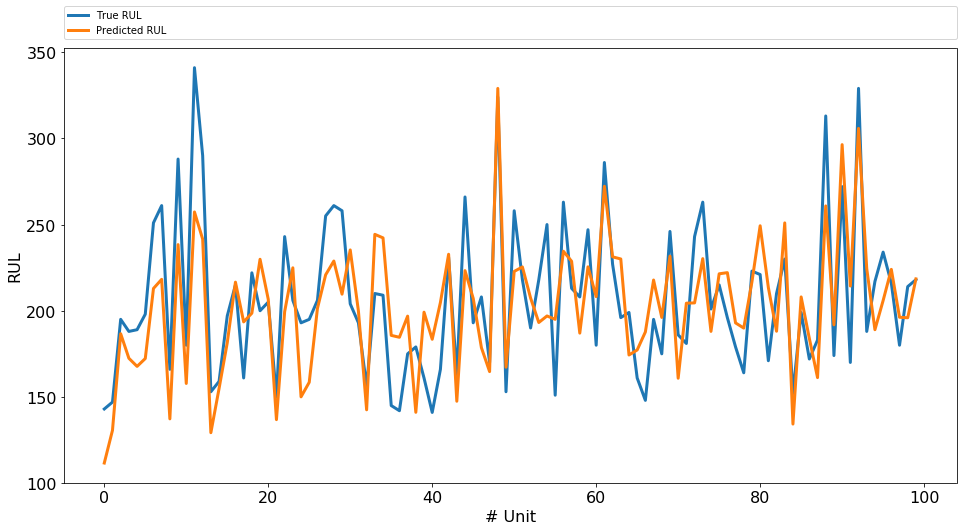

In [353]:
plt.figure(figsize = (16, 8))
plt.plot(testFD001_RUL,linewidth=3)
plt.plot(xpredictedRUL,linewidth=3)
plt.xlabel('# Unit', fontsize=16)
plt.xticks(fontsize=16)
plt.ylabel('RUL', fontsize=16)
plt.yticks(fontsize=16)
plt.legend(['True RUL','Predicted RUL'], bbox_to_anchor=(0., 1.02, 1., .102), loc=3, mode="expand", borderaxespad=0)
plt.show()

In [354]:
mse = mean_squared_error(testFD001_RUL, xpredictedRUL)
print (mse)
print ('Root Mean Squared Error (RMSE): '+ str(np.sqrt(mse)))

840.8593273708859
Root Mean Squared Error (RMSE): 28.997574508411663


In [368]:
X_tr, X_val, Y_tr, Y_val = train_test_split(X_train1, trainFD001_RUL, test_size = 0.33, random_state = 2019)
X_tr.shape, X_val.shape, Y_tr.shape, Y_val.shape

((67, 18), (33, 18), (67,), (33,))

In [381]:
model = cat.CatBoostRegressor(iterations=20000,
                                 learning_rate=0.1,
                                 depth=3,
                                 eval_metric='RMSE',
                                 colsample_bylevel=0.3,
                                 random_seed = 2019,
                                 bagging_temperature = 0.5,
                                 metric_period = None,
                                 early_stopping_rounds=100
                                )
model.fit(X_tr, Y_tr, eval_set = (X_val, Y_val), verbose = 50)

0:	learn: 46.0532137	test: 40.7869932	best: 40.7869932 (0)	total: 7.58ms	remaining: 2m 31s
50:	learn: 17.6013515	test: 20.8406770	best: 20.8406770 (50)	total: 402ms	remaining: 2m 37s
100:	learn: 9.2653948	test: 15.0587188	best: 15.0587188 (100)	total: 778ms	remaining: 2m 33s
150:	learn: 6.8165496	test: 14.2985826	best: 14.2932041 (147)	total: 1.17s	remaining: 2m 33s
200:	learn: 6.1265651	test: 14.2233381	best: 14.1688481 (183)	total: 1.57s	remaining: 2m 34s
250:	learn: 5.6618892	test: 14.1016164	best: 14.1016164 (250)	total: 1.98s	remaining: 2m 36s
300:	learn: 5.3449076	test: 14.0341666	best: 14.0341666 (300)	total: 2.41s	remaining: 2m 37s
350:	learn: 5.0594884	test: 13.8684134	best: 13.8684134 (350)	total: 2.79s	remaining: 2m 36s
400:	learn: 4.6228505	test: 13.6407935	best: 13.6247914 (379)	total: 3.22s	remaining: 2m 37s
450:	learn: 4.3323236	test: 13.6813673	best: 13.6247914 (379)	total: 3.65s	remaining: 2m 38s
500:	learn: 3.9795700	test: 13.5615265	best: 13.5253984 (490)	total: 4.03

In [382]:
xpredictedRUL = model.predict(X_test1)
xpredictedRUL.shape

(100,)

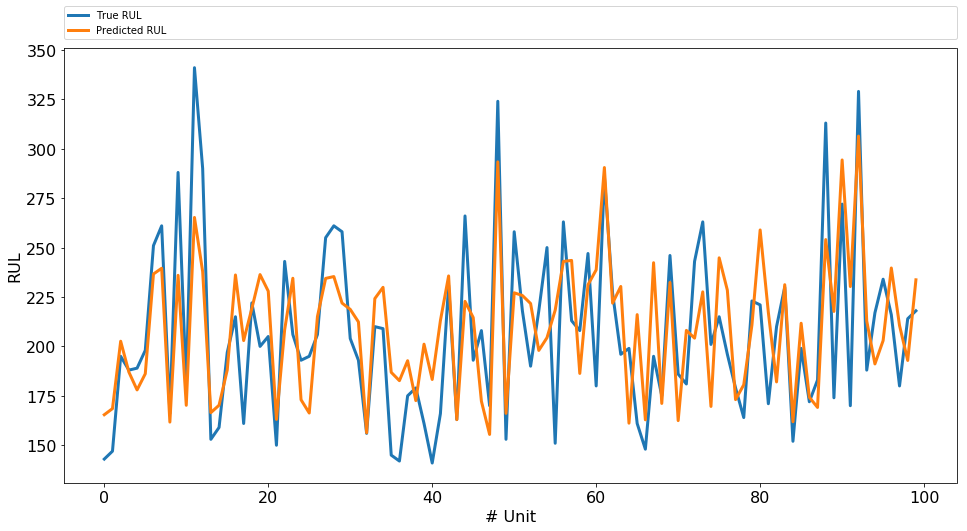

In [383]:
plt.figure(figsize = (16, 8))
plt.plot(testFD001_RUL,linewidth=3)
plt.plot(xpredictedRUL,linewidth=3)
plt.xlabel('# Unit', fontsize=16)
plt.xticks(fontsize=16)
plt.ylabel('RUL', fontsize=16)
plt.yticks(fontsize=16)
plt.legend(['True RUL','Predicted RUL'], bbox_to_anchor=(0., 1.02, 1., .102), loc=3, mode="expand", borderaxespad=0)
plt.show()

In [384]:
mse = mean_squared_error(testFD001_RUL, xpredictedRUL)
print (mse)
print ('Root Mean Squared Error (RMSE): '+ str(np.sqrt(mse)))

887.1468379009572
Root Mean Squared Error (RMSE): 29.785010288750232
